# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
configs fourth [<cadCAD.configuration.Configuration object at 0x000001546D4F3430>, <cadCAD.configuration.Configuration object 

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

 Class Price = 
  A value =  0.5 Asset  i  Class Price =  0.09506167723421532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09506167723421532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09506167723421532
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1.5POOL Class  10.000000000000002 0.0980283836424261
POOL Class   A value =   Q over Wq =  1.0
829.0
 1.51920.0
Asset  Asset  j  Class Price = i  Class Price =  0.09655563798100136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09655563798100136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09655563798100136
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1190.0  POOL Class POOL Class  k
i   A value =  1 Asset  i  Class Price =  0.09504719933596541
POOL Class   A value =  1 Asset   A value =  1 Asset  i  Class Price =  0.09049690248454864
POOL Class   A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  0.09318981651263317
POOL Class

 Class Price = 
 A value = POOL Class   addliq - Sq delta Sq0.0883997264180018
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  4914.798311747159
addliq - Sq delta S 4914.798311747158
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4677.561102545233
POOL ADD LIQUIDITY Timestep ===  10 delta W  4677.561102545233
POOL Class  A value =  1.5 Asset  i  Class Price =  0.09434599986220771
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09434599986220771
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09434599986220771
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2957.01528.0j i POOL Class 
 0.5
  A value =  1 Asset  i  Class Price =  0.08615331981677778
POOL Class   A value =  1 Asset  j  Class Price =  0.08615331981677778
POOL Class   A value =  1 Asset  k  Class Price =  0.08615331981677778
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.09049690248454864
POOL Class   A value = 

POOL Class POOL Class 1   A value =  1.5 Asset  i  Class Price =  0.08832612381279814 2177.0 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2399.0
1.0j
  0.5
 A value =  1.5 POOL Class   A value =  1.5 Asset  j  Class Price =  0.08832612381279814
POOL Class   A value =  1.5 Asset  k   POOL Class POOL Class  Class Price =  R over W= Asset   A value =  0.5 Asset  i  Class Price =  0.09521175177951818
POOL Class   A value =  0.5
  A value =  1 Asset  i  Class Price =  0.08569876027072797
POOL Class   A value =  1 Asset  j  Class Price =  0.08569876027072797
POOL Class   A value =  1 Asset  k  Class Price =  0.08569876027072797
POOL Class   0.09352195181583242
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09352195181583242
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.08832612381279814
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1930.0 Asset  A value =  2324.01276.0
Asset   10.0000000000

  R over W= POOL Class  Asset  j1.0
2001.0  Class Price =  0.08319554577156586
POOL Class   A value =  10.000000000000002 Q over Wq =  1.0
978.0
  POOL Class POOL Class  
  Class Price =  Q over Wq =  A value =  1 Asset  i  Class Price =  0.08352957415543244
POOL Class   A value = 0.08432927964605523
POOL Class   A value =  1 Asset   1.0
1460.0 A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.08570998306007264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08570998306007264
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08570998306007264
POOL Class   A value =  1.5   Asset  j  Class Price =  0.0817691549525224
POOL Class   A value = k 1 Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.08869627023621703
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08869627023621703
POOL Class  1 Asset  j  Class Price =  0.08352957415543244
POOL Class  
  A value =  1 Asset  k  Class Price =  0.08352957415543244
POOL Class   A value =  1  R over W=  10.00000

873.0 
POOL Class   A value =  1 Asset  i  Class Price =  0.07538194672689143
POOL Class   A value =  1 Asset  j  Class Price =  0.07538194672689143
POOL Class   A value =  1 Asset  k POOL Class 0.5 jPOOL Class    A value =  A value =   A value =   A value =  0.5 Asset  i  Class Price =  0.07981678767462438
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07981678767462438
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07981678767462438
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
733.0 R over W=   Class Price =  Class Price =     10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.07788802674018105
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07788802674018105
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07788802674018105
POOL Class   A value =  1.5  R over W=  10.000000000000002
 332.01.5 1 POOL Class  0.0857551312978660510.07538194672689143
 Q over Wq =   A value =  0.5 Asset  Asset  j  Class

POOL Class   A value =  0.5  A value =  POOL Class POOL Class  iAsset  Asset 1.5  A value =  0.5 Asset  i  Class Price =  0.08114627523181414
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08114627523181414
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08114627523181414
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.0765887049170954
POOL Class   A value =  0.5 Asset  j  Class Price = 1 Asset  Asset  i 0.0765887049170954
POOL Class   A value =  0.5 Asset   i  Class Price =  0.07409114531429246
POOL Class   A value =  1 Asset  j  Class Price =  0.07409114531429246
POOL Class   A value =  1 Asset  k  Class Price =  0.07409114531429246
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.0765887049170954
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2679.0i 1538.0  i  Class Price =  0.08062993214134305
POOL Class   A value =  0.5 Asset  j  Class Price =  

  A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.07948505632389266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07948505632389266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07948505632389266
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1461.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07948505632389266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07948505632389266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07948505632389266
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 2362.01.5
 A value = POOL Class   0.5 Asset  i  Class Price =  0.07538632414172575
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07538632414172575
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07538632414172575
POOL Class   A value =  0.5  R over W=    A value =  0.5 Asset  i  Class Price =  0.07948505632389266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.079

1515.0Asset  

 Q over Wq =  1.0
1118.0Asset POOL Class j
kPOOL Class    A value =  1POOL Class   A value =  1.5 Asset  i  Class Price =  0.07827076839654654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07827076839654654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07827076839654654
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
      A value =  1 Asset  i  Class Price =  0.0740527909895882
POOL Class   A value =  1 Asset  j  Class Price =  0.0740527909895882
POOL Class   A value =  1 Asset  k  Class Price =  0.0740527909895882
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
246.0POOL Class 
 A value =  Class Price =  Class Price = iAsset 1821.0
 0.06677847385659291
POOL Class   A value =  1 POOL Class  POOL Class  Class Price =   i  Class Price =  0.06994193554682122  0.07363662776032712
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07363662776032712
POOL Class   A value =  0.5 Asset  k  Class Price = 

1140.0 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1461.0POOL Class  
799.0POOL Class -323.0Asset  k  Class Price =  0.07776235664085715
POOL Class   A value =   A value = 
POOL Class 1.5  A value =  
 
POOL Class  POOL Class 1 0.5 R over W=    A value =  1.5 Asset  i   Asset  i  Class Price =  0.07041110908750695
POOL Class   A value =  0.5 Asset   Class Price =  0.07305305932369968
POOL Class   A value =  1.5 Asset  j  10.000000000000002 A value =  Class Price =  0.07305305932369968
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07305305932369968
POOL Class   A value =    Q over Wq =  1.0
1755.0 A value = 1.5  A value = 
  R over W=  10.000000000000002 Q over Wq =  1.0
jPOOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07715053598093398
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.07776235664085715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07776235664085715
POOL Class   A value =  1.5 Asset  k

POOL Class   A value =  0.5 Asset  Class Price =   i  Class Price =  0.06447352636558414
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  0.5 k A value = 649.0 A value =  1.5 Asset  i  Class Price =  0.07047534372807593
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07047534372807593
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07047534372807593
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  
0.069060789120935661653.0k  Class Price =  0.07715053598093398
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2643.0
 

POOL Class 0.5 Class Price =   A value =  1 Asset  i  Class Price =  0.06411495630254775
POOL Class   A value =  1 Asset  j  Class Price =  0.06411495630254775
POOL Class   A value =  1 Asset  k  Class Price =  0.06411495630254775 Asset 
POOL Class  i  Class Price =    A value =  1 Asset  j  Class Price =  0.06906078912093566
POOL Class   A value =  1 Asset  k  Class Pric

POOL Class 2502.0  A value =    A value =  1.5 Asset  i  Class Price =  0.07135251287380316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07135251287380316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07135251287380316
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1183.00.5
1285.0 A value = Q over Wq = 
  0.5 Asset  i  Class Price =  0.07102362214262595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07102362214262595
POOL Class   A value =  0.5 Asset   1.0
2535.0k
1 Asset  i  Class Price =  0.06591346743838389
POOL Class   A value =  1 Asset  j  Class Price =  0.06591346743838389
POOL Class   A value =  1 Asset  k  Class Price =  0.06591346743838389
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1140.0
POOL Class  
POOL Class    A value =  1.5 Asset  i  Class Price =  0.07135251287380316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07135251287380316
 Class Price = Asset POOL Class  POOL Class 

POOL Class  A value =  1.5 Asset  i  Class Price =  0.06659415151189067
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06659415151189067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06659415151189067
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1370.0Asset  i  Class Price =  0.06258279477018262
POOL Class   A value =  1 Asset  j  Class Price =  0.06258279477018262
POOL Class   A value =  1 Asset  k  Class Price =  0.06258279477018262
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0656105087284855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0656105087284855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0656105087284855
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  R over W= 597.0
 1057.0POOL Class  POOL Class  A value = 

 
  A value =    A value =  0.5 Asset  i  Class Price =  0.06435298858511043
POOL Class

 POOL Class POOL Class 1389.0 
 0.5 POOL Class  Asset  i  Class Price =  0.06345827887149745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06345827887149745
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06302709127078684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06302709127078684
POOL Class   A value =  0.5 1321.0  A value =  0.5 Asset  k  Class Price =  0.06345827887149745
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 0.06181901101062158

POOL Class   A value =  1 Asset  k  Class Price =  0.06181901101062158
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.06302709127078684
POOL Class   A value =  0.5  R over W=  10.000000000000002POOL Class  A value = 179.0
  1.5 Asset  i A value =  1 Asset  i  Class Price =  0.059859902016122325
POOL Class   A value =  1 Asset POOL Class     A value =  1 Asset Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.06172306425985196
PO

  A value = Asset  A value = POOL Class Asset  POOL Class 1.0 Class Price =  0.05663841310128076
POOL Class   A value =  1 Asset  k  Class Price =  0.05663841310128076
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1503.0 i  Class Price = 0.5 Asset  
POOL Class  
  A value =      A value =  1 Asset  i  Class Price =  0.05663841310128076
POOL Class   A value =  1 Asset  j  Class Price =  0.059880531977268815
k  Class Price =  A value =  0.5 Asset  i1.5 j0.05663841310128076POOL Class  608.0  Class Price =  
 0.06326386822842375 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06464809078761163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06464809078761163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06464809078761163
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

Asset   Class Price =  A value = POOL Class 1632.0 i  0.05978203237282487
POOL Class POOL Class 
POOL Class  Class Price = 1 0.06183398951294128

  0.06602874373124193 A value = Asset POOL Class   1.51565.0
  A value =  0.5 Asset  i  Class Price =  0.06326386822842375
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06326386822842375
POOL Class  A value = POOL Class 1j   
  A value =  1 Asset  i  Class Price =  0.05854943266342402
POOL Class   A value =  1 Asset  j  Class Price =  0.05854943266342402
POOL Class   A value =  1 Asset  k  Class Price =  0.05854943266342402
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W= 1 A value =  904.0 0.5 Asset  k  Class Price =  0.06326386822842375
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
953.0
POOL Class 
Asset  Class Price =  0.05835356383839245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05835356383839245
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  i843.0  Asset    Class Price =  0.05417512421133573
POOL Class   A value =  1 Asset  j  Class Price = 10.000000000000002 Q

 A value =   
i  Class Price =  POOL Class  A value = 1190.0 1.5  POOL Class  
 A value =  j0.05778699879755674 1 Asset  i  Class Price =  0.0582450508682771
POOL Class   A value =  1 Asset  j  Class Price =  0.0582450508682771
POOL Class   A value =  1 Asset  k  Class Price =  0.0582450508682771
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1540.00.5Asset  POOL Class  Class Price =   

    A value =  1 Asset  i  Class Price =  0.05357319910529588
POOL Class   A value =  1  A value = POOL Class   A value =  0.5 Asset  j  Class Price =  0.05778699879755674
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05778699879755674
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1640.0  A value = i
Asset  1 Asset  i  Class Price =  0.05829162626422199
POOL Class   A value =  1 Asset  j  Class Price =  0.05829162626422199
POOL Class  Asset  POOL Class  A value =  0.059118952924952091.5 i 
 POOL Class  A value =   Class Price 

POOL Class   A value =  0.5  R over W=  POOL Class    R over W=  Class Price =  0.06086902175386375
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
375.0
110.000000000000002POOL Class    R over W=  10.000000000000002 Q over Wq =  1.0
669.0  A value =  1 Asset  i  Class Price =  0.05722389291700124
POOL Class   A value =  1 Asset  j  Class Price =  0.05722389291700124
POOL Class   A value =  1 Asset  
 k  Class Price =  0.05722389291700124
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1100.0
POOL Class 10.000000000000002  A value =  1.5 Asset  i  Class Price =  0.060668659269670716
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060668659269670716
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060668659269670716
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Q over Wq =  1.0
1285.0POOL Class 1599.0
  A value =  1 Asset  i  Class Price =  0.05722389291700124
POOL Class   A value =  1 Asse

 R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06372034508188532
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class POOL Class  1000.0 A value = 
POOL Class  POOL Class 154695   90 delta W  3627.178708838835 delta S  4913
POOL REMOVE LIQUIDITY share fraction of pool = 0.19646159627745213
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32449054921853154
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32449054921853154
POOL Class   A value =   
0.50.06372034508188532
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06372034508188532
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1409.0 A value =   A value =   A value =  
Asset  i  Class Price =  0.05830552616884327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05830552616884327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05830552616884327
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q o

  A value =   A value =  A value = POOL Class   1 Asset  i  Class Price =  0.05299466869351328
POOL Class   A value =  1 Asset  j  Class Price =  0.05299466869351328
POOL Class   A value =  1 Asset  k  Class Price =  0.05299466869351328
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.059967049194912116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059967049194912116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059967049194912116
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1871.0 0.5POOL Class  
  A value = Asset  i  Class Price =  0.05668564991712759
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05668564991712759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05668564991712759
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class POOL Class    1004.0  A value =  A value =  1 Asset POOL Class  0.5 Asset  i  Class Pri

 Class Price =   i  Class Price = POOL Class 0.09802594507745970.05145328970760243
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05145328970760243
POOL Class   A value =  0.0522526653360826
POOL Class   A value =  1 Asset  k 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1699.0  Class Price =  0.0522526653360826
POOL Class   A value =  0.5 Asset  i  Class Price =  0.054227553433231684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054227553433231684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054227553433231684
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
0.09802594507745970.5 k A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.05386476388613763
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0


 0.05009926390917413-22.0 R over W=  10.000000000000002 Q over Wq =  
POOL Class 
 POOL Class   A value =  1 Asset  j  Class Price =  

POOL Class   A value =  1.5 Asset  k  Class Price =  0.09527086121733752
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1583.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09372598418028726
POOL Class   A value =  1 Asset  j  Class Price =  0.09372598418028726
POOL Class   A value =  1 Asset  k  Class Price =  0.09372598418028726
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k3564.0  Class Price =  0.09561890329465451
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1352.0
k
  Class Price =  0.09430349278838024
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2167.0  Class Price =  0.09591142284588501

POOL Class   A value =  1 Asset  i  Class Price =  0.09372598418028726
POOL Class   A value =  1 Asset  j  Class Price =  0.09372598418028726
POOL Class   A value =  1 Asset  k  Class Price =  0.09372598418028726
POOL Class   A value =  1  R over W=  10.000000000000002 Q ove

380.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.093103438158139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.093103438158139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.093103438158139
POOL Class   A value =  0.5 POOL Class   A value =  1 Asset  i  Class Price =  0.09417823105107133
POOL Class   A value =  1 Asset  j  Class Price =  0.09417823105107133
POOL Class   A value =  1 Asset  k  Class Price =  0.09417823105107133

Asset  j  Class Price =  0.09003864872361932
POOL Class   A value =  1 Asset  k  Class Price =  0.09003864872361932
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1824.0Asset 0.51 R over W= Asset POOL Class  Asset  k  Class Price =  0.09153289453333703
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1386.0 i  Class Price =  0.08950675313812571
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08950675313812571

    
POOL Class POOL Class Asset POOL Class   A value =   A value

POOL Class   A value =  1 Asset  i  Class Price =  0.09153289453333703
POOL Class   A value =  1 Asset  j  Class Price =  0.09153289453333703
POOL Class   A value =  1 Asset  k  Class Price =  0.09153289453333703
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95484  110000  161002  170000  150000    0   113375  130000  180000   
2  2    50000  160000   48442  261557  154783    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

 

 POOL Class  Class Price =  828.0POOL Class   A value = POOL Class 0.08976115463789502  0.5 Asset  j  Class Price = 
POOL Class   A value =  1 Asset  k  Class Price =  0.08976115463789502
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2078.0
 A value =  
 1 POOL Class  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3355.0 A value =   A value = 
 0.08894540163399382 1.5 Asset  i  Class Price =  0.09137389863782872
POOL Class   A value =  1.5 Asset   A value = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08894540163399382
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset j   i  Class Price =  0.08769535838986157
POOL Class   A value =  1 Asset  j  Class Price =  0.08769535838986157
POOL Class   A value =  1 Asset  kPOOL Class   
 11880.0 Class Price =  0.09137389863782872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09137389863782872
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q

  A value = 
POOL Class 1518.0  A value =  1  0.5 Asset  k  Class Price =  
POOL Class POOL Class   Asset 0.08104790748130743  A value =  1.5 Asset  i  Class Price =  0.08883986552874051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08883986552874051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08883986552874051
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.0866956980765468
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2766.0 A value = -126.0

i
POOL Class    Class Price = POOL Class  A value =  POOL Class    A value =  1.51.5 Asset  i  Class Price =  0.08273659869946241
POOL Class   A value =  1.5 Asset  j 1 Asset  i  Class Price =  0.0866956980765468
POOL Class  0.08387334309000107
POOL Class   A value =  1 Asset  j  Class Price =  0.08387334309000107
POOL Class   A value =  1   A value =  1 Asset  j  Class Price =  0.0866956980765468
POOL Class   A value =   Asset  k  Class Price =  A v

975.0   POOL Class   R over W=  10.000000000000002 A value = Asset 
 0.08329311781688706 0.07924010854444283 1 Asset  k  Class Price =  0.08670234121183487
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
2828.0
 A value = 
1205.0

  1POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.07924010854444283
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07924010854444283
POOL Class   A value =  1.5  R over W=  10.000000000000002POOL Class  A value =  0.5 Asset  i  Class Price =  0.07626503203263471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07626503203263471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07626503203263471
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Q over Wq =  1.0
1835.0 POOL Class 
 A value =  506.01.5kPOOL Class  
   Asset POOL Class Asset     A value = 1  Class Price =  A value =   iPOOL Class   0.5Asset  i A value =   A value =  0.5 Asset  Class Price 

3261.01798.0POOL Class  
 POOL Class 1 Class Price = 
POOL Class   A value = POOL Class        A value =  1.5 Asset  i  Class Price =  0.07728674470641668
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07728674470641668
POOL Class   A value =  1.5 Asset  A value = 0.08415766981375551
POOL Class   A value =  1 Asset  j  Class Price =  0.08415766981375551
POOL Class   A value =  1 Asset  k  Class Price =  0.08415766981375551
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08023456831482541
POOL Class   A value =  1 Asset  j  Class Price =  0.08023456831482541
POOL Class   A value =  1 Asset  k  Class Price =  0.08023456831482541
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   A value = 2935.0 0.5 Asset  i  Class Price =  0.07626503203263471
POOL Class   A value =  k
 A value = 1.5i 3212.0  Class Price =  0.07728674470641668
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq

 Class Price =  POOL Class  0.08106088739886301
POOL Class   A value =  1.5 Asset  j  Class Price = 1.0  A value =  1 Asset  i  Class Price =  0.08358811745713716
POOL Class   A value =  1 Asset  j  Class Price =  0.08358811745713716
POOL Class   A value =  1 Asset  k  Class Price =  0.08358811745713716
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1741.0
1  1.5 Asset 0.08106088739886301
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class  i1995.0
   A value =  1 Asset  i  Class Price =  0.07670314278776727
POOL Class   A value =  1 Asset  j  Class Price =  0.07670314278776727
POOL Class   A value =  1 Asset  k  Class Price =  R over W= 
jAsset  10.000000000000002 Q over Wq =  POOL Class POOL Class  1.0    Class Price =  0.07665606014728611
POOL Class   A value =  k
 A value =  Class Price =    A value =   Class Price =  0.080038139013688
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1711.0 1817.0
1 Asset  i  Class Pr

 A value = Asset   0.5 j1.0   Class Price = POOL Class    A value =  1.5 Asset  j  Class Price =  0.07334860609035884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07334860609035884
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1456.00.5 i  Class Price =  0.07862606648280274
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07862606648280274
POOL Class    Asset  i 
 Class Price =  0.07658550548947804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07658550548947804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07658550548947804
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
0.0749062537392707
POOL Class   A value =  10.07588014551535309 R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.07862606648280274
POOL Class   A value =   487.01.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = Asset  j  Class Price =  0.0749062537392707
POOL Class   A v

POOL Class    A value =  POOL Class POOL Class   A value =  1 Asset  i A value =  1 Asset  i  Class Price =  0.07221350206678653
POOL Class   A value =  1 Asset  j  Class Price =  0.07221350206678653
POOL Class   A value =  1 Asset  k  Class Price =  0.07221350206678653
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
726.0
  Asset    A value = POOL Class  1.5 Asset  i  Class Price =  0.07228074806462904
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07228074806462904
POOL Class   Class Price =   A value =  A value = 0.5  A value =  1 Asset  i  Class Price =  0.07178572428071624
POOL Class   A value =  1 Asset  j  Class Price =  0.07178572428071624
POOL Class   A value =  1 Asset  k  Class Price =  0.07178572428071624
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
664.0 0.5 Asset  i  Class Price =  0.0740715546551982
POOL Class  k  

  Class Price =  0.07704500482083625
POOL Class   A value =  1.5  R over W=  10.00000000000000

1339.0 POOL Class 1 Asset  i POOL Class 0.07234443570675556  0.07523773290582798 Class Price = 2463.0
POOL Class   A value =  R over W=  10.000000000000002 
 A value =  1 Asset  j  Class Price =  0.06960411051522528 A value =  1.5 Asset  i  Class Price =  0.07611451560628324
POOL Class   A value =  Q over Wq =  1.0

POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 1.5 Asset  j  Class Price =  0.07611451560628324
POOL Class  
 A value =  0.07603957359812874
POOL Class   A value =   POOL Class 1.5 
1577.0   0.06960411051522528POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.068128216929782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.068128216929782
POOL Class   A value =  1.5 Asset  k  Class Price =  0.068128216929782
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Asset  k  Class Price =  0.07611451560628324
POOL Class   A value =  
0.51137.0
  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value

POOL Class 
 Class Price =  0.072221716964361
POOL Class   A value =  1.5  R over W=  10.000000000000002 POOL Class  Asset  j  Class Price =  0.0670429387475619
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0670429387475619
POOL Class   A value =  0.5  R over W=  10.000000000000002   A value =  1 Asset  j  Class Price =  0.07384535710952668
POOL Class   A value =  1 Asset  k  Class Price =  0.07384535710952668
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1344.0Q over Wq =  1.0
1745.0

POOL Class POOL Class Q over Wq = POOL Class  POOL Class POOL Class   1.0   A value =  0.5 Asset  i  Class Price =  0.07095647426615229
POOL Class 
  A value =  1.5 Asset    A value =  1 Asset  i  Class Price =  0.07384535710952668
POOL Class   A value =  1 Asset  j  Class Price =  0.07384535710952668
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.07062890609863465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07062890609863465
POOL Clas

POOL Class   A value =  1.5 Asset  1720.01i   j  Class Price =  0.0657890686642117
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0657890686642117
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k 
0.06828749019692357 A value = j2177.0  Class Price =  0.06616507718106861
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1585.0 
Asset 

 Class Price =  0.06954526784031789
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06954526784031789
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1822.0  Class Price =  0.06759258512477584
POOL Class   A value =  1 Asset  j  Class Price =  0.06759258512477584
POOL Class   A value =  1 Asset  k  Class Price =  0.06759258512477584
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 
138.0 POOL Class   A value =   1.5 Asset  k  Class Price =  0.06923097225140502
POOL Class   A value =  1.5  R over W=  10.0000000000

POOL Class  R over W=  POOL Class 460.0 Class Price = i  0.06543469140764949 Asset 10.000000000000002
 A value =  
  0.06767894968625814
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06767894968625814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06767894968625814
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1798.0
 A value =  1 Asset  i  Class Price =  0.07006456232947493
POOL Class   A value =  1 Asset  j  Class Price =   Q over Wq =  1.0
j  Class Price =  0.0650393992543397
POOL Class   A value =  1 Asset  k  Class Price =  0.0650393992543397
POOL Class   A value =  1  R over W= POOL Class  Class Price = POOL Class   1388.0POOL Class 
10.000000000000002  0.06564597211080438
POOL Class   A value =   Q over Wq =  1.0
0.07006456232947493
POOL Class   A value =   A value =  0.5 Asset 644.0
POOL Class   A value =    A value =  1 Asset  j  Class Price =  0.06450682746737095
POOL Class   A value =  1 Asset  k  Class Price =  0.06450682746737

10.000000000000002  POOL Class Asset Asset  A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.059569369922037665
POOL Class   A value =  1 Asset  j  Class Price =  0.059569369922037665
  Class Price =  0.06722940856227448
POOL Class   A value =  1 Asset  k  Class Price =  0.06722940856227448
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.062038375781005
POOL Class   A value =  1 Asset  k  Class Price =  0.062038375781005
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
275.0   -285.0
POOL Class POOL Class POOL Class 
Q over Wq = i1.5  A value =  1 Asset  i  Class Price =  0.061893812224374796
POOL Class   A value =  1 Asset  j  Class Price =  0.061893812224374796
  Class Price =  0.0646463213532038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0646463213532038
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0646463213532038
POOL Class   A value =  0.5  R over W=  

POOL Class  A value =    2078.0 638.0  0.0614167495487061841 A value = 
0.5 Asset  i  Class Price =  0.0646463213532038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0646463213532038
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0646463213532038
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
784.0 

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06349614343330792
POOL Class   A value =  1.5 Asset  958.0 1.5 Asset  j  Class Price =  0.06349614343330792
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06349614343330792
POOL Class   A value =  1.5i  Class Price =  0.06714755160027654
POOL Class   A value =   R over W=  10.000000000000002 Q over Wq =  1.0
2262.01.5 
 
1  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0646463213532038
POOL Class   A value =  0.5 Asset  j  Class Price

1208.01POOL Class  j  Class Price =  0.05852899709380963
POOL Class   A value =  1 Asset  k  Class Price =  0.05852899709380963
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.059703838804585914 1120.0 1330.0
Asset POOL Class  A value = 

POOL Class   
 i  Class Price = POOL Class  A value =   A value =  1.5 Asset  i  A value =  1 Asset  i  Class Price =  0.05782573077436763
POOL Class   A value =  1 Asset  j  Class Price =  0.05782573077436763
 2724.0 POOL Class 
POOL Class  Class Price = 0.0605227536520126161POOL Class    A value =  1.5 Asset  i  Class Price =  0.05912056580906039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05912056580906039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05912056580906039
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1891.0 0.5

POOL Class   A value =  1 Asset  j  Class Price =  0.060522753652012616
POOL Class   A value =  1 Asset  k  Class Price =  0.060522753652012616
POOL

POOL Class  Class Price =  k   10.000000000000002 delta W  3397.4315281304357 delta S  4783
POOL REMOVE LIQUIDITY share fraction of pool = 0.19275987102111372
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30387675795106744
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30387675795106744
POOL Class  1  A value =  1 Asset  i  Class Price =  0.05721893658198179
POOL Class   A value =  1 Asset  j  Class Price =  0.05721893658198179
POOL Class   A value =  1 Asset  k  Class Price =  0.05721893658198179
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class   A value =  A value = 
154783
 Class Price =  0.05867381489302672
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.05731802478523723
POOL Class   A value =  1 Asset    k  Class Price =  0.05731802478523723
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154619
POOL Class  Q over Wq =  A value = 962.0   A value =  1 Ass

1.5POOL Class   
Asset  Asset  R over W= POOL Class delta W  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.055519698300232866
POOL Class   A value =  1 Asset  j  Class Price =  0.055519698300232866
POOL Class   A value =  1 Asset  k  Class Price =  0.055519698300232866
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1355.01243.0 POOL Class i   
 A value = 
  A value =  0.5 Asset  i  Class Price =  0.05480397722480516
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05480397722480516
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05480397722480516
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.05834418537510127
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05834418537510127
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05834418537510127
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
517.0 A value = i3512.2188835441843 POOL Class  delt

1574.0POOL Class   Class Price =  0.05379385540440011
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05379385540440011
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05379385540440011
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
197.0
 
764.0


 A value =  1 Asset  i  Class Price =  0.05891114863632798
POOL Class   A value =  1 Asset  j  Class Price =  0.05891114863632798
POOL Class   A value =  1 Asset  k  Class Price =  0.05891114863632798
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1974.0POOL Class 748.0 POOL Class 
POOL Class  Class Price =  0.05363387504907348
POOL Class   A value =  1 Asset  j  Class Price =  0.05363387504907348
POOL Class   A value =  1 Asset  k  Class Price =  0.05363387504907348
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

  POOL Class  A value = POOL Class    A value =  A value =  A value =  1.5 Asset  i  Class Price =  0.05305405934415531

Q over Wq =  A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1636.0  A value =  1.5 Asset  0.054705835510705174
POOL Class POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0POOL Class 
  A value = POOL Class  1810.0 A value =  i
 A value =  0.5 Asset  k  Class Price =  0.054705835510705174
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  2786.0 585.0  
 Class Price =  0.04724382789988231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04724382789988231
POOL Cla

POOL Class  i1.5 5034.445382414666 A value =  0.5 Asset  k  Class Price =  0.09285680493237881
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1245.0 
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4901.419182121304
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
POOL Class   A value =  1.5 Asset   Class Price = 1 Asset  i  Class Price =  0.08973015400530766
POOL Class  
Asset  j  Class Price =  0.09623725513567057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09623725513567057
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2762.0  i A value = 0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
Asset  j  Class Price =  0.08783736382899206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08783736382899206
POOL Class   A

ii  POOL Class   i10.0000000000000020.5 1.5   Asset    Class Price =  Class Price = Q over Wq = Asset  Asset  A value =    Class Price =  i  0.09536610366636150.08783736382899207  
0.092856804932378831.0i i1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.08904759147912761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08904759147912761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08904759147912761
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1264.0POOL Class   Class Price = 


3079.0 Class Price =  1541.0POOL Class POOL Class 
 0.08842454578553109
 
 
POOL Class   A value =  1 Asset  j  Class Price =  0.08842454578553109
POOL Class   A value =  1 Asset  k  Class Price =  0.08842454578553109
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2913.00.09682795730135119 A value =    A value =  A value = POOL Class   A value =  0.5 Asset 
  POOL Class 1.5POOL Class 0.5 Asset  j   
1  Asset POOL Cla

2091.0POOL Class  A value =   A value =  0.5 Asset  j  Class Price =  0.09116292803850932
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09116292803850932
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  
  1283.0 A value =  1.5 Asset  i  Class Price =  0.09335602846150609
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09335602846150609
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09335602846150609
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 3666.01.5
 R over W= 18.0POOL Class 
j 
  A value =  1 Asset  i  Class Price =  0.08455763289399747
POOL Class   A value =  1 Asset  j  Class Price =  0.08455763289399747
POOL Class   A value =  1 Asset  k  Class Price =  0.08455763289399747
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  10.000000000000002  Class Price =  0.08726771722526877
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08726771722526877
POO

7  160000  0.5 Class Price =  0.08969999983860608
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1024.00.5 POOL Class  
Asset  -107.0
  A value =  1.5 Asset  i  Class Price =  0.09079236649118681
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09079236649118681
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09079236649118681i  Class Price =  0.08227596725738258
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08227596725738258
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08227596725738258
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.08512785029824183
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08512785029824183
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08512785029824183
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2638.0
 Asset 1075.0POOL Class 

POOL Class POOL Class 1.5
 POOL Class  POOL Class  i POOL Class  A value =  

84.0i POOL Class  Asset   0.5  A value =  1.5 Asset  i  Class Price =  0.07985734521932586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07985734521932586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07985734521932586
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
781.0 A value = 
 Class Price =    0.5
 0.07807475177543413
POOL Class   A value =  1 Asset  j  Class Price =  0.07807475177543413
POOL Class   A value =  1 Asset  i  Asset  iPOOL Class k R over W=   Class Price =   A value =  1.5 Asset  i  Class Price =  0.07985734521932586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07985734521932586
POOL Class   A value =  10.000000000000002 Q over Wq =  1.0
2494.0POOL Class 
   A value = 1.5   A value =  1.5 Asset  i  Class Price =  0.08415827775573882
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08415827775573882
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08415827775573882
POOL Class   A value =  1.5  R over

1287.0  A value =  1 Asset  k  Class Price =  0.0783501860086204
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

  Asset  A value = 1.5 Asset  j  Class Price =  0.07887505742374444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07887505742374444
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1683.0 POOL Class  0.081484474784909491522.01.5POOL Class 

 
1.5i   A value =  1 Asset  i  Class Price =  0.07683471096974727
POOL Class   A value =  1 Asset  j  Class Price =  0.07683471096974727
POOL Class   A value =  1 Asset  k  Class Price =  0.07683471096974727POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  Asset 
  Class Price =  548.0Asset  POOL Class POOL Class POOL Class 0.08432182089955712 0.5  A value =  1.5 Asset  i  Class Price =  0.07785737615220595
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08651091082748555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08651

POOL Class   A value =  0.5 Asset   POOL Class   A value =  1 Asset   A value = 0.07704521213954711 POOL Class  
ji  A value =  1 Asset  i  Class Price =  0.07558054222217961
POOL Class   A value =  1 Asset  j  Class Price =  0.07558054222217961
POOL Class   A value =  1 Asset  k  Class Price =  0.07558054222217961
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1244.0  0.50.07785737615220595POOL Class 
  A value =  1.5 Asset  j  Class Price =  0.07704521213954711
POOL Class   A value =  1.5  Class Price =  Asset  i  Class Price =  0.07809502970071659
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07809502970071659
POOL Class   A value =  0.5 Asset  k  Class Price = Asset  POOL Class  0.07315064787410121
 Class Price =    A value =  1 Asset  i  Class Price =  0.07483267910016253
POOL Class   A value =  1 Asset  j  Class Price =  0.07483267910016253
POOL Class   A value =  1 Asset  k  Class Price =  0.07483267910016253
POOL Class   A value =  1  R over 

1POOL Class  1.5  10.000000000000002 Q over Wq =  1.0
2199.0
 A value =  1.5 Asset  i  Class Price =  0.07704521213954711
POOL Class   A value =  1.5  POOL Class POOL Class Asset Asset    A value =  0.5 Asset  i  Class Price =  0.07639612633607105
  A value = i  Class Price =  0.07557504951802653
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07557504951802653
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07557504951802653
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1574.0  
1 Asset  i  Class Price =  0.07169475532739394
POOL Class   A value =  1 Asset  j  Class Price =  0.07169475532739394
POOL Class   A value =  1 Asset  k  Class Price =  0.07169475532739394
POOL Class   A value =  1  R over W=   POOL Class j A value = 10.000000000000002  A value =  1.5 Asset  i  Class Price =  0.07464322773875515
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07464322773875515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0

POOL Class 1493.0261.0 

 A value = POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.06804729548479285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06804729548479285
POOL Class   A value =  1.5 Asset  k  Class Price =  A value =  1.5 Asset  i  Class Price =  0.0802495460099511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0802495460099511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0802495460099511
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1615.00.5 
POOL Class 0.06804729548479285   A value =  1.5 Asset  i  Class Price =  0.07929252369472566
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07929252369472566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07929252369472566
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1083.0Asset 

 i  Class Price =  0.07679404770942051
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07679404770942051
POOL Class   A value 

561.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07476909767122009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07476909767122009
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07476909767122009
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1590.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07476909767122009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07476909767122009
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07476909767122009
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1723.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07476909767122009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07476909767122009
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07476909767122009
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1150.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07409896434859457
POOL Class   A 

POOL Class   A value =  1   0.5 Class Price =  0.07054844256600162
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07054844256600162
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07054844256600162
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.07036505481832944
POOL Class   A value =  1 Asset  k  Class Price =  0.07036505481832944
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1413.01246.0
POOL Class 
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.07054844256600162
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07054844256600162
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07054844256600162
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-427.0
Asset   i  Class Price =  0.07217041338833859
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07217041338833859
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07217041338833859
POOL Class

1175.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06803733399883552
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06803733399883552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06803733399883552
POOL Class   A value =   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
746.0 A value = 
POOL Class   A value =   0.5 Asset  i  Class Price =  0.06803733399883552
POOL Class   A value =  0.5 Asset  1.5 Asset  i j  Class Price =  0.06803733399883552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06803733399883552
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1789.0 Class Price = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06803733399883552
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06803733399883552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06803733399883552
POOL Class   A value = 0.06478611696651188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06478611696651188
PO

1512.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07230543888178871
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07230543888178871
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07230543888178871
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
994.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07462342570962
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07462342570962
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07462342570962
POOL Class   A value =  POOL Class 1.5   R over W=  10.000000000000002 Q over Wq =  1.0
1080.0
 A value =  0.5POOL Class   Asset  A value =  1.5 Asset  i  Class Price =  0.07400547940991647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07400547940991647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07400547940991647
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i1808.0
POOL Class   Class Price =  0.07173408814030818
POOL Class   

1415.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0712039326643035
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0712039326643035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0712039326643035
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1260.0POOL Class POOL Class 1396.0
  A value =  1.5 
Asset  i  Class Price =  0.06572467194672348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06572467194672348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06572467194672348
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 334.0
POOL Class POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.06572467194672348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06572467194672348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06572467194672348
POOL Class   A value =  1  Asset  i  Class Price =  0.05828249658455223
POOL Class   A value =  1 Asset  j  Class Price =

  1316.0 A value =   A value = 
 1 Asset   i  Class Price =  0.05647449762888964
POOL Class   A value =  1 Asset  j  Class Price =  0.05647449762888964
POOL Class   A value =  1 Asset  k  Class Price =  0.05647449762888964
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1928.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.06549678944153632
POOL Class   A value =  0.5 Asset  1 Asset  i  Class Price =  0.06523502785366045
POOL Class   A value =  1 Asset  j  Class Price =  0.06523502785366045
POOL Class   A value =  1 Asset  k  Class Price =  0.06523502785366045
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1388.0
0.5
 Asset  i  Class Price =  0.06718722708935453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06718722708935453
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06718722708935453
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1181.0
POOL Class   A value =  0.5 Asset  i  Cl

  154717  A value =  1.5 Asset  i  Class Price =  0.06615233876484061
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06615233876484061
POOL Class   A value =  1.5 Asset  
POOL REMOVE LIQUIDITY Timestep === Asset k  Class Price =  0.06615233876484061
POOL Class   A value =  A value =  i  Class Price =  0.05868023595964419
 0.5 Asset  j  Class Price =  0.06543017046296806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06543017046296806
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  90 delta W  3507.7409750127586  1.0
1349.0 delta S POOL Class 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2234.0  A value =  1.5 Asset  j  Class Price =  0.05868023595964419
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05868023595964419
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

176.0 POOL Class 
POOL Class 
 4717  A value =  1.5 Asset  i  Class Price =  0.05868023595964419
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =   POOL Class 0.5 Asset  i  Class Price = 1.5  0.06419964316524226
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06419964316524226
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.05681740701025372
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05681740701025372
POOL Class   A value =  1.5 Asset  k0.5 Asset  k  Class Price =  0.06419964316524226
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1825.0
 R over W=  10.000000000000002 Q over Wq =  1.0
796.0POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06321326750761765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06321326750761765
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06321326750761765
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1137.0 A value = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06321326750761765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.063

696.0 0.5 Asset  i  Class Price =  0.05908583527013151
POOL Class   A value =  0.5 Asset k  A value =  1 Asset  i  Class Price =  0.05462441575923456
POOL Class   A value =  1 Asset  j  Class Price =  0.05462441575923456
POOL Class   A value =  1 Asset  k  Class Price =  0.05462441575923456
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1170.0
  POOL Class  Class Price = j
  A value =  1 Asset  i  Class Price =  0.06137105121565489
POOL Class   A value =  1 Asset  j  Class Price =  0.06137105121565489
POOL Class   A value =  1 Asset  k  Class Price =  0.06137105121565489
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1414.0
   Class Price = POOL Class  0.061795807025347205POOL Class  A value =  1 Asset  i  Class Price =  0.06029039165835575
POOL Class   A value =  1 Asset  j  Class Price =  0.06029039165835575
POOL Class   A value =  1 Asset  k  Class Price =  0.06029039165835575
POOL Class   A value =  1  R over W=  10.000000000000

2438.0  A value =  1.5 Asset  i  Class Price =  0.05597131600243266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05597131600243266
POOL Class  A value =   A value = 
POOL Class  1.5 Asset  k  Class Price =  0.05597131600243266
POOL Class   A value =  1.5  R over W=   A value =  1 Asset  i  Class Price =  10.000000000000002 Q over Wq =  1.0
867.0 
POOL Class 0.5   A value =  1.5 Asset  i  Class Price =  0.05597131600243266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05597131600243266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05597131600243266
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.094365860882960881246.0
Asset 
 POOL Class POOL Class i  Class Price =  0.05584852296786267
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05584852296786267
POOL Class   A value =  0.5 Asset    A value =    A value =  1.5 Asset  i  Class Price =  0.05597131600243266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055971316

1425.0 Class Price = 
  A value =  0.5 Asset  i  Class Price =  0.056194029517771485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056194029517771485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056194029517771485
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1753.0 POOL Class 0.0980259450774597

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.059650245512036563
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059650245512036563
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059650245512036563
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1885.0
POOL Class POOL Class  821.0 A value =  0.5 Asset  i  Class Price =  0.05490413967252994
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05490413967252994
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05490413967252994
POOL Class   A value =  0.5  R ov

Asset  1 POOL Class j Q over Wq =  POOL Class   Asset  4835.70549448751  Class Price =  0.052104613178470066
POOL Class   A value =  1 Asset  k  Class Price =  0.052104613178470066
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1476.0 A value =   A value = 
1.0 0.5 Asset  i  Class Price =  0.05584852296786267
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05584852296786267
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05584852296786267
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1414.0addliq - Sq delta S

i 
POOL Class   A value =  812.0 0.51.5  R over W=  10.000000000000002 Q over Wq =  1.0
1065.0
 
4835.705494487511 Asset  i  Class Price =  0.05479445435782647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05479445435782647
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05479445435782647
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1317.0

POOL Class W

1219.0  A value =  1 Asset  j  Class Price =  0.048569201641922126
POOL Class   A value =  1 Asset  k  Class Price =  0.048569201641922126
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

0.5 Class Price = 1874.0 Asset  j  Class Price =  0.04977043065872919
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04977043065872919
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
  A value =  1 Asset  i  Class Price =  0.08856307321367211
POOL Class   A value =  1 Asset  j  Class Price =  0.08856307321367211
POOL Class   A value =  1 Asset  k  Class Price =  0.08856307321367211
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1082.0POOL Class 
0.08887030446193409POOL Class  
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08887030446193409
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2083.0
 A value =   A value =  1.5 Asset  i  Class Price =  0.055738473851094206
POOL Clas

  POOL Class 0.09728426331716608 4501.571878544518 
Q over Wq =   A value =  1 Asset  j 
POOL Class   A value =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09552650167747932
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09552650167747932
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 1.0
10.000000000000002 Class Price =  A value = 2473.02230.0 0.5  POOL ADD LIQUIDITY Timestep === 
0.09514406517401126
POOL Class   A value =  1  POOL Class Q over Wq = 10  A value =  1.5 Asset  i  Class Price =  0.09552650167747932
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09552650167747932
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09552650167747932
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
36.01.5 Asset   Asset  k  Class Price =  0.09514406517401126
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1229.0 
POOL Class i

Asset  j  Class Price =  0.09728426331716608
POOL C

   POOL Class Asset     A value = 0.5 A value = 0.5 Asset 2830.0 Asset  i  Class Price =  0.09728426331716608
POOL Class   A value = i
1.5POOL Class    10.5    i  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09138333939655309Asset 
 Class Price = 0.09155426750983754Asset    i  Class Price =  0.08906992592749484
POOL Class   A value =  0.5 
POOL Class  Asset  j  Class Price =  0.08906992592749484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08906992592749484
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.09138333939655309
POOL Class  POOL Class  R over W= Asset    A value =  0.5 Asset  j  Class Price =  0.09155426750983754
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09155426750983754
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2783.0
 2062.0
 A value = iPOOL Class j   A value =  0.5 Asset  i  Class Price =  0.08906992592749484
POOL Class   A value = 

2742.0 A value = 2783.0  i  Class Price =  0.09414511145154932
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09414511145154932
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09414511145154932
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
941.0
  A value = 
POOL Class  
0.5  A value =  0.5 Asset  i  Class Price =  0.09414511145154932
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09414511145154932
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09414511145154932
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1352.0 1
Asset  i  Class Price =  0.08906992592749484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08906992592749484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08906992592749484
POOL Class  POOL Class POOL Class  A value = POOL Class     A value =  0.5 A value =  0.5 Asset  i  Class Price =  0.09325143685179149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.093251

 1 Asset  j  Class Price =  0.08591709186798216
POOL Class   A value =  1 Asset  k  Class Price =  0.08591709186798216
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08829963090635519
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08829963090635519
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08829963090635519
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2261.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08685393529372157POOL Class  1060.0  10.000000000000002 Q over Wq =  1.0
Asset j
  Class Price =  j  Class Price =  0.08762375029409279
POOL Class 1  Class Price =  0.0890421272865747
 0.08075858567923921
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
682.0 A value =  1 Asset  1549.0 Asset  j  Class Price =  0.09150118677946795
POOL Class   A value =  1 Asset  k
  Class Price =  0.09150118677946795
POOL Class   A valu

Asset  A value =  Class Price =  i  Class Price =  0.08413449363778856
POOL Class   A value =  1  1.5 Asset  i  Class Price =  0.07729410863972187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07729410863972187
POOL Class   A value =  1.5 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08653421026876268
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08653421026876268
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08653421026876268
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset Asset POOL Class 1375.0 j  Class Price =  0.08413449363778856
POOL Class   A value =  1 Asset  k  Class Price =  0.08413449363778856
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1519.0 

0.0808021232229959 
POOL Class  A value = POOL Class k  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

   A value =  1 Asset  i  Class Price =  0.08413449363778856
POOL Class   A value =  1 Asset  j  Class Price =  0.08

Q over Wq =  1.0
1649.0
0.07777137531181746POOL Class POOL Class POOL Class  1.5   A value =  1 Asset  i  Class Price =  0.08561194430034183
POOL Class   A value =  1 Asset  j  Class Price =  0.08561194430034183
POOL Class   A value =  1 Asset   A value = 
 R over W= POOL Class  A value =   1 Asset  i  Class Price =  0.0828273136586286
POOL Class   A value =  1 Asset  j  Class Price =  0.0828273136586286
POOL Class   A value =    1 Asset  kPOOL Class  kAsset  i  Class Price =  0.07663528808519901
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07663528808519901
POOL Class   A value =  1.5 Asset  k  A value =  Class Price =  0.0828273136586286
POOL Class    Class Price =  0.07663528808519901
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
56.0
POOL Class 10.000000000000002 0.5 Asset  j  Class Price =  0.07777137531181746
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07777137531181746
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q

945.0 A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.07494972444231816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07494972444231816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07494972444231816
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1114.0Asset j  A value =  A value = 

POOL Class   A value = 0.5   i POOL Class  Class Price = 0.5 Asset  j  Class Price =  1 Asset  i1.5 0.08058226202585894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08058226202585894
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1136.0  A value =  1 Asset  i  Class Price =  0.08114194797961338
POOL Class   A value =  1 Asset  j  Class Price =  0.08114194797961338
POOL Class   A value =  1 Asset  k  Class Price =  0.08114194797961338
POOL Class        Class Price =  Class Price =  R over W= 
Asset     A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.08614349541967961POOL Class  1308.00.07821987630

POOL Class   POOL Class Asset  A value = 1 POOL Class POOL Class    A value =    A value =  1 Asset  i  Class Price =  0.07740640305110469
POOL Class   A value =  1 Asset  j  Class Price =  0.07740640305110469
 1.5 Asset  i  Class Price =  0.0808068793917001
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0808068793917001
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0808068793917001
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 R over W=  iPOOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.08336105997906001
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08336105997906001
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08336105997906001
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1065.0 1.5 
POOL Class POOL Class  388.0 1  A value =  1 Asset  i  Class Price =  0.07686861204204344
POOL Class   A value =  1 Asset  j  Class Price =  0.07686861204204344
POOL Class   A value =  1 A

1126.0POOL Class 1 A value =  k  Class Price =  0.08114970514092265
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1295.01
POOL Class  

   POOL Class  A value = Asset      A value = 0.5kAsset 0.5  A value =    POOL Class jAsset POOL Class   Class Price =     0.5  A value =  1.5 Asset  i  Class Price =  0.06893037295894604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06893037295894604
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06893037295894604
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-685.01.5 Asset   Class Price =  A value = i
 k  Class Price =  0.08291910639141375
POOL Class  Asset  i  Class Price =  0.07764822407418685
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07764822407418685
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07764822407418685
POOL Class Asset   0.0748976362820463   A value =  
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
270.0POOL Cla

POOL Class   j  A value =    A value = 1.5 Asset  k  Class Price =  0.06823418261925931
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = j0.080069145176542981  1544.0  Class Price =  0.08035990390664005
POOL Class   A value =  1 Asset  k  Class Price =  0.08035990390664005
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1230.0
1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.07618465303227573
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07618465303227573
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07618465303227573
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 
0.52190.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.08006914517654298
POOL Class   A value =  0.5  R over W= POOL Class  Class Price =   
10.000000000000002 Q over Wq =  1.0
56.0 POOL Class 0.07040576905251081Asset   i  Class Price =  0.07179785565041953
POOL Class   A 

1121.0 0.0701662559484806  A value =  0.5 Asset  j  Class Price =  0.07068116460412764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07068116460412764
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
681.0POOL Class Asset 
 j Class Price = 

 Class Price =  0.06733513980714799
POOL Class   A value =  1.5 Asset  k  POOL Class  Class Price =  j  POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.0701662559484806
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1527.0 0.07040576905251081    A value =  Class Price = 
POOL Class 
 Class Price =  A value = 0.06733513980714799
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2584.0    A value = POOL Class  
POOL Class 0.069909514038483460.5 10.07174198416318454    A value =  1.5 Asset  i  Class Price =  0.06590640056316822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06590640056316822
POOL Class   A value =  1.5 Asset  k  Class Price

2752.00.06286454827497874

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06286454827497874
POOL Class   A value =  1.0
835.0
 Asset POOL Class    A value =  1 Asset  1.5POOL Class Asset  iPOOL Class POOL Class  k 
   A value =  0.5 Asset  i  Class Price =  0.06935707227781958
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06935707227781958
POOL Class i  Class Price =  0.06860116734050915
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06860116734050915
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06860116734050915
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  k   Class Price =   A value =  0.5 Asset  k  Class Price =  0.06935707227781958
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1485.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07415445893860431
POOL Class   A value =     Class Price =   Class Price = 429.0 A value =  0.5 Asset 
POOL Class  A value =  0.5    A

POOL Class  Class Price =    Class Price =   0.06480898180790479Asset Asset   0.073176919477623380.06560216967138686
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.07317691947762338
POOL Class   A value =  1 Asset  k  Class Price =  0.07317691947762338
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1307.00.06667920128720296  A value = 643.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06480898180790479
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06480898180790479
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06480898180790479
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1261.0k 0.06605103164360887
POOL Class   A value =  1 Asset  j  Class Price =  0.06560216967138686
POOL Class   A value =  1 Asset  k  Class Price =     Class Price =  0.06650419617938162
POOL Class   A value =  1
POOL Class   A value = 0.0656021696713

 POOL Class  Asset  i  Class Price =  0.06518818408071643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06518818408071643
POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  0.07284656520080536
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07284656520080536
  A value =  0.5 Asset  k  Class Price =  A value =    1.51 Asset  j  Class Price =  0.0695574452482971
POOL Class   A value =  1 Asset  k  Class Price =  0.0695574452482971
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.06390523160190538
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1941.0Asset  k POOL Class POOL Class i  1266.0 A value =  0.5 Asset  k  Class Price =  
Asset    Class Price =  0.07284656520080536
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.06474326773200006
POOL Class   A value =  1 Asset  j  Class Price =  0.06474326773200006
POOL Class   A value =  1 Asset  k  Clas

POOL Class   A value =  1.5 Asset 
Asset    POOL Class j
 A value =  0.5i  A value =  1 Asset  i  Class Price =  0.0695574452482971
POOL Class   A value =  1 Asset  j  Class Price =  0.0695574452482971
POOL Class   A value =  1 Asset  k  Class Price =  0.0695574452482971
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   Asset  i  Class Price =  0.06385106042906287
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06385106042906287
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06385106042906287
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  POOL Class -477.0i574.0POOL Class 1
  Class Price = 
   Class Price =  POOL Class  0.05936026876605711  A value = 0.06176932374679156
POOL Class   A value =  1 Asset  j  Class Price =  0.06176932374679156
POOL Class   A value =  1 Asset  k  Class Price =  0.06176932374679156
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1159.0
POOL Class 

 A value =  0.5 
 
Asset   POOL Class   A value =  1 Asset  i  Class Price =  0.05987252160856056
POOL Class   A value =  1 Asset  j  Class Price =  0.05987252160856056
POOL Class   A value =  1 Asset  k  Class Price =  0.05987252160856056
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1333.0j  Class Price =  0.06348767960641752
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06348767960641752
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1393.0 
0.06779276870712485
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
829.0
POOL Class   A value =  0.5 Asset POOL Class 10.000000000000002 Q over Wq =  1.0
2452.0
  A value =  1 Asset  i  Class Price =  0.06659001780394538
POOL Class   A value =  1 Asset  j  Class Price =  0.06659001780394538
POOL Class   A value =  1 Asset  k 
POOL Class  Class Price = iPOOL Class  POOL Class POOL Class    POOL Class 0.06659001780394538i   A value =  
 Class Price =   A

POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class    A value =  1.5 Asset  i  Class Price =  0.057774538920206335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057774538920206335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057774538920206335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
415.0
POOL Class   POOL Class 0.0602501889527068Asset   A value = 
Asset POOL Class   A value =  1.5 Asset  k  Class Price =  0.0602501889527068
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.06479363190639788
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 971.0 A value = i1  A value =  1 Asset  i  Class Price =  0.05860443171400981
POOL Class  Asset  i  Class Price =  0.06578757117915095
POOL Class   A value =  1 Asset  j  Class Price =  0.06578757117915095
POOL Class   A value =  1 Asset  k  Class Price =  0.06578757117915095
POOL Class   A value =

  A value =  Class Price =  POOL Class  A value =   A value = 10.000000000000002 Q over Wq =  1.0
1299.0
 Asset   j  Class Price =  0.05809596212347853
POOL Class   A value =  1 Asset  k  Class Price =  0.05809596212347853
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  j  Class Price =   0.5Asset POOL Class   A value =  1 Asset  i  Class Price =  0.06429634058810742
POOL Class   A value =  1547530.061502454999465510.06060303717088094 1 Asset  j  Class Price =  0.06429634058810742
POOL Class   A value =  1 Asset  k  Class Price =  0.06429634058810742
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5


  1698.0 A value =  1.5 Asset  i  Class Price =  0.05563875875922085
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05563875875922085
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05563875875922085
POOL Class   A value =  1.5  R over W=  10.000000000000002 
Asset POOL Class  POOL Class  Asset iQ over Wq =  

 1  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05911283294075605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05911283294075605
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
481.0  Class Price = j Asset  j  Class Price =  0.056433936999392836
POOL Class   A value =  1 Asset  k  Class Price =  0.056433936999392836
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1924.01 A value =    1.5 Asset  i  Class Price =  0.058618137828615025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058618137828615025
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058618137828615025
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
Asset  i  Class Price =  0.0963323251604119
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0963323251604119
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2846.0POOL Class 
POOL Class 550.0
 Class Price = 0.06166176474744726

1120.0
POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.056002861211205644
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
892.0
  A value =  0.5 Asset  i  Class Price =  0.06192726647681381
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06192726647681381
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06192726647681381
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
367.01974.00.5 
POOL Class 
 
  A value =  Asset Asset  POOL REMOVE LIQUIDITY Timestep ===  A value =  1 Asset  i  Class Price =  0.056002861211205644
POOL Class   A value =  1 Asset  j  Class Price =  0.056002861211205644
POOL Class   A value =  1 Asset  k  Class Price =  0.056002861211205644
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 90 delta W  3499.902463825599 delta S  4742
POOL REMOVE LIQUIDITY share fraction of pool = 0.19125624603017585
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3181697294

    1 Asset  k  Class Price =  0.05280792640737896
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0Asset  A value = Asset  
 A value =  1.5 Asset  i  Class Price =  0.09196614532763096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09196614532763096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09196614532763096
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1457.01 
 i  Class Price =  0.05652764398560346
POOL Class   A value =  0.5 Asset  j  Class Price = 1688.0  0.5 Asset  i  Class Price =  0.0592308379783798
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0592308379783798
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0592308379783798
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = POOL Class    A value =  1.5 Asset  i  Class Price =  0.09102427219191357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09102427219191357
POOL Class   A value =  1.5 Asset  k  Class Pr

  A value =  1 Asset  i  Class Price =  0.0917338751523009
POOL Class   A value =  1 Asset  j  Class Price =  0.0917338751523009
POOL Class   A value =  1 Asset  k  Class Price =  0.0917338751523009
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1441.0 Asset POOL Class  1974.01 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset   A value =  
0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
0.5 A value = 
0.09102427219191357   0.5 Asset  i  Class Price =  0.092846596548722
POOL Class   A value =  0.5 Asset  j  Class Price =  0.092846596548722
POOL Class   A value =  0.5 Asset  k  Class Price =  0.092846596548722
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1574.0 
POOL Class ij
  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class POOL Class  POOL Class Asset  A value =  1.5 Asset    A value =  0.5 

  0.5j  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
949.0Asset   
Q over Wq =  Class Price = Asset  i  Class Price =  0.09184950218508597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09184950218508597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09184950218508597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2655.0POOL Class   
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09184950218508597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09184950218508597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09184950218508597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
298.0 
 A value = POOL Class   A value =  0.5  A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =   1.5 Asset 1Asset   i  Class Price =  0.053061448792347234
POOL Class   A value =  0.5 Asset  j  Class Pri

POOL Class   A value =  11.5 Asset  i  Class Price =  0.08416451222938943
POOL Class   A value =  1 Asset  j  Class Price =  0.08416451222938943
POOL Class   A value =  1 Asset  k  Class Price =  0.08416451222938943
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.09102427219191357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09102427219191357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09102427219191357
POOL Class   A value =  1505.01.5  R over W=  10.000000000000002 Q over Wq =  1.0
890.0

POOL Class   A value =  1 Asset  i  Class Price =  0.08322760341726838
POOL Class   A value =  1 Asset  j  Class Price =  0.08322760341726838
POOL Class   A value =  1 Asset  k  Class Price =  0.08322760341726838
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
3518.0
POOL Class   A value =  POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.09102427219191357
POOL Class   A value =  1.5 Asset  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0926696680427787
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0926696680427787
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0926696680427787
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2276.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0926696680427787
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0926696680427787
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0926696680427787
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1790.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0926696680427787
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0926696680427787
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0926696680427787
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1562.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0926696680427787
POOL Class   A value =  1.5 Ass

POOL Class    A value =  1 Asset  i  Class Price =  0.08830594389049565
POOL Class   A value =  1 Asset  j  Class Price =  0.08830594389049565
POOL Class   A value =  1 Asset  k  Class Price =  0.08830594389049565
POOL Class   A value =  1  A value =  0.5 Asset  i  Class Price =  0.08096466487939828
POOL Class   A value =  0.5 Asset  j  R over W=  10.000000000000002 Q over Wq =  1.0
454.0 Class Price =  0.08096466487939828
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08096466487939828
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3411.0

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07887152558090026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07887152558090026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07887152558090026
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2439.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07739244494292737
POOL Class   A value =  0.5 As

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0887777211164653
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0887777211164653
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0887777211164653
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
19.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08876539061290296
 j  Class Price =  0.0889481540172776
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0889481540172776
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1085.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08827083417762788
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08827083417762788
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08827083417762788
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2639.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08827083417762788
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0882708

1360.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08813518223746168
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08813518223746168
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08813518223746168
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2062.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0868080534020291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0868080534020291
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0868080534020291
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2052.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0868080534020291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0868080534020291
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0868080534020291
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1923.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0868080534020291
POOL Class   A value 

1880.0

POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.07671145974228696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07671145974228696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07671145974228696
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1560.01  Asset  j  Class Price =  0.08067892112539704
POOL Class   A value =  1 Asset  k  Class Price =  0.08067892112539704
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Price =  0.07457302791477632
POOL Class 1005.0  A value =  0.5 Asset  k  Class Price =  0.07457302791477632
POOL Class 

  A value =  1 Asset  i  Class Price =  0.08067892112539704
POOL Class   A value =  1 Asset  j  Class Price =  0.08067892112539704
POOL Class   A value =  1 Asset  k  Class Price =  0.08067892112539704
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
451.0POOL Class 
POOL Class   A value =  1.5 Asset  i  Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.07630562755172805
POOL Class   A value =  1 Asset  j  Class Price =  0.07630562755172805
POOL Class   A value =  1 Asset  k  Class Price =  0.07630562755172805
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1892.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0751862162048375
POOL Class   A value =  1 Asset  j  Class Price =  0.0751862162048375
POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.08876539061290296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08876539061290296
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1510.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08876539061290296
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08876539061290296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08876539061290296
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1571.0
POOL Class   A value =  

1014.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07108332187368278
POOL Class   A value =  1 Asset  j  Class Price =  0.07108332187368278
POOL Class   A value =  1 Asset  k  Class Price =  0.07108332187368278
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1096.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07108332187368278
POOL Class   A value =  1 Asset  j  Class Price =  0.07108332187368278
POOL Class   A value =  1 Asset  k  Class Price =  0.07108332187368278
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1301.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07108332187368278
POOL Class   A value =  1 Asset  j  Class Price =  0.07108332187368278
POOL Class   A value =  1 Asset  k  Class Price =  0.07108332187368278
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
712.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07067542766383168
POOL Class   A value =  1 Asset  j  Class

1547.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0705756424987953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0705756424987953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0705756424987953
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
932.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07004758387944088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07004758387944088
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07004758387944088
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1360.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07004758387944088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07004758387944088
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07004758387944088
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
574.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06972339619561643
POOL Class   A valu

387.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06935769371134985
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06935769371134985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06935769371134985
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1266.0POOL Class 
  A value =  1.5 Asset  j  Class Price =  0.0681262997354518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0681262997354518
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1938.0
POOL Class POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.0681262997354518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0681262997354518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0681262997354518
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1041.0 1 Asset  i  Class Price =  0.0751862162048375
POOL Class   A value =  1 Asset  j  Class Price =  0.0751862162048375
POOL Class   A value =  1 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08114455868710393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08114455868710393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08114455868710393
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1610.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08114455868710393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08114455868710393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08114455868710393
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1490.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08114455868710393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08114455868710393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08114455868710393
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1402.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08114455868710393
POOL Class   A value 

312.0
POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07724438307670281
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07724438307670281
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07724438307670281
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1178.0 
 A value =  0.5 Asset  iPOOL Class   Class Price =  0.06744848614867398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06744848614867398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06744848614867398
POOL Class   A value =  0.5  R over W=  10.000000000000002  A value =  1.5 Asset  i  Class Price =  0.07724438307670281
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07724438307670281
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07724438307670281
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2212.0 
Q over Wq =  1.0
1215.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07591372685283618
POOL Class   A

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   1.5 Asset  i  Class Price =  0.06972339619561643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06972339619561643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06972339619561643
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1316.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06972339619561643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06972339619561643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06972339619561643
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
501.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06944118599934512
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06944118599934512
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06944118599934512
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1021.0
POOL Class   A value =  1.5 Asset  i  Class Pric

 POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06138147835703924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06138147835703924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06138147835703924
POOL Class  Asset  i  Class Price =  0.0708623469312808
POOL Class   A value =  1 Asset  j  Class Price =  0.0708623469312808
POOL Class   A value =  1 Asset  k  Class Price =  0.0708623469312808
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1389.0 A value = 
 POOL Class  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1555.01.5 Asset  i  Class Price =  0.06340121290756114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06340121290756114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06340121290756114
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1857.0  A value =  1 Asset  i  Class Price =  0.0708623469312808
POOL Class   A value =  1 Asset  j  Class Price =  0.070862346

956.0POOL Class   A value =  0.5 Asset  i  Class Price =  
1179.0
0.08083478566254244POOL Class 
POOL Class POOL Class   A value =  0.5 Asset  iPOOL Class   A value =  0.5  Asset  j  Class Price =  0.08083478566254244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08083478566254244
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  A value =  1 Asset  i1318.0
  j  Class Price =  0.060599195669165926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060599195669165926
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
685.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08083478566254244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08083478566254244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08083478566254244
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
502.0 Class Price = POOL Class   Class Price =  0.05767266281057766
POOL Class   A value 

1355.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06589399444553101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06589399444553101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06589399444553101
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1132.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06589399444553101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06589399444553101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06589399444553101
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
789.0
Q over Wq =  1.0
2427.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06589399444553101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06589399444553101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06589399444553101
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1314.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06948508

663.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06694484196747043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06694484196747043
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06694484196747043
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1048.0
POOL Class   A value =  1.5 1.0
1015.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05881469617899203
POOL Class   A value =  1 Asset  j  Class Price =  0.05881469617899203
POOL Class   A value =  1 Asset  k  Class Price =  0.05881469617899203
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
412.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05881469617899203
POOL Class   A value =  1 Asset  j  Class Price =  0.05881469617899203
POOL Class   A value =  1 Asset  k  Class Price =  0.05881469617899203
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1532.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0588146961789

 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
813.0POOL Class  
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
904.0 
POOL Class POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.05573574086789139
POOL Class   A value =  0.5 Asset   1 Asset  i  Class Price =  0.06124604559677326
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  ji  Class Price =  0.05860443778812991
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05860443778812991
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05860443778812991
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
440.0  Class Price = 
 0.06124604559677326
POOL Class   A value =  1 Asset  k  Class Price =  0.06124604559677326
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
66.0 Class Price = 
POOL Class   A value =  1.5 Asset  i  Class Price = POOL Class     A value =  1 Asset  i  Class Price =  0.06121058290862059
POOL Class   A value =  1 Asset  j  Cla

POOL Class  POOL Class   A value =  1.5 Asset    A value = 
i  Class Price =  0.05465932439809715
POOL Class   A value = 154674
   A value = POOL Class  1.51  A value =  0.5 Asset  i  Class Price =  0.05456280019436966
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05456280019436966
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05456280019436966
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
784.0
 0.5 Asset  j  Class Price =  0.05465932439809715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05465932439809715
POOL Class  Asset  i  Class Price =  0.05747702537414025
POOL Class   A value =  1 Asset  j  Class Price =  0.05747702537414025
POOL Class   A value =  1 Asset  k  Class Price =  0.05747702537414025
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-336.0
 POOL Class Asset  i  Class Price =  0.07227726198510753
POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  0.054562800194369

POOL Class   A value =  1 Asset  i  Class Price =  0.09217089828942587
POOL Class   A value =  1154924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06446820173106058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06446820173106058
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 481.0
POOL Class Asset POOL Class  j  Class Price =  0.09217089828942587
POOL Class   A value =  1 Asset  k  Class Price =  0.09217089828942587
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 2208.0 
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06446820173106058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06446820173106058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06446820173106058
POOL Class 0.5 Asset  i  Class Price =   0.06958198588392618  A value =  1 Asset  i  Class Price =  0.09217089828942587
POOL Class   A value =  1 Asset  j  Class Price =  0.09217089828942587
POOL Class   A value =  1

POOL Class   A value =  420.01.5
POOL Class    A value =  1 Asset  i  Class Price =  0.05448972650614592
POOL Class   A value =  1 Asset  j  Class Price =  0.05448972650614592
POOL Class   A value =  1 Asset  k  Class Price =  0.05448972650614592
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.06148747752002766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06148747752002766
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
448.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06148747752002766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06148747752002766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06148747752002766
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
835.01974.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 

 POOL Class 
 A value =  1.5 Asset  i  Class Price =  0.053714650595425927
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053714650595425927
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053714650595425927
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
183.0 
POOL Class  A value =  0.5 Asset  i  Class Price =  0.051717419608450214
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051717419608450214
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051717419608450214
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1687.0   A value =  0.5 Asset  i  Class Price =  0.07716306004717857
POOL Class   A value =  
 A value =  0.5 Asset  j  Class Price =  0.07716306004717857
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07716306004717857
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class 1.5 Asset  i  Class Price =  
 10.000000000000002 Q over Wq =  1.0
1916.

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.09519809718515226
POOL Class   A value =  1 Asset  k  Class Price =  0.09519809718515226
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1480.0 4724.192367172574 
POOL Class 
  A value =  1 Asset  i  Class Price =  0.09519809718515226
POOL Class   A value =  1 Asset  j  Class Price =  0.09519809718515226
POOL Class   A value =  1 Asset  k  Class Price =  0.09519809718515226
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2442.0
POOL Class  A value = 1.0addliq - Sq delta S  A value =  1 Asset  i  Class Price =  0.09281910010350809
POOL Class   A value =  1 Asset  j  Class Price =  0.09281910010350809
POOL Class   A value =  1 Asset  k  Class Price =  0.09281910010350809
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2295.0  

POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  1

2828.0POOL Class 
   A value =   A value =  1 Asset  k  Class Price =  0.08841925546922096
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.08147089014640604
POOL Class   A value =  1 Asset  j  Class Price =  0.08147089014640604
POOL Class   A value =  1 Asset  k  Class Price =  0.08147089014640604
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
722.0   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93315  110000  157068  170000  150000    0   117651  130000  180000   
2  2    50000  160000   52121  257878  154686    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000 

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2074.0 
 A value = POOL Class  1.5 Asset  i  Class Price =  0.08575355868067494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08575355868067494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08575355868067494
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 3337.0 A value =  0.5 Asset  i  Class Price =  0.0813495705723571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0813495705723571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0813495705723571
POOL Class  
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08367294027999246
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08367294027999246
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08367294027999246
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1157.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08367294027999246
POOL Class  

    A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1075.0
 1919.0POOL Class 1Asset  A value =  k  Class Price =  0.07989988763431108
POOL Class   A value =  1.5  R over W=  10.000000000000002 0.5 Asset  i  Class Price =  0.07164032963301155
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07164032963301155
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07164032963301155
POOL Class   A value =  0.5  R over W=  10.000000000000002 
 Asset  i  Class Price =  0.08256123160916004
POOL Class   A value =  1 Asset  j  Class Price =  0.08256123160916004
POOL Class   A value =  1 Asset  k  Class Price =  0.08256123160916004
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1089.0POOL Class 
POOL Class  Q over Wq =    A value =  1 Asset  i  Class Price =  0.08188253062667215
POOL Class   A value =  1 Asset  j  Class Price =  0.08188253062667215
POOL Class   A value =  1 Asset  k  Class Price =  0.08188253062667215
POOL Class   A value =  1  R o

  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

895.02587.0
0.5
1 Asset  i  Class Price =  0.08393186086768425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08393186086768425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08393186086768425
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2335.0POOL Class  Asset  j  Class Price =  0.08748510415620221
POOL Class   A value =  1 Asset  k  Class Price =  0.08748510415620221
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2241.0  A value =  0.5 Asset  i  Class Price =  0.06937994021380169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06937994021380169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06937994021380169
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2110.0
POOL Class POOL Class 

  A value =  1 Asset  POOL Class  POOL Class  i  Class Price =  0.0785132184849451
POOL Class   A value =  1 Asset  j  Class Price 

 A value =  1 Asset  i  Class Price =  0.07764577744073262
POOL Class   A value =  1 Asset  j  Class Price =  0.07764577744073262
POOL Class   A value =  1 Asset  k  Class Price =  0.07764577744073262
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
165.0-201.0
POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08100896967115301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08100896967115301
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08100896967115301
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1771.0POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.08185100326346909
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08185100326346909
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08185100326346909
POOL Class   A value =  0.5  A value =  1 Asset  i  Class Price =  0.07764577744073262
POOL Class   A value =  1 Asset  j  Class Price =  0.07764577744073262
POOL Class

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = POOL Class 0.07588086441284374  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07588086441284374
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1748.0 A value = 1.0
 1.5 Asset  i  Class Price =  0.07989988763431108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07989988763431108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07989988763431108
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  2968.0
2425.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07989988763431108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07989988763431108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07989988763431108
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2366.0
POOL Class 0.07484930979280627
 
 A value =  1 Asset  i  Class Price = POOL Class  POOL

POOL Class   A value =  0.5POOL Class   A value =  1 Asset  i   POOL Class   A value = Q over Wq = Asset  Class Price =  0.07860081848727772
POOL Class   A value =  1 Asset  j  Class Price =  0.07860081848727772
POOL Class   A value =  1 Asset  k  Class Price =  k  Class Price =  0.06483886616480715  A value =  1.5 1 Asset  i Asset  i  Class Price =  0.07720767066651474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07720767066651474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07720767066651474
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
918.0   

POOL Class  Class Price = 0.07860081848727772POOL Class 1.0  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1963.0  A value =  1.5 Asset  i  Class Price =  0.07720767066651474
POOL Class  
POOL Class 
 
 A value =   A value =  0.5 Asset  i  Class Price =  0.06376216004343736
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06376216004343736
POOL Class   A value =  POOL C

573.0 A value =   A value =  1.5 Asset  i  Class Price =  0.07238991088815426
POOL Class   A value =  
1294.01.5 Asset 
0.5 Asset  i  Class Price =  0.06764489041950969
POOL Class   A value =  0.5 Asset POOL Class  POOL Class    Asset    A value =  1 Asset  i  Class Price =  0.0696324585510976
POOL Class   A value =  1 Asset  j  Class Price =  0.0696324585510976
POOL Class   A value =  1 Asset  k  Class Price =  0.0696324585510976
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.07652296375805541
 A value =  1.5 Asset  i  Class Price =   j  Class Price =  0.07238991088815426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07238991088815426
POOL Class   A value = j  Class Price =  0.06764489041950969
POOL Class   A value =  0.5 Asset  k  Class Price =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1093.00.07219516808384997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07219516808384997
POOL Class   A value =  1.5 Asset  k  Class Price =  

740.0
POOL Class 0.06543057673708207Asset   1
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06543057673708207
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06543057673708207
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.06048412087003306
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06048412087003306
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06645514676374861
 Asset  1110.0 1.0POOL Class   A value =  1.5 Asset  j  Class Price =  0.06645514676374861
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06645514676374861
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1698.01553.0

 A value = 1334.0i

POOL Class  
  Class Price =  0.07586033944418724
POOL Class   A value =  1 Asset  j  Class Price =  0.07586033944418724
POOL Class   A

0.06960599875266359    i  Class Price =  0.06718906481035718
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06718906481035718
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06718906481035718
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 1 Asset  k  Class Price =  0.06548217499842997
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-546.0
k
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1053.0 R over W= iPOOL Class 
 POOL Class      Class Price =   A value =  0.5 Asset  i  Class Price =  0.06960599875266359
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06960599875266359
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06960599875266359
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1550.0 Class Price =  A value = 10.0000000000000021.0POOL Class 
   
   A value =  1 Asset  i  Class Price =  0.06578525768025699
POOL Class   A value =  1 Asset  j  Class

657.0 Class Price = 1.00.0640054914448125
 

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   A value =  1 Asset  i  Class Price =  0.06578525768025699
POOL Class   A value =  1 Asset  j  Class Price =  0.06578525768025699
POOL Class   A value =  1 Asset  k  Class Price =  0.06578525768025699
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1755.0POOL Class 
 637.00.5 Asset  i  Class Price =  0.06799368548612529
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06799368548612529
POOL Class   A value =  0.5 Asset  k  Class Price =  
1.0POOL Class  
 
1815.01.0
1202.0
POOL Class POOL Class  A value = 0.067993685486125290.06472005410223836POOL Class 
 
   A value =  0.5 Asset  i  Class Price =  0.058826201793410325
  A value =  1 Asset  i  Class Price =  0.06853993420253764
POOL Class   A value =  1 Asset  j  Class Price =  0.06853993420253764
POOL Class   A value =  1POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq

Asset  i  Class Price =  0.0659746998345146  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  k  Class Price =  0.06700785442437429
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
765.0
  
i  Class Price =  0.06605083375655714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06605083375655714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06605083375655714
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1904.01803.0 A value = Asset POOL Class  i  Class Price =  0.06481044576726913
POOL Class   A value =  1 Asset  j  Class Price =   

  A value =  0.5 Asset  i  Class Price =  0.06260863024530579
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06260863024530579
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06260863024530579
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
881.0POOL Class 0.064810445767269130.5POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.06605


    0.5 Asset  i  Class Price =  0.05901876376946528
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05901876376946528
POOL Class   A value =  0.5 Asset POOL Class   0.510.51.5  A value =  1 Asset  i  Class Price =  0.06427104593781897
POOL Class   A value =  1 Asset  j  Class Price =  k  Class Price =  0.059018763769465280.06427104593781897POOL Class 

    A value =    A value =  1.5 Asset  i  Class Price =  0.06362817862683763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06362817862683763
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06362817862683763
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.0634649856146678
POOL Class   A value =  1 Asset 2247.0Asset Asset Asset POOL Class POOL Class  j  Class Price =  0.0634649856146678
POOL Class   A value =  1 Asset  k  Class Price =  0.0634649856146678
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
402.0
      
i  Class Price = i  

POOL Class   A value =  0.5  R over W=  1303.0    A value = 
i110.000000000000002  10.000000000000002 Q over Wq =  1.0
821.01.51.5  0.5   
 POOL Class  Asset  i  Class Price =  0.057225972809742835
POOL Class   A value =  0.5 Asset  j Class Price = Q over Wq =  1.0
 Asset   A value =  1 Asset  i  Class Price =  0.06507041609813068
POOL Class   A value =  1 Asset  j  Class Price =  0.06507041609813068
POOL Class   A value =  1 Asset  R over W= 883.0 j  Class Price =  0.062304358375136114
POOL Class  Asset   k  Class Price =  0.06507041609813068
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1211.0 A value =  1.5 Asset  k  Class Price =  0.062304358375136114 Class Price =  0.057225972809742835
POOL Class 

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.062460677809804986 1040.0i 
   Class Price =  0.05878717086093425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05878717086093425
POOL Class   A value =  1.5 Asset  k  Clas

  POOL Class 0.059025643004695240.054145104609330044 A value =  1478.01 Asset  i  Class Price =  0.05997884760635339
POOL Class   A value =  1 Asset  j  Class Price =  0.05997884760635339
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054145104609330044
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054145104609330044
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class   A value =  1.5
1 Asset  i  Class Price =  0.06311148818010678
POOL Class  1207.0POOL Class 
 A value =  1 
 POOL Class  Asset  k  Class Price = POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.05860530216175173
POOL Class   A value =  1 Asset  j  Class Price =  0.05860530216175173
POOL Class   A value =  1 Asset  k  Class Price =  0.05860530216175173
  A value =  0.5 Asset  k Asset POOL Class     Class Price =  R over W=    A value =  0.5 Asset  i  Class Price =  0.054145104609330044
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05414510460933

 POOL Class  Asset POOL Class     A value =  1 Asset  i  Class Price =  0.05813852758401833
POOL Class   A value =  1 Asset  j  Class Price =  0.05813852758401833
POOL Class   A value =  1 Asset  k  Class Price =  0.05813852758401833
1.5 jPOOL Class POOL Class    1.010.000000000000002   A value =  1.5 Asset  i  Class Price =  0.05955452416011883
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05955452416011883
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05955452416011883
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
775.0  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
382.0
 A value = 1
Asset  POOL Class    Q over Wq =  Class Price = 
0.5 Asset  i  Class Price = i  Class Price =  0.05693542171975
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05693542171975
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05693542171975
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999


    k POOL Class 1429.0  A value =  1 Asset  i  Class Price =  0.05522534090978
POOL Class   A value =  1 Asset  j  Class Price =  0.05522534090978
POOL Class   A value =  1 Asset  k  Class Price =  0.05522534090978
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
659.0
 A value =  jQ over Wq = Asset POOL Class   A value =  1 Asset  i Class Price =  A value = 
  0.09501831025950228
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2603.0     Class Price =  0.05523930317786463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05523930317786463
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
797.0
 i1.0POOL Class POOL Class 1.5
 
 Class Price =   943.0Asset 
 A value =  1 A value =  0.5 Asset  i  Class Price =  0.05390574140528176
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05390574140528176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05390574140528176
POOL Class   A value =  0.5  R ov

 A value = POOL Class  1 Asset  i   A value =  1 Asset  i  Class Price =  0.05785005473649748
POOL Class   A value =  1 Asset  j  Class Price =  0.05785005473649748
POOL Class   A value =  1 Asset  k  Class Price =  0.05785005473649748
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = 
454.00.5 Asset  i  Class Price =  0.05204901509609376
POOL Class   A value =  1 
POOL Class POOL REMOVE LIQUIDITY Timestep ===  11974.0  Class Price =  Asset  i  Class Price =  0.052408191766265495
POOL Class   A value =  1 Asset  j  Class Price =  0.052408191766265495
POOL Class   A value =  1 Asset  k  Class Price =  0.052408191766265495
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
931.0
  10.000000000000002 
POOL Class 0.590 delta W  3511.1135235292777 delta S  4734
POOL REMOVE LIQUIDITY share fraction of pool = 0.19147238177476508
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31339579562780384
POOL REMOVE LIQUIDITY weight fractio

  A value =  Asset POOL Class   A value =  0.5  R over W=  10.000000000000002i  Class Price =  0.05895166597341761
POOL Class   A value =  1 Asset  j  Class Price =  0.05895166597341761
POOL Class   A value =  1 Asset  k  Class Price =  0.05895166597341761
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0 Q over Wq =  1.0
106.0895.01.5   

 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.05292700440972076
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
706.0
2128.0154546iPOOL Class   A value =  1 Asset  i  Class Price =  0.05826961933823724
POOL Class   A value =  1 Asset  j  1 Asset  k

 Class Price = 
POOL Class   POOL REMOVE LIQUIDITY Timestep ===  Class Price =  0.05826961933823724
POOL Class   A value =  1 Asset    1054.00.09802716637821567 k  Class Price =  0.05826961933823724
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.

 k  Class Price =  0.09041166581708122
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2431.0POOL Class  A value =   0.5 Asset  i  Class Price =  0.049191346838838676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.049191346838838676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.049191346838838676
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1600.0POOL Class  
POOL Class   A value =  1 Asset  k  Class Price =  0.07827770944810518
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

  A value =  1.5 Asset  i  Class Price =  0.09490856156495957
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09490856156495957
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09490856156495957
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1537.0 A value = 
 2536.0POOL Class  A value = POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08810408666278381
POOL 

 A value =   Asset  j  Class Price =  0.09613058273404161
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09613058273404161
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
839.0
 1.5 Asset  i  Class Price =  0.09244428009589792
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09244428009589792
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09244428009589792
POOL Class   A value =  1.5  R over W= POOL Class    POOL Class   A value =   Class Price = 0.04690267233822741 k1 Asset  j  Class Price =  0.07488696537449335
POOL Class   A value =  1 Asset   Class Price =  0.08708238735064168
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2521.0 10.000000000000002 Q over Wq =  1.0
1459.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09244428009589792
POOL Class   A value =   Class Price = 0.5 k  Class Price =  0.07488696537449335
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1977.0 A v

 POOL Class POOL Class 
 POOL Class Asset     A value =   A value =   Class Price =  0.07220173568164837
POOL Class   A value =  1 Asset  j  Class Price =  0.07220173568164837
POOL Class   A value =  1 Asset  k  Class Price =  0.07220173568164837POOL Class 
  POOL Class   A value =  A value = POOL Class  A value =  1.5 0.5  A value = 1.5 1.5j   1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08953170284142895
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08953170284142895
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08953170284142895
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
658.0   A value = 1160.0 
Asset Asset  Class Price =  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.08599678423996805
POO

 iPOOL Class POOL Class Asset Asset POOL Class    A value =  1 Asset  i  Class Price =    i   Class Price = POOL Class  A value =  1.5 Asset  i  Class Price =  0.08823716255985176
POOL Class   A value =  1.5 Asset   A value =  1 Asset  i  Class Price =  0.08261443688719393
POOL Class   A value =  j  Class Price =  0.08823716255985176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08823716255985176
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1974.0 Class Price =   i1  
POOL Class   A value =   Class Price = 0.07109096354665845 0.08871144611168241  A value =  1.5 Asset  i  Class Price =  0.08823716255985176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08823716255985176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08823716255985176
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1619.00.08698381651376594
 Class Price =  
Asset  
 0.08586006668405466
POOL Class   A value =  0.5 Asset  j  Class Price =  

     POOL Class 0.0858825235969279 Asset  k  Class Price =  0.0853166049670215
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
1891.010.000000000000002 A value = 
822.0 
  POOL Class 4029.0 

Q over Wq = Asset  A value =  1.5 Asset  j  Class Price =  0.0858825235969279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0858825235969279
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1255.0 POOL Class  POOL Class 0.5k  A value =  1 Asset  i  Class Price =  0.08180533058273047
POOL Class   A value =  1 Asset  j  Class Price =  0.08180533058273047
POOL Class   A value =  1 Asset  k  Class Price =  0.08180533058273047
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1882.0
  A value = 1.0POOL Class  
POOL Class 
   Asset  Class Price = POOL Class  A value =  1 Asset  i  Class Price =  0.06772699413180634
POOL Class   A value =  1 Asset  j  Class Price =  0.06772699413180634
 j  0.09484696005738168
POOL

Q over Wq = POOL Class POOL Class    A value =  0.5 Asset  j  Class Price =  0.08409616881016925
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08409616881016925
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0POOL Class 
 POOL Class 
2249.0
 
POOL Class 1326.0POOL Class  A value =    A value = POOL Class 
POOL Class  A value =   A value =  1.5 Asset  i 1 Asset  i  Class Price =  0.07943746650803325
POOL Class   A value =  1 Asset    Class Price =  0.07757508274914263
POOL Class   A value =  1.5     A value =  1.5 Asset  k  Class Price =  0.0820856708923415
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2440.0
1 POOL Class j0.5Asset  A value = POOL Class  Asset  i  Class Price =  0.09044797486212924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09044797486212924
POOL Class   A value =  1 Asset  i  Class Price =  0.08555370311079478
POOL Class   A value =  1 Asset  j  Class Price =  0.08555370311079478
POOL Cla

POOL Class  A value = POOL Class 1382.0   

POOL Class   A value =  1.5 A value = 0.50.07526795611757897
POOL Class   A value =   Asset  i  Class Price = POOL Class   1 Class Price =  Asset    A value =  1.5 Asset  i  Class Price =  0.07903731447335616
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07903731447335616
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07903731447335616
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.07414151010764934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07414151010764934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07414151010764934
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
741.0
1.0Asset 0.08935209418719099  0.5POOL Class  i  Class Price =  0.08139271480651196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08139271480651196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08139271480651196
POOL Class 

POOL Class    POOL Class   A value = 1.0  R over W= 0.07667032973120416   A value =  0.5 Asset  i  Class Price =  0.08428086548446584
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08428086548446584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08428086548446584
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 A value =  1.5 Asset  i  Class Price =  0.08397088736460682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08397088736460682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08397088736460682
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1684.0328.0k 
 A value = 2267.0

 1 Asset  i 10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class   Class Price =   927.0 Class Price =  0.07324848397444347
POOL Class   A value =   0.0829508323781153
POOL Class   A value =  1 Asset  j  Class Price =  0.0829508323781153
POOL Class   A value =  1 Asset  k  Class Price =  0.0829508323781153
POOL Class   

POOL Class   A value =  1.5  0.5 Asset  i  Class Price =  0.08050411830316183
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08050411830316183
  POOL Class   A value =  0.5 Asset  k  Class Price =  0.08050411830316183
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1118.0
 Asset  i  Class Price =  0.058483412231022054
POOL Class   A value =  1 Asset  j  Class Price =   A value =  j  Class Price =  0.07577010114869771
POOL Class   A value = POOL Class   A value = 1.5 Asset  k  Class Price =  0.07577010114869771
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.08050411830316183
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08050411830316183
POOL Class    A value =  1 Asset  i  Class Price = 0.5 Asset   0.0782468911402023
POOL Class   A value =  1 Asset  j  Class Price =  0.0782468911402023
POOL Class   A value =  1 Asset  k A value =  0.5 Asset  k i  Class Price =  0.072767

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07811192226137585
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07811192226137585
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07811192226137585
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1104.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07744325285805641
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07744325285805641
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07744325285805641
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
854.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07744325285805641
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07744325285805641
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07744325285805641
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1048.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07681132236159981
POOL Class   A value =

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07652670440711891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07652670440711891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07652670440711891
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1094.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0758655236547496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0758655236547496
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0758655236547496
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
908.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0753191646981654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0753191646981654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0753191646981654
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2089.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07406950623279239
POOL Class   A value =  1.5 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06662720050929666
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06662720050929666
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06662720050929666
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2428.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06526348425830884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06526348425830884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06526348425830884
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1469.0 
 A value = POOL Class  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
766.0  A value =  1.5 Asset  i
POOL Class    A value =  0.5 Asset  i  Class Price =  0.07276756168226213
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07276756168226213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07276756168226213
POOL Class   A value =  0.5  R over W=  10.000000000000002

POOL Class   A value =  1 Asset  i  Class Price =  0.05262059496511913
POOL Class   A value =  1 Asset  j  Class Price =  0.05262059496511913
POOL Class   A value =  1 Asset  k  Class Price =  0.05262059496511913
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-199.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05272102536713593
POOL Class   A value =  1 Asset  j  Class Price =  0.05272102536713593
POOL Class   A value =  1 Asset  k  Class Price =  0.05272102536713593
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1413.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05200856178056358
POOL Class   A value =  1 Q over Wq =  1.0
1280.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0729903560081847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0729903560081847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0729903560081847
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  10.000000000000002  Q over Wq =  1.0
2756.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06946421406267042
POOL Class   A value =  1 Asset  j  Class Price =  0.06946421406267042
POOL Class   A value =  1 Asset  k  Class Price =  0.06946421406267042
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
567.0 
POOL Class 1.5 Asset  i  Class Price =  0.07009804540149686
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07009804540149686
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07009804540149686
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1180.0  A value =  1 Asset  i  Class Price =  0.06946421406267042
POOL Class   A value =  1 Asset  j  Class Price =  0.06946421406267042
POOL Class   A value =  1 Asset  k  Class Price =  0.06946421406267042
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1107.0

POOL Class   A value =  1.5 Asset  i  Cla

1356.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.060678104866512504
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060678104866512504
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060678104866512504
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1178.0
 A value =  1 Asset  i  Class Price =  0.05947574333122873
POOL Class   A value =  1 Asset  j  Class Price =  0.05947574333122873
POOL Class   A value =  1 Asset  k  Class Price =  0.05947574333122873
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
599.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06004520984731377
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06004520984731377
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06004520984731377
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
858.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05916404078791682
POOL Class   A value = 

1086.0

POOL Class   A value =  0.5 Asset  i  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.051464384712948334
POOL Class   A value =  1 Asset  j  Class Price =  0.051464384712948334
POOL Class   A value =  1 Asset  k  Class Price =  0.051464384712948334
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1319.0
POOL Class   A value =  1 Asset  i  Class Price =  0.051464384712948334
POOL Class   A value =  1 Asset  j  Class Price =  0.051464384712948334
POOL Class   A value =  1 Asset  k  Class Price =  0.051464384712948334
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1828.0
POOL Class   A value =  1 Asset  i  Class Price =  0.051464384712948334
POOL Class   A value =  1 Asset  j  Class Price =  0.051464384712948334
POOL Class   A value =  1 Asset  k  Class Price =  0.051464384712948334
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1440.0
POOL Class   A value =  1 Asset  i  Class Price =

1592.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06583439201080911
POOL Class   A value =  1 Asset  j  Class Price =  0.06583439201080911
POOL Class   A value =  1 Asset  k  Class Price =  0.06583439201080911
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1278.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06511071286088453
POOL Class   A value =  1 Asset  j  Class Price =  0.06511071286088453
POOL Class   A value =  1 Asset  k  Class Price =  0.06511071286088453
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
294.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06511071286088453
POOL Class   A value =  1 Asset  j  Class Price =  0.06511071286088453
POOL Class   A value =  1 Asset  k  Class Price =  0.06511071286088453
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
847.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06511071286088453
POOL Class   A value =  1 Asset  j  Class 

POOL Class   A value =  1 Asset  i  Class Price =  0.0558478620494796
POOL Class   A value =  1 Asset  j  Class Price =  0.0558478620494796
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.059328458452137675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059328458452137675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059328458452137675
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1090.0 k  Class Price =  0.0558478620494796
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
704.0

154693
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3485.0596330540184 delta S  4693
POOL REMOVE LIQUIDITY share fraction of pool = 0.19096704653975607
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31745003343630906
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31745003343630906
POOL Class   A value =  1 Asset  i  Class Price =  0.05584786204947959
POOL Class   A value =  1 Asset  j  Class Price =  0

2207.0
POOL Class POOL Class   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09404383709824064
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09404383709824064
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09404383709824064
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1898.0 A value =   0.5 Asset  i  Class Price =  0.05934731978680892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05934731978680892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05934731978680892
POOL Class   A value =  0.5  R over W= 0.053074643081444106
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
995.0 
10.000000000000002
 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09220584062667969
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09220584062667969
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09220584062667969
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q ove

POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
592.0
POOL Class   A value =  Asset  j  Class Price =  0.06309762311745999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06309762311745999
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1612.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06309762311745999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06309762311745999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06309762311745999
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
793.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06309762311745999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06309762311745999
POOL Class   A value =  1.5 Asset  

POOL Class 1750.0 
 A value =  1 Asset  iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.05688953739217186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05688953739217186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05688953739217186
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
633.0 A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2377.0
 
 Class Price =  0.06022474817731031
POOL Class   A value =  1 Asset  j  Class Price =  0.06022474817731031
POOL Class   A value =  1 Asset  k  Class Price =  0.06022474817731031
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1306.0POOL Class POOL Class 
 POOL Class   A value =  1 Asset  i   Class Price =  0.05922627659352464
POOL Class   A v

-122.0
 POOL Class Asset POOL Class POOL Class   A value =  0.5    A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2625.0k  Class Price =  0.08789136457415513
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
718.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class 
 A value =  0.5 Asset  i  Class Price =  0.09453693903881487
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09453693903881487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09453693903881487
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
4537.0  A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.

POOL Class   A value = 0.08613168007984731 1.5 Asset  k  Class Price =  0.07970866621927948
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
4845.134629544689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08613168007984731
POOL Class   A value = 1879.0 0.5 Asset  k  Class Price =  

POOL Class addliq - Sq delta S  A value =  1.5 Asset  i  Class Price =  0.07970866621927948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07970866621927948
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07970866621927948
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-325.0 0.08613168007984731
POOL Class 
4845.134629544689  A value =  1.5 Asset  i  Class Price =  0.07990322418490794
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07990322418490794
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07990322418490794
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2716.0POOL Class 

  A val

1653.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0926301933669841
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0926301933669841
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0926301933669841
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-811.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0926301933669841
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0926301933669841
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0926301933669841
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3352.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09045442081131931
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09045442081131931
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09045442081131931
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
988.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0898184679042209
POOL Class   A value =

1121.0
-303.0 POOL Class 
 A value = POOL Class     A value =  0.5 Asset  i  Class Price =  0.09459524400743387
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09459524400743387
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09459524400743387
POOL Class  1 A value =  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09287372872980026
POOL Class   A value =  2276.0 1.5
 Asset  j  Class Price =  0.09287372872980026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09287372872980026
POOL Class Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.09238293972890793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09238293972890793
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09238293972890793
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3067.0  
 A value = POOL Class i   A value =  0.5 Asset  i  Class Price =  0.09238293972890793
POOL Class   A value =  0.5 Asset  j  Class

   A value =  0.5 Asset  i  Class Price =  0.08270268490161706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08270268490161706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08270268490161706
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3331.0
2510.0
POOL Class POOL Class POOL Class 1.5  Asset  i  Class Price =  0.08579941871786655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08579941871786655
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08579941871786655
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2240.0 A value = POOL Class  
POOL Class   A value =     A value =  1.5 Asset  i  A value =  0.5 Asset  i  Class Price =  0.0844048264944215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0844048264944215
POOL Class   A value =  1.5  Class Price =  0.08755773519167517
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08755773519167517
POOL Class   A value =  0.51 Asset  i  Class P

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = Asset  i  Class Price =  0.08446069723524915
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08446069723524915
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08446069723524915
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1020.0
  1.0
POOL Class Asset 3251.00.5
  A value =  1.5 Asset  i  Class Price =  0.0838294130899933
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0838294130899933
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0838294130899933
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= POOL Class  Asset  i  Class Price =  0.07663405443000863
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07663405443000863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07663405443000863
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1962.0
POOL Class   1759.0i  Class Price =  0.07573

11.5jPOOL Class   POOL Class   R over W= Asset   A value =  0.5 Asset  i  Class Price =  0.07627842176364716
POOL Class   A value =  0.5 Asset  Class Price =  j  Class Price =  0.07627842176364716
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07627842176364716
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1415.0    
i  Class Price =  10.000000000000002 Q over Wq =  1.0
3395.0
POOL Class 0.07300855628611880.08428293096968997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0730085562861188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0730085562861188
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
 A value =  0.5 Asset  i  Class Price =  0.07544675199923712
POOL Class   A value =  1 Asset  i  Class Price =  0.0802099843303908
 A value =  1.5 Asset  i  Class Price =  0.08168577246951829
POOL Class   A value = 1553.0
 1.5 Asset  j  Class Price =  0.08168577246951829
POOL Class   A value =  1.5 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07900396659955101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07900396659955101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07900396659955101
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
494.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07900396659955101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07900396659955101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07900396659955101
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
895.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07846586273254512
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07846586273254512
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07846586273254512
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2500.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07846586273254512
POOL Class    R over W=

 1.5Q over Wq =  POOL Class   A value =  1 Asset  k  Class Price =  0.07972688960504358
POOL Class POOL Class  2372.0  Asset   Class Price =  0.07359616650948009
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
769.0  A value =  Asset 
 1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0i  Class Price =  0.07809232841796802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07809232841796802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07809232841796802
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
1555.01743.0k
 A value = 
POOL Class   A value =  1.5 Asset  i  Class Price = 
  0.07705636027580749
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07705636027580749
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07705636027580749
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
779.0POOL Class 1  A value =  1.5 Asset   Asset  i  Class Price =  0.07845550271145126
POOL Class 

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = POOL Class   A value =  1.5 Asset  k  Class Price =  0.06502941706815565
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = 0.5 Asset  i  Class Price =  0.07650609513532647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07650609513532647
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07650609513532647
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
785.0 281.0 A value =  
1.0
 
1503.00.51 Asset  i  Class Price =  0.07117539129480749
POOL Class   A value =  1 Asset  j  Class Price =  0.07117539129480749
POOL Class   A value =  1 Asset  k  Class Price =  0.07117539129480749
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1517.0POOL Class POOL Class   A value =  1.5 Asset  i 
 Class Price =  0.06502941706815565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06502941706815565
POOL Class   A value =  1.5 As

POOL Class POOL Class    A value =  1  A value =  0.5 Asset  i  Class Price =  0.06991936379378726
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06991936379378726
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06991936379378726
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2133.0Asset  i  Class Price =  0.07798844898065009
POOL Class   A value =  1 Asset  j  Class Price =  0.07798844898065009
POOL Class   A value =  1 Asset  k  Class Price =  0.07798844898065009
POOL Class 
  A value =  1  R over W=  10.000000000000002 Q over Wq = POOL Class  1.0
2527.0
  A value =   POOL Class 0.51.5  A value =  1 Asset  i  Class Price =  0.0764818830562139
POOL Class   A value =  1 Asset  j  Class Price =  0.0764818830562139
POOL Class   A value =  1 Asset  k  Class Price =  0.0764818830562139
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
832.0 
Asset POOL Class  i  Class Price =  0.06871569022283876
POOL Class   A value =  0.

300.0  A value =  A value =  0.5 Asset  i  Class Price =  0.07182730324247942
 0.5 
POOL Class   A value = POOL Class POOL Class  POOL Class Asset   A value =    A value =  1 Asset  i  Class Price =  0.07350756295537852
POOL Class   A value =  1 Asset  j  Class Price =  0.07350756295537852
POOL Class   A value =  1 Asset  k  Class Price =  0.07350756295537852
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.0672819804367131
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1142.0 
2325.0 A value = 0.51.5 Asset  i  Class Price =  0.07088776276421035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07088776276421035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07088776276421035
POOL Class   A value =  1.5  R over W=  Asset  j  Class Price =  0.07182730324247942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07182730324247942
POOL Class   A value = 
  10.000000000000002 Q over Wq =  0.5  R over

2768.0 k   A value =  POOL Class POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06645334839145746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06645334839145746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06645334839145746
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.07144366885220808
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07144366885220808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07144366885220808
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

1.0
1530.0990.0Asset POOL Class 
  1
  A value =  1.5 Asset  i  Class Price =  0.06302337358713825
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06302337358713825
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06302337358713825
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-131.0
POOL Class i   A value =  1.5 Asset  i  Class Pr

535.0POOL Class 
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.062478655459933384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062478655459933384
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062478655459933384
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1837.0 A value = POOL Class 740.0

  A value = 
 0.5 Asset  i  Class Price =  0.0677385297053186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0677385297053186
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0677385297053186
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1915.0POOL Class    A value =  1.5 Asset  i  Class Price =  0.062478655459933384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062478655459933384
POOL Class   A value =  0.5
POOL Class  Asset  k  Class Price =  0.06981329004481329
POOL Class   A value =  0.5  R over W=  10.000000000000002 POOL Class   A value = 1.5Q over Wq =  0.5 Asset  i  Cla

POOL Class   A value =  1.5 Asset     Class Price = Asset   j  Class Price =  0.07144366885220808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07144366885220808
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2373.00.06441284662519076  1 A value = 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.06441284662519076
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.06064076050229694k1897.0   Class Price =  0.06859488609218733
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0


2023.00.5
POOL Class POOL Class  POOL Class  Asset POOL Class   R over W=    A value =   A value =  1.5 Asset  i  Class Price =  0.07009540947991466
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  0.5 Asset  i  Class Price =  0.06441284662519076
POOL Class   A value =  0.5 0.07009540947991466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07009540947991466
POOL Class   A value =  1.5  R over 


 POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.06494262840173656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06494262840173656 
 1065.0 i  Class Price =  0.06071812965917488
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06071812965917488
POOL Class   A value =  10.000000000000002POOL Class  1.5 Asset  i  Class Price =  0.059135675447045184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059135675447045184
POOL Class 
 Class Price =   A value =  1.5 Asset  k  Class Price =  0.059135675447045184
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2182.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.06071812965917488
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1174.0  0.0669125935851755
 

POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.06494262840173656
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  1200.0POOL Cla

POOL Class   A value =  0.5POOL Class     j POOL Class  A value =  1.5 Asset  i  Class Price =  0.0623852418843655
POOL Class   A value =  1.5 Asset  jj  Class Price =  0.0658484420373441
POOL Class   A value =  1 Asset  k   Class Price =  0.0623852418843655
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0623852418843655
POOL Class   A value =    Class Price =  0.0658484420373441
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1528.0 Class Price =  0.06756887220689374
POOL Class   A value =  0.5 Asset  777.0Asset jAsset  k  Class Price =  0.06756887220689374
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1672.0
  A value =   

 Class Price =  0.06035434383166603
POOL Class   A value =  1 Asset  k  Class Price =  0.06035434383166603
POOL Class   A value =  1k i  R over W=  10.000000000000002 Q over Wq =  1.0
319.0POOL Class  0.5
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06663713570299183
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  j 
1032.0    Class Price = 0.05966972145354322 
POOL Class 
0.51.5 1.5 Class Price = 0.0654240551217923  A value =  0.5 Asset  i  Class Price =  0.059842291829080164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059842291829080164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059842291829080164
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1270.0 
POOL Class  0.057730833148194965  
  A value =  1 Asset  j  Class Price =  0.05966972145354322
POOL Class   A value =  1 Asset  k  Class Price =  0.05966972145354322
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
856.0 R over W= Asset 0.05836043417522923POOL Class Asset 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.05836043417522923
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.06599011227532615
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06599011227532615
POOL C

   Class Price =  jQ over Wq =  A value =  POOL REMOVE LIQUIDITY weight fraction of pool = 0.30765474255539940.06599011227532615
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06599011227532615
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06599011227532615
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
992.0   R over W= delta W k
 
POOL Class  0.51.0POOL Class  Class Price =    A value =  0.5 Asset  i  Class Price =  0.06544336534453878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06544336534453878
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06544336534453878
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.057659580548598426
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057659580548598426
POOL Class   A value =  0.5 Asset  k  Class Price =   
0.057659580548598426
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1

 k  Class Price =  0.05727911755998201
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1324.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05727911755998201
POOL Class   A value =  1 Asset  j  Class Price =  0.05727911755998201
POOL Class   A value =  1 Asset POOL Class  
 POOL Class   A value =  1 POOL Class Asset  i  Class Price =  0.054351019277469007
Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 POOL Class   A value =  0.5 Asset  j  Class Price =   A value =  0.5 POOL Class POOL Class kAsset    0.054351019277469007 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054351019277469007
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = k A value =  1.5 Asset  i  Class Price =  0.06064326304759059
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06064326304759059
POOL Class   A value =  1.5 Asset  k  Class

POOL Class POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.09470926225991583
POOL Class   A value =  1 Asset  j  Class Price =  0.09470926225991583
POOL Class   A value =  1 Asset  k  Class Price =  0.09470926225991583
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2013.0
 Asset  j  Class Price =  0.05452479766874178
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05452479766874178
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  A value =  1 Asset POOL Class  i  Class Price =  0.058938263985488695
POOL Class   A value =  1 Asset  j  Class Price =  0.058938263985488695
POOL Class  POOL Class  A value =   A value =  1 Asset  k  Class Price =  0.058938263985488695
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-398.0571.0  POOL Class  A value =  A value = 
POOL Class  A value = 
0.5      A value =  1 Asset  i  Class Price =  0.05914498157174389
POOL Class   A value =  1 

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3150873559155254

 Q over Wq = 
POOL Class POOL REMOVE LIQUIDITY weight fraction of pool = 0.3150873559155254
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0571741916456635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0571741916456635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0571741916456635
POOL Class   A value =   A value =  0.5 Asset  j  Class Price =  0.06065095869398937
POOL Class   A value =  0.5 Asset   A value =  POOL Class   A value =  A value = POOL Class k 1.0  A value =  0.5 Asset  i  Class Price =  0.053107300325474976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053107300325474976
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053107300325474976
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.053396138956160806
POOL Class   A value =  94.0
1.5 1.5 Asset  k  Class Price =  0.053396138956160806
POOL Class   A valu

0.05627864963903395   A value =  1 POOL Class 
90 1 Asset  i  Class Price =  0.0916984940750609
POOL Class   A value =  1 Asset  j  Class Price =  0.0916984940750609
POOL Class   A value =  1 Asset  k  Class Price =  0.0916984940750609
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
966.0 R over W=     POOL Class  
delta W  3565.605423223929 delta S  4796
POOL REMOVE LIQUIDITY share fraction of pool = 0.19348026634970586
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31109207574085584
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31109207574085584
POOL Class   A value =  0.5 Asset  i  Class Price =  0.059966807507518954  A value =  1.5  R over W=  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059966807507518954
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset 1.5 A value = Asset 0.059966807507518954
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154796
 iPOOL Class   A value =  1 Asset  i  Class Price =

Asset  i  Class Price =  
addliq - Sq delta Sqaddliq - Sq delta Sq 4736.941791329219
addliq - Sq delta S 4736.941791329219
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4534.130056080747POOL Class 0.053726449825968296 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053726449825968296
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053726449825968296
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
632.0 POOL Class 
 4665.525262258229
 A value = POOL ADD LIQUIDITY Timestep ===  10 delta W  4534.130056080747
POOL Class   A value = 
 A value = POOL Class   addliq - Sq delta S A value = 1  R over W=  10.000000000000002 Q over Wq =  1.0
1184.0
POOL Class   A value =  1   A value =  0.5 Asset  i  Class Price =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j 1 Asset  i 4665.525262258228
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4508.769294781422
POOL ADD LIQUIDITY Timestep ===  10 delta W  4508.769294781422
PO

 Class Price =  POOL Class  POOL Class i1325.01.0  A value = 1.5  A value =  1 Asset  i  Class Price =  0.09095817722919948
POOL Class   A value =  1 Asset  j  Class Price =  0.09095817722919948
POOL Class   A value =  1 Asset  k  Class Price =  0.09095817722919948
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.08792112539495742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08792112539495742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08792112539495742
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

1963.0656.0
 1.0

  
 POOL Class  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.08666265554118385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08666265554118385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08666265554118385
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-326.01 Asset  j  Class Price =  0.08994

   A value = 1 Asset  i  Class Price =  0.09823906452396935
POOL Class   A value =  1 Asset  j  Class Price =  0.09823906452396935
POOL Class   A value =  1 Asset  k  Class Price =  0.09823906452396935
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.08435549273323208
POOL Class   1.0
774.0
POOL Class  A value = 1.5POOL Class POOL Class   A value =  1 Asset  i  Class Price =   
  A value =  1 Asset  i  Class Price =  0.08810530712239574
POOL Class   A value =  1 Asset  j  Class Price =  0.08810530712239574
POOL Class   A value =  1 Asset  k  Class Price =  0.08810530712239574
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2022.00.09823906452396935POOL Class  1.5   A value = 
POOL Class 1.5 A value =   Asset 
   A value =  1 Asset  i  Class Price =  0.08810530712239574
POOL Class   A value =  1 Asset  j  Class Price =  0.08810530712239574
POOL Class   A value =  1 Asset  k  Class Price =   i  Class Price =  0.08410682012847526
POOL Class

POOL Class   A value =  1 Asset  k  Class Price = POOL Class i  Class Price = i  0.08158600978475665 k  Class Price =  0.08007967193468775
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1370.0 0.095124657823527250.09011688137764291
  A value =  

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = POOL Class  Class Price = 
1301.0 0.0865303805364439
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0865303805364439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0865303805364439
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class 10.08958078153751563
2613.0 A value = 0.0960962700112386  
POOL Class 
  
Asset  A value = POOL Class POOL Class 1.5 Asset  j  Class Price =  0.08158600978475665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08158600978475665
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2089.0  A value =  POOL Cl

 1.5   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    97990  110000  157818  170000  150000    0   112511  130000  180000   
2  2    50000  160000   43895  266104  154901    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  POOL Class   A value =  0.5 Asset  i  Class Price = j  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.09304415826789803
POOL Class   A value =  1 Asset  k  C


POOL Class   A value =  0.5 Asset  k  Class Price =  0.07911687988667772
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   425.0Asset  i  Class Price =  0.08272251067767292
POOL Class   A value =  1 Asset  j  Class Price =  0.08272251067767292
POOL Class   A value =  1 Asset  k  Class Price =  0.08272251067767292
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
878.0

  Class Price = POOL Class   A value =  10.0000000000000021.5POOL Class  1  A value =  Asset  k  Class Price =  0.07962585774516993
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.08043899876389414
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08043899876389414
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08102441764725068
POOL Class   A value =  1 Asset  j  Class Price =  0.08102441764725068
1941.0
POOL Class Q over Wq =    1Asset POOL Class  A value =  1 Asset  k  Class Price =  0.08102441764725068
POOL Cl

POOL Class   A value =  1.5 Asset  k POOL Class     POOL Class  1 A value = 1 A value =  Class Price =   A value =   A value =  1.5 Asset  i  Class Price =  0.0853787597891907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0853787597891907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0853787597891907
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2033.0    A value = 
POOL Class 1.5    0.5 Asset  i  A value =  1.5 Asset  i  Class Price =  0.0853787597891907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0853787597891907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0853787597891907
POOL Class   A value =  1.5  R over W=  10.000000000000002Asset  j  Class Price =  0.08270417207223033
POOL Class   A value =  1 Asset  k  Class Price =  0.08270417207223033 Q over Wq =  1.0
 0.07884149596237999 0.5
Asset 814.0 Class Price =  0.07612770994814025
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07612770994814025
POOL Class  

i  1.0
1 POOL Class  POOL Class 1124.0   A value = 
 1.5 Asset  i  Class Price =  0.09049845211359205
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09049845211359205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09049845211359205
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =   Class Price =  0.08133459339604639
POOL Class   A value =  12087.0  Asset  j  Class Price =  0.08133459339604639
POOL Class   A value =  A value = POOL Class     A value = 
Asset  j  Class Price =  0.07563262990929064
POOL Class   A value =  1 Asset  k  Class Price =  0.07563262990929064
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1102.01 
0.5 A value =  1 Asset  i  Class Price =  0.08410245890986318
POOL Class   A value =  1 Asset  j  Class Price =  0.08410245890986318
POOL Class   A value =  1 Asset  k  Class Price =  0.08410245890986318
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0


0.07378216892333568 POOL Class 830.0 1

Asset  i  Class Price =  0.07103628535805541
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07103628535805541
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07103628535805541
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08325820496248505
POOL Class   A value =  1 Asset  j  Class Price =  0.08325820496248505
POOL Class   A value =  1 Asset  k  Class Price =  0.08325820496248505
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1668.0 A value =  Class Price = 
 A value = POOL Class 2035.0 1.5 Asset  i  Class Price =  0.07772088466394204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07772088466394204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07772088466394204
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class  0.5
 A value = 1235.0   POOL Class POOL Class  
1.50.08666628863660444Asset   
 POOL

1437.0 A value =  1.5 Asset  iPOOL Class  1Asset  POOL Class   A value =  1 Asset  A value =    A value =  0.5 Asset  i  Class Price =  0.07206668823970346
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07206668823970346
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07206668823970346
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1991.0  Class Price = 
  Asset 

 i  Class Price =  0.08176831827357552
POOL Class i  A value =  1 Asset  POOL Class  iPOOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.07090613861569803
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07090613861569803
POOL Class  POOL Class   A value =  0.5 Asset  k  Class Price =  0.07090613861569803
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  Class Price =  0.06690442986673788
POOL Class   A value =  0.5 Asset    A value =  1 Asset jj  Class Price =  0.06690442986673788
POOL Class   A value =  0.5 Asset  k i  Class Price =   Class Price

 j Asset Asset   POOL Class POOL Class   A value =  1.5 i j i i A value = i  Class Price =     Class Price =  Asset  1 Asset  i  Class Price =  0.07715264040158194
POOL Class   A value =  1 Asset  j  Class Price =  0.07715264040158194
POOL Class   A value =  1 Asset  k  Class Price =  0.07715264040158194
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2393.0 Class Price =   Class Price =  Class Price =   Class Price =  
POOL Class   0.07200870691934691k  0.07275076759076153  A value =  1 Asset  i  Class Price =  0.07574493870595272
POOL Class   A value =  1 Asset  j  Class Price =  0.07574493870595272
POOL Class   A value =  1 Asset  k  Class Price =  0.07574493870595272
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1471.00.08590997544378833
0.075881588558065260.067711467226722930.0626667812636159 

POOL Class   A value =  1 Asset  j  Class Price =  0.07588158855806526
POOL Class   A value =  1 Asset  k  Class Price =  0.07588158855

POOL Class   A value =  0.5 Asset  k  Class Price =  0.06276235319120149 901.0

 A value = 
POOL Class 11.0 1.5 A value =  1 Asset  i  Class Price =  0.07393551848279667
POOL Class   A value =  1 Asset 
 Asset  i  Class Price =  0.07117315548692282
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07117315548692282
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07117315548692282
POOL Class  1654.0  1j  Class Price =  0.07393551848279667
POOL Class   A value =  1 Asset  k  Class Price =  0.07393551848279667
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2231.0 A value =  POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.08309931346258165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08309931346258165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08309931346258165
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

Asset 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
517.01947.0POOL 

POOL Class 1739.0  A value =  1.5 Asset  i  Class Price =  0.08052120537385872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08052120537385872
POOL Class   A value =  

i  1.5 Asset  k  Class Price =  0.08052120537385872
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.060823685410640795
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060823685410640795
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060823685410640795
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 993.0 1 Asset  i  Class Price =  0.06522306724480444
POOL Class   A value =  1 Asset  j  Class Price =  0.06522306724480444
POOL Class   A value =  1 Asset  i  Class Price =  0.06544979243082508
POOL Class   A value =  1 i1504.0Asset  j  Class Price =  0.06544979243082508
POOL Class   A value =  1 Asset  k  Class Price =  0.06544979243082508
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

PO

 R over W=  10.000000000000002 Q over Wq = 1564.01.5 
 A value =  -424.0j  Class Price =  0.07007068989784049
POOL Class  1.5 Asset  i  Class Price =  0.0712227424324091
POOL Class   A value =  1.5 Asset  j 
POOL Class   A value =  POOL Class  Class Price =  0.0712227424324091
POOL Class   A value =  1.5 Asset  k 0.5 Asset  j  Class Price =  0.06337650530817018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06337650530817018
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =    Class Price =  1.0
 POOL Class  0.0712227424324091
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
911.0Asset 
POOL Class   A value =  1 Asset  i  Class Price =  0.06545551819426068
POOL Class   A value =  1 Asset  j  Class Price =  0.06545551819426068
POOL Class   A value =  1 Asset  k  Class Price =  0.06545551819426068
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-38.0
 1.0 A value = 612.0
POOL Class 
   A value = k
POOL Clas

POOL Class  
k  Class Price =  0.07531163275107261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1568.01POOL Class   3535.6956862250136
POOL Class  A value = 
  A value =  1.5 Asset  i  Class Price =     A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.056546445174986464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056546445174986464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056546445174986464
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0delta S 0.07531163275107261
POOL Class   A value =  
295.0 A value =   POOL Class  48561  
  A value =  1.5 Asset  i  Class Price =  0.06822486091931314
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06822486091931314
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06822486091931314
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1281.0
0.5Asset 
  i  Class Price =  0.06501790040610696
POOL Class   A value =  1 A

Asset POOL Class 864.0 POOL Class   A value =  
 1 kPOOL Class  i  A value = POOL Class  POOL Class Asset i   Class Price =  0.06101460186608767
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.06359175399104013
POOL Class   A value =  1 Asset  j  Class Price =  0.06359175399104013
POOL Class   A value =  1 Asset  k  Class Price =  0.06359175399104013
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
635.0   Class Price =   2164.0
 A value =  1.5 Asset  i  Class Price =  0.0628806553516483
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0628806553516483
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0628806553516483
POOL Class   A value =   Class Price =    A value =  1.5 Asset  i  Class Price =  0.07249880939233505
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07249880939233505
POOL Class   A value =  1.5 Asset 
1.5  R over W=  10.000000000000002 Q over Wq =  1.0
886.0
i 0.055236175

 POOL Class   R over W=   10.000000000000002 Q over Wq =  1.0
858.0
 
POOL Class   A value =  1 Asset  i  Class Price =  Asset POOL Class 
 A value = 
k 0.062568065436500841 Asset  i  Class Price =  0.06122404307698814
POOL Class   A value =  1 Asset  j  Class Price =  0.06122404307698814
POOL Class   A value =  1 Asset  k  Class Price =  0.06122404307698814
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1264.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06988068540330844
POOL Class   POOL Class  A value =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.06201831263408021
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06201831263408021
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06201831263408021
POOL Class   A value =  1.5  1.5 Asset  j  Class Price =  0.06988068540330844
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06988068540330844
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q ove

848.01745.0

 POOL Class POOL Class  A value =     A value =  1.5 Asset  i  Class Price =  0.09590420804959301
POOL Class   A value =  1.5  1.5 Asset  i  Class Price =  0.0609319397316003
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0609319397316003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0609319397316003
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2132.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.060143230268664714
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060143230268664714
POOL Class   A value =  1.5 A value =  0.5 Asset  i  Class Price =    A value =  1.5 Asset  i  Class Price =  0.05980585362489451
POOL Class  0.05409171134118171
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05409171134118171
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05409171134118171
  A value = Asset POOL Class Asset  k  Class Price =  0.060143230268664714
POOL Class   A value =  1.5  R over W=  10.000000000000

1167.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
695.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09733889513718662
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09733889513718662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09733889513718662
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1078.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09733889513718662
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09733889513718662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09733889513718662
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3264.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09413241968097615
POOL Class   A val


POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08644144874333277
POOL Class   A value =  1.5 Asset  j  Class Price =  A value =  0.08644144874333277
POOL Class   A value =  1.5 Asset  k  Class Price =   1.5 Asset  i  Class Price =  0.05482119690993258
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05482119690993258
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05482119690993258
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
883.00.08644144874333277
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.054173291669636026
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054173291669636026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054173291669636026
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
63.0POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =   A value = 0.054173291669636026
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054173291669636026
POOL 

1500.0Asset 
 POOL Class j  Class Price =  0.08645760597627666
POOL Class   A value =  1 Asset  k  Class Price =  0.08645760597627666
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1052.0  A value =  1.5 Asset  i 
 Class Price =  0.05633443499918138
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05633443499918138
POOL Class   A value =  1.5 POOL Class   A value =  1 Asset  i  Class Price =  0.08579271809393291
POOL Class   A value =  1 Asset  j  Class Price =  0.08579271809393291
POOL Class  Asset  k  Class Price =  0.05633443499918138
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2096.0
 A value =  1 Asset  k  Class Price =  0.08579271809393291
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 4033.0
  A value =  1.5 Asset  i  Class Price =  0.054786063909793056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054786063909793056
POOL Class   A value =  1.5 Asset  k  Class Price = 

POOL Class   A value =  1 Asset  i  Class Price =  Asset  j  Class Price =  0.09413241968097615
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09413241968097615
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1395.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09277843358364739
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09277843358364739
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09277843358364739
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2983.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08991576662536474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08991576662536474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08991576662536474
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1783.0
addliq - Sq delta Sq 4679.584928702277
addliq - Sq delta S 4679.584928702276
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4495.788331268237
POO

-372.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2593.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2819.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
386.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0

POOL Class   A value =  1  R over W=   10.000000000000002 A value =  0.5 Asset  i  Class Price =  0.08523364731304574
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08523364731304574
POOL Class   A value =  0.5   Asset Q over Wq =   1.0
k  Class Price =  0.08523364731304574
POOL Class   A value = 1.51873.0
POOL Class  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset  i  Class Price =  0.0773107040619735
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0773107040619735
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0773107040619735
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 2712.0 1 Asset  i  Class Price =  0.07972945551840149
POOL Class   A value =  1 Asset  j  Class Price =  0.07972945551840149
POOL Class   A value =  1 Asset  k  Class Price =  0.07972945551840149
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
3291.0
377.0
POOL Class 
POOL Class POOL Class     A value =  0.5 Asset  

POOL Class   A value =  1 Asset  i  Class Price =  0.09578936877418265
POOL Class   A value =  1 Asset  j  Class Price =  0.09578936877418265
POOL Class   A value =  1 Asset  k  Class Price =  0.09578936877418265
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1865.0 Class Price = 
 0.09187992531752179
POOL Class  addliq - Sq delta Sq A value =  0.5 Asset  j  Class Price =  0.09187992531752179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09187992531752179
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-140.0 4984.200099511543
addliq - Sq delta S 4984.200099511543
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4789.468438709132
POOL ADD LIQUIDITY Timestep ===  10 delta W  4789.468438709132
POOL Class 
  A value =  1 Asset  i  Class Price =  0.09578936877418268
POOL Class   A value =  1 Asset  j  Class Price =  0.09578936877418268
POOL Class   A value =  1 Asset  k  Class Price =  0.09578936877418268
POOL Class   A value =  

  Class Price =  0.07966017060762202
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07966017060762202
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07966017060762202
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2340.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07966017060762202
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07966017060762202
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07966017060762202
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1577.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07872677273217941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07872677273217941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07872677273217941
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1783.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07767756238630358
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07565140760122288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07565140760122288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07565140760122288
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
678.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07525367302504753
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07525367302504753
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07525367302504753
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1221.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07454003987500617
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07454003987500617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07454003987500617
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2641.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07454003987500617
POOL Class   A value =

1954.0Q over Wq = 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.07396632480531036
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07396632480531036
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07396632480531036
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
711.01.0

POOL Class 2122.0  A value =  1.5 Asset  i  Class Price =  0.07355129416581013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07355129416581013
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07355129416581013
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1101.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07922015187488918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07922015187488918
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07922015187488918
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1646.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price = 

 0.5POOL Class  A value =  1 Asset  i  Class Price =  0.0875403595939368
POOL Class   A value =  1 Asset  j  Class Price =  0.0875403595939368
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07464341175715399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07464341175715399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07464341175715399
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
659.0  
  A value =  1 Asset  k  Class Price =  0.0875403595939368
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.08450488800654288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08450488800654288
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08450488800654288
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
498.0 R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1845.0962.0

POOL Class POOL Class 
    A value =  0.5 Asset  i  Class Price =  0.08419472


 POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.079981875764896
POOL Class   A value =  1 Asset  j  Class Price =  0.079981875764896
POOL Class   A value =  1 Asset  k  Class Price =  0.079981875764896
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.07881750161309327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07881750161309327
POOL Class   A value =  1438.00.5 Asset  k  Class Price =  0.07881750161309327
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.06701675406709438
POOL Class   A value =  1 Asset  j  Class Price = POOL Class  1200.0
POOL Class 0.06701675406709438   A value =  0.5 Asset  i  Class Price =  0.07881750161309327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07881750161309327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07881750161309327
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06584310084451682POOL Class   A value =  0.5 Asset  i  Class Price =  0.08419133737345151
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08419133737345151
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08419133737345151
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1734.0

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08313563677666913
POOL Class   A value =  0.5  A value =  1.5 Asset  k  Class Price =  0.06584310084451682
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1422.0 Asset  j  Class Price =  0.08313563677666913
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08313563677666913
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1752.0

POOL Class   A value =  0.5 Asset  i  Class Price =  POOL Class 0.08207573334411737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08207573334411737
POOL Class

1380.0POOL Class 
0.06397555143289287  A value =  0.5 Asset  i 
POOL Class  Class Price = POOL Class  0.06686709160059198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06686709160059198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06686709160059198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
945.0  
POOL Class  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.06634329502027465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06634329502027465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06634329502027465
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06480214346535032
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06480214346535032
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06480214346535032
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1  R over W=  10.000000000000002 Q over Wq =  1.0
1260.0
7

Asset POOL Class    A value =  1 Asset  i  Class Price =  0.07261891725818174
POOL Class   A value =  1 Asset  j  Class Price =  Class Price =  0.060797566579452636
POOL Class   A value =  1 Asset  k  Class Price =  0.060797566579452636
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1331.0  
i0.07261891725818174
POOL Class   A value =  1 Asset  k  Class Price =  0.07261891725818174
POOL Class   A value =    Class Price =  0.07428871573274258
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07428871573274258
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07428871573274258
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2719.01
 POOL Class  R over W=   A value =  1 Asset  i  Class Price =  0.060797566579452636
POOL Class   A value =  1 Asset  j  Class Price =  0.060797566579452636
POOL Class   A value =  1 Asset  k  Class Price =  0.060797566579452636
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 

 k  Class Price =  0.06215841698625316
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1705.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06126563023678517
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06126563023678517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06126563023678517
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2031.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.060210132727560116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060210132727560116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060210132727560116
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1298.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.060210132727560116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060210132727560116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060210132727560116
POOL Class   A value =  1.5  R over W=  10.000000


POOL Class   A value =  1.5 Asset  i  Class Price =  0.06288427341324745
POOL Class   A value =  1.5  Asset  j  Class Price =  0.06288427341324745
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06288427341324745
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.06124489309310471
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07447844697713485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07447844697713485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07447844697713485
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   1781.01.5 Asset  1.0
1254.0
k
POOL Class    A value =  0.5 Asset  i  Class Price =  0.0737597987442228
POOL Class   A value =  0.5 Asset  j  Class Price =  Class Price =  0.0737597987442228
POOL Class   A value =  0.5 Asset  0.06124489309310471
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
828.0
POOL Class    A value =

  A value =  1.5 Asset  j  Class Price =  0.06050401526388535
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06050401526388535
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
634.0

POOL Class    A value =  1 Asset  i  Class Price =  0.05720416928845948
POOL Class   A value =  1 Asset  j  Class Price =  0.05720416928845948
POOL Class   A value =  1 Asset  k  Class Price =  0.05720416928845948
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1673.0POOL Class POOL Class   A value =  1.5 Asset  i   A value =  0.5 Asset   Class Price =  0.06016914409476999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06016914409476999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06016914409476999
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i
 1164.0
POOL Class jAsset  Class Price = POOL Class       A value =  1 Asset  i  Class Price =  0.05720416928845948
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  1 Asset  2550.0 i POOL Class   A value =  0.5 Asset  i  Class Price =  0.06830980006915036
POOL Class   A value =  0.5 Asset  A value =  A value = 
 j  Class Price =  0.06830980006915036
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06830980006915036
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1748.0  1.5 Asset  i  Class Price =  0.0557129297525122
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0557129297525122
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0557129297525122
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 Class Price = 915.0 0.055109555763406946
POOL Class   A value =  1 Asset  j  Class Price =  0.055109555763406946
POOL Class   A value =  1 Asset  k  Class Price =  0.055109555763406946
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1213.0 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05503634881097917
POOL Class   A value =

  R over W=  10.000000000000002 Q over Wq =  1.0
1569.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05522996571910455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05522996571910455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05522996571910455
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2420.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05522996571910455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05522996571910455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05522996571910455
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1702.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05522996571910455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05522996571910455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05522996571910455
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-216.0
POOL Class   A value =  1.5 Asset  i  

1097.0
 POOL Class   Asset  k  Class Price =  0.05648471693263116
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05295512268011335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05295512268011335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05295512268011335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1560.0Q over Wq = 920.0
 1.0
960.0
0.5
POOL Class   A value =   1 Asset  i  Class Price =  0.05296372841184494
POOL Class   A value =  1 Asset  j  Class Price =  0.05296372841184494
POOL Class   A value =  1 Asset  k  Class Price =  0.05296372841184494
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1280.0
Asset POOL Class POOL Class   A value =    A value =  1.5 Asset  i  Class Price = 0.5 Asset  i  POOL Class i  Class Price =  0.0682194336247422
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0682194336247422
POOL Class   A value =  

POOL Class POOL Class    Class Price = POOL Class 0.5  1  A value =  1 Asset  i  Class Price =  0.060596095257284946
POOL Class   A value =  1 Asset  j  Class Price =  0.060596095257284946
POOL Class   A value =  1 Asset  k  Class Price =  0.060596095257284946
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
808.0
 A value =  0.5 Asset  i  Class Price =  0.06048263218834584
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06048263218834584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06048263218834584
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.0682194336247422 A value = POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0682194336247422
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0682194336247422
POOL Class   A value =  0.5    A value =  1 Asset  i  Class Price =  0.060596095257284946
POOL Class   A value =  795.0
 POOL Class  R over W=   A value =  0.5 Asset  i  Class Price =  0.060

1715.0
i  Asset  k  Class Price =  0.06028488588316933
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.05886632198824268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05886632198824268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05886632198824268
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1333.0 R over W= 1721.0POOL Class 

   A value =  1.5 Asset  i  Class Price =  0.09381619493058224
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09381619493058224
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09381619493058224
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.05817476464660237
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05817476464660237
POOL Class   A value =  0.5 Asset  k 10.000000000000002POOL Class  Class Price =  0.05817476464660237
POOL Class   A value =  0.5  R over W=  10.0000

235.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.053942369294727996
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053942369294727996
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053942369294727996
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 781.0
POOL Class    A value =  1.5  A value =  1 Asset  i  Class Price =  0.055746084445240034
POOL Class   A value =  1 Asset  j  Class Price =  0.055746084445240034
POOL Class   A value =  1 Asset Q over Wq = Asset  i  Class Price =  0.053942369294727996
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053942369294727996
POOL Class   A value =  1.5  1.0Asset 
1017.0 
POOL Class k   A value =  1.5 Asset  i  Class Price =  0.057614401303213846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057614401303213846
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057614401303213846
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1166.0

1059.0POOL Class  A value = 212.0 A value = 
 
  A value =  0.5 Asset  j  Class Price =  0.09339864651459877
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09339864651459877
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 POOL Class Asset  i  Class Price =  0.0832762388237786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0832762388237786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0832762388237786
POOL Class   A value =  0.5   A value = i1316.0
1.5 Asset  i  Class Price =  0.08762683245543731
POOL Class   A value =  1.5 Asset   R over W=  10.000000000000002 Q over Wq =  1.0
884.0  POOL Class POOL Class   A value = 
 0.5 Class Price =   A value =  0.5 Asset  i  Class Price =  0.09339864651459877
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09339864651459877
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09339864651459877
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset   A va

1686.0POOL Class  
 0.08065508568376227
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08065508568376227
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08065508568376227
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
921.0  A value =  A value =  POOL Class  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567  1.5 Asset  k  Class Price =  0.08601623943611175
POOL Class   
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2598.0 

1 A value = 
POOL Class     A value =  1.5 Asset  i  Class Price =  0.08437774364398916
POOL Class   A value =  1.5POOL Class 0.50.5 Asset  i  Class Price =  0.05517774829643833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05517774829643833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05517774829643833Asset  i  Class

 A value = POOL Class   A value =  1 
  1.5 Asset  i  Class Price =  0.08163572665805659
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08163572665805659
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08163572665805659
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
758.0
iPOOL Class 2863.0
  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1890.0
POOL Class POOL Class Asset     A value =  A value = addliq - Sq delta Sq i  0.5 
  A value = 4749.32864895943  Class Price =  1POOL Class Asset   
0.08889562487896004
POOL Class   A value =  1 Asset   Asset i  Class Price =  0.07948400869236348
POOL Class   A value =  0.5 Asset  addliq - Sq delta S1.5 j A value =   Class Price =  0.08889562487896004
  1.5 Asset  i  Class Price =  POOL Class   A va

 Class Price = POOL Class 1 0.09089486737457868 Asset  j  Class Price =  0.09280132412902103
POOL Class   A value =  1 Asset  k POOL Class   A value =  0.5 Asset  i  Class Price =  0.09210101813474071
POOL Class  Class Price = 
  0.09280132412902103
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1685.0POOL Class  A value = 
 0.5 Asset  i  Class Price =  0.08690586263443302
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08690586263443302
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08690586263443302
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  addliq - Sq delta Sq 4864.7623768423132375.0
 A value =  0.5 Asset   A value = POOL Class j 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.08538175035424038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08538175035424038
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08538175035424038
POOL Class   A value

2633.0 Class Price = 
 POOL Class  0.0760379935871458POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0760379935871458
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0760379935871458
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
513.0 0.08910094455613503
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08910094455613503
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08910094455613503
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class   A value =  1 Asset  i  Class Price =  0.08406329376110255
POOL Class   A value =  1 Asset  j  Class Price =  0.08406329376110255
POOL Class   A value =  1 Asset  k  Class Price =  0.08406329376110255
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

  A value = 1918.0 0.5 Asset  i  Class Price =  0.08262992080903186
POOL Class   A value =  0.5 Asset  A value =  0.5 Asset  i  Class Price =  0.05682882361312893
POOL Class   A va

 10.000000000000002Q over Wq =  POOL Class Asset      Q over Wq = 1.0 A value = 1.5Q over Wq = 
  A value =  0.5 Asset  i  Class Price =  0.08230062790721865
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08230062790721865
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08230062790721865
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2524.0  
  
1.0Asset POOL Class  1j
   A value =  0.5 Asset  i  Class Price =  0.07060100400406637
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07060100400406637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07060100400406637
POOL Class   A value =   Class Price =  0.09151545005454995
POOL Class   A value =   1 Asset  k  Class Price =  0.09151545005454995
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
kPOOL Class 799.01824.01.00.5 Asset 
POOL Class 

  A value =  10.0  A value =  1.5 Asset  i  Class Price =  0.07761974358350339
POOL Class   A value =  1.5 Asset  j  Cl

 Asset  i  Class Price =  0.07394518726761226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07394518726761226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07394518726761226
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1317.01 
 A value =  1.5 Asset  i  Class Price =  0.0853434542715499
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0853434542715499
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0853434542715499
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2080.0POOL Class POOL Class   A value = 
   A value =  1 Asset  i  Class Price =  0.09061296087486341
POOL Class   A value =  1 Asset   1 Asset  k  Class Price =  0.0801181463113565
POOL Class   A value = Asset  i  Class Price =  0.09035355128946986
POOL Class   A value =  1 Asset  j j A value =   Class Price =  0.09061296087486341
POOL Class   A value =  1 Asset  k  Class Price =  0.09061296087486341
POOL Class   A value =  1  R over W=  

POOL Class   A value =  1.5 Asset  k  Class Price =  0.07018685300154215
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1444.0
  A value =  0.5 Asset  i  Class Price =  0.08630535073535561
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08630535073535561
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08630535073535561
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1077.01POOL Class POOL Class POOL Class 
     A value =  0.5 Asset  i  Class Price =  0.07882733081702818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07882733081702818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07882733081702818
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1612.0Asset  A value =  A value = 
POOL Class  POOL Class   1.5 Asset  i  Class Price =  0.07018685300154215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07018685300154215
POOL Class   A value =  1.51.5 i  Class Price =  0

POOL Class   Class Price =  1377.0  A value =  0.5 Asset  i  Class Price =  0.08263180216117919
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08263180216117919
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08263180216117919
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 
 1776.0 0.06579836029285621
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06579836029285621
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06579836029285621
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.089253918746020981
 1 Asset  i  Class Price =  0.08578474317569572
POOL Class   A value =  1 Asset  j  Class Price =  0.08578474317569572
POOL Class   A value =  1 Asset  k  Class Price =  0.08578474317569572
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0969.0
 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08153238525688275
POOL Class   A value =  0.5 Asset  j  Cl

POOL Class   A value =   1 Asset  Class Price = POOL Class   i  0.06709785668170001 Q over Wq =    Class Price = i 
 1  A value =  A value =  Class Price =  0.0732159554312594
POOL Class   A value =  1 Asset  j  Class Price =  0.0732159554312594
POOL Class   A value =  1 Asset  k  Class Price =  0.0732159554312594
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1058.01.0  POOL Class 0.07994876306328227 Class Price =  

1569.00.5 
 Asset 1.5POOL Class 
 POOL Class 0.08578474317569572
POOL Class   A value =  Asset  i  Class Price =  0.0734737078247365
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0734737078247365
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0734737078247365
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1011.0    1  A value = 
POOL Class  A value =  R over W= jPOOL Class  A value =   Asset     10.000000000000002 Q over Wq =  1.0
2053.0 A value = 1 Asset  Class Price =   A value = 1.5
 0.5   j  0.5A

POOL Class   A value =    Class Price = Asset 0.07526542102325577 POOL Class  A value = POOL Class 
0.06342783475613219    A value =  1 Asset  i  Class Price =  0.08825474442726088
POOL Class   A value =  1 Asset  j  Class Price =  0.08825474442726088
POOL Class   A value = POOL Class 
j A value = 1   A value =  1.5   Class Price =  0.0718142866091589
POOL Class   A value =  1 Asset  k  Class Price =  0.0718142866091589
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class    R over W= 1.5 1974.00.5  A value =   1 R over W= 
POOL Class   Asset 10.000000000000002  A value =  1 Asset  i  Class Price =  0.07068775785034526
POOL Class   A value =  1 Asset  k  Class Price =  0.08825474442726088
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2899.010.000000000000002 Asset Asset  j  Class Price =  Q over Wq =  1.0
740.0 0.5 
 Q over Wq = 0.07068775785034526 i POOL Class 
i  A value =  1.5 Asset  i  Class Price =  0.0748162255128318
PO

POOL Class   A value =  0.5 Asset  k  Class Price =  0.07863661706093658
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1510.0
1  POOL Class  POOL Class   A value =   R over W=  10.000000000000002 Q over Wq =  1.0
197.0
POOL Class 1.5   A value =  POOL Class  A value =   Class Price =   A value =    A value =  1 Asset  i  Class Price =  0.0837249566870564
POOL Class   A value =  1 Asset  j  Class Price =  0.0837249566870564
POOL Class   A value =  1 Asset  k  Class Price =  0.0837249566870564
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.08749497475934935
POOL Class   A value =  1 Asset  k  Class Price =  0.08749497475934935
POOL Class   A value =   Asset 948.0  A value = 1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.07863661706093658
POOL Class   A value =  0.5 Asset  j  Class Price = 10.50.5
916.0
  POOL Class k  0.07863661706093658  A value =  1 Asset  i  Class Price =  0.08749497475934935

1231.0  0.5i Class Price = k10.07863661706093658
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1307.0     A value = 
 
 Class Price =  0.06252438021847903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06252438021847903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08749497475934935
POOL Class   A value =   Class Price =  0.06252438021847903
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.080564852170611461  R over W=  10.000000000000002 Q over Wq =  1.0
3623.0Asset POOL Class  i  Class Price =  0.06724411026309322
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07784724957774126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07784724957774126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07784724957774126
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 
1822.01231.0

POOL Class   A value =  1 Asset  j  Class Price =  0.08056485217061146
POOL Class   A 

301.0  Asset Asset POOL Class    A value =  0.5 Asset  Asset  i  j  Class Price =  j Class Price =  0.08382163777589266
POOL Class   A value =  1 i  Class Price =  0.07031042387124972
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07031042387124972
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07031042387124972
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
792.0Asset 0.07542754025978833 k  Class Price =  0.07795636879570218
POOL Class   A value =  1  R over W=   i 1.5 Asset  i  Class Price =  0.060239015853988484
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060239015853988484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060239015853988484
POOL Class   Class Price =  0.06592175763020074
POOL Class   A value = 
POOL Class   A value =  0.5 Asset 
POOL Class 
   A value =   Asset POOL Class  1k  Class Price = 10.000000000000002 A value =   A value =  1.5 Asset  i  Class Price =  0.07044312418938055
POOL Class   A value =  1

1002.0POOL Class      A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
339.0
  Class Price =  0.07165049289026422
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07165049289026422
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07165049289026422
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class POOL Class 1230.0i  A value = 
0.07807517192285747
POOL Class   A value =  1 Asset  j  Class Price =  0.07807517192285747
POOL Class   A value =  1 Asset  k  Class Price =  0.07807517192285747
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
662.0  
 
1.5  POOL Class  A value = POOL Class 0.5    Class Price =   A value = POOL Class Asset  j  Class Price =  0.060239015853988484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060239015853988484
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.08214296690875189
POOL Clas

1782.0 i Asset  Class Price =  1476.0
0.05425192141950552  Class Price =  0.07127877557413802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07127877557413802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07127877557413802
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
922.0
 ik 
 0.06463803523763036 
POOL Class POOL Class POOL Class 
1.5 Class Price = POOL Class POOL Class      Class Price =    A value =  0.5 Asset  i  Class Price =  0.07127877557413802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07127877557413802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07127877557413802
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  k  Class Price =  0.05799599364935263
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1191.0 A value = 2491.0   A value = 
  A value = 
POOL Class 0.06626503462270403 A value = 0.07565605035485660.5  POOL Class 
 
1 1.5   A value =  1.5 A

  A value =  1 Asset  i  Class Price =  0.06070630685118082
POOL Class   A value =  1 Asset  j  Class Price =  0.06070630685118082
POOL Class   A value =  1 Asset  k  Class Price =  0.06070630685118082
POOL Class   A value =  1  R over W= POOL Class   A value =  0.5 Asset  j  Class Price =  0.053589450380484155
POOL Class   A value =  0.5 Asset  j POOL Class  A value =   k Class Price =  0.05484262802382394
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05484262802382394
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1683.0 A value =  A value =   POOL Class   A value =  1  10.000000000000002 Q over Wq =  1.0

  1 Asset  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1006.0 
Asset 0.50.5739.0  POOL Class 
POOL Class  Class Price =   R over W= ii POOL Class  A value =  1.5 Asset  i  Class Price =  0.060742798853254405
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060742798853254405
POOL Class   A value =  1.5 Asset  k  Class P

POOL Class Asset 1Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.058978098040035495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058978098040035495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058978098040035495
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.060984480004815475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060984480004815475
POOL Class   A value =  0.5 Asset  1 Asset  j  Class Price =  0.07086998725340517
POOL Class   A value =  1 Asset  k  Class Price =  0.07086998725340517
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1028.02102.0 
   
 POOL Class k iPOOL Class  A value =  Asset POOL Class  1 Asset  i  Class Price =  0.05850517277620452
POOL Class     A value =  1 Asset  i  Class Price =  0.07086998725340517
POOL Class   A value =  1 Asset  j  Class Price =  0.07086998725340517
POOL Class   A value =  1 Asset  k  Class Price =  0.07086998725340517
 Class Pr

406.0 Class Price = 0.51361.0 1598.0 Class Price = 
 
POOL Class POOL Class  Class Price =  0.050165728667098744Asset  i  Class Price = 0.06963102546800949
POOL Class   A value =  1 Asset  k  Class Price =  0.06963102546800949
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1012.0    POOL Class  A value = 

 A value =   A value =  1.5 Asset  i  Class Price =  0.05841721858130647
POOL Class   A value =  1.5 Asset  j0.06433045884459136 1 Asset  j  Class Price =  0.06397239549834625
POOL Class   A value =  1 Asset  k
  Class Price =  0.05841721858130647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05841721858130647
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  POOL Class 1.0
POOL Class  0.04855356052123177POOL Class POOL Class 
1 
    A value =  1 Asset  i  Class Price =  0.06963102546800949
POOL Class   A value =  1 Asset  j  Class Price =  0.06963102546800949
POOL Class   A value =  1 Asset  k  Class Price =  0.06963102546800

POOL Class Q over Wq =  A value =   A value =  1 Asset  i  Class Price =  0.062455356752977836
POOL Class   A value =  1 Asset  j  Class Price =  0.062455356752977836
POOL Class   A value =  1 Asset  k  Class Price =  0.062455356752977836
POOL Class   A value =  1  R over W=   R over W=  10.000000000000002799.0 A value =  0.5 Asset  i  Class Price =  0.0486925515016126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0486925515016126
POOL Class   POOL Class     A value =  0.5 Asset  k  Class Price =  0.0486925515016126
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.061825191190073646
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061825191190073646
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061825191190073646
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.0
 799.010.000000000000002 
1.0 Q over Wq =  1.0
686.010.000000000000002POOL Class 

  A value =  0.5 Asset  i  Class

POOL Class  A value =  1 Asset  i  Class Price =  0.06640432140474699
POOL Class   A value =  10.5 Asset  j  Class Price =  0.047578182578704546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.047578182578704546
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1399.0

   Asset  i  Class Price =  0.056229856354871405
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056229856354871405
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056229856354871405
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
941.0 A value = POOL Class 822.0 
0.5 Asset  i  Class Price =  0.0616948890940463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0616948890940463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0616948890940463
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1887.0 
 Asset  i  Class Price =  0.061241033140030814
POOL Class   A value =  1 Asset  j  Class Price =  0.06124103314003

1146.00.5Asset  i  Class Price =  0.05682094189170543
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05682094189170543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05682094189170543
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1447.0
 
POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.06499533974321928
POOL Class   A value =  1 POOL Class Asset   A value =  1 Asset  i  Class Price =  0.05896361912473243
POOL Class   A value =  1 Asset  j  Class Price =  0.05896361912473243
POOL Class   A value =  1 Asset  k  Class Price =  0.05896361912473243
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
888.0 POOL Class  POOL Class  Asset  i  Class Price =  0.05385387350436886
POOL Class   A value =  1 Asset  j  Class Price =  0.05385387350436886
POOL Class   A value =  1 Asset  k  Class Price =  0.05385387350436886
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  

POOL Class  A value =  POOL Class POOL Class   A value =  0.5 Asset   A value =   10.000000000000002 j  Class Price =  0.0547850173408261
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0547850173408261
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1376.0Q over Wq =  1.0

847.01011.0delta W POOL Class  A value = 

POOL Class     A value =  0.5   POOL Class 1.5 Asset  i  Class Price =  0.05773833595599109
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05773833595599109
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05773833595599109
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3532.0402488563145 A value =  A value = 0.5  A value =  1 Asset  i  Class Price =  0.05850689657488036
POOL Class   A value =  1 Asset  j  Class Price =  0.05850689657488036
POOL Class   A value =  1 Asset  k  Class Price =  0.05850689657488036
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1318.0     As

  A value =  1 Asset  
POOL Class 1742.0 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09290759433666206
POOL Class   A value =  1 Asset  j  Class Price =  0.09290759433666206
POOL Class   A value =  1 Asset  k  Class Price =  0.09290759433666206
  A value =  0.5  R over W= i  Class Price =  0.06009913419697087
POOL Class   A value =  1 Asset  j  Class Price =  0.06009913419697087
POOL Class   A value =  1 Asset  k  Class Price =  0.06009913419697087
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class  1974.0

addliq - Sq delta SqPOOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2402.0
 907.010.000000000000002  POOL Class  
 4817.2815532063111.01 Asset  i  Class Price =  0.05016717858626232
POOL Class   A value =  1 Asset  j  Class Price =  0.05016717858626232
POOL Class   A value =  1 Asset  k  Class Price =  0.05016717858626232
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =

1POOL Class 0.5 A value = POOL Class   POOL Class 10.000000000000002  
1.5Asset    A value =  1 Asset  i  Class Price =  0.09468535136332014
POOL Class   A value =  1 Asset  j  Class Price =  0.09468535136332014
POOL Class   A value =  1 Asset  k  Class Price =  0.09468535136332014
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  A value = Asset  1.0
54.0  A value =  1 Asset  i  Class Price =  0.09059610439374474
POOL Class   A value =  1 Asset  j  Class Price =  0.09059610439374474
POOL Class   A value =  1 Asset  k  Class Price =  0.09059610439374474
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2208.0 Asset  Q over Wq =  1.0000000000000002
1168.0
POOL Class 
k
  A value =  1 Asset  i  Class Price =  0.05842015461139581
POOL Class   A value =  1 Asset  j  Class Price =  0.05842015461139581
POOL Class   POOL Class  A value =  POOL Class j  Class Price =  0.05016717858626232
POOL Class   A value =  1 Asset  k  Class Price =  0.0501671785

POOL Class    POOL Class Asset  90POOL Class   A value =   Asset 4759.69759051482  1 delta W  3389.3001241175502 delta S  4733
POOL REMOVE LIQUIDITY share fraction of pool = 0.19132978921233995
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30900044360946993
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30900044360946993
POOL Class Asset  A value = 
i  Class Price =  0.0478841646202159
POOL Class   A value =  1 Asset  j  Class Price =  0.0478841646202159
POOL Class   A value =  1 Asset  k  Class Price =  0.0478841646202159
POOL Class   A value =  1  R over W=  10.000000000000002 0.08483795272530228 i  Class Price =  0.086364477277562
 i  Class Price =  0.09248252732460603
POOL Class   A value =  1 Asset  j  Class Price =  0.09248252732460603
POOL Class   A value =  1 Asset  k POOL Class   A value =  0.5 Asset  j  Class Price =  0.086364477277562
POOL Class  Q over Wq =  Class Price =  0.09248252732460603
POOL Class   A value =  A value = 
 1.0
922.0  1  R over W=  10.000000000

 1POOL Class 2224.00.08824068042507348 R over W=  0.5 Asset  i  Class Price =  0.08200440606518582
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08200440606518582
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08200440606518582
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1379.0POOL Class    

 A value =  1.5 Asset  k  Class Price =  0.09416604910848728
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

10.000000000000002   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92816  110000  161037  170000  150000    0   115997  130000  180000   
2  2    50000  160000   52936  257063  154664    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  1

10.0000000000000022261.0POOL Class  POOL Class POOL Class   A value =  0.08857561176763278
1   A value =  0.5 Asset 
POOL Class    A value = POOL Class   A value =  1.5 Asset  k  Class Price =  0.08857561176763278
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3139.0Q over Wq = Asset  1 Asset  i  Class Price =  0.08897513682810286
POOL Class   A value =  1.0
2032.0
  
  i  Class Price =  0.08532177168138035jPOOL Class  1  A value =  1.5 Asset  i  Class Price =  0.09571420984071402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09571420984071402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09571420984071402
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1899.01
 A value =   Asset  i  Class Price =  0.07639279257009537
POOL Class   A value =  1 Asset  j  Class Price =  0.07639279257009537
POOL Class   A value =  1 Asset  k  Class Price = POOL Class  addliq - Sq delta Sq 4651.992056258046
addliq - Sq delta S 4651.

POOL Class   POOL Class  A value =  1 10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  ii 
Asset 1193.0  Class Price =  0.08047099524122465
POOL Class   A value =  1 Asset  j  Class Price =  0.08047099524122465
POOL Class   A value =  1 Asset  k  Class Price =  0.08047099524122465
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2708.0 A value = 2664.0


  i  Class Price =  POOL Class POOL Class   A value =  1   Class Price =  0.088068256152357551.5 Asset  j  Class Price =  0.0871162196619692
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0871162196619692
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1348.0
POOL Class POOL Class 0.07293852926440456  A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07293852926440456
POOL Class   A value =  0.5 Asset  k  Class Price =   Asset 
0.0802996661115435 A value = i0.07293852926440456POOL Class   A value

POOL Class POOL Class     1.5  R over W=  10.000000000000002 Q over Wq =   A value =  1 Asset  i  Class Price =  0.07835052596208246
POOL Class   A value =  0.5 Asset  i  Class Price =  0.071449836856424
POOL Class   A value =  0.5 Asset  j  Class Price =  0.071449836856424
POOL Class   A value =  0.5 Asset  POOL Class k A value =  A value = 1.0  A value =  0.5 Asset  i  Class Price =  0.07557616666523373
POOL Class   A value =  1 Asset  j  Class Price =  0.07835052596208246
POOL Class   A value =  
 1.5 Asset  i  Class Price =  0.08901042723627031
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08901042723627031
POOL Class   A value =    1368.0 A value =  1.5 Asset  i  Class Price =  0.09069843254050274
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09069843254050274
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09069843254050274
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 1.5-439.0 Asset  k  Class Price =  0.08901

POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08443924616252857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08443924616252857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08443924616252857
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
575.0  
POOL Class  A value = 0.08262449265223507  A value =  1.5 Asset  i  Class Price =  0.0840807032267874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0840807032267874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0840807032267874
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2103.0 
POOL Class 1
  A value =  1.5 Asset  i  Class Price =  0.0827774056151168
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0827774056151168
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0827774056151168
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
271.0POOL 

POOL Class   A value =  1 Asset  i  Class Price =  0.07178315486769485
POOL Class   A value =  1 Asset  j  Class Price =  0.07178315486769485
POOL Class   A value =  1 Asset  k  Class Price =  0.07178315486769485
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1691.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07079611883879028
POOL Class   A value =  1 Asset  j  Class Price =  0.07079611883879028
POOL Class   A value =  1 Asset  k  Class Price =  0.07079611883879028
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2866.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07079611883879028
POOL Class   A value =  1 Asset  j  Class Price =  0.07079611883879028
POOL Class   A value =  1 Asset  k  Class Price =  0.07079611883879028
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
714.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07079611883879028
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2146.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07177752082319339
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07177752082319339
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07177752082319339
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1530.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07086444629531165
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07086444629531165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07086444629531165
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1768.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06981647017555573
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06981647017555573
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06981647017555573
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2274.0
POOL Class 

POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
 -112.0 A value =  1.5 Asset  i  Class Price =  0.0716313832975288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0716313832975288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0716313832975288
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1994.0

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.06870413541265867
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06870413541265867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06870413541265867
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0716313832975288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0716313832975288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0716313832975288
POOL Class   A value =  1.5  R over W=  1899.010.000000000000002 Q over Wq =  1.0
1880.0
POOL Class   A value =  0.5 Asset  i  Class P

POOL Class   A value =  A value =  1.5 Asset  k  Class Price =  0.08240338744152513
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2179.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08106061095061526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08106061095061526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08106061095061526
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
898.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08106061095061526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08106061095061526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08106061095061526
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2996.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0792329267298446
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0792329267298446
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0792329267298446
POOL Class   A

510.0 
POOL Class 
1  A value =  1 Asset  i  Class Price =  0.06588285011003961
POOL Class   A value =  1 Asset  j  Class Price =  0.06588285011003961
POOL Class   A value =  1 Asset  k  Class Price =  0.06588285011003961
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
733.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07325303748304451
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07325303748304451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07325303748304451
 
 R over W= POOL Class   A value =  1 Asset  i  Class Price =  0.06588285011003961
POOL Class   A value =  1 Asset  j  Class Price =  0.06588285011003961
POOL Class   A value =  1 Asset  k  Class Price =  0.06588285011003961
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1555.0 
POOL Class 10.000000000000002  A value =  1 Asset  i  Class Price =  0.06502807928491246
POOL Class   A value =  1 Asset  j  Class Price =  0.06502807928491246
POOL Class  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0692226113178664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0692226113178664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0692226113178664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06847962230769772
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2084.0 
1.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.06847962230769772
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06847962230769772
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06847962230769772
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1201.0 R over W= 
 10.000000000000002 Q over Wq =  1.0
1848.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.068160878322811
POOL Class   A value =  1.5 Asset  j  Class Price =  0.068160878322811
POOL Class   A value =  1.5 Asset  k  Class Price =  0.068160878322811
POOL Class   A value =  1.5  R over W=  10.0000000000

POOL Class   A value =  1.5 Asset  k  Class Price =  0.06529548405731704
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1635.0 
POOL Class  A value =  0.5 Asset  i  Class Price =  0.06484033122343962
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06484033122343962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06484033122343962
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.06529548405731704
POOL Class   A value =  1.5 Asset 1763.0 j  Class Price =  0.06529548405731704
POOL Class   A value =  1.5 
POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.06484033122343962
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06484033122343962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06484033122343962
POOL Class   A value =  0.5 k  Class Price =  0.06529548405731704
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1951.0
  R o

 A value =  0.5 Asset  i  Class Price =  0.060563716424539026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060563716424539026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060563716424539026
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-240.0626.0 
POOL Class 0.060986845770423764  A value =  0.5 Asset  i  Class Price =  0.060688157636180184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060688157636180184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060688157636180184
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0


POOL Class   A value =  1.5 Asset  k  Class Price =  0.060986845770423764
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1818.0POOL Class   A value =  1 Asset  i  Class Price = 2310.0 0.0645892009539145
POOL Class   A value =  1 Asset  j  Class Price =  0.0645892009539145
POOL Class   A value =  1 Asset  k  Class Price =  0.0645892009539145
POOL Clas

2477.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05976254972707604
POOL Class   A value =  1 Asset  j  Class Price =  0.05976254972707604
POOL Class   A value =  1 Asset  k  Class Price =  0.05976254972707604
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
950.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05925621463668366
POOL Class   A value =  1 Asset  j  Class Price =  0.05925621463668366
POOL Class   A value =  1 Asset  k  Class Price =  0.05925621463668366
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
885.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05925621463668366
POOL Class   A value =  1 Asset  j  Class Price =  0.05925621463668366
POOL Class   A value =  1 Asset  k  Class Price =  0.05925621463668366
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

838.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0654043940941715
POOL Class   A value =  1.5 Asset  j  Cla

1330.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.058075316144728974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058075316144728974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058075316144728974
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
906.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05758963184702225
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05758963184702225
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05758963184702225
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1700.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05758963184702225
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05758963184702225
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05758963184702225
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2047.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05758963184702225
POOL Class  

1050.00.5  R over W=  10.000000000000002 Q over Wq =  1.0
154796
645.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.05498969571166935
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05498969571166935
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05498969571166935
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
626.0


POOL Class   A value =  1.5 Asset  i  Class Price =  0.05524607112713143
POOL Class   A value =  POOL Class  1.5POOL Class  A value =  0.5 Asset  i  Class Price =  0.05498969571166935
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05498969571166935
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05498969571166935
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =     A value =  1 Asset  i  Class Price =  0.060611563813834056
POOL Class   A value =  11.0Asset  Asset  j  Class Price =  0.060611563813834056
POOL Class   A value =  1 Asset  k  Class Price =  0.060611563813834056
POOL Class

POOL Class   A value =  1 Asset  i  Class Price = 1378.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06624437938175454
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06624437938175454
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06624437938175454
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
931.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06624437938175454
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06624437938175454
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06624437938175454
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1463.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0654354912663621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0654354912663621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0654354912663621
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
784.0
POOL Class   A value =  1.5 Asset  i  Clas

 Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.056911272937645446
POOL Class   A value =  1 Asset  j  Class Price =  0.056911272937645446
POOL Class   A value =  1 Asset  k  Class Price =  0.056911272937645446
POOL Class   POOL Class  A value = 0.05958699970592707  A value =  1 Asset  i  Class Price =  0.055172828203900404
POOL Class   A value =  1 Asset  j  Class Price =  0.055172828203900404
POOL Class   A value =  1 Asset  k  Class Price =  0.055172828203900404
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1197.0 

POOL Class   A value =  1.5 Asset  j  Class Price =  0.05958699970592707
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05958699970592707
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1  R over W=  10.000000000000002 Q over Wq =  1.0
1058.0
283.0POOL Class 
POOL Class  POOL Class  A value =   1 Asset  i  Class Price =  0.055172828203900404
POOL Class   A value =  1 Asset  j  Class Price

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.051290296152185805
POOL Class   A value =  1 Asset  j  Class Price =  0.051290296152185805
POOL Class   A value =  1 Asset  k  Class Price =  0.051290296152185805
POOL Class   A value =   A value =  A value =  0.5 Asset  i  Class Price =  0.05631964277116788
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05631964277116788
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05631964277116788
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1  R over W=  10.000000000000002 Q over Wq =  1.0
1043.0649.0

 POOL Class POOL Class 1.5   A value =  1 Asset  i  Class Price =  0.0505601654526876
POOL Class   A value =  1 Asset  j  Class Price =  0.0505601654526876
POOL Class   A value =  1 Asset  k  Class Price =  0.0505601654526876
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1001.0  A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.0505601654526876
P

POOL Class j  A value =  1.5 Asset  i  Class Price =  0.0532036332211907
POOL Class   A value =  1.5   Class Price = Asset  j  Class Price =  0.0532036332211907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0532036332211907
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
575.0 
0.05231486522228218POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05231486522228218
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.0532036332211907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0532036332211907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0532036332211907
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
981.0
POOL Class 1433.0  A value =  0.5 Asset  i  Class Price =  0.05231486522228218
POOL Class   A value =  0.5 Asset  j 
POOL Class  Class Price =  0.05231486522228218
POOL Class   A value =  0.5 Asset  k  Class Price =  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.04993857257299879 0.05837060836633167
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05837060836633167
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05837060836633167
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1851.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05741147736734796
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05741147736734796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05741147736734796
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1247.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05741147736734796
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05741147736734796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05741147736734796
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
259.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.057277508082908136
P

POOL Class   A value =  0.5 Asset  k  Class Price =  0.05285862403368598
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1376.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05285862403368598
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05285862403368598
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05285862403368598
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-33.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05285862403368598
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05285862403368598
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05285862403368598
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.04993857257299879
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04993857257299879
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
476.0
POOL Class   A valu

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0790424409218571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0790424409218571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0790424409218571
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3289.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07708824765596407
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07708824765596407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07708824765596407
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2361.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07570124526889015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07570124526889015
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07570124526889015
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2296.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07436443523159979
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05578131641838547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05578131641838547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05578131641838547
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154737
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05541685230842842
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05541685230842842
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05541685230842842
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1711.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05541685230842842
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05541685230842842
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05541685230842842
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1607.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.054235340891649955
POOL Class   A value

POOL Class   A value =  1 Asset  i  Class Price =  0.07483204479023287
POOL Class   A value =  1 Asset  j  Class Price =  0.07483204479023287
POOL Class   A value =  1 Asset  k  Class Price =  0.07483204479023287
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1587.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07391169390370633
POOL Class   A value =  1 Asset  j  Class Price =  0.07391169390370633
POOL Class   A value =  1 Asset  k  Class Price =  0.07391169390370633
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
873.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07391169390370633
POOL Class   A value =  1 Asset  j  Class Price =  0.07391169390370633
POOL Class   A value =  1 Asset  k  Class Price =  0.07391169390370633
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1665.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07295183445406277
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1944.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06411086851612083
POOL Class   A value =  1 Asset  j  Class Price =  0.06411086851612083
POOL Class   A value =  1 Asset  k  Class Price =  0.06411086851612083
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1444.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0633349487405287
POOL Class   A value =  1 Asset  j  Class Price =  0.0633349487405287
POOL Class   A value =  1 Asset  k  Class Price =  0.0633349487405287
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
714.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06295306430986894
POOL Class   A value =  1 Asset  j  Class Price =  0.06295306430986894
POOL Class   A value =  1 Asset  k  Class Price =  0.06295306430986894
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
663.0
POOL Class   A value =  1 Asset  i  Class 

POOL Class   A value =  1 Asset  i  Class Price =  0.053773712458761475
POOL Class   A value =  1 Asset  j  Class Price =  0.053773712458761475
POOL Class   A value =  1 Asset  k  Class Price =  0.053773712458761475
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1359.0
POOL Class   A value =  1 Asset  i  Class Price =  0.053773712458761475
POOL Class   A value =  1 Asset  j  Class Price =  0.053773712458761475
POOL Class   A value =  1 Asset  k  Class Price =  0.053773712458761475
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1186.0
POOL Class   A value =  1 Asset  i  Class Price =  0.053773712458761475
POOL Class   A value =  1 Asset  j  Class Price =  0.053773712458761475
POOL Class   A value =  1 Asset  k  Class Price =  0.053773712458761475
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
440.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0535563157579281
POOL Class   A value =  1 Asset  j  Clas

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95461  110000  157477  170000  150000    0   115370  130000  180000   
2  2    50000  160000   48482  261517  154782    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09251818467050596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09251818467050596
POOL Class   A value =  1.5 Asset 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08328256892626923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08328256892626923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08328256892626923
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1621.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08328256892626923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08328256892626923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08328256892626923
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3236.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08127364354251516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08127364354251516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08127364354251516
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1692.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08023277352497948
POOL Class   A value 

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
784.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06817138930735735
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06817138930735735
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06817138930735735
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
440.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06817138930735735
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06817138930735735
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06817138930735735
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1995.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0670496148181244
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0670496148181244
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0670496148181244
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1618.0
POOL Class   A v

1974.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3273.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09479195671691105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09479195671691105
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09479195671691105
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2059.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0927877957252217
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0927877957252217
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0927877957252217
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-102.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0927877957252217
POOL Class   A value 

1635.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08323492636774855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08323492636774855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08323492636774855
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
634.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08323492636774855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08323492636774855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08323492636774855
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1708.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08323492636774855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08323492636774855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08323492636774855
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
698.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08323492636774855
POOL Class   A v

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06500167491788277
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06500167491788277
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06500167491788277
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
594.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06467600068929824
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06467600068929824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06467600068929824
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1433.0
154727
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3558.3331643133574 delta S  4727
POOL REMOVE LIQUIDITY share fraction of pool = 0.19179955266374812
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3005239946802024
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3005239946802024
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06467600068929824
POOL Class   A value =  0.5 Asset

3365.0 POOL Class    A value =  0.5 Asset  i  Class Price =  0.09184186644482092
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09184186644482092
POOL Class   A value =  0.5 Q over Wq =  1.0
750.0  A value = Asset 1.5 A value = 

 Asset  j  Class Price =  0.09333540540811008
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09333540540811008
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1463.0  0.096005187977996311 Asset  i  Class Price =  0.09273115317347287
POOL Class   A value =  1 Asset  j  Class Price =  0.09273115317347287
POOL Class   A value =  1 Asset  k  Class Price =  0.09273115317347287
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1839.0

 A value =  POOL Class k 
  A value =  0.5 Asset  i  Class Price =  0.09564779740764123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09564779740764123
POOL Class   A value =  0.5 Asset POOL Class 1.51 Asset  i  Class Price =    Class Price =  0.09184186644482

 A value = 1926.0
POOL Class     4939.702933324079 A value =    A value =  0.5 Asset  i  Class Price =  0.08774841827091201
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08774841827091201
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08774841827091201
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=  10.000000000000002 Q over Wq =  1.0

Wq ADD LIQUIDITY Timestep ===  10  delta W =  4800.2593988998161 Asset  i  Class Price =  0.09420290877898263
POOL Class   A value =  1 Asset  j  Class Price =  0.09420290877898263
POOL Class   A value =  1 Asset  k 1 Asset  i1.51 Class Price =  0.09420290877898263
POOL Class   A value = 2086.01441.0 


   Asset  i  Class Price =  0.08742402279113105
POOL Class   A value =  1 Asset  j  Class Price =  0.08742402279113105
POOL Class   A value =  1 Asset  k  Class Price =  0.08742402279113105
POOL Class  1POOL ADD LIQUIDITY Timestep ===  Class Price =  0.08764567021452829
POOL Class   A value =  1 Ass

  POOL Class   A value =  1.5 Asset  i  Class Price =  0.09328703419626819
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09328703419626819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09328703419626819
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1201.0 1577.01.51 3704.0 Class Price = 
i
 A value =  POOL Class 
POOL Class POOL Class    0.08477241780146194    A value =  0.5 Asset  i  Class Price =  0.08590964308637364
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08590964308637364
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08590964308637364
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09087742426737541
POOL Class   A value =  1.5
  A value = Asset 1470.0POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.08913111544705044
 R over W= 
POOL Class 1128.0POOL Class      A value =  0.5 Asset  i  Cla

8.0 POOL Class 1.0 Asset  i  Class Price = i 
 Class Price = 
i 0.08417604092373811
POOL Class   A value = 2068.0 POOL Class 
  Class Price =   A value =  1 Asset  i  Class Price =  0.08220954214182467
POOL Class   A value =  1 Asset  j  Class Price =  0.08220954214182467
POOL Class   A value =  1 Asset  k  Class Price =  0.08220954214182467
POOL Class   A value =  1  R over W=    Class Price =   A value =  POOL Class 10.000000000000002 Q over Wq =  1.0
1773.00.50.08345415786408429  A value =  0.5 Asset  i  Class Price =  0.0830045046100878
POOL Class   A value =  0.5 Asset 411.0 Asset  j  Class Price =  0.08417604092373811

POOL Class   A value =  10.07941472523268463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07941472523268463
POOL Class   A value =  0.08913039905082175
POOL Class   A value =  1 Asset  j  Class Price =  0.08913039905082175
POOL Class   A value =  1 Asset  k  Asset  j  Class Price =  0.08345415786408429
  Class Price =  0.08913039905082175
POOL Class   A v

2406.0 A value = -420.0
POOL Class   POOL Class 
 Class Price = Asset  i  Class Price =  0.08194077826293868
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08194077826293868
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08194077826293868
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.08367605349945224
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08367605349945224
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08367605349945224
POOL Class   A value =  1.5 2006.0
 
  10.08366077955371094
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08366077955371094
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08366077955371094
POOL Class   A value =  0.5 Asset  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08345415786408429
POOL Class   A value =  1 Asset  j  Class Price =  0.08345415786408429
POOL Class   A value =  1 Asset  k  Class Price =  0.08345415786408

  POOL Class 1.01POOL Class k Class Price =  0.08168245606116865
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  
 i1451.0  A value =  1 Asset  j  Class Price =  0.07689011153883167
POOL Class   A value =  1 Asset  k  Class Price =  0.07689011153883167
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1173.0
  Class Price =  0.07312907527220736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07312907527220736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07312907527220736
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2468.0POOL Class Asset  A value =  
 Class Price = 
1466.0  A value =  k  Class Price =  0.08431957736568585
POOL Class   A value =  1  R over W=   1 Asset  i  Class Price =  0.07620820585697376
POOL Class   A value =  1 Asset  j  Class Price =  0.07620820585697376
POOL Class   A value =  1 Asset  k  Class Price =  0.07620820585697376
POOL Class   A value =  1  R 

 POOL Class  Class Price =   A value =  1 Asset  i  Class Price =    A value =  1.5 Asset  i  Class Price =  0.0857860025400904
POOL Class   A value =  1.5 Asset  j  Class Price = 0.07130741335542976
POOL Class   A value =  1.5 Asset   0.08045629292244248
POOL Class   A value =  1j  Class Price =  0.07130741335542976
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07130741335542976
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1245.0 Asset  j  Class Price =  0.08045629292244248
POOL Class   A value =  1 Asset  k  Class Price =  0.08045629292244248
POOL Class   A value =  1 
POOL Class  R over W=   A value = 0.0857860025400904
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0857860025400904
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2689.0 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08407731895218572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08407731895218572
POOL Class   A value =  1.

585.0  
POOL Class   A value =  1.5 Asset  Asset  A value = i  Class Price =  0.08211111286583068
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08211111286583068
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08211111286583068
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1554.0  1.5 Asset  k  Class Price =  0.0737666296129006
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1628.0POOL Class  Asset 
 
  A value =  1 Asset  i  Class Price =  0.07542942535564705
POOL Class   A value =  1 Asset  j  Class Price =  0.07542942535564705
POOL Class   A value =  1 Asset  k  Class Price =  0.07542942535564705
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1582.0 Class Price = POOL Class j  Class Price =  0.07369060053128615
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07369060053128615
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1443.0 10.000000000000002


1730.0 Class Price = 
 1 A value =  k    A value =   POOL Class  Class Price =  0.06931334293871601
POOL Class   A value =  1.5  R over W=   A value = 1 Asset  i  Class Price = 10.000000000000002 R over W=  10.000000000000002  0.07352150386838636
POOL Class   A value =  1 Asset  j  Class Price =  0.07352150386838636
POOL Class   A value =  1   A value =  1.5 Asset  i  Class Price =  0.07903165863019644
POOL Class   A value = 0.5 Asset  i  Class Price =  0.07630181570121862
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07352150386838636
POOL Class   A value =  1  R over W=  1.5 Asset  j  Class Price =  0.07903165863019644
POOL Class   A value =  Q over Wq =  1.0Asset  k  Class Price =  0.07385691434276054
POOL Class   A value =  1  R over W=     Asset  j  Class Price =  0.07630181570121862
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07630181570121862
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1416.00.07268707181763961.510.000000000000

 POOL Class  0.07352150386838636
  A value =  1 Asset  i  Class Price =  0.07462054899663043
POOL Class   A value =  1 Asset  j  Class Price =  0.07462054899663043
POOL Class   A value =  1 Asset  k  Class Price =  0.07462054899663043
POOL Class   A value =  1  R over W=  10.000000000000002POOL Class j 1.5Q over Wq =  1.0
1834.0  Asset  i  Class Price =  0.07063431850669609
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07063431850669609
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07063431850669609
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 
POOL Class 0.5   A value =  1 Asset  0.07826191236542984
POOL Class   A value =  1 Asset  i  Class Price =  0.07353796022251428
POOL Class   A value =  1 Asset  j  Class Price =    A value =  1.5i0.07353796022251428
POOL Class   A value =  1 Asset  k 1969.0POOL Class 
    Class Price = POOL Class    Class Price = Asset  A value =   A value =  1.5 Asset  i  Class Price =  0.069517494

1584.0  A value =  A value = 
Asset  
0.06908725029184049
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.0656017724183159
POOL Class   A value =   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1637.02034.0 POOL Class 1.51.5POOL Class 

  A value =  1 Asset  i  Class Price =  0.0723490417975897
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.07114758834880358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07114758834880358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07114758834880358
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Asset  Asset  POOL Class  Asset  i  Class Price =  0.07394139753598566
POOL Class   A value =  1.5 Asset  j  Class Price =   1  A value =  1 Asset  i  Class Price =   0.07394139753598566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07394139753598566
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  

1.0POOL Class 1.5
POOL Class 1193.0  A value =  1 Asset  i  Class Price =  0.07131635681853024
POOL Class   A value =  1 Asset  j  Class Price =  0.07131635681853024963.0  
 

POOL Class   A value =  1 Asset  k 1 Asset  i  Class Price =  0.06625732105872607
POOL Class   A value =  1 Asset  j  Class Price =  0.06625732105872607
POOL Class   A value =  1 Asset  k  Class Price =  0.06625732105872607
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1725.0iPOOL Class  A value = 
  A value =    Asset POOL Class 1 Asset  j  Class Price =  0.06908725029184049
POOL Class   A value =  1 Asset  k  Class Price =  0.06908725029184049
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
649.0POOL Class  Class Price = 
POOL Class       A value =  1.5 Asset  i  Class Price =  0.06445459152638618
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06445459152638618
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06445459152638618
POOL Class  j  Cl

 Asset iPOOL Class 
  

Asset   A value =  1.5 Asset  i  Class Price =  0.07211186433007521
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07211186433007521
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07211186433007521
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1443.0POOL Class  
POOL Class  Class Price = 1  A value =  0.07084489294667867
POOL Class   A value =  1 Asset  j  Class Price =  0.07084489294667867
POOL Class   A value =  1 Asset  k  Class Price =  0.07084489294667867
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i2337.0 i 1003.0 
0.5 Asset  j  Class Price =  0.06619342210704432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06619342210704432
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 366.0
  Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.06598526257703498
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06598526257703498
POOL

POOL Class 711.0
POOL Class    A value =  1 Asset  A value =  0.5 Asset  i  Class Price =  0.06809911924143422
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06809911924143422
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06809911924143422
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
967.0 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06809911924143422
POOL Class   A value =  0.5 Asset  j  Class Price =  i  Class Price =  0.06556782139367659
POOL Class   A value =  1 Asset  j  Class Price =  0.06556782139367659
POOL Class   A value =   A value =  1 Asset  k  Class Price =  0.06549685303812129
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1025.0
 A value =  1.5 Asset  k  Class Price =  0.06227265396157385
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
577.0
POOL Class POOL Class   0.5 Asset  0.06809911924143422 A value =  1.5 Asset  i  Class Price =  0.06227265396157385
POO

1.5 
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.056098242493286925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056098242493286925
POOL Class   A value =  1.5 1  R over W=  10.000000000000002 Q over Wq =  Asset  POOL Class   POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.06281193162012903
POOL Class   A value =  1 Asset  j  Class Price =  0.06281193162012903
POOL Class   A value =  1 Asset  kAsset   A value =  1 Asset  i  Class Price =  0.06556782139367659
POOL Class   A value =  1 Asset  j  Class Price =  0.06556782139367659
POOL Class   A value =  1 Asset  k  Class Price =  0.06556782139367659
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.056098242493286925
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1618.00.5 Asset  j  Class Price =  0.0633375082640951
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0633375082640951
POOL Class   A value =  0.5  R over

i i881.0
POOL Class  A value =    Class Price =  0.061919860322176945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061919860322176945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061919860322176945
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
655.0  POOL Class  1.5 A value = 
POOL Class POOL Class    POOL Class Asset 0.5 Class Price =   Class Price =   A value =   A value =  1 Asset  i  Class Price =  0.06418046987172017
POOL Class   A value =  1 Asset  j  Class Price =  0.06418046987172017
POOL Class   A value =  1 Asset  i  Class Price =  0.06284439894310492
POOL Class   A value =  1 Asset  j  Class Price =  0.06284439894310492
POOL Class   A value =  1 Asset  k  Class Price =  0.06284439894310492
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
560.0 A value =    A value =    
0.06247223368404372
POOL Class   A value =  1 Asset  j  Class Price =  0.06247223368404372
POOL Class   A value =  1 Asset  k  Class 

POOL Class   A value =  1 Asset  k  Class Price =   POOL Class 1POOL Class  A value =  429.0 i R over W= 
    A value =  0.5 Asset  i  Class Price =  0.0613106608696933
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0613106608696933
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0613106608696933
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06143655157051371
POOL Class   A value =  1 Asset  j  Class Price =  0.06143655157051371
POOL Class   A value =  1 Asset  k  Class Price =  10.000000000000002 Class Price = 1.51355.0 Q over Wq =  1.0

POOL Class   POOL Class  1036.0  A value =  0.5 Asset  i  Class Price =  0.06342337985894275
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06342337985894275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06342337985894275
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2116.0Asset 
 0.053377678769743450.06143655157051371
P

565.0
Asset 
 
POOL Class  2124.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057372056897310446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057372056897310446POOL Class j   A value =  1 Asset  i  Class Price =  0.05781597978194875
POOL Class   A value =  1 Asset  j  Class Price =  0.05781597978194875
POOL Class   A value =  1 Asset  k  Class Price =  0.05781597978194875
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j  A value =  
2172.0POOL Class  Class Price =  A value =  POOL Class 
    POOL Class  A value =  Class Price = POOL Class 0.057058435143544490.5 1.5   0.05922225259936341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05922225259936341
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
480.0 
 A value = 0.5 A value =   
POOL Class    Asset  A value = Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.05922225259936341
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059222252

POOL Class   A value =  1.5  1 Asset  j  Class Price =  0.06069534158567436
POOL Class   A value =  1 Asset  k  Class Price =  0.06069534158567436
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
837.00.5POOL Class 
 Class Price =  

  R over W=   A value =  1.5 Asset  i  Class Price =  0.04835611813937999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04835611813937999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04835611813937999
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-468.00.056337986130518186
Asset POOL Class POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.06069534158567436
POOL Class   A value =  1 Asset  j  Class Price =  0.06069534158567436
0.5 Asset  i  Class Price =  0.05568691837449118
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05568691837449118
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05568691837449118
POOL Class   A value =  0.5  R over W=  10.00000000

2890.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j   Class Price =  A value =  0.0980283836424261
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2467.0 1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3244.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
364.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =   A value =  0.5 Asset  i  Class 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.09061382313794644POOL Class 0.5 A value =   Class Price =  
POOL Class  4581.0950710058905 Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.0878950822896719
POOL Class   A value =  1 Asset  j  Class Price =  0.0878950822896719
POOL Class   A value =  1 Asset  k  Class Price =  0.0878950822896719
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
4074.0 1.5
0.09420062450976224   A value = 
POOL Class  addliq - Sq delta S
i A value =  Asset   A value =  1 Asset  i  Class Price =  0.0878950822896719
POOL Class   A value =  1 Asset  j  Class Price =  0.0878950822896719
POOL Class   A value =  1 Asset  k  Class Price =  0.0878950822896719
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2973.0 Asset  POOL Class  0.5 
 j  A value =  1 Asset  k  Class Price =  0.09420062450976224
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.54581.095071005891POOL Cla

 0.08235141360272588  0.09075713597637004 A value = 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
842.0 POOL Class 
i Class Price = 0.09211196863097892
0.5 A value = POOL Class   A value =  1 Asset  j  Class Price =  0.08235141360272588
POOL Class   A value =  1 Asset  k  Class Price =  0.08235141360272588
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09048871378344639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09048871378344639
POOL Class   A value =  1920.0  
1.5 Asset  k  Class Price =  0.09048871378344639
POOL Class   A value =  1.5  Class Price =  0.09053305697677669
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09053305697677669
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09053305697677669
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  R over W= 0.087067283242758931170.0 POOL Class  
 

  A value =  1 Asset  

 POOL ADD LIQUIDITY Timestep ===   Class Price =  0.08504936887984127
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08504936887984127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08504936887984127
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class    2346.0 1 Asset  i  Class Price =  0.08235141360272588
POOL Class   A value =  1 Asset  j 4424.707130148252
POOL ADD LIQUIDITY Timestep ===  10 delta W  4424.707130148252
POOL Class 10 
POOL Class Asset   Class Price =   A value =  1.5 Asset  i  Class Price =  0.08504936887984127
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08504936887984127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08504936887984127
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 0.08235141360272588
POOL Class   A value =  1 Asset  k  Class Price =  0.08235141360272588
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  
 A

POOL Class   A value =  POOL Class 2660.01  A value =  1.5 Asset  i  Class Price =  0.08317538033527647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08317538033527647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08317538033527647
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value = 
 
741.0 0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1571.0 
Asset  A value =  1.5 Asset  i  Class Price =  0.08776288319584831
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08776288319584831
POOL Class   A value =  POOL Class   A value =  1  R over W= 1.5 Asset  k  Class Price =  0.08776288319584831
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1094.0
 POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08548219912713337
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08548219912713337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08548219912713337
POOL Class   A va

1406.01.01 A value = POOL Class  A value =  1.5 Asset  j  Class Price =  0.08440401843104674
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08440401843104674
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  
1380.0
POOL Class  POOL Class Asset     A value =  1.5 Asset  i  Class Price =  0.08119670615321196
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08119670615321196780.00.5
  A value =  0.5 Asset  i  Class Price =  0.08038592944582723
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08038592944582723
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08038592944582723
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08119670615321196
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   A value = 
 POOL Class Asset 3220.0i  Class Price =  0.08111399572284507
POOL Class   A value =  1   i  Class Price =

POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.08295759861258324
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =    1 Asset  i  Class Price =  0.08037698635995627
POOL Class   A value =   0.07846113197591964POOL Class  1 A value = 

 A value = 0.08295759861258324  A value =  0.5 Asset  i  Class Price =  0.07961365101448661
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07961365101448661
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07961365101448661
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2396.0POOL Class 
  POOL Class  
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08295759861258324
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1526.00.5  
Asset  j  Class Price =  0.08037698635995627
POOL Class   A value =  1 Asset  k  Class Price =  0.08037698635995627
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2010.0
POOL Class POOL Class  

1642.0  A value = 1.5 Asset  i  Class Price =  0.0757759310273748
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0757759310273748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0757759310273748
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   Class Price =     A value =  1 Asset  i  Class Price =  0.07521834193413637
POOL Class   A value =  1 Asset  j  Class Price =  0.07521834193413637
POOL Class   A value =  1 Asset  k  Class Price =  0.07521834193413637
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1542.01.5 Asset 1.0
1350.0
POOL Class 
 Asset 1801.0POOL Class  POOL Class POOL Class  A value = 0.07812739637324528  
    A value =  1 Asset  i  Class Price =  0.07647243460758925
POOL Class   A value =  1 Asset  j  Class Price =  0.07647243460758925
POOL Class   A value =  1 Asset  k  Class Price =  0.07647243460758925
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class

728.0
Asset  i  Class Price =  0.07144336400721059
POOL Class   A value =  1.5 Asset  j 0.5 Asset  i  Class Price =  0.0722323647389462
POOL Class   A value =  0.5  Class Price =  0.07144336400721059
POOL Class   A value =  1.5 Asset  0.07476814686047634POOL Class 1.510.000000000000002 kAsset  R over W= 
  A value =  0.5 Asset  i  Class Price =  0.07294487350058283
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07294487350058283
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07294487350058283
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   j  Class Price =  Asset Q over Wq =  1.0
 k  Class Price =  0.07525943992712873
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
484.0 -122.0
POOL Class  Class Price = 
0.0722323647389462  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1290.01038.0 10.000000000000002


 POOL Class  Asset Q over Wq = POOL Class 0.07144336400721059   A value =  0.5 Asset  i  Class P

10.000000000000002   POOL Class POOL Class 0.5 i  POOL Class 0.06929947119333191
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06929947119333191
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.07116502972975308
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07116502972975308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07116502972975308
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1420.0 447.0 A value =   
POOL Class   Class Price =  0.07435252124962737
 A value = Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.07116502972975308
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07116502972975308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07116502972975308
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 1.0914.0POOL Class   A value =  1.5 Asset  j  Class Price =  0.07435252124962737
POOL Class   A value = 

  A value =    1 Asset  i0.5POOL Class   R over W=      A value =  0.5 Asset  i Asset  k  Class Price =  0.07102297738480494
 Class Price =  0.06724563023638272
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06724563023638272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06724563023638272
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1228.0POOL Class iPOOL Class  Asset  Class Price =   A value = 
   A value =  0.5 Asset  i  Class Price =  0.06781253467444597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06781253467444597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06781253467444597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06732168965557436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06732168965557436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06732168965557436
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  

j R over W= 
k   A value =  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.06847621862284468
POOL Class   A value =  1 Asset  j  Class Price =  0.06847621862284468
POOL Class   A value =  1 Asset  k  Class Price =  0.06847621862284468
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07219985105629458
POOL Class   A value =   Class Price =  A value =  1499.0  0.0692997004499138310.000000000000002  0.06631850015501158
10.5
POOL Class Q over Wq =  1.0
900.0
POOL Class 
  Asset POOL Class 1.5  POOL Class  i  Class Price =  0.06624041707262437
POOL Class POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2397.0 Asset    A value =  1.5 A value = 
 i  Class Price =  0.06686602744349895
POOL Class   A value =  1 Asset  j  Class Price =  0.06686602744349895
POOL Class   A value =  1 Asset  k  Class Price =  0.06686602744349895
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-17.0 A

1375.00.50.5Asset 1.5 Class Price =  A value =        A value =  
Asset  j  Class Price =  0.06479247801847587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06479247801847587
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
885.0  R over W= 0.06379775108137078Asset j
0.5 POOL Class 
  A value =  1 Asset  i  Class Price =  0.06382121120675374
POOL Class   A value =  1 Asset  j  Class Price =  0.06382121120675374
POOL Class   A value =  1 Asset  k  Class Price =  0.06382121120675374
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002 1060.0POOL Class   
 Class Price =  1.5POOL Class Asset  j  Class Price =  0.06463824276601396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06463824276601396
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
2830.0  A value =  Asset  i  Class Price =  0.0718485534864427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07184

0.06219332685390848 0.06061091645762709 1.5  Asset  i  Class Price =  0.06129838115746605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06129838115746605
POOL Class   A value =  1.51 Asset  i  Class Price =  0.0647735775967208
POOL Class   A value =  1 Asset  j  Class Price =  0.0647735775967208
POOL Class   A value =  1 Asset  k  Class Price =  0.0647735775967208
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1807.0 
0.06368053892609737
i
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06061091645762709
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.06368053892609737
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06368053892609737
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06219332685390848
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06219332685390848
PO

 A value =  1.5 Asset  i  Class Price =  Asset  i  Class Price =  0.06289045832804929
POOL Class   A value =  1 Asset  j  Class Price =  0.06289045832804929
POOL Class   A value =  1 Asset  k  Class Price =  0.06289045832804929
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2014.0  Class Price =  0.05829465810935292 A value = 0.5
 POOL Class 0.06219332685390848 1.5
  POOL Class  
POOL Class  0.5Asset   A value =  1 Asset  i  Class Price =  0.06178977625188734
POOL Class   A value =  1 Asset  j  Class Price =  0.06178977625188734
POOL Class   A value =  1 Asset  k  Class Price =  0.06178977625188734
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1953.00.06694121222875157  A value = POOL Class  Asset  
POOL Class    A value =  Asset 
i  A value =  1 Asset  i  Class Price =  0.060731864644384875
POOL Class   A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.06694121222875157
POOL Class   A value =  1.5 Asset  k  Class Pr

POOL Class   A value =  1 Asset  j  Class Price =    
  A value =  0.5 Asset  i  Class Price =  0.059553498272473734
POOL Class   A value =  0.5 POOL Class POOL Class 0.5 0.05769352938361958
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.06443808116161154
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05678260032283961
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05678260032283961
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05678260032283961
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1791.0  
POOL Class Asset 971.0  A value =  1.5 Asset  i  Class Price =  0.05678260032283961
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05678260032283961
POOL Class   A value =  1.5 A value =  
Asset  Asset  k  Class Price =  0.05678260032283961
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1021.0POOL Class 
   1

645.01  A value =  0.5 Asset  j  Class Price =  0.05877481342628095
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05877481342628095
POOL Class   A value =  0.5  R over W=  10.000000000000002POOL Class     
  Class Price =  0.05967266787051796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05967266787051796
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset Q over Wq = POOL Class 1472.0 A value =    A value = POOL Class   A value =  1 Asset  i  Class Price =  0.05590569465851027
POOL Class   A value =  1 Asset  j  Class Price =  0.05590569465851027
POOL Class   A value =  1 Asset  k  Class Price =  0.05590569465851027
POOL Class   A value =  1.01.5
530.0
POOL Class  i1.5
     A value =  0.5 Asset  i  Class Price =  0.05849223672957592
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05849223672957592
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05849223672957592
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q 

1.0

 1.5 Asset  i  Class Price = POOL Class 
 POOL Class   POOL Class 0.05637337545330325
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05637337545330325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05637337545330325
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1526.0  A value =  0.5 Asset  j  
 POOL Class  A value = 0.05806008564118005POOL Class   A value =  0.5 Asset 2450.0 i  Class Price =  0.056190256879577315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056190256879577315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056190256879577315
POOL Class   Class Price = 

POOL Class    A value =  1.5 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
977.0POOL Class  j
  A value =  A value =  1.5   R over W=  0.05867185925624843 POOL Class 1   Class Price =   0.5
 A value =  A value =  0.5 Asset  i  Class Price =  0.05569249102770146
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05569249102770146
PO

1210.01 Asset  i  Class Price =  0.05614047448685748
POOL Class   A value =  1 Asset   
POOL REMOVE LIQUIDITY Timestep === j  Class Price =  0.05614047448685748
POOL Class   A value =  1 Asset  k  Class Price =  0.05614047448685748
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
795.0 Class Price =   A value = POOL Class POOL Class    A value =   

  A value =  1.5 Asset  i  Class Price =  0.060434696450656265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060434696450656265
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060434696450656265
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
727.0 1.50.50.05580897594910392490
POOL Class  
 A value =   POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.055808975949103924
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.05566382448079216
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05566382448079216
POOL Class   A value

0.05604584456386496Asset  A value =  POOL Class POOL Class  POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05604584456386496
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
943.0 Class Price =    1 A value =  
  i 0.05580130023915855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05580130023915855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05580130023915855
POOL Class    Class Price =  0.054609702393803375
POOL Class   A value =  1 Asset  j  Class Price =  0.054609702393803375
POOL Class   A value =  1 Asset  k  Class Price =  0.054609702393803375
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-418.0
POOL Class  1.50.5 Asset  jPOOL Class   Class Price =  A value =   A value =  0.5  R over W=   A value =  1.5 Asset  iAsset  i  Class Price =  0.05614047448685748
POOL Class   A value =  1 Asset  j  Class Price =  0.05614047448685748
POOL Class   A value =  1 10.000000000000002 Q over Wq =  1.0
1

POOL Class   A value =  0.5 Asset  k  Class Price =   Asset  i 
    Class Price =  0.05041324721805488
POOL Class   A value =  1
0.054371474313651046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054371474313651046
POOL Class   A value =  0.5 Asset  kPOOL Class 0.05124592690823919 Class Price = POOL Class  
 0.05411359372529619
POOL Class   A value =  1 Asset  j  Class Price =  0.05411359372529619
POOL Class   A value =  1 Asset  k  Class Price =  0.05411359372529619
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i POOL Class  A value = POOL Class  Class Price =  1261.0Asset  j  Class Price =  0.05041324721805488
POOL Class   A value =  1 Asset  k  Class Price =  0.05041324721805488
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1939.0  Class Price =     
 A value = 0.05723139514208413 
 Class Price =  A value = POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05723139514208413
POOL

1.5i 0.5 Asset  j  Class Price =  0.05362948793844301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05362948793844301
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.050163379616646124
POOL Class   A value =  1 Asset  k  Class Price =  0.050163379616646124
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = -510.0    POOL Class  Class Price =  0.04771697561702302
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04771697561702302
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04771697561702302
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1392.0  A value =  1.5  R over W=  Asset 
POOL Class   A value =  1.0
10.0000000000000021260.010.0000000000000020.5POOL Class   
  154673Asset iQ over Wq =  1.0
  Class Price =  0.054592277085721404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054592277085721404
POOL Class   A value =  1.5 Ass

POOL Class   A value =  1  R over W=  10.000000000000002 POOL Class   A value =  A value = Q over Wq =  1.0
458.0
  1.5 Asset  i  Class Price =  A value =  0.5 Asset  i  Class Price =  0.05073544562602376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05073544562602376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05073544562602376
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002POOL Class   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05361648976833732
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05361648976833732
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05361648976833732
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Q over Wq = 0.09795465958857612557.0POOL Class 2630.0
  1974.0

 A value =  1 Asset  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09795465958857612
POOL Class   A value =  1.5 Asset  k  Class Pr

1830.0 
 Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1977.0 A value = 1511.0POOL Class  A value =  0.5  R over W=  10.000000000000002 Q over Wq =   A value =  0.5  
 POOL Class  A value = 1.5Asset   1.5 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
 A value = 
  1.0 POOL Class POOL Class  POOL Class 
iAsset  i  Class Price =  0.05378184198324199
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05378184

 Asset i 1.0POOL Class  A value =   i iAsset   0.5
 Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2008.0 Class Price = 794.0
POOL Class   A value =  1 Asset   1.5  Asset  i 
i  Class Price =  0.08990523572671874
POOL Class   A value =  1 Asset  j  Class Price =  0.08990523572671874
POOL Class   A value =  1 Asset i  Class Price =  0.05210150675546617
POOL Class   A value =  1.5 Asset  Class Price =  0.0866021175903499
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0866021175903499
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0866021175903499
POOL Class   A value =   k   Class Price =  0.050753140328446876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050753140328446876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050753140328446876
POOL Class   

  POOL Class   A value =   4991.3604815591925
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4802.149764096344
POOL ADD LIQUIDITY Timestep ===  10 delta W  4802.149764096344
POOL Class   A value =  1.5 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class  i 0.09604299528192689
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09604299528192689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09604299528192689
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.50.5Asset   A value =   Asset  i  Class Price =  0.048103132906463814
POOL Class   A value =  0.5 Asset  j  Class Price =  0.048103132906463814
POOL Class   A value =  0.5 Asset  k  Class Price =  0.048103132906463814
POOL Class   A value =   A value =  0.5 Asset     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    97270  110000  156410  17

1783.02172.0 kAsset 
  Class Price = 
POOL Class     Class Price =  0.09498615264668003
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1567.0
POOL Class j j POOL Class  A value = 0.0860401753783097  A value =   0.08897760193519676  A value =  1 Asset  i  Class Price =  0.09428754248110363
POOL Class   A value =  1 Asset  j  Class Price =  0.09428754248110363
POOL Class   A value =  1 Asset  k  Class Price =  0.09428754248110363
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09138342604740836
POOL Class   A value =  1 Asset  j  Class Price =  0.09138342604740836
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09345828013009833
POOL Class   A value =   A value =  1 Asset  k  Class Price =  0.09138342604740836
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2362.0
 Class Price = 1201.0
 0.5
0.5 Asset  i  Class Price =  0.09366582941682118
POOL Class   A value =  0.5 Asset

POOL Class POOL Class  R over W=  A value =  10.000000000000002 Q over Wq =  1.0
2040.0POOL Class 
POOL Class 2001.0    A value =  1 Asset  i  Class Price =  0.08642114657725992
POOL Class   A value =  1 Asset  j  Class Price =  0.08642114657725992
POOL Class   A value =  1 Asset  k  Class Price =  0.08642114657725992
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.08988759705676228
POOL Class   A value =  1 Asset  k  Class Price =  0.08988759705676228
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1144.0
 A value =  A value = 
  A value =  POOL Class POOL Class   A value =   1  0.5 Asset  iAsset  i  Class Price =  0.0902916007827004
   A value =  1.5 Asset  jPOOL Class   Class Price =  0.09217100302506759
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09217100302506759
POOL Class   A value =  1.5  R over W=   A value =  1 Asset  i  Class Price =  0.0888023623469615
POOL Class   A value =  1 Asse

 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.0806583802081982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0806583802081982
POOL Class   A value =  POOL Class 0.08620401045050552  POOL Class    A value =  1.5 Asset  i  Class Price =  0.08795449917361416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08795449917361416
POOL Class   A value =  1.5 Asset  1 Asset  i  Class Price =  k  Class Price =  0.08795449917361416
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1763.0
 A value = 2363.00.5
POOL Class  POOL Class  POOL Class 
 Asset  0.085822118162651341   A value =  1.5 Asset  i  Class Price =  0.08597368868937516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08597368868937516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08597368868937516
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.0806583802081982
POOL Class   A value =  0.5  R over W=  10.00000000

1649.00.08400662200700645POOL Class  0.07866558375261125 0.0827689690429361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0827689690429361
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0827689690429361
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset Asset 

864.0Asset  i  Class Price =  0.08742880199085999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08742880199085999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08742880199085999
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 92.0
   POOL Class   A value =  1.5 Asset  j  Class Price =  0.08400662200700645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08400662200700645
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
701.0 A value =  ii
 
POOL Class  0.5  A value =  1.5  Class Price =  0.0829554804843134
POOL Class   A value =  1 Asset  j  Class Price =  0.0829554804843134
POOL Class   A 

 1.5
Asset  i  Class Price =  0.08585060407514454
POOL Class   A value =  1 Asset  j  Class Price =  0.08585060407514454
POOL Class   A value =  1 1.5 POOL Class iPOOL Class   Asset   10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.08094103177075383
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08094103177075383
POOL Class   A value =  1.5  1369.0 Class Price =  Asset  k  Class Price =  0.08094103177075383
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 
 Asset  0.07964232605192897
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07964232605192897
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07964232605192897
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07749141458392116
POOL Class   A value =  1 Asset  j  Class Price =  0.07749141458392116
POOL Class   A value =  1 Asset  k  Class Price =  0.07749141458392116
POOL Class   A value =  1  R over 

Asset POOL Class    0.07955300241039884POOL Class 


2679.0
POOL Class   A value =  i  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1810.01 Asset  i  Class Price =  0.08285068773470251
POOL Class   Class Price =    A value =  POOL Class  A value = 1 Asset  j  Class Price =  0.08285068773470251
POOL Class   A value =  1 Asset  k  Class Price =  0.08285068773470251
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.07399632568198297
POOL Class   A value =  1 Asset  j  Class Price =  0.07399632568198297
POOL Class   A value =  1 Asset  k  Class Price =  0.07399632568198297
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.0764234648839088
POOL Class   A value =  1 Asset  j  Class Price =  0.0764234648839088
POOL Class   A value =  1 Asset  k  Class Price =  0.0764234648839088
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1511.

POOL Class      Class Price =  0.080659503464302
POOL Class   A value =  1 Asset  j  Class Price =  0.080659503464302
POOL Class   A value =  1 Asset  k  Class Price =  0.080659503464302
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2562.01603.0 A value =  A value =  A value = 
 0.5 Asset  i  Class Price =  0.07347469063361217
POOL Class   A value =  0.5 Asset Asset 
POOL Class   POOL Class  i A value =    A value =  1 Asset  i  Class Price =  0.080659503464302
POOL Class   A value =  1 Asset  j  Class Price =  0.080659503464302
POOL Class   A value =  1 Asset  k  Class Price =  0.080659503464302
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.07482492203232945
POOL Class   A value =  0.5   1.5 1.5 Asset  j  Class Price =  0.07380593334310097
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07380593334310097
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 

 Asset 
 1 Asset  i  Class Price =  0.07328512775558463
POOL Class   A value =  1 Asset  j  Class Price =   i  Class Price =  0.0789508656005279
POOL Class   A value =  1 Asset  j  Class Price =  0.0789508656005279
POOL Class   A value =  1 Asset  k  Class Price =  0.0789508656005279
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.07282306410853578
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07282306410853578
POOL Class   A value =  1.5 Asset  1151.0
POOL Class   A value =  1 Asset  k959.0POOL Class 0.07328512775558463
  A value =  0.5 Asset  i  Class Price =  0.07797812897260945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07797812897260945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07797812897260945
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 
i1140.0 Class Price =   A value =  0.5 Asset  i  Class Price =  0.07034775575793374
POOL Class   A value =  0.

Asset POOL Class 682.0 i  Class Price =  0.06820673935204671
POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  
POOL Class 0.06739533085929104 Class Price =  POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06739533085929104
POOL Class  j  Class Price =    A value =  0.5 Asset  k  Class Price =  0.06739533085929104
POOL Class  0.07490590131012415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07490590131012415
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2466.00.06820673935204671
POOL Class   A value =  A value =     0.5  R over W=  10.000000000000002 Q over Wq =  1.0

393.0 A value = 
0.5  A value =  Asset  k  Class Price =  0.06820673935204671
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.0746487263355139
POOL Class   A value =  1 Asset  j  Class Price =  0.0746487263355139
POOL Class   A value =  1 Asset  k  Class Price =  0.0746487263355139
P

POOL Class   A value =  0.5 Asset  j  0.5 Asset  i  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.0652515050490048
POOL Class   A value =  1 Asset  j  Class Price =  0.0652515050490048
POOL Class   A value =  1  0.06534753032731523
POOL Class   A value = Asset  k  Class Price =  0.0652515050490048
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2281.0 
POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.06399162837437827
POOL Class   A value =  1 Asset  j  Class Price =  0.06399162837437827
POOL Class   A value =  1 Asset  k  Class Price =  0.06399162837437827
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
3513.0 
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.06399162837437827
POOL Class   A value =  1 Asset  j  Class Price =  0.06399162837437827
POOL Class   A value =  1 Asset  k  Class Price =  0.06399162837437827
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1418.0 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.06463617295957004
POOL Class   A value =  1.5  R over W=  
POOL Class 10.000000000000002POOL Class   POOL Class  A value =  0.5 Asset  k  Class Price =  0.06198594117737743
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.06762753949190828
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06762753949190828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06762753949190828
POOL Class   A value =  1.0
790.0  
POOL Class 
 A value = 1.5  A value =  1.5 Asset  i  Class Price =  0.06420650097717436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06420650097717436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06420650097717436
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
973.0
POOL Class   1 Asset  i  Class Price =  0.07114249388915082
POOL Class   A value =  1 Asset  j  Class Price =  0.071142493889

1.5 POOL Class Asset  POOL Class  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.0602417509747959
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0602417509747959
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0602417509747959
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1351.0   
0.5 Asset  1iPOOL Class   Class Price =  0.06529591019203565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06529591019203565
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06529591019203565
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1862.0  i
POOL Class  Asset  A value =   A value =  1.5 Asset  i  Class Price =  0.06430277703726184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06430277703726184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06430277703726184
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-282.0   Class Price = 
1.5 Asset  i  Class Pric

POOL Class   A value =  1 Asset  i  Class Price =  0.06766607660099022
POOL Class   A value =  1 Asset  j  Class Price =  0.06766607660099022
POOL Class   A value =  1 Asset  k  Class Price =  0.06766607660099022
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-176.0 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06260532946534915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06260532946534915
POOL Class   A value =  0.5 Asset  k  Class Price = 0.5 0.06260532946534915
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1108.0
 Asset  i  Class Price =  0.06856820629254601
POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06260532946534915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06260532946534915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06260532946534915 A value =  0.5 Asset  j  Class Price =  0.06856820629254601
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06856820

POOL Class   A value =  0.5 Asset  A value =  1 Asset  i  Class Price =  0.056761127410646456
POOL Class   A value =  1 Asset  j  Class Price =  0.056761127410646456
POOL Class   A value =  1 Asset  k  Class Price =  0.056761127410646456
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1792.0 
i  Class Price =  0.06556769463258065
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06556769463258065POOL Class 
  A value =  1 Asset  i  Class Price =  0.056761127410646456
POOL Class   A value =  1 Asset  j  Class Price =  0.056761127410646456
POOL Class   A value =  1 Asset  k  Class Price =  0.056761127410646456
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2433.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.05550847060654218
POOL Class   A value =  1 Asset  j  Class Price =  0.05550847060654218
POOL Class   A value =  1 Asset  k  Class Price =  0.05550847060654218
POOL Class   A value =  1  R over W=  10.0000000

POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.05521410337546572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05521410337546572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05521410337546572
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1466.0POOL Class  
0.06671010175624137
POOL Class   A value =  1 Asset  j  Class Price =  0.06671010175624137
POOL Class   A value =  1 Asset  k  Class Price =  0.06671010175624137
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.06174061995219875
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06174061995219875
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class   A value =  1.5 Asset  i  Class Price = 0.06174061995219875
POOL Class   A value =   0.05521410337546572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05521410337546572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05

135.0 A value = Asset POOL Class   
 i  Class Price =  0.05878344269404944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05878344269404944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05878344269404944
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2278.0 0.05295312770477251
1 A value = POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05295312770477251
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05295312770477251
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.06481041484228013
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06481041484228013
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06481041484228013
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   1.0
1154.0
1.5 Asset  i  Class Price =  0.060996443716957754
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060996443716957754
POOL Class   

476.0 Asset  i  Class Price =  0.05162370054686984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05162370054686984
POOL Class  Q over Wq = POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.06312104669737327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06312104669737327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06312104669737327
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
359.0
1.0POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3525.862109180058 delta S  4805
POOL REMOVE LIQUIDITY share fraction of pool = 0.19347227739703854
POOL REMOVE LIQUIDITY share fraction of reserve = 0.303286710574436
POOL REMOVE LIQUIDITY weight fraction of pool = 0.303286710574436
POOL Class   A value =  1 Asset  i  Class Price =  0.061679345595940155
POOL Class   A value =  1 Asset  j  Class Price =  0.061679345595940155
POOL Class   A value =  1 Asset  k  Class Price =  0.061679345595940155
POOL Class  
POOL Class   A value =  0.5 Asset  

POOL Class   A value =  1 Asset  i  Class Price =  0.047832526477906166
POOL Class   A value =  1 Asset  j  Class Price =  0.047832526477906166
POOL Class   A value =  1 Asset  k  Class Price =  0.047832526477906166
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
607.0
POOL Class   A value =  1 Asset  i  Class Price =  0.047832526477906166
POOL Class   A value =  1 Asset  j  Class Price =  0.047832526477906166
POOL Class   A value =  1 Asset  k  Class Price =  0.047832526477906166
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
827.0
POOL Class    A value =  1 Asset  i  Class Price =  0.047832526477906166
POOL Class   A value =  1 Asset  j  Class Price =  0.047832526477906166
POOL Class   A value =  1 Asset  k  Class Price =  0.047832526477906166
0.06045676374654924
POOL Class   A value =  1POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
1158.0 
 A value = POOL Class    A value =  1 Asset  i  Class Price =  0.0604567637465

POOL Class   A value =  1.5 Asset  k  Class Price =  0.0560962067273563651 Asset  k  Class Price =  0.09471108286714705

POOL Class  POOL Class 

 R over W=  10.000000000000002 Q over Wq =  1.0
1873.0POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.0975390327388135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0975390327388135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0975390327388135
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class 2648.0 1  R over W=  10.000000000000002 Q over Wq =  1.0

1547.0POOL Class 0.5POOL Class   1974.0 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

  A value =  1.5 Asset  i  Class Price =  0.09493146417335797
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09493146417335797
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09493146417335797
POOL Class   A value =  1

POOL Class   A value =  0.5  R over W=  10.000000000000002 POOL Class POOL Class  903.0Q over Wq =  A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05337476421576075
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05337476421576075
POOL Class   A value =  0.5 Asset  k  1.0  A value =  1.5 Asset  i  Class Price =  0.09390137063951504
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09390137063951504
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09390137063951504
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.05337476421576075
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 2259.0
  A value =  1.5 Asset  i  Class Price =  0.048817858661106696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.048817858661106696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.048817858661106696
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1

POOL Class   A value =  1.5  R over W=    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.098027166378215670.51960.0  R over W=  10.000000000000002 Q over Wq =  1.0
3842.0



POOL Class   A value =  1 Asset 1528.0
POOL Class  POOL Class POOL Class  A value =   j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2965.0   A value =  1 Asset  i  Class Price =  0.09643024478473985
POOL Class   A value =  1 Asset  j 0.5
 Asset   Class Price = i A value =  POOL Class    A value =  1 Asset  i Class Price = 0.09643024478473985 0.0916757951077719
POOL Class   A value =  0.5 Asset  j
POOL Class   A value =  1 Asset  k  Class Price =  0.09643024478473985
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
526.0
POOL Class   A value =     Class Price =  1 Class Price =  1  0.0916757951077719
POOL Class   A value =   0.09802716637821

2214.0
 1 Asset  k  Class Price =  0.08542931725648963
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  -399.0  A value =  1.5 Asset  i  Class Price =  0.08847713213425137
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08847713213425137
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08847713213425137
POOL Class   A value =  1.5  R over W= 
POOL Class POOL Class  Asset  10.000000000000002j   Class Price =  0.090178433712687
POOL Class   A value =  0.5 Asset  k  Class Price =  0.090178433712687
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 A value =   1 Asset  i  Class Price =  0.08542931725648963
POOL Class   A value =  1 Asset  j  Class Price =  0.08542931725648963
POOL Class   A value =  1 Asset  k  Class Price =  0.08542931725648963
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1642.0 Q over Wq =  1.0
2259.0  A value =  1.5 Asset  i  Class Price =  0.08630

7  160000  10 
 Class Price =   Class Price =  0.08542931725648963
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2031.0 A value = 
 1.5 Asset  i  Class Price =  0.09043257004470506
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09043257004470506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09043257004470506
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2413.0 
POOL Class  
0.08419371168163009 delta W =  4821.512239236993
POOL ADD LIQUIDITY Timestep ===  10 delta W  4821.512239236993
POOL Class   A value =  1 Asset  i  Class Price =  0.09643024478473987
POOL Class   A value =  1 Asset  jPOOL Class  POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09043257004470506
POOL Class   A value =  1.5 Asset  j  A value =    Class Price =  0.09643024478473987 A value =  0.5 Asset  i 
POOL Class   A value =  1 Asset  k  Class Price =  0.09643024478473987
POOL Class   A value =  1  R over W=  10.00000000000

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   1.0
0.0868088429399462POOL Class  
i3325.0  POOL Class POOL Class  Class Price = POOL Class 
 0.09643024478473987 A value =   A value =  1 Asset  i  A value =  1.5 Asset  k  Class Price =  0.0868088429399462
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1731.0  POOL Class 

 Class Price = 1.5 A value =   A value =  0.5 Asset  i  Class Price =  0.07944274260749076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07944274260749076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07944274260749076
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1960.0POOL Class  
POOL Class    A value =  0.5 Asset  i  Class Price =  0.07944274260749076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07944274260749076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07944274260749076
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =

POOL Class   A value =  1.5 Asset  k  1781.0 
POOL Class  Class Price =  Class Price = POOL Class  A value =  0.08366543221906117
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08366543221906117
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08366543221906117
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =     A value =  1 Asset  i  Class Price =  0.08397838301849729
POOL Class   A value =  1 Asset  j  Class Price =  0.08397838301849729
POOL Class   A value =  1 Asset  k  Class Price =  0.08397838301849729
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08486428325809352
POOL Class   A value =  1.5 1.0
1642.01539.0 Asset 

POOL Class   A value =  1 Asset  i  Class Price =  0.08397838301849729
POOL Class   A value =  1 Asset  j  Class Price =  0.08397838301849729
POOL Class   A value =  1 Asset  k  Class Price =  0.08397838301849729
POOL Class   A value =  1  R over W=  10.000000000000002 Q 

2506.0POOL Class POOL Class   A value =  1.5 Asset    A value = i  Class Price =  0.0809624919882627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0809624919882627
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0809624919882627
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1681.0 
0.5 Asset  i  Class Price =  0.08043673942535304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08043673942535304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08043673942535304
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
800.0
 A value = POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =   A value =  1 Asset  i  Class Price =  0.08411167484549673
POOL Class   A value =  1 Asset  j  Class Price =  0.08411167484549673
POOL Class   A value =  1 Asset  k  Class Price =  0.08411167484549673
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asse

0.5POOL Class  Asset  j  Class Price =  0.0763321535938139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0763321535938139
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2151.0POOL Class  POOL Class    A value =  0.5 Asset  j  Class Price =  0.07599734407130461
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07599734407130461
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07841420907899363
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
670.0 A value =  R over W=  10.000000000000002 Q over Wq =  1.0

 
POOL Class  1 Asset  i  Class Price =  0.07999202696306298
POOL Class  A value =   A value =  1906.0 POOL Class    1.51.5 A value = 
  POOL Class  A value = 1 A value =  Asset  i  Class Price =  0.0756779172974076
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0756779172974076Asset  i  0.5 Asset    R over W=  10.000000000000002 Q over Wq =   Class Price =  0.07800633478172488
POOL Class   A value =  1

POOL Class POOL Class   POOL Class    A value =  A value = POOL Class  A value =    Asset  i  0.5 Asset  k  Class Price =  0.07322864164451266
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.07351432435558655
POOL Class   A value =  0.5 Asset  j A value =  1.5 Asset  i  Class Price =  0.07771789984761791
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07771789984761791
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07771789984761791
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1976.0  1-159.0
 Class Price =  Class Price =  1
POOL Class  Asset  0.07351432435558655
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07351432435558655
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1535.0 0.07322995809573045  i Asset 
POOL Class  i  Class Price =  0.08771416374693834
POOL Class   A value =  1 Asset  j  Class Price =  0.08771416374693834
POOL Class   A value =  1 Ass

11539.0  A value = POOL Class  Asset  j  Class Price =  0.07668186872190717
POOL Class   A value =  1 Asset   A value =  1.5  k  Class Price =  0.07668186872190717
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =   1 Asset  0.07227054596258953
POOL Class   A value =  561.01624.01.5i
 A value = 
 1 Asset  k  Class Price =  0.08383159750278937
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07121682319684197
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07121682319684197
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07121682319684197
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  POOL Class 1.0 Asset  j  Class Price =  0.07227054596258953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07227054596258953
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1235.0


  POOL Class i  Class Price =  0.07560784799640297
POOL Clas

 1.0iPOOL Class 1.5POOL Class Q over Wq =  1.0
904.0
   
  A value =  1.5 Asset  i  Class Price =  0.07358570410181882
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07358570410181882
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07358570410181882
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  R over W= 2063.0 A value =   A value =  0.5 Asset  i  Class Price =  0.07170207400147513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07170207400147513
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07170207400147513
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =   
  1735.0709.0
POOL Class 
10.0000000000000020.0700527941679135 Class Price = i POOL Class   A value =    Class Price =  0.07518479819530942
POOL Class   A value =  1 Asset  j  Class Price =  0.07518479819530942
POOL Class   A value =  1 Asset  k  Class Price =  0.07518479819530942
POOL Class   A v

1.5  0.07039558513828759POOL Class 1209.0
  1.5
0.06966004645904175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06966004645904175
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1502.0  Asset  j  Class Price =  0.07195914891030383
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07195914891030383
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1592.0POOL Class 0.5POOL Class Asset  A value = 
  A value =  1 Asset  k  Class Price =  0.07039558513828759
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1838.0 
 POOL Class  POOL Class  A value = Asset   
1  A value =  0.5 Asset  i  Class Price =  0.06877487637058047
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06877487637058047
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06877487637058047
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
566.0   1.5 Asset  i  Class Price =  0.06805628473923897
POOL

537.0Asset  A value =   A value =    POOL Class 11.5 A value =      j Class Price = 
 1 Asset  i  Class Price =  0.07039558513828759
POOL Class   A value =  1 Asset  j  Class Price =  0.07039558513828759
POOL Class   A value =  1 Asset  k  Class Price =  0.07039558513828759
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
276.01 Asset  
POOL Class   A value =  1 Asset  i  Class Price =  0.07023933214445162
POOL Class   A value =  1 Asset  j   Class Price = POOL Class   A value =  1.5  0.06699801296841545 i  Class Price =  0.07018140374083921
POOL Class   A value =  Asset  i  Class Price =  0.0710383944265801
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0710383944265801
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0710383944265801
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
787.0
Asset  Class Price = 0.068009877930843591.5 R over W=  A value = 
POOL Class 
 POOL Class      A value =  1.5 Asset  i  Class Price =

 POOL Class  1541.0 j  Class Price =  0.06905849754877105
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06905849754877105
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1235.0 A value =  1 Asset  j  Class Price = 
2018.0
 A value =  POOL Class 
   A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.06750008928660298
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06750008928660298
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06750008928660298
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.07474539751820476
POOL Class   A value =  1 Asset  k  Class Price =  0.07474539751820476
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1859.01.00.5  Asset  i  Class Price =  0.06622890781764774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06622890781764774
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06622890781764774
POOL Class   A value =  0.5  R over W=  10.

POOL Class i

Q over Wq = 
  A value =  1 Asset  i  Class Price =  0.06567051733231913
POOL Class   A value =  1 Asset  j  Class Price =  0.06567051733231913
POOL Class   A value =  1 Asset  k  Class Price =  0.06567051733231913
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2356.0  POOL Class  A value = POOL Class  
Asset  i  Class Price =  0.06905849754877105
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06905849754877105
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06905849754877105
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1.01917.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06905849754877105
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06905849754877105
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06905849754877105
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2994.0 Class Price =  A value = POOL Class  
  A value =  POOL Class  2546.0 1.5

POOL Class 728.0 k  
  
1.5 Class Price =  0.06255116341786209
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5  Asset  i  Class Price =  0.06386486631827853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06386486631827853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06386486631827853
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 924.0POOL Class Asset 
  A value =  1 Asset  i  Class Price =  0.061511200436967846
POOL Class   A value =  1 Asset  j  Class Price =  0.061511200436967846
POOL Class   A value =  1 Asset  k  Class Price =  0.061511200436967846
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  j  Class Price =  0.06691122141837938
POOL Class   A value =  10.5 Asset  i  Class Price =  0.06453272101432181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06453272101432181
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06453272101432181
POOL Class   A v

Asset   k0.5POOL Class    A value = Asset    i  Class Price =  0.06833355162969006
POOL Class   A value =  1 Asset  j  Class Price =  0.06833355162969006
POOL Class   A value =  1 Class Price =  0.06015645432545105
POOL Class   A value =  0.5  R over W=   1 Asset  i  Class Price =  0.06557300112640321
POOL Class   A value =  1 Asset  j  Class Price =  0.06557300112640321
POOL Class   A value =  1 Asset  k  Class Price =  0.06557300112640321
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  A value =  A value = 1999.0 j  Class Price =  0.06373550257288259
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06373550257288259
POOL Class 10.000000000000002 Q over Wq =  1.0
   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1421.0  i1 Asset  i  Class Price =  0.05935191466584825
POOL Class   A value =  1 Asset  j  Class Price =  0.05935191466584825
POOL Class   A value =  1 Asset  k  Class Price =  0.05935191466584825
POOL Class   A value = 

2238.0 
 733.0POOL Class 
POOL Class 0.5 A value = 
 POOL Class   A value =  1 Asset  k  Class Price =  0.06192355694235937
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class  183.0 A value = 1.0Asset   A value =  1.5 Asset  i  Class Price =  0.06491083871165876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06491083871165876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06491083871165876
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
484.0  A value =  
POOL Class 
 
   A value =  1 Asset  i  Class Price =  0.05829244925639048
POOL Class   A value =  1 Asset  j  Class Price =  0.05829244925639048
POOL Class   A value =  1 Asset  k  Class Price =  0.05829244925639048
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.057824138732146514
POOL Class   A value =  1.5 Asset  i0.5 Asset  j  Class Price =  0.0570185601935147561 1135.0j 886.0

POOL Class   A va

 1 Asset  i POOL Class 1.5 POOL Class  POOL Class    1 Class Price =   A value =  1.5 Asset  i  Class Price =  0.06309159456920785
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.06228956565113632
POOL Class   A value =  1.5 Asset  j R over W=  10.000000000000002 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.054151229017346134
POOL Class   A value =  0.5 Asset   0.05591038916857222
POOL Class   A value =  1 Asset  j  Class Price =  0.05591038916857222
POOL Class   A value =  1 Asset  k  Class Price =  0.05591038916857222
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1810.01.00.06309159456920785  R over W=  
  
j Class Price = 
POOL Class Asset  i  Class Price =  0.058595589264649264
POOL Class   A value =  1 Asset  j  Class Price =  0.058595589264649264
POOL Class   A value =  1  0.06228956565113632
POOL Class POOL Class   Class Price =  0.054151229017346134
POOL Class   A value =  0.5 Asset  k  Class

0.5 548.01Asset  k  Class Price =  0.06035038412798715
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1110.0

 i  Class Price =  0.05377682673798237
POOL Class   A value =  1 Asset  j  Class Price =  0.05377682673798237
POOL Class   A value =  1 Asset  k  Class Price =  0.05377682673798237
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1096.0Asset 
POOL Class POOL Class   POOL Class   A value =  1 Asset  i  Class Price =  0.062178359030877685
POOL Class   A value =  1 Asset  j  Class Price =  0.062178359030877685
POOL Class   A value =  1 Asset  k  Class Price =  0.062178359030877685
POOL Class   A value =  1  R over W=   A value = POOL Class   POOL Class  A value = k  POOL Class  1.5 Asset  i  Class Price =  0.06035038412798715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06035038412798715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06035038412798715   A value =  0.5 Asset  i  Class Price =  0.051689397861579

  A value =   POOL Class 0.05389528117951006 

 POOL Class   A value = 1POOL Class   A value =  1 Asset  k  Class Price =  0.05389528117951006
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1152.01.5 Asset  i  Class Price =  0.06035038412798715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06035038412798715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06035038412798715
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2029.0 1253.0 R over W=  10.000000000000002 Q over Wq =  1.0
1355.0
  A value = 
 

POOL Class  A value = POOL Class  POOL Class POOL Class   1 A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.050562274637751745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050562274637751745
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050562274637751745
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W=  10.000000000000002 Q over Wq =  1.0
598.0 A val

POOL Class  kPOOL Class 0.049964544726428285k  A value =  1.5 Asset   
POOL Class   A value =  1 Asset  k  Class Price =  0.049964544726428285
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
753.0 Class Price = 
POOL Class ik  A value =  1 Asset  i  Class Price =  0.05645370498592157
POOL Class   A value =  1 Asset  j  Class Price =  0.05645370498592157
POOL Class   A value =  1 Asset  k  Class Price =  0.05645370498592157
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002 Class Price =   Class Price =  0.0980259450774597
 0.04900077935706756
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-51.0 POOL Class 1598.01099.0

0.05520869787705264  
 A value =  1.5 Asset  i  Class Price

POOL Class   A value = 1.52952.0 R over W= 0.5 Asset  k  Class Price =  0.05403458933725977
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
932.0  10.000000000000002 Q over Wq =  1.0
-252.0


0.5   Asset  i  Class Price =  0.0955190913276614
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0955190913276614
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0955190913276614
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2272.0Asset POOL Class Asset   A value =  1 Asset  i  Class Price =  0.049964544726428285
POOL Class   A value =  1 Asset  j  Class Price =  0.049964544726428285
POOL Class   A value =  1 Asset  k  Class Price =  0.049964544726428285
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
770.0 POOL Class 
 iPOOL Class 
  POOL Class j  A value =  1 Asset  i  Class Price =  0.09507526654043458
POOL Class   A value =  1 Asset  j  Class Price =  0.09507526654043458
POOL Class   A value =  1

  0.05434272083032544
 1.5 Asset  jk  Class Price =  0.09558820857790717

POOL Class   A value =  1.5 Asset  k  Class Price =  0.05434272083032544
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1082.0POOL Class POOL Class 
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.09200948291747908
POOL Class   A value =  1 Asset  j  Class Price =  0.09200948291747908
POOL Class   A value =  1 Asset  k  Class Price =  0.09200948291747908
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1122.0  A value =  Class Price =  POOL Class  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.04813723629277894
POOL Class   A value =  1 Asset  k  Class Price =  0.04813723629277894
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

 POOL Class POOL Class  1.5 1113.02044.0POOL Class 
 A value =   A value =   A value = 
  A value =  1 Asset  i  Class Price =  0.09093257586680177
POOL Class   A value =  

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  Asset  j  Class Price =  0.09057732082971157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09057732082971157
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
888.0
POOL Class addliq - Sq delta Sq 4877.382730228262
addliq - Sq delta S 4877.382730228262
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4679.623980837765
POOL ADD LIQUIDITY Timestep ===  10 delta W  1.5 Asset POOL Class   A value =  POOL Class POOL Class 4679.623980837765    A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
936.0   A value =  A value =  1 Asset  i  Class Price =  0.09007616882866644
POOL Class   A value =  1 Asset  j  Class Price =  0.09007616882866644
POOL Class   A value =  1 Asset  k  Clas

POOL Class j  Class Price =  0.09491901574092651 A value = POOL Class   912.0  A value =  1.5 Asset  i  Class Price =  0.09652334174688834
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09652334174688834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09652334174688834
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1529.00.5
 A value =   A value =  0.5 Asset  i  Class Price =  0.0899475233472869
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0899475233472869
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0899475233472869
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1923.0 0.092139811399866071 Asset  i  Class Price =  0.08420925708420683
POOL Class   A value =  1 Asset  j  Class Price =  0.08420925708420683
POOL Class   A value =  1 Asset  k  Class Price =  0.08420925708420683
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2547.0  R over W=  10.000000000000002 Q over Wq 

POOL Class  Asset  j  Class Price =    A value =  1 Asset  i  Class Price =  0.08209841253973135
POOL Class   A value =  
0.09255087744460831
POOL Class   A value =  1.5 Asset  1 Asset  j  Class Price =  0.08209841253973135
POOL Class   A value =  1 Asset  k  Class Price =  0.08209841253973135
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
937.0
POOL Class 
 POOL Class  0.09323415631658064
POOL Class   A value =  1 Asset jAsset  1173.0   A value = Wq ADD LIQUIDITY Timestep === j    A value = k
 Class Price = i  1 Asset  i  Class Price =  0.08150806180714702
POOL Class   A value =  1 Asset  j  Class Price =  0.08150806180714702
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0880397071883349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0880397071883349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0880397071883349
POOL Class   A value =  0.5 Class Price = POOL Class       Class Price =  Class Price = 0.09545257453106981 R over W= 10  

    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93782  110000  157638  170000  150000    0   116915  130000  180000   
2  2    50000  160000   51348  258651  154707    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
1Asset   

 k  Class Price =  0.0788507699326912
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.08101608033842561POOL Class  R over W= POOL Class  Cla

1923.0 0.077139577196327020.5 
 POOL Class POOL Class  A value = 
 Asset POOL Class   A value =   POOL Class i  Class Price =  0.08373161642423402
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08373161642423402
POOL Class   A value =  0.5 Asset  k   A value =  1 Asset  i  Class Price =  0.08336494496691302
POOL Class   A value =  1 Asset  j  Class Price =  0.08336494496691302
POOL Class   A value =  1 Asset  k  Class Price =  0.08336494496691302
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset   Class Price =  0.08373161642423402
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 2187.0 j  Class Price =  0.07868053258732807
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07868053258732807
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
186.0 A value = 0.5  A value = 1.5
1.5 Asset  i  Class Price =  0.08579761453915928
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08

  882.0
POOL Class  A value = 1755.00.5POOL Class   
 POOL Class Asset  2815.0   A value =   A value = 1.5
 i A value =   POOL Class  A value =  0.5 1 R over W= POOL Class     Class Price =  1   A value =  1.5 Asset  i  Class Price =  0.08509110020409974
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08509110020409974
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08509110020409974
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08063148742215924
POOL Class   A value =  1 Asset  j  Class Price =  0.08063148742215924
POOL Class   A value =  1 Asset  k  Class Price =  0.08063148742215924
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  Asset 10.000000000000002 A value = 2769.0  Q over Wq =  1.0
 0.510.08373161642423402
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08373161642423402
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08373161642423402
POOL Class   A value = 

623.0
 POOL Class i  A value =  1.5 Asset  i  Class Price =  0.08044618802917033
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08044618802917033
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08044618802917033
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1143.0881.0j  
 i
POOL Class   A value =   Class Price =  0.08253697654029934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08253697654029934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08253697654029934
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1869.0iAsset 1.5
  
  POOL Class  Class Price =  Class Price =  Class Price = iPOOL Class POOL Class          A value =  1 Asset  i  Class Price =  0.07862394828493315
POOL Class   A value =  1 Asset  j  Class Price =  0.07862394828493315
POOL Class   A value =  1 Asset  k  Class Price =  0.07862394828493315
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Cla

1.0POOL Class POOL Class k  
0.07548981883544353   0.07576653488528791
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07576653488528791
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07576653488528791
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.07685287580113119
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07685287580113119
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07685287580113119
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1847.0 A value = 
11659.0POOL Class   A value =  0.5 Asset  j  Class Price =  0.07548981883544353
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07548981883544353
POOL Class  
 
POOL Class 2858.0    A value =  R over W= POOL Class   A value =  0.5 A value =  1 Asset  i  Class Price =  0.07694644453821413
POOL Class   A value =  1 Asset  j  Class Price =  0.07694644453821413
POOL Class   A value =  1 As

POOL Class   A value =  Asset iPOOL Class  A value = 0.50.5   A value = Asset   A value =  0.5 Asset  i  Class Price =  0.07394065433949058
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07394065433949058
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07394065433949058
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1637.0 i   Class Price =  0.07735446215491701
   Class Price =  i  Class Price =  POOL Class   A value =  1.5 Asset  j Asset  j  Class Price =  0.07484949836109522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07484949836109522
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 0.076946444538214131 Class Price = 269.0
Asset  j  Class Price =  0.07279544718956475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07279544718956475
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

  0.07337085599613961
1627.00.07735446215491701
POOL Class   A value =  1.5 Asset  k  C

1.0  A value =   A value =  1 Asset  i  Class Price =  0.07155762405401749
POOL Class   A value =  1 Asset  j  Class Price =  0.07155762405401749
POOL Class   A value =  1 Asset  k  Class Price =  0.07155762405401749
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2275.0 
POOL Class   A value = 0.5 Asset  j  Class Price =  0.0712048714135556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0712048714135556
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2654.0 
POOL Class  A value = 
  A value =  1
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0712048714135556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0712048714135556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0712048714135556
POOL Class   A value =  0.5  POOL Class   A value = 1.5 482.0 Asset  i  Class Price =  0.06880954460718311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06880954460718311
POOL Class 
   R over W=   A value =  1.

POOL Class  
POOL Class 
0.06610824547569717  A value =  A value = 1143.0 0.5 Asset  i  Class Price =  0.06812416636124911 A value =  
 A value = 
 1 Asset  i  Class Price =  0.07180913021589974
POOL Class   A value =  1 Asset  j  Class Price =  0.07180913021589974
POOL Class   A value =  1 Asset  k  Class Price =  0.07180913021589974
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0 0.5 Asset  i  Class Price =  0.06802540094849945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06802540094849945
POOL Class   A value =  0.5POOL Class  
1224.00.5  R over W=  10.000000000000002 Q over Wq =  1.0
766.0 A value = POOL Class 

 POOL Class   A value =  0.5 Asset  j  Class Price =  0.06812416636124911
POOL Class   A value =  0.5 Asset   1 Asset  i  Class Price =  0.07135933135222709
POOL Class   A value =  1 Asset  j  Class Price =  0.07135933135222709
POOL Class   A value =  1 Asset  k  Class Price =  0.07135933135222709
POOL Class   A value =  1  R over W=  10.

POOL Class  Class Price =  Class Price = POOL Class POOL Class         A value =  1.5 Asset  i  Class Price =  0.07044341838914556
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07044341838914556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07044341838914556
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.07033748432047784
POOL Class   A value =  1  R over W= 0.06956682513187282Asset   A value = Asset 1566.0 A value =  0.5 Asset  1.5 i  Class Price =   i  Class Price =  0.06725819742037381
0.066595529565509560.06246672145789257
POOL Class   A value =  
POOL Class i
 R over W= 
POOL Class  POOL Class   POOL Class     A value =  1.5 Asset  i  Class Price =  0.06953552622266382
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06953552622266382
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06953552622266382
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.00000000000000210.000000000000002 1 A value

iPOOL Class   A value =  1 Asset  i 0.5 A value = 566.0 
 Class Price =    
 Class Price = 0.5 Class Price =  R over W=      POOL Class 10.000000000000002Asset 0.062736950845054930.063922255731753860.06692534130742547  A value =  1 Asset  i  Class Price =  0.059904552229194746
POOL Class   A value =  1 Asset  j  Class Price =  0.059904552229194746
POOL Class   A value =  1 Asset  k  Class Price =  0.059904552229194746
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 
POOL Class  
POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class 
     A value =   A value =  1 Asset  i  Class Price =  0.06659552956550956
POOL Class   A value =  1 Asset  j  Class Price =  0.06659552956550956
POOL Class   A value =  1 Asset  k  Class Price =  0.06659552956550956
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.00.06392225573175386
POOL Class   A value =  1.0
2387.0 Q over Wq = i0.5
POOL Class 
  Class Price =  0.06472849941189028
POOL Class   A value

POOL Class   A value =  1 Asset  j  Class Price =  0.05946089117305791
POOL Class   A value =  1 Asset  k  Class Price = POOL Class   A value =  0.5 Asset   k  Class Price =  0.062116380693456014
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
916.0
   0.05946089117305791
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06576306715167188
POOL Class   A value =  1 Asset  j A value =  1.5 Asset  i  Class Price =  0.06391093362604582
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06391093362604582
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06391093362604582
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0 POOL Class  Class Price =  0.06576306715167188
POOL Class   A value =  1 Asset  k  Class Price =  0.06576306715167188
  A value =  0.5 POOL Class   A value =  1Asset  i  Class Price =  0.06276545852942154
POOL Class   A value =  0.5 Asset  
j  C


POOL Class   A value =  1 Asset  j  Class Price =  0.05946089117305791
POOL Class   A value =  1 Asset  k  Class Price =  0.05946089117305791
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 2141.0  A value =  0.5 Asset  i  Class Price =  0.06155567936741152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06155567936741152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06155567936741152
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1247.0

POOL Class  POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.05946089117305791
POOL Class   A value =  1 Asset  j  Class Price =  0.05946089117305791
POOL Class   A value =  1 Asset  k  Class Price =  0.05946089117305791
POOL Class   A value =  1 0.5 Asset  i  Class Price =   0.06155567936741152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06155567936741152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06155567936741152
POOL Class   A v

430.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0565696769593316
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0565696769593316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0565696769593316
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
518.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0565696769593316
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0565696769593316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0565696769593316
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
899.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0565696769593316
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0565696769593316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0565696769593316
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1036.0
 POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.0565696769593316
POOL Class   A value

947.0 A value =  1 Asset  i  Class Price =  0.0581016651270067
POOL Class   A value =  1 Asset  j  Class Price =  0.0581016651270067
POOL Class   A value =  1 Asset  k  Class Price =  0.0581016651270067
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
708.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.0581016651270067
POOL Class   A value =  1 Asset  j  Class Price =  0.0581016651270067
POOL Class   A value =  1 Asset  k  Class Price =  0.0581016651270067
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
689.0 A value = 
 1 Asset  i  Class Price =  0.05917440888274888
POOL Class   A value =  1 Asset  j  Class Price =  0.05917440888274888
POOL Class   A value =  1 Asset  k  Class Price =  0.05917440888274888
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1081.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.057737362751529304
POOL Class   A value =  1 Asset  j  Class Price =  0.0577373

852.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05819370713486069
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05819370713486069
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05819370713486069
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1561.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057384278746008245
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057384278746008245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057384278746008245
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
742.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057001861752884186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057001861752884186
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057001861752884186
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2190.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.055879435437310235
POOL Clas

 2209.01
 Asset  i  Class Price =  0.05379815157106071
POOL Class   A value =  1 Asset  j  Class Price =  0.05379815157106071
POOL Class   A value =  1 Asset  k  Class Price =  0.05379815157106071
POOL Class   A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.09320540085886998
POOL Class   A value =  1 Asset  j  Class Price =  0.09320540085886998
POOL Class   A value =  1 Asset  k  Class Price =  0.09320540085886998
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2303.00.05573086688143526

POOL Class   A value =  0.5 Asset  k  Class Price =  0.05573086688143526
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
546.0POOL Class   A value =  1 Asset  i  Class Price =  0.09174370798400125
POOL Class   A value =  1 Asset  j  Class Price =  0.09174370798400125
POOL Class   A value =  1 Asset  k  Class Price =  0.09174370798400125
POOL Class  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.055453580608519154
POOL Class 

2870.01 
Asset  i  Class Price =  0.057900688554749384
POOL Class   A value =  1 Asset  j  Class Price =  0.057900688554749384
POOL Class   A value =  1 Asset POOL Class  k  Class Price =  0.057900688554749384
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset 1058.0 
POOL Class i  A value =  1 Asset  i  Class Price =  0.057900688554749384
POOL Class   A value =  1 Asset  j  Class Price =  0.057900688554749384
POOL Class   A value =  1 Asset  k  Class Price =  0.057900688554749384
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
561.0 
POOL Class  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3303.0  A value =  1 Asset  i  Class Price =  0.057612876770967145
POOL Class   A value =  1 Asset  j  Class Price =  0.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09438248774667972
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09438248774667972
POOL Class   A value =  1.5 Asset  k  Class Price =   POOL Class 1 Asset  i  Class Price =   0.09438248774667972
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3354.0
 0.05506129269155519
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class  A value =  A value = 0.05506129269155519  0.5 Asset  i  Class Price =  0.09221338276000345
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09221338276000345
POOL Class   A value =  0.5 Asset  k  Class Price =   
 A value = 0.09221338276000345
POOL Class   A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.05506129269155519
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.05466646239274523
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05466646239274523
POOL Class   A value =  0.5 Asset

POOL Class   A value = 10.000000000000002 A value =  Q over Wq =  1.0
1299.0 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0573455509029746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0573455509029746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0573455509029746
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.51453.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0573455509029746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0573455509029746Asset 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04910314244094968
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04910314244094968
POOL Class   k  Class Price =  0.0573455509029746
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1161.0
 POOL Class 0.5  R over W=  10.000000000000002 Q over Wq =  1.0  A value =  1.5 Asset  i  Class Price =  0.0573455509029746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

7  160000  
1974.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.09037534404895727
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09037534404895727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09037534404895727
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2022.0POOL Class   A value =  1 Asset  i  Class Price =  0.08219136287217484
POOL Class   A value =  1 Asset  j  Class Price =  0.08219136287217484
POOL Class   A value =  1 Asset  k
  Class Price =  0.08219136287217484
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
970.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08161132809763348
POOL Class   A value =  1 Asset  j  Class Price =  0.08161132809763348
POOL Class   A value =  1 Asset  k  Class Price =  0.08161132809763348
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1312.0POOL Class POOL Class 
  A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class

 Asset  j  Class Price =  0.054352448661142465
POOL Class   A value =  11419.0POOL Class 
    A value =  1 Asset  i  Class Price =  0.08814547049041042
POOL Class   A value =  1 Asset  j  Class Price =  0.08814547049041042
POOL Class   A value =  1 Asset  k  Class Price =  0.08814547049041042
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class 3250.0Asset   A value =  1.5 Asset  i  Class Price =  0.0856289195678665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0856289195678665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0856289195678665
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3716.0
 k  
 Class Price =  0.054352448661142465
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08330143844594246
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08330143844594246
POOL Class   A value =  1.5 Asset  0.

 0.04823131677515225
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04823131677515225
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class 857.0 1.5 Asset  j  Class Price =  0.09145997489632654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09145997489632654
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-773.0 


 A value =  1.5 Asset  j  Class Price =  0.08051937190973692
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08051937190973692POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.04765360766987998
POOL Class   A value =  0.5 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.08440008622301269
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08440008622301269
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08440008622301269
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
917.0
  
POOL Class   A value =  1.5  R ove

POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08101935231510546
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08101935231510546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08101935231510546
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1826.0
  A value =  POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.07988452913715162
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07988452913715162
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07988452913715162
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1060.0
 Asset  i  Class Price =  0.09530127134888561
POOL Class   A value =  1 Asset  j  Class Price =  0.09530127134888561
POOL Class   A value =  1 Asset  k  Class Price =  0.09530127134888561
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
3598.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.07922944352839897
POOL Class   A valu

POOL Class   0.08391762391571722
POOL Class   A value = POOL Class  A value = POOL Class     A value =  1 Asset  i  Class Price =  0.08588176462072501
POOL Class   A value =  1 Asset  j  Class Price =  0.08588176462072501
POOL Class   A value =  1 Asset  k  Class Price =  0.08588176462072501
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 599.01.5 Asset  A value =  1 Asset  i i  Class Price =  0.08499732376212009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08499732376212009
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08499732376212009
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1702.0  Class Price =  0.075021626124957
POOL Class   A value =  1 Asset  j  Class Price =  0.075021626124957
POOL Class  

POOL Class POOL Class  A value = 0.5  A value =  1.5 Asset  i  Class Price =  0.08499732376212009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08499732376212009
POOL Class   A value =  1.5 Asset  k  C

POOL Class  0.07451914500566081 
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08121813235746853
POOL Class   A value =  1 Asset  j  Class Price =  0.08121813235746853
POOL Class   A value =  1 Asset  k  Class Price =  0.08121813235746853
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1497.01992.0k
  Class Price =  
POOL Class   A value =  1.5 Asset POOL Class     A value =  1 Asset  i  Class Price =  0.08121813235746853
k  Class Price =  POOL Class POOL Class  0.07451914500566081Asset 0.08246739727296061POOL Class   A value =  1.5 Asset  i  Class Price =  0.0857994533494405
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0857994533494405
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0857994533494405
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1104.0
 
 A value =  
POOL Class POOL Class   A value = iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.0857994533494405
POOL Class   A value = 

919.02043.0POOL Class 

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.08218956571756954
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08218956571756954
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08218956571756954
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2037.0  A value = 
 1 Asset  i  Class Price =  0.09268760812169018
POOL Class   A value =  1 Asset  j  Class Price =  0.09268760812169018
POOL Class   A value =  1 Asset  k  Class Price =  0.09268760812169018
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
700.0POOL Class POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07576914605718515
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07576914605718515
POOL Class   A value =  1.5 Asset  k  Class Price =   0.07576914605718515
POOL Class   A value =  1.5  R over W=  10.000000000000002 POOL Class   A value =   A value =  0.5 Asset  i  Class Price = 1 Asset  i  Class Price = 

 Asset  i  Class Price =  0.07175411159975617
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07175411159975617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07175411159975617
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1684.0
POOL Class  732.0 A value =  0.5 Asset  i  Class Price =  0.07495586362463044
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07495586362463044
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07495586362463044
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  i  Class Price =  0.08765916364696659
POOL Class   A value =  1 Asset  j  Class Price =  0.08765916364696659
POOL Class   A value =  1 Asset  k  Class Price =  0.08765916364696659
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1420.01803.0 
 A value = POOL Class POOL Class 
 

 10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 879.0   A value =  0.5 Asset  i  Class Price =  0.07018124997123718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07018124997123718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07018124997123718
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2146.0 A value =   A value =  1 Asset  i  Class Price =  0.0760025794558046
POOL Class   A value =  1 Asset  j  Class Price =  0.0760025794558046
POOL Class   A value =  1 Asset  k  Class Price =  0.0760025794558046
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2365.0 


POOL Class 1.5POOL Class   A value =  1 Asset  i  Class Price =  0.07458370040631249
POOL Class   A value =  1 Asset  j  Class Price =  0.07458370040631249
POOL Class   A value =  1 Asset  k  Class Price =  0.07458370040631249
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1492.0
POOL Class   Asset  A value = POOL Class  i

1258.0 POOL Class POOL Class  Class Price =    A value =  1.5 Asset  i  Class Price =  0.07868367457047631
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07868367457047631
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07868367457047631
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 516.0
POOL Class  A value = POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =    A value =  1.5 Asset  i  Class Price = Asset 
 0.07837293592032046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07837293592032046
POOL Class   A value =  0.07653193501575019
POOL Class   A value =  0.5 Asset  0.069286985377135931.5  POOL Class  Asset  k  Class Price =  0.07837293592032046
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
248.0

ji iPOOL Class  A value =  1.5 Asset  i  Class Price =  0.07566643262097522
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07566643262097522
POOL Class   A value =  1.5 Asse

 POOL Class POOL Class   A value = 
  POOL Class  A value =  1.5 Asset  i  Class Price =  0.07428475008611483
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07428475008611483
POOL Class   A value =  1.5 Asset  k1.5 Asset  j  Class Price =  0.0702461533983767
POOL Class   A value =  1.5 Asset  k POOL Class   Class Price =  A value =    A value =  0.5 Asset  i  Class Price =  0.0637853788522043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0637853788522043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0637853788522043
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.0702461533983767
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
655.0 Class Price = 602.0 

  A value = POOL Class 0.5 Asset  i   A value =  1.5 Asset 0.07428475008611483 POOL Class  Class Price =  0.07371547766470884
POOL Class   A value =  0.5 Asset  j  Class Price =  1 
  A value =  0.5 0.07371547766470884
POOL Class   A value =  0.5 Asset

 POOL Class   A value =  1 Asset  i   Class Price =  0.06550161467433346
POOL Class   A value =  1 Asset  j  Class Price =  0.06550161467433346
POOL Class   A value = POOL Class 1.5 Asset  i   A value =  0.5 Asset  i  Class Price =  0.06221863279863569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06221863279863569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06221863279863569
POOL Class   A value =  0.5  R over W=  10.000000000000002   A value =  1.5 Asset  i  Class Price =  0.074617832214498
POOL Class   A value =  1.5 Asset  j  Class Price =  0.074617832214498
POOL Class   A value =  1.5 Asset  k  Class Price =  A value = j  Class Price =  0.06569565817562768
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06569565817562768
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  k  Class Price =  0.06550161467433346
POOL Class   A value =  1 1 Asset  j  Class Price =  0.07898008390686811
POOL Class   A value =  1 Asset  k  Class

POOL Class   A value =  1  R over W=  10.000000000000002i Class Price = POOL Class Asset     1129.0i 0.07065941513846687
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07065941513846687
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07065941513846687
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1179.0  
 0.0703139766914608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0703139766914608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0703139766914608
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2955.0 A value = i Class Price =   1 Asset  i  Class Price =  0.06769686162254443
POOL Class   A value =  1 Asset  
0.06522784272212627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06522784272212627
  Class Price = j
 0.060560170960013884
POOL Class   A value = Q over Wq =  Class Price =  0.06329781825406856
POOL Class   A value =  1 Asset  j  Class Price =  0.06329781825406856
POOL Class   A va

1741.0i
1540.0 
Asset 1 Asset  i  Class Price =  0.06200202196757724
POOL Class   A value =  1 Asset  j  Class Price =  0.06200202196757724
POOL Class   A value =  1 Asset  k  Class Price =  0.06200202196757724
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 232.0 Class Price =   A value =  1.5 Asset  
 POOL Class  i  Class Price =  0.06442001074766787
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06442001074766787
POOL Class   A value =  1.5 Asset  
  A value =  1 Asset  i  Class Price =  0.06340599372439108
POOL Class   A value =  1 Asset  j  Class Price =  0.06340599372439108
POOL Class   A value =  1 Asset  k  Class Price =  0.06340599372439108
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
iPOOL Class   A value =  1 Asset  0.06573636822166871 POOL Class 
2082.0ikPOOL Class  Class Price = POOL Class 
    A value =  0.5  Class Price =  0.07527370231945696
POOL Class   A value =  1 Asset  j  Class Price =  0.07

 iPOOL Class Asset 0.5POOL Class  Class Price = 848.0      A value =  1 Asset  i  Class Price =  0.06079983575963537
POOL Class   A value =  1 Asset  j  Class Price =  0.06079983575963537
POOL Class   A value =  1 Asset  k  Class Price =  0.0670221496997804
POOL Class   A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.07215930312031534
POOL Class   A value =  1 Asset  j  Class Price =  0.07215930312031534
POOL Class   A value =  1 Asset  k  Class Price =  0.07215930312031534
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.06443867373108303
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06443867373108303
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.060491580548860516
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-211.0
POOL Class 1173.0Asset  A value =   A value =  1.5 Asset  i  Class Price =  0.060491580548860516
POOL Class   A value =  1.5 As

POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.05902924162558321
POOL Class  Asset Asset    A value =  0.5 Asset  j  Class Price =  0.05902924162558321
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05902924162558321
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
675.0 10.000000000000002i 
i  Class Price =  0.058014087469416546
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058014087469416546
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058014087469416546
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
k   Class Price =  0.06429671109409628
POOL Class -182.01  R over W=  10.000000000000002 Q over Wq =  1.0
 
 Class Price =  0.0670221496997804
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 2241.01079.0  A value =  1.5 Asset  i  Class Price =  0.058014087469416546
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058014087469416546


POOL Class Q over Wq = i R over W=  POOL Class 0.06142248524289014  A value =  1 Asset  i  Class Price =  0.058436811985642836
POOL Class   A value =  1 Asset  j  Class Price =  0.058436811985642836
POOL Class   A value =  1 Asset  k  Class Price =  0.058436811985642836
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1156.0   j
POOL Class   A value =  1 Asset  j  Class Price =  0.06142248524289014
POOL Class   A value =  1 Asset  k  Class Price =  0.06142248524289014
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price = 1.0
1844.0 Class Price = 
 10.0000000000000021097.0   
POOL Class  Class Price = Q over Wq = 0.06405655809356178 0.06249493398621376
POOL Class   A value =  0.5 Asset  0.05695508569958051  A value =  1 1.0


kPOOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1933.0
  POOL Class   A value =  1 Asset  i  Class Price =  0.058436811985642836
POOL Class   A value 

POOL Class 1  Asset  i  Class Price =  0.060747498464098326
POOL Class   A value =  1 Asset  j  Class Price =  0.060747498464098326
POOL Class   A value =  1 Asset  k  Class Price =  0.060747498464098326
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   1.5  A value =  1 Asset  i  Class Price =  0.06919893328574993
POOL Class   A value =  1 Asset  j  Class Price =  0.06919893328574993
POOL Class   A value =  1 Asset  k  Class Price =  0.06919893328574993
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1363.0
 1844.0POOL Class 1.5

 0.06133756549026101
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06133756549026101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06133756549026101
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1462.0Asset  i  Class Price =  0.06260082188348648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06260082188348648
POOL Class   A value =  1.5 A

1672.0
Asset i Asset  Asset POOL Class   Class Price =   Class Price =      A value =  1.5 Asset  i  Class Price =  0.05966943759735412
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05966943759735412
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05966943759735412
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1393.0ki  Class Price = 
POOL Class   j0.06687547486140501   Class Price =   A value =  1.5 Asset  i  Class Price =  0.05894198084202884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05894198084202884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05894198084202884
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1473.0 Class Price =  0.0585643543080421460.05523663294882552 Class Price = 
 
 POOL Class  Class Price =  0.055649684657006177
POOL Class  
POOL Class POOL Class   
 A value =  1.5 Asset  i  Class Price =  0.05894198084202884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0

1829.0POOL Class  
0.054538730622952974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054538730622952974
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
565.0 A value = POOL Class POOL Class 
     A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
741.01.5 0.5 A value = 
 1 Asset  i  Class Price =  0.05626376789173169
POOL Class   A value =  1 Asset  j  Class Price =  0.05626376789173169
POOL Class   A value =  1 Asset  k  Class Price =  0.05626376789173169
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  154620Asset  i  Class Price =  0.056572323142377055
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056572323142377055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0565723231423770

    POOL Class Asset POOL Class  A value = 1.5iAsset  i  Class Price =  0.062091799463150465
POOL Class   A value =  1 Asset  j  Class Price =  0.062091799463150465
POOL Class   A value =  1 Asset  k  Class Price =  0.062091799463150465
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
954.0  Asset  j  Class Price =  0.05579276347880477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05579276347880477
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.05143665816914864 
 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05143665816914864
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05143665816914864
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.51260.01073.0 Asset  i  Class Price =  0.09546444771414497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09546444771414497
 
POOL Class POOL Class 1.5
  Class Price =  A value = POOL Class i  A value =  1 Asset  i  Clas

  i  Class Price =  0.0605808070156713
POOL Class   A value =  1 Asset  j  Class Price =  0.0605808070156713
POOL Class   A value =  1 Asset   
Asset k  Class Price =  0.0605808070156713
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.08189351877234435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08189351877234435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08189351877234435
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1440.0  A value = 2728.0POOL Class  A value = 
  A value = 1232.0  
 POOL Class 
10.51.5 Asset  i  Class Price =  0.052991402432512165
POOL Class   A value =  1.5 Asset  Asset  i  Class Price =  0.08689145407234135
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08689145407234135
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08689145407234135
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1276.0
addliq - Sq delta SqPOOL Class   A

 POOL Class Asset Q over Wq =  i  1k   Class Price =  0.09456759974876365
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09456759974876365
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09456759974876365
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5  R over W=  10.000000000000002 i  Class Price =  0.05180692711086744
POOL Class   A value =  1  A value =  1.5 Asset  kQ over Wq =  Asset  j  Class Price =  0.05180692711086744
POOL Class   A value =  1 Asset  k  Class Price =  0.05180692711086744
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07913270911885302
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  k  Class Price =  0.08239118505253487
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 892.0 Class Price =  0.050593797181313994
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
792.0255.0 18

904.0   addliq - Sq delta Sq0.07808849491696325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07808849491696325
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2339.0 Class Price =  
 0.5 A value =  A value = 
  POOL Class 0.0941272685769289 4747.747734056988Asset 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0941272685769289
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1652.0Asset  POOL Class 1  
POOL Class  A value =    k1
  A value =  0.5 Asset  i  Class Price =  0.09252345814409696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09252345814409696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09252345814409696
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2689.0 addliq - Sq delta S i A value =  R over W=  
 10.000000000000002 Q over Wq =  1.0
  1.5 Asset  Class Price =  0.07945645090398944
POOL Class  1 Class Price =  0.0889668783772539
POOL Class   A value =  

 j  Class Price = 1821.02339.0 A value = POOL Class POOL Class  
  0.07568492227510583
POOL Class 
0.07837114366685745
POOL Class   A value =  1 Asset  k  Class Price =  0.07837114366685745
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.5 POOL Class  A value =  A value = 1453.0POOL Class  
 A value =   Asset  i  Class Price =  0.08440801300442083
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08440801300442083
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08440801300442083
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2303.0
0.5 Asset  i  Class Price =  0.07695465793900143
  POOL Class  POOL Class  A value =  A value =  1.5      A value = 1.50.5 A value = 1.5Asset  A value =      POOL Class 1Asset Asset  0.5 Asset  i  Class Price =  0.08440801300442083
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08440801300442083
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08440801300442083
POO

POOL Class Asset iPOOL Class  i  1525.0   A value =  1 Asset  i  Class Price =  0.08687580065700595
POOL Class   A value =  1 Asset  j  Class Price =  0.08687580065700595
POOL Class   A value =  1 Asset  k  Class Price =  0.08687580065700595
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  A value =   Class Price =   Class Price = POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.07211870155847104
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07211870155847104
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07211870155847104
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2241.0  1507.0  
POOL Class 0.093907693022580650.5
0.09364043185815571 A value = 0.5 
POOL Class  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09364043185815571
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09364043185815571
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
30

       A value =  0.5 Asset  i  Class Price =  0.08525741524715269
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08525741524715269
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08525741524715269
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2120.0kj  Class Price =  0.06993677871650217
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06993677871650217
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.08352087366684541
POOL Class   A value =  1 Asset  j  Class Price =  0.08352087366684541
POOL Class   A value =  1 Asset  k  Class Price =  0.08352087366684541
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1739.0 3576.0
 A value = Asset 
 Class Price = Asset POOL Class  POOL Class 
    POOL Class  0.5i A value = 0.07351686075686382POOL Class 
  A value =  j    A value =  1.5 Asset  i  Class Price =  0.06993677871650217
POOL Class   A value =  1

Asset  POOL Class 
 A value =     POOL Class   A value =  0.5 Asset  i0.08710380320274232
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2146.0 A value =    1820.0 0.5 Asset  j  Class Price =  0.06852368303144642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06852368303144642
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i0.5 A value = 

 Asset  i  Class Price =  0.08411240972686472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08411240972686472
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08411240972686472
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
456.0 Class Price =  A value = 1515.0
  
POOL Class POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08411240972686472
POOL Class    A value = 0.08818840346027922
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08818840346027922
POOL Class   A value =  1.5 Asset  k  Class Price =  0.088188403460

1793.0   A value = 
 A value = 0.06575558893730775 Class Price = 1Asset  POOL Class  0.5 Asset  i  Class Price =  0.06735733814908292
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06735733814908292
POOL Class   A value =  0.5   A value =  1 Asset  i  Class Price =  0.06853637777363299
POOL Class   A value =  1 Asset  j  Class Price =  0.06853637777363299
POOL Class   A value =  1 Asset  k  Class Price =  0.06853637777363299
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
386.00.5 Asset  i  1.5
POOL Class 
 Asset  Asset   POOL Class   A value =  1.5 Asset  j  Class Price =  0.06575558893730775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06575558893730775
POOL Class  k  Class Price =  0.06735733814908292
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
615.0i  Asset 0.08411089212617344  Class Price = 
 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1544.0 A value =   POOL Class   Class Price = i

0.0

j A value = 0.5 Asset  i  Class Price =  0.0748718804494898
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0748718804494898
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0748718804494898
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08284163694183182
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08284163694183182
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08284163694183182
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1455.0 1 
POOL Class  Asset  i  Class Price =  0.06732360785438625
 Class Price =   A value =  1.5 Asset  i  Class Price =  0.0813757389917652
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0813757389917652
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0813757389917652
POOL Class 2587.0 0.06341509907657245
POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06341509907657245
POOL Class   A value =  1.5 Asset  k  

336.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.07898763516219612
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07898763516219612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07898763516219612
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1307.0Asset  

  A value =  0.5 Asset  k  Class Price =  0.06680486307366622
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1864.0
POOL Class   A value =  i1.5 Asset  i  Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.07820649876417722
POOL Class   A value =  0.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.06578118393752444
POOL Class   A value =  0.5 Asset   Class Price = POOL Class    j  Class Price =  0.06578118393752444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06578118393752444
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
258.00.08165203013195549
POOL Class   A value = Asset  j  Clas

POOL Class 1789.0
  A value =  0.5 Asset  i  Class Price =  0.0696588650398465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0696588650398465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0696588650398465
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06625088864078012
POOL Class   A value =  1 Asset  j  Class Price =  0.06625088864078012
POOL Class   A value =  1 Asset  k  Class Price =  0.06625088864078012
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1056.0
1918.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06564549737301696
POOL Class   A value =  1 Asset  j  Class Price =  0.06564549737301696
POOL Class   A value =  1 Asset  k  Class Price =  0.06564549737301696
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1279.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06855430004910944
POOL Class   A value =

1551.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.062828827058092
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062828827058092
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062828827058092
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1257.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06215876677912666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06215876677912666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06215876677912666
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1289.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06215876677912666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06215876677912666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06215876677912666
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2181.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06215876677912666
POOL Class   A value

 0.07986580462737199
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07986580462737199
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1751.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05955787390804709
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05955787390804709
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05955787390804709
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
264.0 
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.05941779146839139
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05941779146839139
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05941779146839139
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1500.0 
1.5POOL Class  Asset  i  Class Price =  0.07986580462737199
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07986580462737199
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07986580

  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1883.01204.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06915502998788875
POOL Class   A value =  1 Asset  j  Class Price =  0.06915502998788875
POOL Class   A value =  1 Asset  k  Class Price =  0.06915502998788875
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
631.0

POOL Class POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.07303734766957602
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07303734766957602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07303734766957602
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1345.0 
POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.07226481284833718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07226481284833718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07226481284833718
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
63.0 
PO

POOL Class   A value =  1 Asset  i  Class Price =  0.06457470770737073
POOL Class   A value =  1 Asset  j  Class Price =  0.06457470770737073
POOL Class   A value =  1 Asset  k  Class Price =  0.06457470770737073
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1208.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06457470770737073
POOL Class   A value =  1 Asset  j  Class Price =  0.06457470770737073
POOL Class   A value =  1 Asset  k  Class Price =  0.06457470770737073
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1306.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06387472136526237
POOL Class   A value =  1 Asset  j  Class Price =  0.06387472136526237
POOL Class   A value =  1 Asset  k  Class Price =  0.06387472136526237
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
587.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06387472136526237
POOL Class   A value =  1 Asset  j  Class Price 

1119.0
POOL Class 
  A value =  1 Asset  i   Class Price =  0.052928675522690184
POOL Class   A value =  1 Asset  j  Class Price =  0.052928675522690184
POOL Class   A value =  1 Asset  k  Class Price =  0.052928675522690184
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1339.0 A value = 
POOL Class  POOL Class  0.5  A value =  1 Asset  i  Class Price =  0.052928675522690184
POOL Class   A value =  1 Asset  j  Class Price =  0.052928675522690184
POOL Class   A value =  1 Asset  k  Class Price =  0.052928675522690184
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.06513724374666902
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06513724374666902
 1770.0
Asset  i  Class Price =  0.05919982813818344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05919982813818344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05919982813818344
POOL Class   A value =  0.5  R over W=  10.0

POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06366545115988241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366545115988241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366545115988241
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2267.0
Asset  
POOL Class 0.0705892094587057  A value =  0.5 Asset  i  Class Price =  0.06366545115988241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366545115988241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366545115988241
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  804.0
 iPOOL Class  A value =  
  A value =  0.5 Asset  i  Class Price =  0.06366545115988241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366545115988241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366545115988241
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1

POOL Class   A value =  0.5POOL Class  
 Asset  A value =  1 Asset  i  Class Price =  0.06066508755378963
POOL Class   A value =  1 Asset  j  Class Price =  0.06066508755378963
POOL Class   A value =  1 Asset  k  Class Price =  0.06066508755378963
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-264.0 
POOL Class   A value =  1 Asset  i  Class Price =  0.06080220706462566
POOL Class   A value =  1 Asset  j  Class Price =  0.06080220706462566
POOL Class   A value =  1 Asset  k  Class Price =  0.06080220706462566
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price = 1188.0
POOL Class   A value =  0.5 Asset  iPOOL Class   Class Price =  0.05935823868093171
POOL Class    A value =  0.5 Asset  j  Class Price =  0.05935823868093171
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05935823868093171
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1206.0 A value = 
 1 Asset  POOL Class i  A value = 

j  Class Price =  1.5 Asset  k  Class Price =  0.05976521557507106
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1113.0
0.04731921322032402POOL Class   A value =  0.5 
POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.04731921322032402
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05976521557507106
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05976521557507106
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05976521557507106
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
621.0Asset 
POOL Class  i  Class Price =  0.05465464676104839
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05465464676104839
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05465464676104839
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.05943909886697178
POOL Class   A v

POOL Class   A value =  1.5 Asset POOL Class  1.0
-801.0
POOL Class i POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06493267816151767
 A value = 3500.0 Class Price =  0.5 Asset  i  Class Price =  0.09577517056727378
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09577517056727378
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09577517056727378
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1921.0
 0.055390649309971236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055390649309971236
POOL Class   A value =  1.5 Asset  
POOL Class k  Class Price =  0.055390649309971236
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = POOL Class   A v

POOL Class   A value =  0.5 Asset  j  Class Price =  0.09053157795682525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09053157795682525
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1580.0 j 
Asset  i  Class Price =  0.06321079481119025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06321079481119025
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class  0.06321079481119025  A value =  0.5 Asset  i  Class Price =  0.09053157795682525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09053157795682525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09053157795682525
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 Class Price =  A value = 2589.0 0.05640190692464153
POOL Class   A value =  0.5 POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  k  Class Price =  0.05640190692464153
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
168

2582.0

 1 Asset  i  Class Price =  0.05259031637857445
POOL Class   A value =  1 Asset  j  Class Price =  0.05259031637857445
POOL Class   A value =  1 Asset  k  Class Price =  0.05259031637857445
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.09464546543489664
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-299.0 
POOL Class POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09493705434532106
POOL Class   A value =  1 Asset  j  Class Price =  0.09493705434532106
POOL Class   A value =  1 Asset  k  Class Price =  0.09493705434532106
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1583.0   A value =  1.5 0.5 Asset  i  Class Price =  0.052329212339122556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052329212339122556
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset  i 0.052329212339122556
POOL Class   A value =  

POOL Class   A value =  A value =  1Asset  1.5 Asset  i  Class Price =  Asset  j  Class Price =  0.0885813994272807
 j  Class Price =  0.09156068714952446
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09156068714952446
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95326  110000  154441  170000  150000    0   117142  130000  180000   
2  2    50000  160000   48717  261282  154776    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130

 Asset  i  Class Price =  0.0877679007458553
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0877679007458553
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0877679007458553
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class  733.0POOL Class  
POOL Class   jPOOL Class  A value =  0.5 Asset   A value =   A value =  1.5 Asset  i  Class Price =  0.0532541041150992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0532541041150992
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0532541041150992
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 378.00.08608550856135451 A value = 
   1.5 Asset  i  Class Price =  0.0877679007458553
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0877679007458553
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class  Class Price = 
0.0877679007458553
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2704.01.5  POOL Class kP

POOL Class   A value =  0.5 POOL Class  Wq ADD LIQUIDITY Timestep === Asset POOL Class POOL Class    Asset    A value =  1.5 Asset  i  Class Price =  0.08781045981710148
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08781045981710148
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08781045981710148
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1066.0 10i A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08781045981710148
POOL Class   A value =  1.5 i A value =   Asset  j  Class Price =  0.08781045981710148
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08781045981710148
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1007.0 Class Price = 1   
 Class Price =    delta W = POOL Class Asset  i  Class Price =  0.08528005240567404
POOL Class   A value =  1 Asset  j  Class Price =  0.08528005240567404
POOL Class   A value =  1 Asset  k  Class Price =  0.08528005240567404
POOL Class   A value =  1

1 POOL Class 2059.0 i  
 A value =  1.5 Asset Asset  j  Class Price =  0.08455978855512608
POOL Class   A value =  1 A value =  0.5 Asset  Class Price =  0.057668480777840335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.08580128355791218 Class Price =   Asset  k  Class Price =  0.08455978855512608
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.08508344357251707
POOL Class   A value =  1.5 Asset  2576.0
ij
 POOL Class   A value =  1 Asset 0.0825805614859738
POOL Class   A value =  1 Asset  j  Class Price =  0.0825805614859738
POOL Class   A value =  1 Asset  k  Class Price =  0.0825805614859738
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  1974.0 1285.0
POOL Class j Class Price = 
      Class Price =  0.08508344357251707
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08508344357251707
POOL Class   A value =  

0.5 Asset   A value =  1 Asset  i  Class Price =  0.08119935744129315
POOL Class   A value =  1 Asset  j  Class Price =  0.08119935744129315
POOL Class   A value =  1iPOOL Class   1.01  
  A value =  0.5 Asset  i  Class Price =  0.09138232793158184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09138232793158184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09138232793158184
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2310.0 Class Price = Asset  0.07624140942773497
POOL Class   A value =  0.5 Asset  j
POOL Class  A value = 0.08150065624662252  757.0Asset  j  Class Price =  0.08082019920819689
POOL Class   A value =    
 Class Price = 
POOL Class  k A value = 0.5POOL Class    A value =  1.5 Asset  i  Class Price =  0.07950838999061244
POOL Class  
  Class Price =  0.08119935744129315
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1333.0   0.07624140942773497POOL Class  A value = 
1
1Asset   A value =  POOL Class

Q over Wq = POOL Class  
   A value =  1 Asset  i  Class Price =  0.07652990587893656
POOL Class   A value =  1 Asset  j  Class Price =  0.07652990587893656
POOL Class   A value =  1 Asset  k  Class Price =  0.07652990587893656
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2759.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.07908400586821551
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07908400586821551
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07908400586821551
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
 A value =  2026.0 A value = 

POOL Class 1518.0 A value =   0.5 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.07487965053176351
POOL Class   A value =  1 Asset  j  Class Price =  0.07487965053176351
POOL Class   A value =  1 Asset  k  Class Price =  0.07487965053176351
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
982.0 0.5 
 
POOL Class POOL Class 

0.51.0POOL Class POOL Class  A value =   
389.0  A value =  1 Asset  i  Class Price =  0.0780669929595886
POOL Class   A value =  1 Asset  j  Class Price =  0.0780669929595886
POOL Class   A value =  1 Asset  k  Class Price =  0.0780669929595886
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1238.0  A value = 
Asset  1.5 Asset  i  Class Price =  0.07631707209520376
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07631707209520376
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07631707209520376
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
793.01713.0
POOL Class 
 i  Class Price =  0.07139361755686725
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07139361755686725
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07139361755686725
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1041.0 1POOL Class 
 Asset  i  Class Price =  0.0760860594237929
POOL Class   A value =  1 Asset  

POOL Class POOL Class 0.5POOL Class   POOL Class   i0.5 Asset  i  Class Price =  0.08145961236991703
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08145961236991703
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08145961236991703
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1587.0Asset   A value =  A value =    A value = 
POOL Class  Class Price =  A value =  A value =      A value =  0.5 Asset  i  Class Price =  0.08145961236991703
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08145961236991703
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08145961236991703
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1225.010.5    1
POOL Class j 1.51  0.07575710706840176  A value =  0.5 Asset  i  Class Price =  0.08145961236991703
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08145961236991703
POOL Class   A value =  0.5 Asset  k  Class Price =   R over W=  10.000000000000002 Q over Wq =  Asset  

POOL Class   A value =  0.5  Class Price = POOL Class Asset Asset  Class Price =     0.0703156555210557POOL Class    A value =  1.5 Asset  i  Class Price =  0.0707356125348576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0707356125348576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0707356125348576
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1316.0 ik
0.07908555121416598 A value = 


POOL Class   A value =  0.5 Asset  j  Class Price =  0.07908555121416598
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07908555121416598
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class  Class Price =  k    A value =  1.5 Asset  i  Class Price =  0.0707356125348576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0707356125348576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0707356125348576
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A 

 A value =    Class Price =  1.5 Asset  i  Class Price =  0.06938475510144937
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06938475510144937
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06938475510144937
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.06325470412738764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06325470412738764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06325470412738764
 A value = POOL Class 1462.0POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.07841277575739758
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07841277575739758
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07841277575739758946.0

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1932.0

 A value = POOL Class   0.0694734954350426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0694734954350426
POOL Class   A value =  1.5  R over W= 

    A value = Asset  i  Class Price =  0.06857535003653405
POOL Class   A value =  1 Asset  j  Class Price =  0.06857535003653405
POOL Class   A value =  1 Asset  k  Class Price =  0.06857535003653405
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2108.0  A value = 1.5 
POOL Class  1.5 A value = 1Q over Wq =   A value =  1 Asset   Asset  j  Class Price =  0.06852764185974694
POOL Class   A value =  1 Asset  k  Class Price =  0.06852764185974694
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0  R over W=   i  Class Price =  0.06265828641713475
 10.000000000000002 Q over Wq =  1.0
577.0POOL Class Asset 0.5748.00.5
POOL Class   
POOL Class 
   A value = i A value =  1 Asset  i  Class Price =  0.06819461257357269
POOL Class   A value =  1 Asset  j  Class Price =  0.06819461257357269
POOL Class   A value =  1 Asset  k  Class Price =  0.06819461257357269
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1650.015

  POOL Class  0.06199107676610397
j R over W=  
i1164.0
  Class Price =  0.07492876683072884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07492876683072884
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-193.0 A value = 
POOL Class  
 POOL Class  Class Price =  10.000000000000002  POOL Class 1.5 POOL Class  A value =   A value =   Q over Wq = POOL Class   0.06908408215393495 A value =  Asset    A value =  1 Asset  i  Class Price =  0.06588191547188561
POOL Class   A value =  1 Asset  j  Class Price =  0.06588191547188561
POOL Class   A value =  1 Asset  k  Class Price =  0.06588191547188561
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.07492876683072884
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07492876683072884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07492876683072884
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
576.0
1 1.0 A val

0.06359378596067004 R over W=  10.000000000000002 Q over Wq =  1.0
1182.0
 
Asset  j  Class Price =  0.057619415495169746
POOL Class   A value =  0.5 Asset POOL Class   A value =  1 Asset  1 Asset  i  Class Price =  0.06037843809505813
POOL Class   A value =  1 Asset  j   Class Price =  0.06037843809505813
POOL Class   A value =  1 Asset  k  Class Price =  0.06037843809505813
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
273.0POOL Class 
1.5  R over W=  10.000000000000002 i  A value =  0.5 Asset  i  Class Price =  0.06513089645179747

 POOL Class   A value =  0.5 Asset  j  Class Price =  0.06513089645179747
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06513089645179747POOL Class Q over Wq = j POOL Class 
POOL Class  Class Price = POOL Class     k  Class Price =  0.057619415495169746
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
201.0
 1.0   A value =  A value =   A value =  A value =  Class Price = POOL Class  0.5  R o

POOL Class  POOL Class Q over Wq = 185.0  POOL Class 
1 Asset  i  Class Price =  0.0630760819118846
POOL Class   A value =  1 Asset  j  Class Price =  0.0630760819118846
POOL Class   A value =  1 Asset  k  Class Price =  0.0630760819118846
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.06997689787571804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06997689787571804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06997689787571804
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1275.0  
 A value =  1.5 Asset  i  Class Price =  0.05836059794811592
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05836059794811592
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05836059794811592
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
900.0 1322.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =   A value = 
POOL Class  1.0  A value =  1 Asset  i  Clas

 Asset 2135.0 POOL Class POOL Class 0.0614813977996195
  
 POOL Class j0.5POOL Class POOL Class  A value =    Asset  i  A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.05759490571835787
POOL Class   A value =   A value =  1 Asset  j  Class Price =  0.0614813977996195
POOL Class   A value =  1 Asset  k  Class Price =  0.0614813977996195
  Asset  i  Class Price =  0.0599557402738471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0599557402738471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0599557402738471
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1421.0
POOL Class 1 A value =  Class Price =  1.5 Asset  j  Class Price =  0.05759490571835787
POOL Class  Class Price = POOL Class    1.50.05679208650330814 POOL Class    Asset  A value =   
 A value = 0.06796762263173446 A value =  i  Class Price =  A value =  1.5 Asset POOL Class   A value =  0.5 Asset  j   
  POOL Class 0.5kAsset   Class Price = 11      0.059212985314549375 
0.05

0.5 Asset  i 1805.0k  Class Price =  0.05684351223288982
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1014.0 A value =   
POOL Class 
Asset  k  Class Price =  0.05481242986636227
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1103.0
POOL Class   A value =  1   A value =   Class Price = Asset  Asset POOL Class   A value =   1 Asset  k  Class Price =  1.5 Asset  j  Class Price =  0.06079962667877771
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06079962667877771
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1090.00.05699141533666781 j0.05688417140747973  Asset 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1605.0 k  A value = 1


POOL Class     Class Price = POOL Class iPOOL Class 0.5Asset  Class Price =     A value =  1.5 Asset  i  Class Price =  0.06079962667877771
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06079962667877771
POOL Class   A value =  1.

POOL Class   A value =  1342.0  0.0569063075792474661638.0 0.05462273711655806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05462273711655806
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
0.0660009308507764Asset 
 1093.0Asset 
 

 1.5POOL Class POOL Class POOL Class      A value =  1 Asset  i  Class Price =  0.05446911900948399
POOL Class   A value =  1 Asset  j  Class Price =  0.05446911900948399
POOL Class   A value =  1 Asset  k  Class Price =  0.05446911900948399
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  POOL Class kAsset  j A value =  A value = POOL Class   1.0      A value =  1 Asset  i  Class Price =  0.05111390137549387
POOL Class   A value =  1 Asset  j  Class Price =  0.05111390137549387
POOL Class   A value =  k  Class Price = 0.5  Class Price =  0.058451192116814814
0.51 R over W=  10.000000000000002 Q over Wq =  1.0
   
0.05552126256408937
POOL Class   A value =  1.5  R over W=  10.000000000000

3318.7492845295983j 0.5 Asset  i  Class Price =  0.06361154599962267
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06361154599962267
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06361154599962267
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0  Class Price =  0.05808713929638309
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05808713929638309
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   2157.0POOL Class 
Asset delta S 
574.0 POOL Class  A value =  POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.09081604825309322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09081604825309322
POOL Class    A value =  1 Asset  j  Class Price =  0.058451192116814814
POOL Class   A value =  1 Asset  k  Class Price =  0.058451192116814814
POOL Class  i  Class Price =  A value =  1.5 Asset  k  Class Price =  0.09081604825309322
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q ove

j545.010   A value = 
 
  Class Price = 1   Class Price = 0.5   delta W =  Class Price =     POOL Class 0.05327687358850004 R over W= Asset 4360.779649109680.05196584237454105POOL Class 

0.05614139453951827 
    A value =  1 Asset  i  Class Price =  0.05786950811535829
POOL Class   A value =  1 Asset  j  Class Price =  0.05786950811535829
POOL Class   A value =  1 Asset  k  Class Price =  0.05786950811535829
POOL Class   A value =  1 POOL Class  A value = POOL Class 10.000000000000002 R over W=  10.000000000000002 Q over Wq =  1.0
1961.0 iPOOL ADD LIQUIDITY Timestep ===  
   
 A value =   Class Price =  0.05915999628359964
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05915999628359964
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05915999628359964
POOL Class   A value =  0.5Q over Wq =  1.0
243.0
POOL Class   A value =  1 Asset  i  Class Price =  0.047650539651635855
POOL Class   A value =  1 Asset  j  POOL Class 101.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  j  A value =   A value =   A value =  1.5  R over W=   j  Class Price =  0.0942131326280286
POOL Class  Class Price = Q over Wq =  1.5 Asset  j  Class Price =  0.0851118586825363
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0851118586825363
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
816.0  POOL Class 10.000000000000002 POOL Class  0.0842601635971869  1.0
0.5  A value =  1.5 Asset  i  Class Price =  0.05059761426026817
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05059761426026817
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05059761426026817
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
146.0
 A value =  0.5 Asset  j  Class Price =  0.0565737884089984
POOL Class   A value =  0.5 Asset  k  Class Price =  A value =  0.0565737884089984
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Q over Wq = 

Asset   1i  Class Price =  0.05132903578189251
PO

POOL Class   A value = 543.0POOL Class POOL Class   A value =  1.5   A value =  1 Asset  i  Class Price =  0.09460393571428019
POOL Class   A value =  1 Asset  j  Class Price =  0.09460393571428019
POOL Class   A value =  1 Asset  k  Class Price =  0.09460393571428019
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    1448.0
1.00.090513667942735581.5Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  kPOOL Class 
 Asset  
POOL Class   i
POOL Class  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3103.0 A value =    3072.0 0.5 Asset  i  Class Price =  0.07810660700659498
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07810660700659498
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07810660700659498
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1978.0

 A value = 

POOL Class    A value =  1 Asset  i  Class Price =  0.08579965274237639
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  i  Class Price =  0.09372790654071728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09372790654071728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09372790654071728
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0 Class Price = 811.0 0.08579965274237639
POOL Class   A value =  1 Asset  k  Class Price =  0.08579965274237639
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1372.0


945.0POOL Class 4088.0  A value =  1.5 Asset  i  Class Price =  0.09294140383959777
POOL Class   A value =  1.5 Asset 
 j  Class Price =  0.09294140383959777
addliq - Sq delta Sq
POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.09294140383959777
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08579965274237639
POOL Class   A value =  1 Asset  j  Class Price =  0.0857996527423

 A value = 
  A value =  1.5 Asset  2025.0
POOL Class i POOL Class   A value =  1 Asset  i  Class Price =  0.08984184095641136
POOL Class   A value =  1 Asset  j  Class Price =  0.08984184095641136
POOL Class   A value =  1 Asset  k  Class Price =  0.08984184095641136
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2295.0 1.5 
POOL Class  Class Price =  A value =    A value =  1 Asset  i  Class Price =  0.08832649611339877
POOL Class   A value =  1 Asset  j  Class Price =  0.08832649611339877
POOL Class   A value =  1 Asset  k  Class Price =  0.08832649611339877
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1058.0 Asset  0.08905226342158179
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08905226342158179
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08905226342158179
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i
1618.0  Class Price =  0.07584412339600366
POOL Class   A valu

POOL Class   A value =    R over W=  10.000000000000002 Q over Wq =  1.0
1214.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09535549048735129
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09535549048735129
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09535549048735129
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3026.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09535549048735129
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09535549048735129
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09535549048735129
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1307.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09407806725868542
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09407806725868542
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09407806725868542
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1304.0
POOL Class   A

1933.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07283389748725318
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07283389748725318
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07283389748725318
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = Q over Wq =  1.0
1629.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09561288238720408
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09561288238720408
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09561288238720408
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1423.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09422016886633802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09422016886633802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09422016886633802
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1212.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09422016886633802
PO

POOL Class   A value =  1 Asset  i  Class Price =  0.07624382637046007
POOL Class   A value =  1 Asset  j  Class Price =  0.07624382637046007
POOL Class   A value =  1 Asset  k  Class Price =  0.07624382637046007
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
534.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07624382637046007
POOL Class   A value =  1 Asset  j  Class Price =  0.07624382637046007
POOL Class   A value =  1 Asset  k  Class Price =  0.07624382637046007
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1909.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07624382637046007
POOL Class   A value =  1 Asset  j  Class Price =  0.07624382637046007
POOL Class   A value =  1 Asset  k  Class Price =  0.07624382637046007
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2709.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07624382637046007
POOL Class   A value =  1 Asset  j  Class Price 

1.5POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06451464598812504
POOL Class   A value =  1.5 Asset  j  Class Price =    0.06451464598812504
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06451464598812504
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
980.0 A value =  1 Asset  i  Class Price =  0.07840083181737414
POOL Class   A value =  1 Asset  j  Class Price =  0.07840083181737414
POOL Class   A value =  1 Asset  k  Class Price =  0.07840083181737414
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1849.0

Asset  i POOL Class   A value =  1 Asset  i  Class Price =  0.07840083181737414
POOL Class   A value =  1 Asset  j  Class Price =  0.07840083181737414
POOL Class   A value =  1 Asset  k  Class Price =  0.07840083181737414
POOL Class   A value =  1 POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.06451464598812504
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06451464598812

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2010.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08524419703553918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08524419703553918
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08524419703553918
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2044.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08524419703553918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08524419703553918
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08524419703553918
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2231.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08524419703553918
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08524419703553918
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08524419703553918
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1613.0
POOL Class 

2506.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08437253736007977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08437253736007977
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08437253736007977
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1887.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08318293222610225
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08318293222610225
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08318293222610225
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1503.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08224199401071029
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08224199401071029
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08224199401071029
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
992.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0816237470376825
POOL Class   A v

2364.0
POOL Class 1484.0  A value =  1 Asset  i  Class Price =  0.06367743707473493
POOL Class   A value =  1 Asset  j  Class Price =  0.06367743707473493
POOL Class   A value =  1 Asset  k  Class Price =  0.06367743707473493
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

2141.0
POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.07916327065757855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07916327065757855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07916327065757855
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1690.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07916327065757855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07916327065757855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07916327065757855
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1601.0 A value =  1 Asset  i  Class Price =  0.06367743707473493
POOL Class   A val

1517.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06320301553729436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06320301553729436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06320301553729436
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1247.0 A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06320301553729436
POOL Class   1.5 Asset  i  Class Price =  0.07753396290476253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07753396290476253
POOL Class   A value =  1.5 Asset   A value =  1.5 Asset  j  Class Price =  0.06320301553729436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06320301553729436
POOL Class   A value =  POOL Class k  A value =  1 Asset  i  Class Price =  0.07541354774862793
POOL Class   A value =  1  Asset 1.5 Class Price =  0.07753396290476253
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-400.0  
POOL Class  R over W= j  A value =  1.5 Asset  i 

POOL Class   A value =   
POOL Class 1.51.5 Asset  k  Class Price =  0.07346363440344869
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2151.0 
POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.07219360928209022
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07219360928209022
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07219360928209022
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1156.0  R over W= 1 Asset  i  Class Price =  0.06970687289160668
POOL Class   A value =  1 Asset  j  Class Price =  0.06970687289160668
POOL Class   A value =  1 Asset  k  Class Price =  0.06970687289160668
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1338.0 
10.000000000000002 POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.06892948056922009
POOL Class   A value =  1 Asset  j  Class Price =  0.06892948056922009
POOL Class   A value =  1 Asset  k  Class Price =  0.06892

POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0616907527967861
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0616907527967861
POOL Class   A value =  0.5 Asset POOL Class  k  Class Price =  0.0616907527967861
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1860.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.060714732977158986
POOL Class   A value =  0.5 Asset  j 0.5 Asset  i  Class Price =  0.07331564242237175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07331564242237175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07331564242237175
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1435.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07331564242237175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07331564242237175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07331564242237175
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq 

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0755186129247943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0755186129247943
POOL Class    A value =  1.5 Asset  k  Class Price =  0.0755186129247943
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.05837580751649812
POOL Class   A value =  1 Asset  k  Class Price =  0.05837580751649812
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1151.01.0
1719.0

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.0755186129247943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0755186129247943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0755186129247943
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.05837580751649812
POOL Class   A value =  1426.01
POOL Class  Asset  j  Class Price =  0.05837580751649812
POOL Class   A value =  1 

POOL Class 1168.0POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.06472429687043046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06472429687043046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06472429687043046
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2297.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.055524907425330956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055524907425330956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055524907425330956
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06410423316062569
POOL Class   A value =  1 Asset  j  Class Price =  0.06410423316062569
POOL Class   A value =  1 Asset  k  Class Price =  0.06410423316062569
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
342.0POOL Class   A value =  
1.5749.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.055351553508

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06894783321250356
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06894783321250356
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06894783321250356
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1170.0 
 A value =  0.5 Asset  i  Class Price =  0.06014557475284114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06014557475284114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06014557475284114
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1642.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06829868335747977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06829868335747977
POOL Class   A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.06014557475284114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06014557475284114
POOL Class   A value =  0.5 Asset  k  Class Price = 0.5 Asset  k  Class Price = 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06809972284705706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06809972284705706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06809972284705706
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1590.0POOL Class 
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06809972284705706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06809972284705706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06809972284705706
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1290.0 A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06736982841479676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06736982841479676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06736982841479676
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
647.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.0673698284147967

1773.0 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06958717803184745
POOL Class   A value =  1.5
 Asset  j  Class Price =  0.06958717803184745
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06958717803184745
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
948.0 
0.5 Asset  i  Class Price =  0.06468225981699526
POOL Class   A value =  0.5 Asset  jPOOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.052664974996782576
POOL Class   A value =  1 Asset  j  Class Price =  0.052664974996782576
POOL Class   A value =  1 Asset  k  Class Price =  0.052664974996782576
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.06903637913176194
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06903637913176194
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06903637913176194
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1  R over W=  10.000000000000002 Q over Wq =  1.0
1412.0321.

POOL Class 1.5POOL Class    A value =  1 Asset  k  Class Price =  0.058060597990637924
  A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1216.0Asset POOL Class 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
770.0
  POOL Class  A value = i  A value =  1 Asset  i  Class Price =  0.05765252020675519
POOL Class   A value =  1 Asset  j  Class Price =  0.05765252020675519
POOL Class   A value =  1 Asset  k  Class Price =  0.05765252020675519
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
351.0  
 Class Price =  0.05641208280385701
POOL Class  POOL Class  A value =  1.5 Asset  j  Class Price =  0.05641208280385701
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05641208280385701
POOL Class   A value =  1.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.061095912541629126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061095912541629126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061095912541629126
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2050.00.05508122091699757
POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05508122091699757
POOL Class   A value =  0.5 Asset  k   Class Price =  0.05508122091699757
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  2359.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0533984780924685
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0533984780924685
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06002637371086491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06002637371086491
POOL Class   A value =  0.5 0.5 Asset  k  Class Price = Asset  0.0533984780924685
POOL Class   A value =    0.5 Class Price =  0.064

POOL Class     A value =  A value =  1.5 Asset  j  Class Price =  0.05424827843895699
POOL Class   A value =   A value = 
 A value =  0.5 Asset  i  Class Price =  0.06068050654560388
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06068050654560388
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06068050654560388
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1701.0  POOL Class 1.5 Asset  k  Class Price =  0.05424827843895699
POOL Class   A value =  1.5  R over W=  1  R over W=  10.000000000000002 Q over Wq =  1.0
154676
1
 10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.0981663450340339
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1209.0POOL Class 
POOL Class POOL Class  POOL Class   Asset 1551.0  A value =  A value =   
POOL Class  A value =   A value =   A value =  i0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.098025945077

POOL Class addliq - Sq delta SqPOOL Class   POOL Class    A value = 4779.21692925127  A value =  1 Asset  i  Class Price =  0.056340328721038876
POOL Class   A value =  1 Asset  j  Class Price =  0.056340328721038876
POOL Class   A value =  1 Asset  k  Class Price =  0.056340328721038876
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1539.0 A value =   A value = 
 1.5 Asset  i  Class Price =  0.09496565440098494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09496565440098494
POOL Class   A value =  1.5 Asset  k  Class Price =  
addliq - Sq delta S 4779.21692925127
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4597.422950835833 0.5 Asset  i  Class Price =  0.09317494518225442
POOL Class   A value =  0.5 Asset  j POOL Class 1.50.09496565440098494
 Class Price =   A value =  1 Asset  i  Class Price =  0.056340328721038876
POOL Class   A value =  1 Asset  j  Class Price =  0.056340328721038876
POOL Class   A value =  1 Asset  k  Class Price =  0.05634032

POOL Class 241.0 A value =  1 Asset  k  Class Price =  0.09339833543625362
POOL Class   A value =  1  
 R over W=  A value =  0.5 Asset  j POOL Class POOL Class   POOL Class  Class Price =  A value = 10.000000000000002    A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class     A value =  0.5 Asset  j  Class Price =  0.0980259450774597
0.08623441390985685 A value = POOL Class   1.5  A value = Q over Wq =  1.0Asset 
0.5  
1385.0 i0.5POOL Class   Class Price =  0.09401827509524299
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2748.0
 POOL Class 0.09401827509524299Asset Asset 
POOL Class   A value =  1.5 Asset  k  Class Price =  
  0.09401827509524299
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3152.0 A value =  k
i  Class Price =  0.05698056586662613
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class   A value =  1.5  R over W=  Asset 10.000000000000002  Asset  k  Class Price =  0.09194455376426766
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.05483731322562617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05483731322562617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05483731322562617
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1082.0 1563.0
POOL Class Q over Wq = 
  1.0 A value = iPOOL Class  1 Asset  i  Class Price =  0.09124332785169617
POOL Class   A value =  1 Asset  j  Class Price =  0.09124332785169617
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.05370200263317295
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05370200263317295
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05370200263317295
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0 1 Asset  k  Class Price =  0.09124332785

POOL Class   A value =  1.5 Asset 1.0  A value =  1 Asset  POOL Class j  Class Price =  0.0969349783391167
POOL Class   A value =  1 Asset  k  Class Price =  0.0969349783391167
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1769.0  


POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.09094862020577221
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09094862020577221
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2530.0
571.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08930319103398655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08930319103398655
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08930319103398655
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1030.0POOL Class 
 A value =   A value =  0.5 Asset  0.5 Asset  k  Class Price =  0.09218157704726285
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over W

 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4457.351671497403
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08914703342994806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08914703342994806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08914703342994806
POOL Class   A value =  0.5  R over W=  POOL Class   A value =  0.5 Asset  1.0 i  Class Price =  0.08440968332567718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08440968332567718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08440968332567718
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.09705358994546766
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2166.0 Class Price = 
1220.0
POOL Class 2575.0 10.000000000000002
  A value =  1.5 Asset  i  Class Price =  0.08671721978976576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08671721978976576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.086717219

 A value = 0.5 POOL Class   1 i 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1154.0Asset  A value =   
 0.5 Asset  j  Class Price =  0.08307442717685112
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08307442717685112
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1728.0Asset   Class Price = i  Class Price =  0.07925103547708662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07925103547708662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07925103547708662
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
  j  Class Price =  0.08981323132451398
POOL Class   A value =  1 Asset  k  Class Price =  0.08981323132451398
POOL Class   A value =  1  R over W= 364.00.08781767237667987POOL Class   
 A value =  1.5 Asset  i  Class Price =  0.08652076261938903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08652076261938903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0865207626193890

 POOL Class POOL Class   0.0779047400549568 A value =  1 Asset  i  Class Price =  0.088434546613905
POOL Class   A value =  1 Asset  j  Class Price =  0.088434546613905
POOL Class   A value =  1 Asset  k  Class Price =  0.088434546613905
POOL Class   A value =  1  R over W=  10.000000000000002 R over W=  10.000000000000002   A value =  1.5 Asset  Q over Wq =  1.0
2673.0i
 
  Class Price =  0.08318982701248322
POOL Class   A value =  1.5 Asset  POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.0797617498039287
POOL Class   A value =  1 Asset  j  Class Price =  0.0797617498039287
POOL Class   A value =  1 Asset  k  Class Price =  0.0797617498039287
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2679.0 POOL Class j  Class Price =  0.08318982701248322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08318982701248322
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
774.0

POOL Class   A value =  1.5 Asset  i  Class 

1692.0    i
 Class Price =  A value =     A value = POOL Class 0.088099684259737631.5  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08307442717685112
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08122425125211902
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08122425125211902
POOL Class   A value =  1.5  R over W=  10.0000000000000021  Q over Wq =  1.0
-503.0
 POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1924.0
0.07536797992474763  R over W=  10.000000000000002 Q over Wq =  1.0
391.0Asset 
 j  Class Price =  
POOL Class POOL Class  0.08307442717685112 A value =  1 Asset 

 j  Class Price =  0.07536797992474763
POOL Class   A value =  1 Asset  k  Class Price =  0.07536797992474763
POOL Class   A value =  1  POOL Class  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.08519480118298485
POOL Class   A value =  1 Asset  j  Class Price =  0.08519480118298485
POOL Class   A value =  1 Asset  k  Class Price =  0.085194

  Q over Wq = j 1.00.50.0799482626666032
POOL Class POOL Class  1 Asset  i  Class Price =  0.08689589683807575
POOL Class   A value =  1 Asset  j  Class Price =  0.08689589683807575
POOL Class   A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  0.07880403442293105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07880403442293105
POOL Class   A value =  0.5 Asset   k  Class Price =  0.08689589683807575
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2234.0 kAsset  
POOL Class   Class Price =  0.07880403442293105
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1017.0   Class Price = 570.0 A value = 
i  Class Price =  0.07914188143833768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07914188143833768
POOL Class   A value =  0.5 Asset   1.5 Asset  j  Class Price =  0.0799482626666032
POOL Class   A value =  1.5 Asset  k k  Class Price =  0.07914188143833768
POOL Class   A value =  0.5  R over W=  10.0000000000

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08317451448662434
POOL Class   A value =  1 Asset  j  Class Price =  0.08317451448662434
POOL Class   A value =  1 Asset  k  Class Price =  0.08317451448662434
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1790.0 0.5 2551.01

 A value = k   Class Price =  0.07714705587147
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.07762496215799845
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07762496215799845
POOL Class   A value =  1.5  2453.0POOL Class  A value =  POOL Class 
 Asset  Asset  A value =  1 Asset  i  Class Price =  0.08317451448662434
POOL Class   A value = 0.5 Asset   POOL Class Asset  i  Class Price =  0.07601108599949202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07601108599949202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07601108599949202
POOL Class   A value =  0.5  R over W=  10.0000000000000

 A value = 2344.0   A value =  
 A value = POOL Class  A value =  POOL Class    A value =  1 Asset  i  Class Price =  0.08317451448662434
POOL Class   A value =  1 Asset  j  Class Price =  0.08317451448662434
POOL Class   A value =  1 Asset  k  Class Price =  0.08317451448662434
POOL Class   A value =  1  R over W= 0.5 Asset  j  Class Price =  0.07419122873706308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07419122873706308
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
338.0 1.5 A value =   
 A value =   10.0000000000000020.50.5   11 Asset  j  Class Price =  0.08134438078034457
POOL Class   A value =  1 Asset  k  Class Price =  0.08134438078034457
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  Asset  i  Class Price =  0.0756173532498932
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0756173532498932
POOL Class   A value =  0.5 Q over Wq =   1665.0POOL Class   A value =  0.5  R over W=  Asset  k  Class Pr

 A value =  Class Price =  10.0000000000000021  POOL Class 0.5352.0POOL Class    j
Q over Wq =  A value =  0.5 Asset  k  Class Price =  0.07071589105604467
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class Asset   198.00.07864391788645439Asset  Class Price =  A value =  1.5 Asset  i  Class Price =  0.07214026403981985
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07214026403981985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07214026403981985
POOL Class   A value =  1.5  k  Class Price =  0.07376220292594968
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07386329416052596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07386329416052596
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1464.01.0
   R over W= 
POOL Class   A value =  1 Asset  k  Class Price =  0.07864391788645439
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0

POOL Class   A value =  Asset Asset 0.0720708409161021.5 1 i  Class Price =  0.07070685692653138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07070685692653138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07070685692653138
POOL Class   A value =  0.5  R over W=  10.000000000000002 1.0
1919.0 POOL Class 1.5  
Q over Wq = j
  A value =  1 Asset  i  Class Price =  0.06835699288324272
POOL Class   A value =  1 Asset  j  Class Price =  0.06835699288324272
POOL Class   A value =  1 Asset  k  Class Price =  0.06835699288324272
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1688.0 POOL Class  Asset POOL Class  1.0 
Asset  R over W=  10.000000000000002 Q over Wq =  1.0
2172.0    A value = j
  Class Price =  0.07788433062549308
POOL Class   A value =  1 Asset  k  Class Price =  0.07788433062549308
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1121.0j
 
2359.00.5 A value =  Class Price = POOL Class  POOL Class   1 POOL Cla

POOL Class  1 A value =   POOL Class 1i  A value =    1.5 Asset  j  Class Price =  0.06794745593394229
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06794745593394229
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
836.0i A value =   A value =  0.5    Class Price =  0.06672619358952295
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06672619358952295
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06672619358952295
POOL Class   A value =  0.5  Asset  i  Class Price = 
POOL Class   R over W= Asset 1.5Asset      0.5 0.0642435310059096
POOL Class   A value =  1 Asset  j  Class Price =  0.0642435310059096
POOL Class   A value =  1 Asset  k  Class Price =  0.0642435310059096
POOL Class   A value =  1  R over W=  10.000000000000002j  A value =  1.5 Asset  i  Class Price =  0.06747677673213597
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06747677673213597
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06747677673213597
POOL 

  10.000000000000002 A value = Asset   A value = POOL Class Q over Wq =   1.0
766.0
POOL Class   POOL Class 1.51Q over Wq =   A value =    Asset  i  Class Price =  0.06556811127037973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06556811127037973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06556811127037973
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  j  Class Price =  0.06282814865363008
POOL Class   A value =  1 Asset  k  Class Price =  0.06282814865363008
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  j  Class Price =  0.06339618949170261
POOL Class  1.0
0.5 Asset  i  Class Price =  0.06495082747435763
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06495082747435763
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06495082747435763
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1536.0 1834.00.07136065062228444 1218.0 1.0
 A value = 
POOL Class   A value =  1 

POOL Class  POOL Class  A value =  1 Asset  j  Class Price =  0.06134189976404482
POOL Class   A value =  11741.0 
 
 Asset  A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06410973106453138
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06410973106453138
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  Asset POOL Class i  Class Price =  0.06713141797210385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06713141797210385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06713141797210385
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  1488.0 A value =  k  Class Price =  0.06134189976404482
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class    1380.0 A value =  0.5 Asset  k  Class Price = 1 Asset  i  Class Price =  0.06738592127018948
POOL Class   A value =  1
1   A value =  1.5 Asset  i  Class Price =  0.06218750269762542
POOL Class   A value =

 A value = POOL Class 
 A value =   A value =  0.5 Asset  i  Class Price =  0.06609327081707499
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06609327081707499
POOL Class   A value =  0.5   A value =  1 Asset  i  Class Price =  0.06806723914078736
POOL Class   A value =  1 Asset  j  Class Price =  0.06806723914078736
POOL Class   A value =  1 Asset  k  Class Price =  0.06806723914078736
POOL Class   1 Asset  i  Class Price =  0.06595028535997918
POOL Class   A value =  1 Asset  j  Class Price =  0.06595028535997918
POOL Class   A value =  1 Asset  k  Class Price =  0.06595028535997918
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1016.0 A value = Asset 
POOL Class   A value =  1 Asset  i  Class Price = 978.0    A value =  POOL Class  1.5kk
 0.5  A value =  1 Asset  i  Class Price =  0.057011326697912965
POOL Class   A value =  1 Asset  j  Class Price =  0.057011326697912965
POOL Class   A value =  1 Asset  k  Class Price =  0.057011326697912965
POOL

    A value =  0.5i0.50.5 1 1.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.05791382200742267
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05791382200742267
POOL Class   A value =   
POOL Class  Class Price = 1.5 Asset  k  Class Price =  0.05791382200742267
POOL Class  Asset    A value =  1 Asset  i  Class Price =  0.056943785781189776
POOL Class   A value =  1 Asset  j  Class Price =  0.056943785781189776
POOL Class   A value =  1 Asset  k  Class Price =  0.056943785781189776
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset Asset  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
444.0 1490.0j  Class Price =  0.06286739139392516
POOL Class   A value =  1 Asset  k  Class Price =  0.06286739139392516
POOL Class   A value =   Asset  1451.0
POOL Class 0.06123415445082755
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06123415445082755
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06123415445082755
POOL Clas

1603.0  i  0.5Asset   Class Price =  i  Class Price =  0.059937895190341275
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059937895190341275
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059937895190341275
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1002.0
 Class Price =   Asset POOL Class 0.061233092653470385Asset 
POOL Class   A value =  1  R over W=   i  Class Price =  0.062132257567467535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062132257567467535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062132257567467535
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.05382686445398668
POOL Class   A value =  1 Asset  j  Class Price =  0.05382686445398668
POOL Class   A value =  1 Asset  k  Class Price =  0.05382686445398668
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
707.0
POOL Class   A value =  1 Asset  i  Class Price 

POOL Class   A value =  1 Asset  k  Class Price =  0.0930002966769159 k  Class Price =  0.061313971046435906
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class i  
Q over Wq =  1.0
1112.01.50.5POOL Class 16.0
  1.5 Asset  j  Class Price =  0.09637539907808323
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09637539907808323
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2363.0    POOL Class  A value =  Class Price = 
 A value = 
Asset Asset   A value =  1.5 Asset  i  Class Price =  0.05441703585044168
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05441703585044168
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05441703585044168
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.061957594636640786
POOL Class   A value =  1 Asset  j  Class Price =  0.061957594636640786
 j 850.0 
POOL Class   A value =  1 Asset  k  Class Price =  0.061957594636640786
POOL Class   A value =

1681.0   A value =  1.5  POOL Class  R over W=   A value =   10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08499870072509054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08499870072509054
POOL Class   A value =   537.0
POOL Class  A value = 1.50.5
POOL Class Asset   1.5    A value =  1.5 Asset  i  Class Price =  0.05441703585044169
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05441703585044169
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05441703585044169
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1672.0 R over W=   A value = Asset  0.5 10.000000000000002 Q over Wq =  1.0
 Asset  j  Class Price =  0.06082207920698301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06082207920698301
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.05988171645991407
POOL Class   A value =  1 Asset  j  Class Price =  0.05988171645991407
POOL Class   A value =

754.0Asset POOL Class 
 0.5Q over Wq =  1.0
Asset  i  Class Price =  0.054039721413675086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054039721413675086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054039721413675086
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

851.0i 657.0

 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3502.912681024367 delta S   Class Price =  0.08542541944318581
POOL Class   A value =  1 Asset  j  Class Price =  0.08542541944318581
POOL Class   A value =  1 Asset  k  Class Price =  0.08542541944318581
POOL Class   A value =  1  R over W=  10.000000000000002 
POOL Class  4733
Q over Wq = POOL Class  POOL Class  A value = POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.191069925340321  
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3070026583576496
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3070026583576496
POOL Class   A valu

POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567 Class Price =    
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=   Asset  j  Class Price =  0.08081159285021895
POOL Class   A value =  1 Asset  k  Class Price =  0.08081159285021895
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2250.0
POOL Class 1.50.0544385812481278240.0554176382005341710.000000000000002POOL Class 10.000000000000002 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
POOL Class  
 674.0  A value =  1 Asset  i  Class Price =  0.09486201888659565
POOL Class   A value =  1 Asset  j  Class Price =  0.09486201888659565
POOL Class   A value =  1 Asset  k  Class Price =  0.09486201888659565
POOL Class   A value = POOL Class  
Q over Wq =  POOL Class   1.0
  A value =  1 Asset  i  Class Price =  0.053948776395057775
POOL Class   A value =  1 Asset  j  Class Price =  0.053948776395

1817.02782.0
 POOL Class  0.0771537889318868  A value =  1.5 Asset  i  Class Price =  0.07933252917903268
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07933252917903268
POOL Class   A value =  1.5 Asset  k  Class Price = 
POOL Class   A value =  1 Asset  j  Class Price =  0.0771537889318868
POOL Class   A value =  1 Asset  k  Class Price =  0.0771537889318868
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W= POOL Class 0.07933252917903268
POOL Class 1708.0  A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3119.0

 10.000000000000002
POOL Class  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1878.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.09132472325441868
POOL Class   A valu

  A value =  0.5 Asset  i  Class Price =  0.09652708943045304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09652708943045304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09652708943045304
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3475.0   
Asset  Class Price = 1806.00.09132472325441869  A value = 
POOL Class 
POOL Class 
Asset 0.0976198816975793  1.5 Asset  j  Class Price =  0.09577758769813788
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09577758769813788
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3278.0 POOL Class 
 iPOOL Class j  Class Price =  0.07933252917903268
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  10.07933252917903268  

 POOL Class   A value =  Asset   Class Price =  A value = POOL Class  A value =  i  Class Price =  0.07435359652143801
POOL Class   A value =  1 Asset  j  Class Price =  0.07435359652143801
POOL Class   A value =  1 Asset  k  Class Price =

POOL Class i0.09101242682657346 
  A value = iPOOL Class   A value =  0.5 Asset  j  Class Price =  0.09101242682657346
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09101242682657346
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1931.0
979.0   Class Price =  0.09588312331610825
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09588312331610825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09588312331610825
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2938.0 Asset  
j1
 POOL Class POOL Class Asset  A value =  Class Price =  POOL Class    A value =  0.5 Asset  i  Class Price =  0.08917029485548608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08917029485548608
POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  0.5 Asset  i  Class Price =  0.09588312331610825
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09588312331610825
POOL Class   A value =  0.5 Asset  k  Class Price =

POOL Class   1 Asset  i  Class Price =  0.08541910955353005
POOL Class   A value =  1 Asset  j  Class Price =  0.08541910955353005
POOL Class   A value =  1 Asset  k  Class Price =  0.08541910955353005
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08807865355716764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08807865355716764
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08807865355716764
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2072.0 A value =  Class Price =   Class Price =   190.0 1 Asset  k  Class Price =  0.09691396723999107
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    98422  110000  157360  170000  150000    0   112295  130000  180000   
2  2    500

1627.0 1POOL Class  Asset  j  Class Price =  0.08529955397738259
POOL Class   A value =  1 Asset  k  Class Price =  0.08529955397738259
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 
 2319.0 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.08316962210475565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08316962210475565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08316962210475565
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1718.0  A value =  1.5 Asset  i  Class Price =  0.08672032062160165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08672032062160165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08672032062160165
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
673.0 POOL Class 
10.5
1.0
 Asset  i  Class Price =  0.0726954041127701
POOL Class   A value =  1 Asset  j  Class Price =  0.0726954041127701
POOL Class   A value =  1 Asset

1593.0 k  Class Price =  0.08326105246786247
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 2728.03676.00.51.5
1POOL Class 

   POOL Class Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.09253529519683965
POOL Class   A value =  1 Asset  j  Class Price =  0.09253529519683965
POOL Class   A value =  1 Asset  k  Class Price =  0.09253529519683965
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1238.0 A value =   A value =  Asset  1 Asset  i  Class Price =  0.08529955397738259
POOL Class   A value =  1 Asset  j  Class Price =  0.08529955397738259
POOL Class   A value =  1 Asset  k  Class Price =  0.08529955397738259
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   i   
 A value =  0.5 Asset  i  Class Price =  0.08129373525423325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08129373525423325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08129373525423325
POOL Cl

 A value =  Class Price = 0.08557065184775599 0.0869198617822035
POOL Class   A value =  1 Asset  j  Class Price =  0.0869198617822035
POOL Class   A value =  1 Asset  k  Class Price =  0.0869198617822035 
  Class Price = POOL Class   
 A value = POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.07332989607101585
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07332989607101585
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07332989607101585
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2215.0 0.080715087470022141.5POOL Class  848.0 
0.082903572066249
1.5 
POOL Class 
POOL Class   A value =  A value =    Asset  POOL Class Asset  POOL Class 0.5 Asset  j A value =  1.5 Asset  i  Class Price =   A value =   A value =  1 Asset  i  Class Price =  0.06865276959977155
POOL Class   A value =  1 Asset  j  Class Price =  0.06865276959977155
POOL Class   A value =  1 Asset  k  Class Price =  0.06865276959977155
POOL Class   A value 

POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class 10.078500396232992751  A value =  0.5 Asset  i  Class Price =  0.07833663792010491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07833663792010491
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07833663792010491
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    
1580.0 A value =  1.5 Asset  i  Class Price =  0.08071880766304709
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08071880766304709
POOL Class   A value = i  Class Price =  R over W=  10.000000000000002 Q over Wq =  1.0
2471.0 Asset POOL Class 

1.5   A value =  POOL Class Asset  1.5POOL Class 0.08372096307900186 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08372096307900186
POOL Class   A value =  0.5 Asset  k  Class Price =      POOL Class 0.08372096307900186Asset  A value = ki A value =   A value =  0.5 Asset  i  Class Price =  0.07738009901331137
POOL Class   A value =  0.5 Asset  j  Class Price 

POOL Class   A value =  1 Asset   0.5 Asset  i  Class Price =  0.07573246576558348
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07573246576558348
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07573246576558348
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1196.0

 i  Class Price =  0.08198506415621166
POOL Class   A value =  1 Asset  j  A value =  0.51.5POOL Class POOL Class  Class Price = 1.5  Asset  i  Class Price =  0.0774977775721232
  A value =  1.5  R over W=    A value =  0.5 Asset  i  Class Price =  0.07502035308609094
POOL Class   A value =  0.5 Asset  j  10.000000000000002POOL Class 1 Class Price =  0.07502035308609094
POOL Class   A value =   A value =  1.5 Asset  j  Class Price =  0.0774977775721232
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0774977775721232
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1145.0  Asset    
0.08198506415621166Asset Asset  i  Class Price =  0.065163294824

2845.0POOL Class   1.5 Class Price =    A value =  0.5 Asset  i  Class Price =  0.08169588712964211
POOL Class 
0.07085412231146447  A value =   A value =  0.5 Asset  j  Class Price =  0.08169588712964211
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08169588712964211
POOL Class   A value =  0.5  R over W=  10.000000000000002 Asset  i  Class Price =  0.07623975364604424
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07623975364604424
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07623975364604424
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  
POOL Class   A value =  0.5 Asset 1.0
 POOL Class    A value =  1 Asset  i  Class Price =  0.08101608711987388
POOL Class   A value =  1 Asset  j  Class Price =  0.08101608711987388
POOL Class   A value =  1 Asset  k  Class Price =  0.08101608711987388
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j1.5 Asset  i  Class Price =  0.0743689508083888
POOL Class   A value = 

646.0  A value = 
Asset  1 Asset   j  Class Price =  0.07111432067427532
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07111432067427532
i  Class Price =  0.07719701623467043
POOL Class   A value =  1 Asset  j  Class Price =  0.07719701623467043
POOL Class   A value =  1 Asset  k  Class Price =  0.07719701623467043
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  2501.0  A value =  1.5 Asset  i  Class Price =  0.06627294742583603
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06627294742583603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06627294742583603
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
420.0 A value = 
 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2286.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06977153783140223
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06977153783140223
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06977153

 A value = POOL Class  1.5   A value = 
Asset  i  Class Price =  0.06903940415897325
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06903940415897325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06903940415897325
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1484.0
POOL Class   A value = Q over Wq =   1 Asset  i  Class Price =  0.05840617045660573
POOL Class   A value =  1 Asset  j  Class Price =  0.05840617045660573
POOL Class   A value =  1 Asset  k  Class Price =  0.05840617045660573
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.0772728833138635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0772728833138635
POOL Class  
 1.0
842.0
POOL Class 1096.0POOL Class  POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.06817976664649046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06817976664649046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.


POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1178.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07191354739581333
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07191354739581333
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07191354739581333
POOL Class   A value =  1.5  R over W=  10.000000000000002 POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07889369236705068
POOL Class   A value =  1 Asset  j  Class Price =  0.07889369236705068
POOL Class   A value =  1 Asset  k  Class Price =  0.07889369236705068
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1001.0 Q over Wq =  A value =  0.5 POOL Class 
 1.0
688.0 Asset  A value =  1.5 Asset  i  Class Price =  0.06742647079762353
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06742647079762353
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06742647079762353
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq 

POOL Class   A value =  0.5 POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.06478363067923763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06478363067923763
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class  0.06478363067923763
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1599.0 
  A value =  1 Asset  i  Class Price =  0.07441743375742914
POOL Class   A value =  1 Asset  j  Class Price =  0.07441743375742914
POOL Class   A value =  1 Asset  k  Class Price =  0.07441743375742914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.0639097743769854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0639097743769854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0639097743769854
POOL Class   A value =   
1.5  R over W=  10.000000000000002 Q over Wq =  1.0
899.0
1490.0POOL Class  Class Price =  0.06237300764293587
POOL Class   A value = 

POOL Class  A value =  0.5 Asset  i  Class Price =  0.07357173603661545
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07357173603661545
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07357173603661545
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1625.011  R over W=  10.000000000000002 Q over Wq =  1.0
840.0 Asset  k  Class Price =  0.0555949908278762
POOL Class   A value =  A value = 
 
 1.5 Asset  i  Class Price =  0.05831729688324423
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05831729688324423
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05831729688324423
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1  R over W=  10.000000000000002 Q over Wq =  1.0
1488.01443.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.0677266921507332
POOL Class   A value =  1 Asset  j  Class Price =  0.0677266921507332
POOL Class   A value =  1 Asset  k  Class Price =  0.0677266921507332
POOL Class   A 

POOL Class   A value =  1POOL Class      A value =  0.5 Asset  i  Class Price =  0.07165836770960266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07165836770960266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07165836770960266
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
529.0j A value = Asset 
 1 Asset  i  Class Price =  0.051800926912243125
POOL Class   A value =  1 Asset  j  Class Price =  0.051800926912243125
POOL Class   A value =  1 Asset  k  Class Price =  0.051800926912243125
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   1297.0i  Class Price =  0.07384403445683992
POOL Class   A value =  1 Asset  j  Class Price =  0.07384403445683992
POOL Class   A value =  1 Asset  k  Class Price =  0.07384403445683992
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2379.0
  Class Price = POOL Class 1.5
   A value =  0.5 Asset  i  Class Price =  0.07165836770960266
POOL Class  

POOL Class   A value =  1 0.5 Asset  Class Price =  k  Class Price =  0.05559398297499986
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 580.0  A value =  1.5 Asset  i  Class Price =  0.059311202576516876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059311202576516876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059311202576516876
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1304.0  R over W= 
0.06026910803514538
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06026910803514538
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06026910803514538
POOL Class   A value =  1.5  R over W=  
 10.000000000000002 Q over Wq =  1.0
2316.0
10.000000000000002 Q over Wq =  1.0
POOL Class 1122.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.055297910956160004
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055297910956160004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0552

868.00.5 Asset  i  Class Price =  0.09433359520057064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09433359520057064
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09433359520057064
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3860.0POOL Class   A value = 

POOL Class POOL Class  POOL Class 0.5    A value =  1 Asset  i  Class Price =  0.06199207692085629
POOL Class   A value =   Asset  j  Class Price =  0.07023541504778567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07023541504778567
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
510.0 A value =  A value =  1 Asset  i  Class Price =  0.050248925310076645
POOL Class   A value =  1 Asset  j  Class Price =  0.050248925310076645
POOL Class   A value =  1 Asset  
 k  Class Price =  0.050248925310076645
POOL Class   A value =  10.5 Asset  i  Class Price =   R over W=  10.000000000000002 0.09433359520057064
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset POOL Class POOL Class POOL Class  Asset     i  Class Price =  0.06792536855684661
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06792536855684661
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06792536855684661
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154896
Q over Wq =  A value =  A value =  1.5 Asset  j  Class Price =  0.09763160574107249
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09763160574107249
POOL Class  A value =  POOL Class  1    A value =  0.5 Asset  i  Class Price =  0.06792536855684661
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06792536855684661
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06792536855684661
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
396.0 A value =  1.01.5
 Asset  i  Class Price =  0.058026433337625395
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058026433337625395
POOL Class   A value =  1.5 Ass

  Class Price =  0.056635357980151 POOL Class  A value =  0.5 Asset  i  Class Price =  0.05390340669454689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05390340669454689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05390340669454689
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
639.0 779.0
 A value =  1 Asset  i  Class Price =  0.06339826570058232
POOL Class   A value =  1 Asset  j  Class Price =  0.06339826570058232
POOL Class   A value =  1 Asset  k  Class Price =  0.06339826570058232
POOL Class   A value =  1 
  R over W= POOL Class POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 Class Price = 10.000000000000002 Q over Wq =  1.0
795.0 992.0  A value =  1.5 Asset  0.09224567440825994
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09224567440825994
POOL Class   A value =  POOL Class 1.5
i
  A value =  0.5 Asset  i  Class Price =  0.05351226608521121
POOL Class   A value =  0.5 Asset  j  Class Pric

1322.0

POOL Class POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.0515321790343398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0515321790343398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0515321790343398
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1209.0
POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.0515321790343398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0515321790343398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0515321790343398
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.057406715920233366
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057406715920233366
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057406715920233366
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
302.0571.0
 A value = 
 1.5 Asset  i  Class Price =  0.05363729172327018
POOL Class   A val

i  Class Price =  0.0955919566249523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0955919566249523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0955919566249523
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0


1962.0
POOL Class POOL Class   POOL Class   A value =  1 Asset POOL Class  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.09367595569313973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09367595569313973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09367595569313973
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2111.0  i  Class Price =  0.09073957773960586
POOL Class   A value =  1 Asset  j  Class Price =  0.09073957773960586
POOL Class   A value =  1 Asset  k  Class Price =  0.09073957773960586
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2320.0
 
1.5 0.5Asset  i  Class Price =  0.086679809782848
POOL Class   A value =  1.5 Asset  j  Cl

 R over W=    A value =  1 Asset  i  Class Price =  0.05768000446357085
POOL Class   A value =  1 Asset  j  Class Price =  0.05768000446357085
POOL Class   A value =  1 Asset  k  Class Price =  0.05768000446357085
 addliq - Sq delta Sqi 0.08506778498500715POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 4541.169239713517
addliq - Sq delta S 4541.169239713517
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4293.259018984668
POOL ADD LIQUIDITY Timestep ===  10 delta W  4293.259018984668
POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08506778498500715
POOL Class   A value =  1.5 Asset  k  Class Price =  1247.010.000000000000002 Class Price =  A value =  A value =  0.08506778498500715 
 1.5 Asset  i  Class Price =  0.05327307863789419
POOL Class   A value =  1.5 Asset  0.5 Asset  k  Class Price =  0.08226559209173379
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1979.0    A value = POOL Class 0.05283697651888784j

Q 

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0950790944067494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0950790944067494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0950790944067494
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
261.0 POOL Class  A value =  1 Asset  i  Class Price =  0.09308584745941154
POOL Class   A value =  1 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

-416.00.09308584745941154POOL Class   A value =  1.5 Asset  i  Class Price =  0.09482370241604435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09482370241604435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09482370241604435
POOL Class   A value =  1.5  R over W=  10.0

1813.0POOL Class 3263.0  A value = 

 A value =  POOL Class  1 Asset  i  Class Price =  0.08270655390949537
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.07931939410395432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07931939410395432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07931939410395432
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 776.0
1.51  R over W=  10.000000000000002 Q over Wq =  1.0
1611.0
  Asset  A value = POOL Class   1.5POOL Class   A value =   j  A value = Asset  i  Class Price =  0.08544881632203102
POOL Class   A value =  1.5 Asset  j   Class Price =  0.08270655390949537
POOL Class   A value =  1 Asset  k  Class Price =  0.08270655390949537
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2468.0  Class Price = 0.5
 Asset  0.08544881632203102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08544881632203102
POOL Class   A value =  1.5  R over W=  10.

1.0 POOL Class 864.0 1280.0Asset  i  Class Price =  0.07413255358904372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07413255358904372
Asset 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07413255358904372
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1618.0
  A value =  

POOL Class   A value =  0.5 k  Class Price =  0.08762290215303616
POOL Class   A value =   A value = POOL Class   1393.011.5POOL Class 1.5Asset 
POOL Class         A value =  0.5 Asset  i  Class Price =  0.08994528773697287
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08994528773697287
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08994528773697287
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2139.0i A value = Asset  R over W=  A value = Asset 
 0.5 Asset  i  Class Price =  0.0837343875647337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0837343875647337
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08

POOL Class   A value =  1.5  A value = 2040.0  R over W=   A value = i
k  Class Price =  0.07691739476654628
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2137.0
 0.5   Class Price =  0.08254249125751027
POOL Class   A value =  1 Asset   Asset  j  Class Price =  0.07969509748358442
POOL Class   A value =  0.5 Asset  k  Class Price = 10.000000000000002 Q over Wq =  1.0
1901.0POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07560992598690938
POOL Class 0.5 
j  A value =  1.5 Asset  i  Class Price =  0.0822520802629104
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0822520802629104
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0822520802629104
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2354.0  
POOL Class   A value =  Asset 1.50.07969509748358442
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2140.0 POOL Class  Class Price =  
Asset   A value =  1.5 Asset  i  Class Pri

POOL Class 

j POOL Class  1.0 A value =   A value =  0.5 Asset  i  Class Price =  0.0690010826068396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0690010826068396
POOL Class   A value =  POOL Class  
0.51 Asset  i  Class Price =  0.07351014996244035
POOL Class   A value =  1 Asset  j  Class Price =  0.07351014996244035
POOL Class   A value =  1 Asset  k  Class Price =  0.07351014996244035
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
814.0POOL Class   1878.0   A value =  0.5 Asset  i  Class Price =  0.07432286313204774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07432286313204774
POOL Class   A value =  0.5 Asset  kAsset  k A value =  Class Price =  0.07909795735792588
POOL Class   A value =  1 Asset  k  Class Price =  0.07909795735792588
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07432286313204774
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2714.0
 
 522.

POOL Class   A value =  0.5 Asset  jPOOL Class POOL Class  POOL Class 1 POOL Class   A value =     A value = i Class Price =     A value =  0.5 Asset  i  Class Price =  0.08065590799312304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08065590799312304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08065590799312304
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1431.0  A value =  A value = 1.5  Asset 
1 Asset  k  Class Price =  0.07616686883620351
POOL Class   A value =  Class Price = 0.06789280030535413    POOL Class  0.07229356786973071
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07229356786973071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07229356786973071
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1715.0i 
1.51.5 Asset  i  Class Price =  0.07782555540472154
POOL Class   A value =  Asset  1.5 Asset  j  Class Price =  0.07782555540472154
POOL Class   A value =  1.5 Asset  k  Class P

1879.0Asset  k  Class Price =  0.06691265083435867
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1419.0
  Asset  i  Class Price =  0.0657013213584059
POOL Class   A value =  1.5 Asset  i   
POOL Class 0.07294749657253848POOL Class  Class Price = 0.50.5  A value =  0.5 Asset  i  Class Price =  0.0662759149861976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0662759149861976
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0662759149861976
POOL Class  Asset  i  Class Price =  0.07573095915984263
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07573095915984263
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07573095915984263
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07482764914554516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07482764914554516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07482764914554516
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over W

POOL Class 1319.0 POOL Class  A value = Asset     A value =  1 Asset  i  Class Price =  0.0719129233574949
POOL Class   A value =  1 Asset  j  Class Price =  0.0719129233574949
POOL Class   A value =  1 Asset  k  Class Price =  0.0719129233574949
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1496.0
   Class Price =  0.06985078992149835
10.000000000000002
1.5 A value = j  Class Price =  0.06261872068256505
POOL Class   A value =  0.5 Asset  k  0.5 Asset  i  Class Price =  0.06557707530066549
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06557707530066549
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06557707530066549
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1830.0  POOL Class  Class Price = 
0.06519487517768599  A value =  1.5 Asset  i  Class Price =  0.06484557828989383
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06484557828989383
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0648455782

 
 A value = 0.5 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1030.0POOL Class   A value = Asset  i  Class Price =  0.06896411550616925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06896411550616925
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06896411550616925
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1500.0 1 Asset  i  Class Price =  0.06406952763767344
POOL Class   A value =  1 Asset  j  Class Price =  0.06406952763767344
POOL Class   A value =  1 Asset  k  Class Price =  0.06406952763767344
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0


POOL Class  POOL Class POOL Class 1641.0
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.06315408832347068
POOL Class  POOL Class POOL Class  A value =   0.5 Asset  i  Class Price =  0.061782804724014796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061782804724014796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0617828047240

POOL Class  POOL Class POOL Class    A value =  POOL Class  A value = 0.06235759794296055 A value =   
  POOL Class   A value =  1.5 Asset  j  Class Price =  0.06235759794296055
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06235759794296055
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1997.0 0.5 Asset  j  Class Price =  0.06564570539962386
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06564570539962386
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1036.0 A value =  A value = 0.07062913881455038
1POOL Class 
POOL Class   A value =  1 Asset  k  Class Price =  0.07062913881455038
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
0.5  A value =  1.5 Asset  i  Class Price =  0.06801858752185898
POOL Class  R over W=  10.000000000000002 Q over Wq =  1.0
1451.0
POOL Class      A value =  1 Asset  i  Class Price =  0.06235037053546939
POOL Class   A value =  1 Asset  j  Class Price =  0.06

Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
2131.0
POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.06142935561245077
POOL Class   A value =  1 Asset  j  Class Price =  0.06142935561245077
POOL Class   A value =  1 Asset  k  Class Price =  0.06142935561245077
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 1027.01432.0 Asset  i POOL Class 
0.05981161648694836 Class Price =  0.06960486109734268
POOL Class   A value =  1 Asset  j  Class Price =  0.06960486109734268
POOL Class   A value =  1 Asset  k  Class Price =  0.06960486109734268
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1899.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.05996360607162254
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05996360607162254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05996360607162254
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
977.0 POOL Class  A value = 

602.0  1.5 Asset  i  Class Price =  0.06533863655185779
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06533863655185779
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06533863655185779
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1340.0
Asset 1 i  Class Price =  0.05876470020902124
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05876470020902124
POOL Class   A value =  1.5 Asset  k 743.0 POOL REMOVE LIQUIDITY weight fraction of pool = 0.30811041579130544
 A value =  1 Asset  i  Class Price =  0.06962062044647654
POOL Class   A value =  1 Asset  j  Class Price =  0.06962062044647654
POOL Class   A value =  1 Asset  k  Class Price =  0.06962062044647654
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1626.0POOL Class  Class Price = POOL Class 

 
  A value =  0.5 Asset  i  Class Price =  0.05790658391694423
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05790658391694423
POOL Class   A value =  0.5 

POOL Class   A value =  1.5 Asset  k POOL Class  A value = Asset  Class Price =  Class Price = POOL Class         A value =  1 Asset  i  Class Price =  0.05642466223609194
POOL Class   A value =  1 Asset  j  Class Price =  0.05642466223609194
POOL Class   A value =  1 Asset  k  Class Price =  0.05642466223609194
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
789.0 j0.056122015506456550.061263414677448384 A value =  A value =  A value = 
  

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1290.0
 Class Price =  0.05974198008613078
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05974198008613078
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  1.5 1.5 Asset  i  Class Price =  0.056536901637857385
1341.01 Asset  i  Class Price =  0.06833360943388862
POOL Class   A value =  1 Asset  j  Class Price =  0.06833360943388862
POOL Class   A value =  1 Asset  k  Class Price =  0.06833360943388862

 R over W=   A value = Asset 1372.0  
110.000000000000002 POOL Class  Class Price =  0.05409374538629059
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05409374538629059
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.05418920585464993
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05418920585464993
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05418920585464993
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Asset  k  Class Price =  0.05409374538629059
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1876.01.5Q over Wq = 10.000000000000002
POOL Class   A value =  0.5POOL Class  1185.0  i  A value =  0.5 Asset  i  Class Price =  0.058341056549209735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058341056549209735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058341056549209735
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 Q over Wq

POOL Class  POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.0552993948497096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0552993948497096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0552993948497096
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 i  865.0delta W  3526.496914768009 delta S  4786
POOL REMOVE LIQUIDITY share fraction of pool = 0.19332713941927673
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32372009605060337
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32372009605060337
POOL Class   A value =  A value =  1
POOL Class Asset  Class Price =     1 Asset  i  Class Price =  0.09369917432080008
POOL Class   A value =  1 Asset  j  Class Price =  0.09369917432080008
POOL Class   A value =  1 Asset  k  Class Price =  0.09369917432080008
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i A value = 1.5 Asset    1.5 Asset  i  Class Price =  0.05428617379808556
POOL Cla

680.0   Class Price = 47491  1

Asset  j  Class Price =  0.05339256815812178 Asset  i  Class Price =  0.054381504309516514
POOL Class   A value =  1 Asset  j  Class Price =  0.054381504309516514
POOL Class   A value =  1 Asset  k  Class Price =  0.054381504309516514
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
709.0 0.06150018193006996
POOL Class   A value =  1 Asset  k  Class Price =  0.06150018193006996
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1295.0
POOL Class Asset  i  Class Price =  0.08889512963372165
POOL Class   A value =  1 Asset  j  Class Price =  0.08889512963372165
POOL Class   A value =  1 Asset  k  Class Price =  0.08889512963372165
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1621.0

POOL Class POOL Class 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19214755933736438POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.06140337585643757
POOL Class   A value =  1.5 Asset  j

POOL Class i 442.0  Class Price =  0.05339256815812178
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05339256815812178
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05339256815812178
POOL Class   A value =  0.5 1.5 Asset  k  Class Price =  0.05938931506578963
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 
154698 R over W=    1.0
1494.01 Asset  k  Class Price =  0.05269740500757899
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1119.0 Class Price = 

 A value =  
 0.05831075360247398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05831075360247398
POOL Class   A value =  0.5 Asset 15473310.000000000000002 POOL Class  k
 1 Asset  i  Class Price =  0.08678407412950676
POOL Class   A value =  1 Asset  j  Class Price =  0.08678407412950676
POOL Class   A value =  1 Asset  k  Class Price =  0.08678407412950676
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = POOL REMOVE LIQUIDITY Timestep ===  P

1298.0
 Class Price =  1 Asset  i  Class Price =  0.05240955122226253
POOL Class   A value =  1 Asset  j  Class Price =  0.05240955122226253
POOL Class   A value =  1 Asset  k  Class Price =  0.05240955122226253
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1526.0
POOL Class    A value =  1 Asset  i  Class Price =  0.05132908909789076
POOL Class   A value =  1 Asset  j  Class Price =  0.05132908909789076
POOL Class   A value =  1 Asset  k  Class Price =  0.05132908909789076
POOL Class   A value =  1Asset  k  Class Price =  0.05626497805706724
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
607.0  POOL Class 0.05573593636160238
1 R over W=   A value =  0.5 Asset  i  Class Price =  0.05085616354723409
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05085616354723409
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05085616354723409
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  

POOL Class   A value =  1 Asset  j  Class Price =  0.06813951768093036
POOL Class   A value =  1 Asset  k  Class Price =  0.06813951768093036
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1349.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0673879728112496
POOL Class   A value =  1 Asset  j  Class Price =  0.0673879728112496
POOL Class   A value =  1 Asset  k  Class Price =  0.0673879728112496
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1286.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0673879728112496
POOL Class   A value =  1 Asset  j  Class Price =  0.0673879728112496
POOL Class   A value =  1 Asset  k  Class Price =  0.0673879728112496
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1642.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0673879728112496
POOL Class   A value =  1 Asset  j  Class Price =  0.0673879728112496
POOL Class   A value =  1 Asset  k  Class Price =  0.06

POOL Class   A value =  1 Asset  i  Class Price =  0.056602862669367565
POOL Class   A value =  1 Asset  j  Class Price =  0.056602862669367565
POOL Class   A value =  1 Asset  k  Class Price =  0.056602862669367565
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1583.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05579942937030308
POOL Class   A value =  1 Asset  j  Class Price =  0.05579942937030308
POOL Class   A value =  1 Asset  k  Class Price =  0.05579942937030308
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1001.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05529437204998996
POOL Class   A value =  1 Asset  j  Class Price =  0.05529437204998996
POOL Class   A value =  1 Asset  k  Class Price =  0.05529437204998996
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
550.0
POOL Class   A value =  1 Asset  i  Class Price =  0.055017657956597854
POOL Class   A value =  1 Asset  j  Class Pr

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08145746002551918
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08145746002551918
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08145746002551918
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2682.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08145746002551918
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08145746002551918
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08145746002551918
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1089.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08079617553714684
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08079617553714684
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08079617553714684
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
941.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08079617553714684
POOL Class   A value =

POOL Class   A value =  1.5 Asset  i  Class Price =  0.058726179187062306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058726179187062306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058726179187062306
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1471.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.057968273451789114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057968273451789114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057968273451789114
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
723.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05759750266606244
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05759750266606244
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05759750266606244
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1176.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05759750266606244
POOL Class   A v

1594.0
addliq - Sq delta Sq 4890.464717919723
addliq - Sq delta S 4890.464717919723
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4705.331374470351
POOL ADD LIQUIDITY Timestep ===  10 delta W  4705.331374470351
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09410662748940705
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09410662748940705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09410662748940705
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96922  110000  156622  170000  150000    0   114345  130000  180000   
2  2    50000  160000   45873  264126  154850    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  11000

2527.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.076060745595696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.076060745595696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.076060745595696
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
322.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.076060745595696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.076060745595696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.076060745595696
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1278.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07532740445271066
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07532740445271066
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07532740445271066
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1287.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07532740445271066
POOL Class   A value =  0.5

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06098932789271668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06098932789271668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06098932789271668
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
1601.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05979726135315447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05979726135315447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05979726135315447
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
1844.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05843722143758935
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05843722143758935
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05843722143758935
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
611.0
POOL Class   A value =  0.5 Asset  i  Class Price 

POOL Class   A value =  1 Asset  i  Class Price =  0.08329625829741322
POOL Class   A value =  1 Asset  j  Class Price =  0.08329625829741322
POOL Class   A value =  1 Asset  k  Class Price =  0.08329625829741322
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
943.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0826914430355069
POOL Class   A value =  1 Asset  j  Class Price =  0.0826914430355069
POOL Class   A value =  1 Asset  k  Class Price =  0.0826914430355069
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1400.0
POOL Class   A value =  1 Asset  i  Class Price =  0.081797842338683
POOL Class   A value =  1 Asset  j  Class Price =  0.081797842338683
POOL Class   A value =  1 Asset  k  Class Price =  0.081797842338683
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
3294.0
POOL Class   A value =  1 Asset  i  Class Price =  0.081797842338683
POOL Class   A value =  1 Asset  j  Class Price =  0.081797

1039.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06748557391763688
POOL Class   A value =  1 Asset  j  Class Price =  0.06748557391763688
POOL Class   A value =  1 Asset  k  Class Price =  0.06748557391763688
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
172.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0673859791169191
POOL Class   A value =  1 Asset  j  Class Price =  0.0673859791169191
POOL Class   A value =  1 Asset  k  Class Price =  0.0673859791169191
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2206.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0673859791169191
POOL Class   A value =  1 Asset  j  Class Price =  0.0673859791169191
POOL Class   A value =  1 Asset  k  Class Price =  0.0673859791169191
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
803.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06692398198259945
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class   A value =  1 Asset  i  Class Price =  0.055549170692877924
POOL Class   A value =  1 Asset  j  Class Price =  0.055549170692877924
POOL Class   A value =  1 Asset  k  Class Price =  0.055549170692877924
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1425.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05480708714522249
POOL Class   A value =  1 Asset  j  Class Price =  0.05480708714522249
POOL Class   A value =  1 Asset  k  Class Price =  0.05480708714522249
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1535.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05401363456316195
POOL Class   A value =  1 Asset  j  Class Price =  0.05401363456316195
POOL Class   A value =  1 Asset  k  Class Price =  0.05401363456316195
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1515.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05401363456316195
POOL Class   A value =  1 Asset  j  Class Pr

1935.0
 i
 POOL Class POOL Class   A value = 1500.0 A value =  1 Asset  i  Class Price =  0.09103927003325955
POOL Class   A value =   Class Price =  

0.5  Class Price =   0.09647966817809658
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09647966817809658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09647966817809658
POOL Class   A value =  1.5  R over W=  10.000000000000002  A value =  0.5 Asset POOL Class POOL Class  1 Asset  j  Class Price =  0.09103927003325955
POOL Class   A value =  10.0896472147794241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0896472147794241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0896472147794241
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1344.0   Asset  Q over Wq = 
 A value = Asset   A value =   k  Class Price =  0.09103927003325955
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
ik 674.0  Class Price =  0.09430070388686387
POOL Class   A value =  0

 i A value = 1593.0i POOL Class 1.5POOL Class    
POOL Class  Asset POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09143450293237738
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09143450293237738
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09143450293237738
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2750.0  A value =  A value =  Class Price =    
 0.5 Asset  i  Class Price =  0.09458348232237818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09458348232237818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09458348232237818
POOL Class   A value =   A value =  0.5  iAsset  i  Class Price =  0.08507422252767727
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08507422252767727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08507422252767727
POOL Class     Class Price =  0.08871576315453027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08871576315453027
POOL Class   A value =  1.

1.5 Asset  i  Class Price =  0.0906522184515955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0906522184515955
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0906522184515955
POOL Class   A value =  0.5  R over W= 2292.0
j  Class Price =  0.08871576315453028
POOL Class   10.000000000000002 Q over Wq =  1.0
4775.301865636986
addliq - Sq delta S 4775.301865636986
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4594.584656939399
POOL ADD LIQUIDITY Timestep ===  10 delta W  4594.584656939399 Class Price = 2712.0POOL Class  
 A value =  1.5 Asset  i  Class Price =  0.0907538074022364
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0907538074022364
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0907538074022364
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  733.0  A value =  1.5 Asset 0.08517824575833795
POOL Class   A value =  1 Asset  j  Class Price =  0.08517824575833795
POOL Class   A value =  1 Asset  k  Class Price 

POOL Class POOL Class   0.5 Asset  i  Class Price =  0.09005298833670103
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09005298833670103
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09005298833670103
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.08003682153952954 2052.0 1.5j
POOL Class   A value =  1 Asset  j  Class Price =  0.08003682153952954
POOL Class   A value =  1 Asset  k  Class Price =  0.08003682153952954
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08832166638103398
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08832166638103398
POOL Class   A value =  1.5
POOL Class Asset  i  Class Price =  i  Class Price =    A value =  0.5 Asset  i  A value = 1736.0
POOL Class  0.088043939887006470.0907538074022364   A value =  1 Asset  i  Class Price =  0.0789677114971631
POOL Class   A value =  1 Asset  j  Class Price =  0.0789677114

0.07812286926184546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07812286926184546
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1626.0 Class Price =  0.08736882122967048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08736882122967048
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07493736914851268
POOL Class   A value =  1 Asset  j  Class Price =  0.07493736914851268
POOL Class   A value =  1 Asset  k  Class Price =  0.07493736914851268
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1641.0  POOL Class  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.08740102008668724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08740102008668724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08740102008668724
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-56.0
  
166

POOL Class   0.5 Asset  k  Class Price =  0.07567681693756075
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1255.01.5  
 A value =  
POOL Class   A value =  i A value =  1.5 Asset  i  Class Price =  0.08722892863338107
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08722892863338107
 POOL Class   A value =  1.5 Asset  k  Class Price =  0.08722892863338107
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1478.0
Asset  i  Class Price =  0.08742107065046978
POOL Class   A value =  1.5 Asset  A value =  0.5 Asset  i POOL Class   Class Price =  1.5   A value =  1.5 Asset  i  Class Price =  0.08629792133169796
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08629792133169796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08629792133169796
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07567681693756075
POOL Class   A value =  0.5 Asset  j  Class Price =  Class Price =  Asset POOL C

 A value = 1156.0 POOL Class   A value =  1 Asset  i  Class Price = 531.0  0.08506858169382919
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08506858169382919
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3170.01.50.08174134662742429
POOL Class 


POOL Class   A value =  0.5 Asset  j  Class Price =  0.07566152857121927
POOL Class   A value =  0.5 Asset  
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class Asset   0.08174134662742429POOL Class k  Class Price =  0.07566152857121927
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2039.0
POOL Class 
  A value =    0.5 Asset  i  Class Price =  0.0827546854701871
  A value =  0.5 Asset  iPOOL Class   A value =  1 Asset  k  Class Price =  0.08174134662742429
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class 1765.0 A value = i  A value =  1.5 Asset  i  Class Price =  0.08310307676222975
POOL Class   A value =  1.5 Asset  

 POOL Class  A value = POOL Class    A value =  A value =   1.5 Asset  i  Class Price =  0.08273628750918427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08273628750918427
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08273628750918427
POOL Class   A value =  1.5  R over W=  10.000000000000002 1.5 Asset  iQ over Wq =  1.0
1935.0
  Class Price =  0.07691255163590867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07691255163590867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07691255163590867
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1933.0
POOL Class   A value =  1.5 Asset  i  Class Price = 
POOL Class     A value =  1.5 Asset  i  Class Price =  0.07691255163590867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07691255163590867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07691255163590867
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
621.0
1 POOL Class Asset 0.0827362

1921.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.07969236754019135
POOL Class   A value =  0.5  R over W=  10.000000000000002 
POOL Class  
Q over Wq =  1.0
   A value = POOL Class Asset 1608.0  A value =   A value =  0.5 A value = 
 Asset  i  Class Price =  0.06985350999636901
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06985350999636901
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06985350999636901
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1241.0 POOL Class POOL Class  
1.51.5  1  A value =  0.5 Asset  i  Class Price =  0.07969236754019135
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07969236754019135
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset  i  Class Price =  0.0803398694132552
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0803398694132552
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0803398694132552
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 

0.06861465232649407POOL Class 0.5 

  0.0803398694132552
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.07349663413306248
POOL Class   A value =  1 Asset  j  Class Price =  0.07349663413306248
POOL Class   A value =  1 Asset  k POOL Class 1.5 1.5POOL Class    R over W=  10.000000000000002 Q over Wq =  1.0
1530.0
POOL Class  Asset    A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.0803398694132552
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0803398694132552
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0803398694132552
POOL Class   A value =  1.5  R over W=   A value =  0.5 Asset  i  Class Price =  0.06842785857101398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06842785857101398
 10.000000000000002 A value = POOL Class  0.07349663413306248Asset POOL Class   k
     A value =  1 Asset  i  Class Price =  0.07624527372288828
POOL Class   A value =  1 Asset  j  Class Price =  0.07624527372288828
POOL Class   A value =  1 A

 Class Price =  0.5 Asset  i  Class Price =  0.06672838565626442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06672838565626442
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06672838565626442
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
671.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.07385406085706495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07385406085706495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07385406085706495
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2580.0 Asset 1.5 Asset  i  Class Price =  0.07754490909113743
POOL Class 
POOL Class   A value =  1.5 Asset  -162.0 0.07623113282851515
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07623113282851515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07623113282851515
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.0738175232504209
POOL Class   A va

2502.0   A value =  0.5 POOL Class 0.07078357046561201Asset   A value =  0.5 Asset  i  Class Price =  0.06518231142995477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06518231142995477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06518231142995477
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1234.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07318747622945901
POOL Class   A value = 
POOL Class 
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06625859117288833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06625859117288833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06625859117288833
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  22.0i  A value =  0.5 Asset  i  Class Price =  
  Class Price =  0.07226051236161175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07226051236161175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07226051236161175
POO

POOL Class 1223.0  A value =  1 Asset  i  Class Price =  0.07131477081840965
POOL Class   A value =  1 Asset  j  Class Price =  0.07131477081840965
POOL Class   A value =  1 Asset  k  Class Price =  0.07131477081840965
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1831.0Asset  10.000000000000002Asset k Q over Wq =  1.0
254.0
2081.0  
i  Class Price = i  Class Price =  0.06449187750028941
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06449187750028941
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06449187750028941
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 2648.0 

0.07580574667197769POOL Class 
1 Class Price = 
POOL Class   A value =  0.5 Asset   A value = POOL Class  POOL Class    i  Class Price =  0.06973876275318588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06973876275318588
POOL Class   A value =  0.5 Asset  0.07221300040670803 POOL Class  R over W= 0.5   A value =  0.5 Asset  i  Class Pric

 1520.0 Class Price =  0.06400292933758871
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06400292933758871
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06400292933758871
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
300.0POOL Class POOL Class POOL Class  
POOL Class  A value = POOL Class    
1.5 A value =  1 Asset  i  Class Price =  0.06451280244337453
POOL Class   A value =  1 Asset  j  Class Price =  0.06451280244337453
POOL Class   A value =  1 Asset  k  Class Price =  0.06451280244337453
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class   POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.06946612878576622
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06946612878576622
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06946612878576622
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
942.0 A value = Asset   A value =  11098.0 i  Cl

Asset Asset 1POOL Class   i  Class Price =  0.07314924852407954
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07314924852407954
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07314924852407954 A value =   0.5 Asset  i  Class Price =  0.06246291232850684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06246291232850684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06246291232850684
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
465.0 i 

POOL Class  A value =  Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.06246291232850684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06246291232850684
POOL Class  Class Price =  0.06524789717479772
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06524789717479772
POOL Class  0.5 Asset  i  Class Price =  0.061541105026629024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061541105026629024
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06154110502

    A value =   0.061739721998808235 A value = 0.5 0.5 Asset  j  Class Price =  0.058622035957025205
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058622035957025205
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.061739721998808235
POOL Class   A value =  1 Asset  k  Class Price =  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i   A value =  0.5 Asset  k11.0  1.5 Class Price =  0.061507736110187075
POOL Class   A value =  1 Asset  j  Class Price =   Asset  j  Class Price =  0.06382396260056562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06382396260056562
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
784.01.5 Class Price = 0.061507736110187075
 420.0 Asset  i  Class Price =  0.05901329453332529
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05901329453332529
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05901329453332

1752.0925.0 1 Asset  k  Class Price =  0.06059368835473323
POOL Class   A value =  1  R over W=  
POOL Class 10.000000000000002 Asset 
 j  Class Price =  0.058738088927566406
POOL Class   A value =  0.5 Asset  k  Class Price =  Class Price = 
  POOL Class   A value =  1.5 Asset    POOL Class Q over Wq =  A value = i  Class Price =  0.06208761734002329
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06208761734002329
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06208761734002329
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1639.0 POOL Class    
 Class Price =  A value =  1 Asset  j  Class Price =  0.05929862970949522
POOL Class   A value =  1 Asset  k  Class Price =  0.05929862970949522
POOL Class   A value =  10.06815749684933305 0.05722832663418724
POOL Class   A value =  0.5 Asset  j  Class Price = 1.0
1281.0
   R over W=  10.000000000000002 Q over Wq =  1.0
1195.0
POOL Class 0.5 POOL Class   0.05722832663418724 A value = 0.058738088927

POOL Class POOL Class 1POOL Class    POOL Class   A value =  0.5 Asset   R over W=  POOL Class 1389.0 A value =  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.06678977991325892
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06678977991325892
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06678977991325892
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.05727379116514447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05727379116514447
POOL Class   A value =  0.5  
1116.0 iAsset  k  Class Price =  0.05727379116514447
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1192.0
POOL Class POOL Class 10.000000000000002 
0.5   A value =  1.5 Asset  i  Class Price =  0.05939917414027867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05939917414027867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05939917414027867
POOL Class   A value =  1.5  R over W= 

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
791.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0644705345774964
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0644705345774964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0644705345774964
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1483.0
POOL Class  1.5  R over W=   10.000000000000002 Q over Wq =  1.0
483.0 A value = 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.05674382602368976
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05674382602368976
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05674382602368976
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
528.01.5
 Asset  i  Class Price =  0.06364202956050126
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06364202956050126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06364202956050126
POOL Class   A value =  1.5  R over W=  

3602.5742554531207  R over W= POOL Class delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19714701418980937
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3184803255446447
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3184803255446447
POOL Class   A value =  1 Asset  i  Class Price =  0.05727011441677594
POOL Class   A value =  1 Asset  POOL Class   j  A value =  1.5 Asset  i  Class Price =  0.056252951027994935
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056252951027994935
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056252951027994935
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i A value =  10.000000000000002POOL Class 
  Class Price =  0.05652843564353451
POOL Class   A value =  0.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.05523243076605595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05523243076605595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05523243076605595
POOL Class  

j    POOL Class POOL Class  Class Price =  Class Price = 0.5 0.05604800471035964
POOL Class   A value =  1.5 Asset  k   A value =  1.5 Asset 
 Class Price =  A value =   766.0 0.05604800471035964
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = i 1627.0   A value =  1 Asset  i  Class Price =  0.05402267000792254
POOL Class   A value =  1 Asset  j  Class Price =  0.05402267000792254
POOL Class   A value =  1 Asset  k  Class Price =  0.05402267000792254
 0.50.056048309886806466
 
Asset  k  Class Price =  0.055105882233078544
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1899.0POOL Class 
1.5  
POOL Class POOL Class   Class Price =    A value =  0.5 Asset  i  Class Price =  0.05371179975453291
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05371179975453291
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05371179975453291
POOL Class   A value =  0.5 Asset  A value =  1.5 Asset  i  Class Price =  

1974.01  Asset  i  Class Price =  0.0545735434683603
POOL Class   A value =  1 Asset  j  Class Price =  0.0545735434683603
POOL Class   A value =  1 Asset  k  Class Price =  0.0545735434683603
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1234.0

 A value = POOL Class Asset POOL Class  POOL Class 491.0  i  A value =  1 Asset  i  Class Price =  0.05026000539048823
POOL Class   A value =  1 Asset  j  Class Price =  0.05026000539048823
POOL Class   A value =  1 Asset  k  Class Price =  0.05026000539048823
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

 A value =    Class Price =  0.05459285236036802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05459285236036802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05459285236036802
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1974.0POOL Class 
1458.00.5  A value =  1 1.5  A value =  0.5 Asset  i  Class Price = 
Asset  Asset   0.05286950338272

iAsset 1732.0 POOL Class  POOL Class   A value =  Class Price =  Asset 0.09259694467324958 0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 A value =  
669.0 POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
869.0j    Class Price =  0.09576820437604681
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09576820437604681
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2637.0 Class Price = 
0.0947492876665787POOL Class 
i1.5
   A value =  1 Asset  i  Class Price =  0.0942031122373724
POOL Class   A value =  1 Asset  j  Class Price =  0.0942031122373724
POOL Class   A value =  1 Asset  k  Class Price =  0.0942031122373724
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

 POOL Class  0.09326

 A value =   0.5Asset i  Class Price =  0.09196110081698063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09196110081698063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09196110081698063
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   R over W= 
  Q over Wq = 1k  Class Price =  0.08941346386971563
POOL Class   A value =  Asset   POOL Class 1.5 1791.0
  A value =  0.5 Asset  i  Class Price =  0.09517758451469564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09517758451469564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09517758451469564
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1293.0Asset   POOL Class k10.000000000000002  A value = 
   A value =  1.5 Asset  i  Class Price =  0.09024532940577573
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09024532940577573
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09024532940577573
POOL Class   A value =  1.5  R over 

3297.010   delta W =  4215.29909218862
POOL ADD LIQUIDITY Timestep ===  10 delta W  4215.29909218862
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08430598184377242
POOL Class   A value =  R over W=    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94738  110000  160647  170000  150000    0   114340  130000  180000   
2  2    50000  160000   49732  260267  154750    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  16000


 A value =  POOL Class 1.0  A value =  POOL Class  0.5 A value = 
 POOL Class  A value = 
  1.5POOL Class   A value =  1 Asset  i  Class Price =  0.08696157801177914
POOL Class   A value =  1 Asset  j  Class Price =  0.08696157801177914
POOL Class   A value =  1 Asset  k  Class Price =  0.08696157801177914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
915.0Asset   2890.0 A value =  1.5 
 0.5 Asset  i  Class Price =  0.08764145818842356
POOL Class   A value =  0.5i  Class Price =  0.08644907567342389
POOL Class   A value =  0.5 Asset  j  Class Price =   1  R over W=  10.000000000000002 Q over Wq =  1.0
2782.0
  POOL Class  A value = 
0.08644907567342389Asset  j  Class Price =  0.08764145818842356
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08764145818842356
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2663.0 POOL Class  Asset 
  A value = 0.5Asset 
addliq - Sq delta Sq  POOL Class kAsset    A value =  POOL Class   A 

 2753.0i
j0.08541649691239067 A value =  0.5 Asset  j  Class Price =  0.08261656545094062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08261656545094062
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
88.0 
1.0
POOL Class  

  A value =  1.5 Asset  j  Class Price =  0.08570484171943817
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08570484171943817
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class  Class Price = 3196.0 POOL Class   A value =  1 Asset  j  Class Price =  0.08541649691239067
POOL Class   A value =  1 Asset  k  Class Price =  0.08541649691239067
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 896.0
 
0.0843861034222348   A value =  0.5 Asset  i  Class Price =  0.08256172688454018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08256172688454018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08256172688454018
POOL Class   A v

287.0  0.0754702763047487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0754702763047487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0754702763047487
POOL Class  Class Price =  POOL Class   A value =  0.5 Asset  j  Class Price =  0.07762277609245104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07762277609245104

POOL Class   A value =  1 Asset  i  Class Price =  0.08322619504770126
POOL Class   A value = POOL Class    A value =  1 Asset  Class Price =   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.08159656620054712
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2672.0
 0.08238308459311179
POOL Class   A value =  10.5 Asset  k  Class Price =  0.07990362638333905
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1752.0
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2125.0
  A value =  0.5 Asset  i  Class Price =  0.07990362638333905
POOL Class   A value = 

POOL Class POOL Class    Class Price = 1130.0  0.5 Asset  j  Class Price =  0.07315364663077599
POOL Class   A value =  0.08708747507731449
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 0.5 Asset  k  Class Price =  0.07315364663077599
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1180.02373.0
  A value =  1 Asset  i  Class Price =  0.07930249077255981
POOL Class   A value =  1 Asset  jPOOL Class  A value = POOL Class 
  
   Class Price =  A value =  1 Asset  i  Class Price =  0.07966670560223801
POOL Class   A value =  10.5 POOL Class   A value =  0.5 Asset  i  Class Price = POOL Class   Asset  i 0.07315364663077599Asset   A value =   POOL Class  A value =   
j 0.07930249077255981 Class Price = 
  i1.5 POOL Class 1.50.07901497275003097   Class Price =   POOL Class  A value = Asset  Asset  A value =   
 Class Price =  i  Class Price =  0.07362060538077246
POOL Class   A value =  1.5 Asset 1POOL Class   A value =  0.5 Asset 

POOL Class   A value =  1  R over W=  10.000000000000002 A value = POOL Class    i Q over Wq = 0.0744120426218203 10.000000000000002 POOL Class  0.5 Asset  i  Class Price =  0.0736076144911596
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0736076144911596
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0736076144911596
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Class Price =  0.07094749521307336
POOL Class   A value =  1.5 Asset  j  Class Price = 
  A value = 548.0 0.07094749521307336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07094749521307336
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class  703.01.0
1184.0
  Q over Wq = 
  
POOL Class  A value =  Asset  j  Class Price =  0.07689383498219601
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07689383498219601
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2037.0 1.00.5POOL Class  
 POOL C

1157.00.5Asset   0.5POOL Class 
 A value =     A value =  1 Asset  i  Class Price =  0.07594820215136436
POOL Class   A value =  1 Asset  j  Class Price =  0.07594820215136436
POOL Class   A value =  1 Asset  k  Class Price =  0.07594820215136436
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5k R over W= POOL Class 1593.0 Asset   A value =  1.5 Asset  i  Class Price =  0.07536966430137079
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07536966430137079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07536966430137079
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Price =  0.06939466734946505
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2309.0  10.000000000000002POOL Class  
POOL Class i1932.0Q over Wq =  A value =  
  A value =  0.5 Asset  i  Class Price =  0.06809455573842775
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06809455573842775
POOL Class   

POOL Class POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.07552435702632329
POOL Class   A value =  1 Asset  j  Class Price =  0.07552435702632329
POOL Class   A value =  1 Asset  k  Class Price =  0.07552435702632329
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=   Asset 0.07054119167394791644.0 10.000000000000002 Q over Wq =  1.0
856.0 k  Class Price =  


POOL Class POOL Class 0.07248875720987492
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.5310.0 Asset  i  Class Price =  0.07054489913934367
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07054489913934367
POOL Class   A value =  POOL Class POOL Class  A value = 
POOL Class 0.5 A value =   A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.07230882187402869
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07230882187402869
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07230882187402869
POOL Class   A value 

  Asset  j  Class Price =  0.06927931946930795
POOL Class   A value =  1 Asset  k  Class Price =  0.06927931946930795
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1073.0
Q over Wq = POOL Class 507.0Asset Asset  A value =  0.5 Asset  i  Class Price =  0.06843384214611577
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06843384214611577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06843384214611577
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
654.0 i  Class Price =  0.06525814778739711
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06525814778739711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06525814778739711
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2230.0   A value =  0.5 Asset  j  Class Price =  0.07096992203680277
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07096992203680277
POOL Class   A value =  0.5  R over W=  k  Class Price =  0.0701353862

POOL Class  
 j
 Class Price =    A value =  Class Price =  POOL Class POOL Class Asset   A value =   0.06557607254226933
POOL Class   A value =  1 Asset  k  Class Price =  0.06557607254226933
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0713227659948103
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0713227659948103
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0713227659948103595.01    Class Price = 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

0.0676208472385149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0676208472385149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0676208472385149
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5  A value = POOL Class  Asset    j  Class Price =  0.06903270121660271
POOL Class   A value =  1 Asset  k  Class Price =  0.06903270121660271
POOL Class   A value =  1  R over W=  10.000

1728.0   Class Price = 0.5POOL Class  A value =   Class Price =  0.06462151108375191
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1843.0
 1915.0  0.0705796046095825
0.06303914890208422
POOL Class Asset 
POOL Class  POOL Class 
 1POOL Class POOL Class  POOL Class  A value =    A value =   A value =  0.5 Asset  i  Class Price =  0.06700626238357396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06700626238357396
POOL Class   A value =  0.5 Asset  k A value =  1.5 Asset  i  Class Price =  0.06219274730335043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06219274730335043
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06219274730335043
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
722.0    iAsset  
 A value =  1.5 Asset  j  Class Price =  0.0705796046095825
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0705796046095825
POOL Class   A 

 k0.0636539490539524i 
 1POOL Class   A value =  1.5 Asset  j  Class Price =  0.0683931424603443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0683931424603443
POOL Class   A value =  1.5  R over W=  10.000000000000002 Class Price =  0.0620661803665342
POOL Class  Class Price = POOL Class  Q over Wq =  1.0
 Asset POOL Class      1165.0  A value =  0.5 Asset  i  Class Price =  0.06348652570897954
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06348652570897954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06348652570897954
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1024.0
Asset  A value =  A value = i
 A value = 0.06303914890208422POOL Class  1.5 Asset  j  Class Price =  0.060922247169133234
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060922247169133234
POOL Class   A value =  
POOL Class   A value =  0.5  R over W=  10.000000000000002   A value =  0.5 Asset  i  Class Price =  0.06293737401837737
POOL Class   A value 

 A value =  1 Asset    A value =  1 Asset  i  Class Price =  POOL Class   A value =  0.5 Asset  POOL Class 0.50.06161819252875892i   A value = i  A value =  1.5 Asset  i  Class Price =  0.06529062621644419
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06529062621644419
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06529062621644419
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  
1369.0
POOL Class POOL Class   Class Price = Asset 1 1.5  A value =  1.5 Asset  i  Class Price =  0.06454095194808443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06454095194808443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06454095194808443
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1484.0   Class Price =     Class Price = 
k  Class Price =  0.06211340953446388
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  0.06255553550007874
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class  A value = 682.0154750 1473.0 A value =   A value =  0.5 Asset  i  Class Price =  0.05939964536644323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05939964536644323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05939964536644323
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 

Q over Wq =  
1543.0 1.0
1   A value =  0.5 Asset  i  Class Price =  0.05948917287201376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05948917287201376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05948917287201376
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1700.01365.0
POOL REMOVE LIQUIDITY Timestep ===  POOL Class  

POOL Class Asset   A value =  0.5  90 delta W  Asset  i  Class Price =  0.058746930139924186
POOL Class   A value =  1 Asset  j  Class Price =  i  Class Price =  0.059135651639576986
POOL Class   A value =  1  0.058746930139924186
POOL Class   A value =  Asset  j  Class Price =

 Asset Asset  j i  Class Price =  0.05907006947308715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05907006947308715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05907006947308715
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2012.0 Class Price = 1605.0
  0.060120846387442035
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.06024979876130221
POOL Class   A value =  1 Asset  j  Class Price =  0.06024979876130221
POOL Class   A value =  1 Asset  k  Class Price =  0.06024979876130221
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1566.0  844.0POOL Class 
POOL Class   A value = 
POOL Class  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.05786063226164187
POOL Class   A value =  1.5 Asset   A value =  1.5 Asset  i  Class Price =  0.05950178311182846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05950178311182846
POOL Class   A value =  1

339.0  POOL Class   A value =  1 Asset  A value =  0.5 Asset  j  Class Price =  0.054964124187845076
POOL Class 

 i POOL Class  154878
POOL REMOVE LIQUIDITY Timestep ===  90 delta W    Class Price =  0.05532178126094911
POOL Class   A value =  1 Asset  j  Class Price =  0.05532178126094911
POOL Class   A value =  1 Asset  k  Class Price =  0.05532178126094911
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
3610.089672387659 A value = 903.0154670
POOL Class    A value =  1 Asset  i  Class Price =  0.05731577009441258
POOL Class   A value =  1 Asset  j POOL Class  POOL Class 0.5  delta S 
0.5 Class Price =   A value =  1 Asset  i  Class Price =  0.05532178126094911
POOL Class   A value =  1POOL REMOVE LIQUIDITY Timestep ===  1 0.05731577009441258
POOL Class    90 delta W  3381.403114974069 delta S  4670
POOL REMOVE LIQUIDITY share fraction of pool = 0.18902253638237884
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3016608636365115
POOL REMOVE 

1547841.5 

POOL Class     A value =  0.5 Asset  i  Class Price =  0.052443312065945595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052443312065945595
POOL Class 1 Asset  i  Class Price =  0.05555403423162578
POOL Class   A value =  1 Asset  j  Class Price =  0.05555403423162578
POOL Class   A value =  1 Asset  k  Class Price =  0.05555403423162578
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
431.0 A value =  Q over Wq = POOL Class  
 1.0
  A value =  1 Asset  k  Class Price =  0.05430685151066559
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
741.0  A value = POOL Class 
 0.5POOL Class Asset 0.5  A value =  1 Asset  i  Class Price =  0.05555403423162578
POOL Class   A value =  1 Asset  jPOOL Class     744.0  A value =  1 Asset  i  Class Price =  0.05430685151066559
POOL Class   A value = k A value =  0.5 Asset  i  Class Price =  0.055551152412456666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055551152412456

915.0POOL Class POOL Class    Asset 
  A value =  1 Asset  i  Class Price =  0.05440283149056023
POOL Class   A value =  1 Asset  j  Class Price =  0.05440283149056023
POOL Class   A value =  1 Asset  k  Class Price =  0.05440283149056023
POOL Class   A value = Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2896.01.0 Class Price = delta W    A value = 
 0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 1POOL Class  
j1718.0
   A value =  0.5 Asset  i  Class Price =  0.08701038760147531
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08701038760147531
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08701038760147531
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.0560399874566263
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0560399874566263
POOL Class   A va

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.05277695986586662
POOL Class   A value =  1 Asset  j  Class Price =  0.05277695986586662
POOL Class   A value =  1 Asset  k  Class Price =  0.05277695986586662
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
731.0 A value = 
POOL Class 
 POOL Class   A value =  1 Asset  i  Class Price =  0.05277695986586662
POOL Class   A value =  1 Asset  j  Class Price =  0.05277695986586662
POOL Class   A value =  1 Asset  k  Class Price =  0.05277695986586662
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.09534018288426349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09534018288426349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09534018288426349
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1927.0POOL Class POOL Class  

POOL Class POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.08200541393180945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08200541393180945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08200541393180945
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
817.0
1606.0
POOL Class POOL Class    A value =  1  A value = Asset  0.5 Asset  i  Class Price =  0.08200541393180945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08200541393180945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08200541393180945
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.05382698966655307
POOL Class   A value =  1 Asset  j  Class Price =  0.05382698966655307
POOL Class   A value =  1 Asset  k  Class Price =  0.05382698966655307
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2720.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0803572084141

POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.09297018000703995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09297018000703995
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
877.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09297018000703995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09297018000703995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09297018000703995
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2620.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09297018000703995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09297018000703995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09297018000703995
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1964.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09297018000703995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09297018000703995
POOL Class 

POOL Class   A value =  1 Asset  i  Class Price =  0.08996403108449255
POOL Class   A value =  1 Asset  j  Class Price =  0.08996403108449255
POOL Class   A value =  1 Asset  k  Class Price =  0.08996403108449255
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2907.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08805609267437761
POOL Class   A value =  1 Asset  j  Class Price =  0.08805609267437761
POOL Class   A value =  1 Asset  k  Class Price =  0.08805609267437761
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2112.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08668341341993593
POOL Class   A value =  1 Asset  j  Class Price =  0.08668341341993593
POOL Class   A value =  1 Asset  k  Class Price =  0.08668341341993593
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2734.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08668341341993593
POOL Class   A value =  1 Asset  j  Class Price

POOL Class   A value =  1 Asset  k  Class Price =  0.08071676804700649
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1949.01.5 Asset  k  Class Price =  0.08401313051828338
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1299.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.07950966886574794
POOL Class   A value =  1 Asset  j  Class Price =  0.07950966886574794
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1.5 Asset  i  Class Price =  0.08401313051828338
POOL Class   A value =  1.5 Asset 0.07950966886574794
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1233.0j  Class Price =  0.08401313051828338
POOL Class   A value =  1.5
 POOL Class Asset  k  Class Price =  0.08401313051828338
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 2729.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08235090400198476
POOL Class   A value =  1.5 Asset 

POOL Class    A value =  1.5 Asset  j  Class Price =  0.09066878607958297
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09066878607958297
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.08035720841416477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08035720841416477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08035720841416477
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2037.0671.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07995370327190875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07995370327190875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07995370327190875
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1417.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.07995370327190875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07995370327190875
POOL Class   A value =  0.5 Asset  k  Class

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08300572866210207
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
653.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08300572866210207
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08300572866210207
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08300572866210207
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1569.0
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.07861397412491854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07861397412491854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07861397412491854
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2779.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07690858962212187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07690858962212187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07690858962212187
POOL Clas

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   A value =   1.0
2131.01
  A value =  1.5 Asset  i  Class Price =  0.08096033715028841
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08096033715028841
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08096033715028841
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1771.0 POOL Class  R over W= 
  A value =  1 Asset  i  Class Price =  0.07617085928656096
POOL Class   A value =  1 Asset  j  10.000000000000002 Q over Wq =  1.0
1780.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.08096033715028841
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08096033715028841
POOL Class   A value =  1.5 Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.07773040442040736
POOL Class   A value =  1 Asset  j  Class Price =  0.07773040442040736
POOL Class   A value =  1 Asset  k  Class Price =  0.07773040442040736
POOL Class   A value =  1  R over W=  10.000000000000002 Q

POOL Class   A value =  1 Asset  i  Class Price =  0.07077086478794176
POOL Class   A value =  1 Asset  j  Class Price =  0.07077086478794176
POOL Class   A value =  1 Asset  k  Class Price =  0.07077086478794176
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1302.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07001545076692586
POOL Class   A value =  1 Asset  j  Class Price =  0.07001545076692586
POOL Class   A value =  1 Asset  k  Class Price =  0.07001545076692586
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1264.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07001545076692586
POOL Class  A value =  1 Asset  i  Class Price =  0.08431136417069517
POOL Class   A value =  1 Asset  j  Class Price =  0.08431136417069517
POOL Class   A value =  1 Asset  k  Class Price =  0.08431136417069517
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2317.0
POOL Class   A value =  1 Asset  i  Class Price 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07426778096310417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07426778096310417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07426778096310417
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.07966839294430408
POOL Class   A value =  1.5 Asset  j1779.0
  Class Price =  0.07966839294430408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07966839294430408
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0732400163228189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0732400163228189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0732400163228189
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1365.0 
 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2478.0POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0732400163228189
POOL Class   A value =  0.

1971.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06840119468119693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06840119468119693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06840119468119693
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1599.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06840119468119693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06840119468119693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06840119468119693
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
538.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06809231677628727
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06809231677628727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06809231677628727
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
736.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06767052762703496
POOL Class   A v

POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class 0.07740631202931356
 POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
780.0 A value = 
 1 Asset  i  Class Price =  0.07617085928656096
POOL Class   A value =  1 Asset  j  Class Price =  0.07617085928656096
POOL Class   A value =  1 Asset  k  Class Price =  0.07617085928656096
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1859.0
POOL Class   A value =  POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.07617085928656096
POOL Class   A value =  1 Asset  j  Class Price =  0.07617085928656096
POOL Class   A value =  1 Asset  k  Class Price =  0.07617085928656096
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2389.0 
Asset  i  Class Price =  0.0769494468899368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0769494468899368
POOL Class   A value =  0.5 Asset  POOL Class k  A value =  1 Asset  i  Class Price =  0.07617085928656096
POOL C


POOL Class POOL Class 
   A value =  1 Asset  i  Class Price =  0.07384515500749389
POOL Class   A value =  1 Asset  j  Class Price =  0.07384515500749389
POOL Class   A value =  1 Asset  k  Class Price =  0.07384515500749389
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 776.0  A value =  1.5 Asset  i  Class Price =  0.07110424607176478
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07110424607176478
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07110424607176478
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1026.0 A value = 

 1 Asset  i  Class Price =  0.0694257773638729
POOL Class   A value =  1 Asset  j  Class Price =  0.0694257773638729POOL Class POOL Class   A value =  1.5 Asset 
 i  Class Price =  0.07110424607176478
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07110424607176478
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07110424607176478
POOL Class   A value =  1.5  R ov

  A value =  1 Asset   1.5 Asset  i  Class Price =  0.06570619603679195
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06570619603679195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06570619603679195
POOL Class   A value =  1.5  R over W=  10.000000000000002 j  Class Price =  0.07508262817651021
POOL Class   A value =  1 Asset  k  Class Price =  0.07508262817651021
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1497.0Q over Wq = 
 1.0
2833.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.07508262817651021
POOL Class   A value =  1 Asset  j  Class Price =  0.07508262817651021
POOL Class   A value =  1 Asset  k  Class Price =  0.07508262817651021
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2199.0
POOL Class  POOL Class  A value =  1 Asset  i  Class Price =  0.07508262817651021
POOL Class   A value =  1 Asset    A value =  1.5 Asset  i  Class Price =  0.06570619603679195
POOL Class   A value =  1.5 Asset  j  

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.07164528297580126
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07164528297580126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07164528297580126
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
592.0 A value =  
 A value =  1.5 Asset  i  Class Price =  0.06557714288706426
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06557714288706426
POOL Class   A value =  1.5 Asset POOL Class     A value =  1.5 Asset  i  Class Price =  0.07129965925436511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07129965925436511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07129965925436511
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
541.00.5k
POOL Class     A value =  1.5 Asset  i  Class Price =  0.07129965925436511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07129965925436511
POOL Class   A value =  1.5 Asset  k  Class Price = 

POOL Class   A value =  1Asset  POOL Class  i  A value =  1.5 Asset  i  Class Price =  0.06490270156026269
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06490270156026269
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06490270156026269
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1810.0Asset   A value =  0.5 Asset  
i  Class Price =  0.07278189199549766
POOL Class   A value =  0.5 Asset   Class Price = j    Class Price =  0.07278189199549766
POOL Class   A value =  0.5 Asset  k  Class Price = k  Class Price =  0.06612003128998549
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1137.00.06908547405581023 
0.07278189199549766POOL Class 

POOL Class   A value =  0.5  R over W=  10.000000000000002POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.06612003128998549
POOL Class   A value =  1 A value =  1.5 Asset  i  Class Price =     A value =  1 Asset  j  Class Price =  0.06612003128998549
 POOL Class   A

POOL Class  A value =  1 Asset  i  Class Price =  0.06541007866419749
POOL Class   A value =  1 Asset  j  Class Price =  0.06541007866419749
POOL Class   A value =  1 Asset  k  Class Price =  0.06541007866419749
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1392.0 A value =  POOL Class  A value =  
   A value =  0.5 Asset  i  Class Price =  0.06511033908870484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06511033908870484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06511033908870484
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1676.0 1.5
1 Asset  i  Class Price =  0.06138375779596767
POOL Class   A value =  1 Asset  j  Class Price =  0.06138375779596767
POOL Class   A value =  1 Asset  k  Class Price =  0.06138375779596767
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1238.0  i  Class Price =  0.06787200933774495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.067872

382.0  Class Price =  
1.0 POOL Class 0.068999193493172Asset 
  A value =  1 Asset  i  Class Price =  0.06553961849129412
POOL Class   A value =  1 Asset  j  Class Price =  0.06553961849129412
POOL Class   A value =  1 Asset  k  Class Price =  0.06553961849129412
POOL Class   A value =  1  i 1079.0 R over W= 
 Class Price = 
  0.06298847017953024
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06298847017953024
POOL Class   A value =  1.5 Asset  POOL Class 10.000000000000002 Q over Wq =  1.0
906.0
k  A value =  1.5 Asset  i  Class Price =  0.05857645570722879
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05857645570722879
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05857645570722879
POOL Class   A value =   POOL Class   A value =  0.5 Asset  k  Class Price =  0.068999193493172 Class Price =  0.06298847017953024
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1565.0
POOL Class 
1.5POOL Class   A value =  1 Asset  i  Class Price =  0

90 Class Price =  0.06314925027992228
POOL Class   A value =  1 Asset  k  Class Price =  0.06314925027992228
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 delta W  3593.2444977899954 delta S  4821
POOL REMOVE LIQUIDITY share fraction of pool = 0.19375470702796488
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29991114416982223
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29991114416982223
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06538293354182349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06538293354182349
POOL Class   A value =  0.5 Asset  k POOL Class   A value =  1.5 Class Price =  0.06538293354182349
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154821
POOL Class 285.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.0632838315740076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0632838315740076
POOL Class   A value =  0.5 Asset   
POOL Class Asset   i  Class Price =  0.0620

1  POOL Class POOL Class  Asset  k  Class Price =  0.054997146402692126
POOL Class   A value =   POOL Class  A value = 1 A value =  A value =   A value =  1 Asset  i  Class Price =  0.06039656526389156
POOL Class   A value =  1 Asset  j  Class Price =  0.06039656526389156
POOL Class   A value =  1 Asset  k  Class Price =  0.06039656526389156
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1623.0    
1.5 Asset  i  Class Price =  0.057780403007058806
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057780403007058806
POOL Class   A value =  1.5POOL Class  R over W= 0.51.5  A value =  1 Asset  i  Class Price =  0.06039656526389156
POOL Class   A value =  1 Asset  j  Class Price =  0.06039656526389156
POOL Class   A value =  1 Asset  k  Class Price =  0.06039656526389156
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1154.0
POOL Class   10.000000000000002 Q over Wq =  1.0
1592.0 Asset  A value =  1 Asset  i  Class Price =  0.059788

POOL Class     A value = 0.5 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1431.0
0.5 POOL Class Asset  i  Class Price =  0.06269056005305704
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06269056005305704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06269056005305704
   A value =  1.5 Asset  i  Class Price =  0.05551532572790259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05551532572790259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05551532572790259
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
631.01160.0
 Asset 1.5 Asset  i  Class Price =  0.05939229911490045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05939229911490045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05939229911490045
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 
POOL Class   1.0
370.0 POOL Class i  A value =  

 A value =  Class Price =  0.09489960728038392
POOL Class   A value =  1 Asset  j  Class Price =  0.09489960728038392
POOL Class   A value =  1 Asset  k  Class Price =  0.09489960728038392
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
287.0
   2490.0 
1POOL Class  Class Price =  R over W=  A value =  POOL Class  Asset    
  A value =  1 Asset  i  Class Price =  0.09489960728038392
POOL Class   A value =  1 Asset  j  Class Price =  0.09489960728038392
POOL Class   A value =  1 Asset  k  Class Price =  0.09489960728038392
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1571.010.000000000000002 0.0586616298181165261 A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058661629818116526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058661629818116526
POOL Class   A value =  1.5  j 
 POOL Class Asset  1.5POOL Class  Class Price =  R over W= Q over Wq =      A value =  1 Asset  i  Class Price =  0.09336915220256578


  A value =  POOL Class  A value =  1i  1  Class Price =  0.05389035550716606
POOL Class   A value =  1.5 Asset  j0.5 A value =  Asset  i  Class Price =  0.09654993529293508
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09654993529293508
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09654993529293508
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W=  10.000000000000002 Q over Wq =  POOL Class   A value =  1 Asset  i  Class Price =  0.05708437511140141
POOL Class   A value =  1 Asset  j  Class Price =  0.05708437511140141
POOL Class   A value =  1 Asset  kAsset  i    Class Price =  0.05708437511140141
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 1.0
  Class Price = 2857.0
POOL Class  0.05499714640269211
POOL Class   A value =  1 Asset  j  Class Price =  0.05499714640269211
1669.0
1 Asset  i  Class Price =  0.08839760874952175
POOL Class   A value =  1 Asset  j  Class Price =  0.088397608

2214.0 POOL Class  

 POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  POOL Class  A value = 1.01  Class Price =   POOL Class Asset  i  Class Price =  0.08582946524769931
POOL Class   A value =  1 Asset  j  Class Price =  0.08582946524769931
POOL Class   A value =  1 Asset  k  Class Price =    A value =  1.5 Asset  i  Class Price =  0.09327774501737933
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09327774501737933
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09327774501737933
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-824.0
 A value = j0.50.08582946524769931 
 
  0.09607676036770577 Class Price =  0.09514609318829068
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09514609318829068
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 1.5 R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09607676036770577
POOL Class   

Q over Wq =  POOL Class POOL Class  1.0 POOL Class j  A value = 
2561.0 
 A value = k  
POOL Class  Class Price = 0.5 1722.0
1.5  0.08324511067317754
POOL Class   A value =  1 Asset  k  Class Price =  0.08324511067317754
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  Asset  i  2167.0 A value =  0.5   
Asset  iAsset 0.5 Class Price = POOL Class   POOL Class   Class Price =   R over W=  0.09687164560032462  Class Price =  0.09112178070395259
POOL Class   A value =  0.5  0.08962798633250746
POOL Class   A value =  1  R over W=   A value = Asset   A value = j10.000000000000002
  10.000000000000002   POOL Class 1 Asset  i  Class Price =  0.08324511067317754
POOL Class   A value =  1 Asset  j  Class Price =  0.08324511067317754
POOL Class   A value =  1 Asset Q over Wq = 1.5 Class Price =    j 1.0
182.0 A value = Q over Wq =    k
  Asset 0.08956639439561698 Class Price =   
 Class Price = 1.51.0POOL Class 0.09112178070395259POOL Class   
  
 0.083245110

 POOL Class 1.52163.0 0.08782360626270742 Class Price = Asset  i  Class Price =  0.09199838447541957
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09199838447541957
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09199838447541957
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1957.0  
POOL Class POOL Class  A value =  1 Asset  i 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08930839001525805
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08930839001525805
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
101.0
0.08949191032606085  Class Price = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08949191032606085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08949191032606085
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
865.0
addliq - Sq delta SqPOOL Class   A value =  1.5 Asset  POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =   A value 

 A value =  Class Price =  Class Price = POOL Class  1.5 Asset  j  Class Price =  0.08743279017160663
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08743279017160663
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1740.0    
 R over W= POOL Class 
POOL Class 0.09020018649710601
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09020018649710601
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09020018649710601
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1843.0
POOL Class      A value =  1.5 Asset  i  Class Price =  0.09020018649710601
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09020018649710601
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09020018649710601
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  10.000000000000002 Q over Wq =  1.0
0.07904314943193172POOL Class 3082.0 A value =  1.5 Asset 1.0
1792.0
 A value =   A value = 
 A value = i 
   Class Price =  

POOL Class POOL Class Asset  A value =  Asset  i  Class Price =  0.08588551642970048
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08588551642970048
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08588551642970048
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1  POOL Class   A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.08987704594742718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08987704594742718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08987704594742718
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   A value =  1 Asset  i  Class Price =  0.08089734333643851
POOL Class   A value =  1 Asset  j  Class Price =  0.08089734333643851
POOL Class   A value =  1 Asset  k  Class Price =  0.08089734333643851
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   1.0
2196.0Asset 3137.01.0Q over Wq = 3164.0 j  Class Price =  0.07318707962451694
POOL Class   A value 

POOL Class   A value =  1.5 Asset  j POOL Class     A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1223.0 A value = POOL Class  Class Price = POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.07897194481562655
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

  -174.0POOL Class  
0.082788274746350481532.0  A value =  0.5 Asset  i  Class Price =  0.08594636436196547
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset 0.5
0.08594636436196547 Asset  i  Class Price =  0.08290700485727556
POOL Class 
POOL Class 
  POOL Class   A value =  0.5 Asset  k  Class Price =  0.08594636436196547
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  A value = iPOOL Class  POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.07077228313724405
POOL Class   A value =  1 Asset  j  Class Price =  0.07077228313724405
POOL Class   A value =  1 Asse

 POOL Class POOL Class 904.0POOL Class 0.08140098803977443
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08140098803977443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08140098803977443
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1718.0  POOL Class  A value =  2097.0
  A value =  0.5 Asset  i  Class Price =  0.08243505006352843
POOL Class   A value =  0.5 Asset  j A value =  1 Asset  i

   1.5  Class Price =  A value = POOL Class    Class Price =  0.07559832389342269
POOL Class   A value =  1 Asset  j  Class Price =  0.07559832389342269
POOL Class   A value =  1 Asset  k  Class Price =  0.07559832389342269
POOL Class   A value =  10.5 A value =  0.08243505006352843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08243505006352843
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1121.0   Asset  A value =  1.5 Asset POOL Class  R over W=    1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 10.00000000

POOL Class  POOL Class  A value = 10.000000000000002POOL Class 0.5    A value =  0.5 Asset  i  Class Price =  0.07834992366677987
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07834992366677987
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07834992366677987
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1887.0    A value =  1.5
POOL Class  A value = 1Q over Wq =  R over W=  i   A value =  0.5 Asset  i  Class Price =  0.07718640869320594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07718640869320594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07718640869320594
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.06648060843679521
POOL Class   A value =  1 Asset  j  Class Price =  0.06648060843679521
POOL Class   A value =  1 Asset  k  Class Price =  0.06648060843679521  R over W=  Asset  i  Class Price =   1151.01.5 Asset  j  Class Price =  0.0767833771647807
POOL Class   A valu

-126.0  Class Price =  A value =  0.5 Asset  i  Class Price =  0.07238471882580177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07238471882580177
POOL Class   
 A value =  POOL Class    A value = POOL Class   A value =  1 Asset  i  Class Price =  POOL Class  1.50.06432717750446208 A value =  0.50.07637356512513614  A value =  1 Asset  i  Class Price =  0.07351110253801711
POOL Class   A value =  1 Asset  j  Class Price =  0.07351110253801711
POOL Class   A value =  1 Asset  k  Class Price =  0.07351110253801711
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.06432717750446208
POOL Class   A value =  1 Asset  0.5  
 A value =  k  Class Price =  0.06432717750446208
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1062.0Asset Asset POOL Class  -6.0
 k  Class Price =  0.07096723267785711
POOL Class   0.5 Asset  i  Class Price =  0.07737787282727629
POOL Class   A value =  i  C

-330.0 iAsset     A value =  0.5 Asset  i  Class Price =  0.07361957116395514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07361957116395514
POOL Class   A value =  0.5 Asset  1.5POOL Class  A value = ik  Class Price =  0.07587731108380427
POOL Class   A value =  
  A value =  1 Asset  i  Class Price =  0.07143834097147694
POOL Class   A value =  1 Asset  j  Class Price =  0.07143834097147694
POOL Class   A value =  1 Asset  k  Class Price =  0.07143834097147694
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2338.0 k 1.5 
  Class Price =  0.07361957116395514
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
814.0Asset 0.5 i  Class Price =  0.0732123837074032
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0732123837074032
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0732123837074032
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1410.0 
  Class Price =  POOL Class POOL Class Ass

 0.06815060072962839 0.07113067082097825
POOL Class  

 Class Price =  0.06859206703822354
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06859206703822354
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06859206703822354
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1310.0POOL Class  j A value = 
   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
738.0POOL Class POOL Class 0.06834404009255948    
0.06971203039445044
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
826.0 A value =  1 Asset  j  Class Price =  0.06815060072962839
POOL Class   A value =  1 Asset  k  Class Price =  0.06815060072962839
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2455.0
 Class Price = 
POOL Class POOL Class 
 POOL Class   A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.06834404009255948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06834404009255948
POOL Class   A valu

1167.0 10.000000000000002 POOL Class   A value =  0.5 Asset  k  Class Price =  0.07113067082097825
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1948.00.5 Class Price =  POOL Class  POOL Class 
 0.06525755584289145
POOL Class   A value =  1 Asset  j  Class Price =  0.06525755584289145
POOL Class   A value =  1 Asset  k  Class Price =  0.06525755584289145
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq = 
  A value =  Asset  i  Class Price =  0.06370982607217009
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class 0.063709826072170091151.0
POOL Class 
  A value =    POOL Class  A value =  POOL Class  A value =  1.5 Asset  i  Class Price =  0.07172094037354523
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.07113067082097825
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07113067082097825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0711306708209

POOL Class 
215.0  
POOL Class 10.000000000000002POOL Class i A value =  0.5 Asset  i  Class Price =  0.06369494458162661
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06369494458162661
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06369494458162661
POOL Class   A value =     Class Price =  0.0671825954431198
POOL Class    A value =  0.5 Asset  k  Class Price =  0.06828235126169599
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 0.5 POOL Class Q over Wq = 1173.0  A value = Asset    A value =  1 Asset  i  Class Price =  0.057638042184755725
POOL Class   A value =  1 Asset  j  Class Price =  0.057638042184755725
POOL Class   A value =  1 Asset  k  Class Price =  0.057638042184755725
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

   450.0 R over W= i  Class Price =  0.06267248743302564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06267248743302564
POOL Class  POOL Class  A value = 
 1.51.0A


1857.0 
1838.01.5 Asset  jPOOL Class  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06102916421726245
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06102916421726245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06102916421726245
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class  POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.06379110937716252
POOL Class   A value =  1 Asset  j  Class Price =  0.06379110937716252
POOL Class   A value =  1 Asset  k  Class Price =  0.06379110937716252
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
736.0 A value =  POOL Class  A value =  1.5 Asset  i  Class Price =  0.06822881677889565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06822881677889565
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06822881677889565
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.0652715920714878
POOL Class   A value =  1.5 As

1559.0 Class Price =   R over W= 


POOL Class   A value =  0.5 Asset  k  Class Price =  0.05882295873495853
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 1288.0 Asset  POOL Class 0.062208202159561694POOL Class 0.06336015077899818
  A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.06555904719877913
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06555904719877913
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06555904719877913
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.0651871876154599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0651871876154599
POOL Class   A value =  1.5 Asset POOL Class  1833.0
 
  A value =  1 Asset  i  Class Price =  0.056061819469856077
POOL Class  
POOL Class  POOL Class  A value = POOL Class   POOL Class  k10.000000000000002 A value =  1 Asset  j  Class Price =  0.06336015077899818
POOL Class   A value =  1 Asset  k  Class

POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.05959999488014502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05959999488014502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05959999488014502
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1457.0POOL REMOVE LIQUIDITY share fraction of pool = 0.19187770857807185  
 POOL Class Asset 0.05532463725973452 A value = 
  A value =  1.5 Asset  i  Class Price =  0.06419531284151343
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06419531284151343
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06419531284151343
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.303290306467318970.06360629450502357POOL Class 
1495.0
POOL Class  POOL Class 
POOL Class     A value =  1.5 Asset  i  Class Price =  0.05882691247647182
POOL Class   A value =  1.5 Asset  j  Class Price = 

POOL Class   A value =  0.5  R over W=  10.000000000000002  POOL Class Q over Wq =   Class Price =   A value =  0.5 POOL Class   A value =   A value = 1645.0 Asset   A value =  1.5  1 Asset  i  Class Price =  0.06136110141158332
POOL Class   1.00.05882116539069783Asset  i  Class Price =  0.06216706676546589
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06216706676546589
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06216706676546589
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1691.0j  A value = 1



i  Class Price =  0.05489332163144925
POOL Class POOL Class  2004.0 Asset  k  Class Price =  0.05477468787812011
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value = 1
  1817.0  A value =  0.5 Asset  k  Class Price =  0.05882116539069783
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
92.0   

POOL Class  A value = Asset  j  Class Price =  0.06136110141158332


POOL Class  POOL Class 2440.0Asset 
 A value = 333.0  j  Class Price =  0.05636857088743426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05636857088743426
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
689.0POOL Class 

 A value =  
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
375.01.5
   0.5 Asset  i  Class Price =  0.05844603486791806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05844603486791806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05844603486791806
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class Asset POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.062353876191794035
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062353876191794035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062353876191794035
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
670.0154746   1425.0  R over W=  10.000

  Class Price =  A value = POOL Class  Class Price =  POOL Class 0.054046966647879446 POOL Class   A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1631.0 POOL Class 1.50.06151628431314638

 Asset  i  Class Price =  0.05806423499764238
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05806423499764238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05806423499764238
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1   Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class POOL Class   A value =   A value =  1 Asset  A value =  0.5 Asset  j  Class Price =  0.054046966647879446
POOL Class   A value =  0.5 Asset  k  Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.09371895072174542
POOL Class   A value =  1 Asset  j  Class Price =  0.09371895072174542
POOL Class   A value =  1 Asset  k  Class Price =  0.09371895072174542
  
4525.420439703302Asset POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.05199317471957341
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05199317471957341
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05199317471957341
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
1269.0 A value =  0.5 Asset  i  Class Price =  0.0583925066564299
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0583925066564299
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0583925066564299
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta SPOOL Class 
i154643 4525.420439703302
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4273.751637204663
POOL ADD LIQUIDITY Timestep ===  10 delta W  4273.751637

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08856358114995662
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2147.00.5
 
addliq - Sq delta Sq Class Price =  POOL Class     A value =  1 Asset  iAsset 0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3802.0 4602.076623485537

addliq - Sq delta S 4602.076623485537
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4428.179057497831
POOL ADD LIQUIDITY Timestep ===  10 delta W  4428.179057497831
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08856358114995663
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08856358114995663
POOL Class   A value = iPOOL Class     A value =  0.5 Asset  i  Class Price = 1.5 Asset  k  Class Price =  0.08856358114995663
POOL Class   A value =  1.5  R over W=  10.000000000000002

POOL Class   A value =  1.5 Asset  j  Class Price =  0.05289992800678067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05289992800678067
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1974.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1110.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1576.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09646631865163707
POOL Class   A value =  1 Asset  j  Class Price =  0.09646631865163707
POOL Class   A value =  1 Asset  k  Class

1624.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08106762017525723
POOL Class   A value =  1 Asset  j  Class Price =  0.08106762017525723
POOL Class   A value =  1 Asset  k  Class Price =  0.08106762017525723
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-302.0 
POOL Class   A value =  1 Asset  i  Class Price =  0.08106762017525723
POOL Class   A value =  1 Asset  j  Class Price =  0.08106762017525723
POOL Class   A value =  1 Asset  k  Class Price =  Class Price =  0.08106762017525723
POOL Class   A value =  0.05756620494050253
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   1.0
2008.00.5
POOL Class    A value =  1 Asset  i  Class Price =  0.07985142225740852
POOL Class   A value =  1 Asset  j  Class Price =  0.07985142225740852
POOL Class   A value =  1 Asset  k  Class Price =  0.07985142225740852
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.05756620494050253
POOL Cla

7  160000  2406.0  A value =  1.5 Asset  i  Class Price =  0.08733055610010382
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08733055610010382
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08733055610010382
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2485.0

POOL Class   A value =  1 Asset  i  Class Price =  0.07350285906966952
POOL Class   A value =  1 Asset  j  Class Price =  0.07350285906966952
POOL Class   A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08733055610010382
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08733055610010382
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08733055610010382
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  k  Class Price =  0.07350285906966952
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
461.01343.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08733055610010382
POOL Class  

POOL Class   A value =  1 Asset  ji  Class Price =  0.08434528819342482
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08434528819342482
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08434528819342482
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1609.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08334527631733195
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08334527631733195
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08334527631733195
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1364.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08250248316876253
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08250248316876253
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08250248316876253
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1060.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08185072657934366
POOL Class   A value =

2216.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07794399394364675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07794399394364675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07794399394364675
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2397.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07794399394364675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07794399394364675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07794399394364675
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
514.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07763374109781594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07763374109781594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07763374109781594
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2003.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07763374109781594
POOL Class   A 

1170.0  1 Asset  i  Class Price =  0.07024181766178791
POOL Class   A value =  1 Asset  j  Class Price =  0.07024181766178791
POOL Class   A value =  1 Asset  k  Class Price =  0.07024181766178791
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq = 1238.0 1.0
2016.0


POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.08974592404253402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08974592404253402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08974592404253402
POOL Class   A value =  1.5  A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08320746682009729
POOL Class   A value =  1.5 Asset  j1  Class Price =  0.08320746682009729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08320746682009729
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2377.0
 POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
2229.0 Asset 
 A value =  POOL Class  1.5 Asset  i  Class Price

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07707266045119401
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07707266045119401
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.08048072571732585
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08048072571732585
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08048072571732585
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1004.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07986585632262554
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07986585632262554
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07986585632262554
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1769.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07878797615987247
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07878797615987247
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07878797615987

POOL Class   A value =  0.5 Asset 
POOL Class   A value =  1 Asset  j  Class Price =  0.08189153837071415
POOL Class   A value =  1 Asset  k  Class Price =  0.08189153837071415
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
697.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08189153837071415
POOL Class   A value =  1 Asset  j  Class Price =  0.08189153837071415
POOL Class   A value =  1 Asset  k  Class Price =  0.08189153837071415
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
943.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08189153837071415
POOL Class   A value =  1 Asset  j  Class Price =  0.08189153837071415
POOL Class   A value =  1 Asset  k  Class Price =  0.08189153837071415
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1692.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08084975233101935
POOL Class   A value =  1 Asset  j  Class Price =  0.08084975233101935
POOL Class   A

POOL Class  1925.0  A value =  1 Asset  i  Class Price =  0.06528099127549249
POOL Class   A value =  1 Asset  j  Class Price =  0.06528099127549249
POOL Class   A value =  1 Asset  k  Class Price =  0.06528099127549249
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.076021386920998761311.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07602138692099876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07602138692099876
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1172.0


POOL Class  POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06456711928083803
POOL Class   A value =  1 Asset  j  Class Price =  0.06456711928083803
POOL Class   A value =  1 Asset  k  Class Price =  0.06456711928083803
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
721.0POOL Class  
POOL Class  1.5  A value =  1 Asset  i  Class Price =  0.06456711928083803
POOL Class   A value =  1 Asset  j  Class Pric

POOL Class 0.07403087714309894378.0

POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.06722376950560244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06722376950560244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06722376950560244
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class Price =  0.07403087714309894
POOL Class   A value =  1.5 Asset  k  A value =  1 Asset   Class Price =  0.07403087714309894
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
425.0
430.0i
 POOL Class  Class Price =  0.07512020196838706
POOL Class   A value =  1 Asset  j  Class Price =  0.07512020196838706
POOL Class   A value =  1 Asset  k  Class Price =  0.07512020196838706
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = POOL Class  1.0
  A value =  1.5 Asset  i  Class Price =  0.07403087714309894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07403087714309894
P

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class 
  A value =  1 Asset  i  Class Price = 750.0
 POOL Class 0.06956104655290286
POOL Class   A value =  1 Asset  j  Class Price =  0.06956104655290286
POOL Class   A value =  1 Asset  k  Class Price =  0.06956104655290286
POOL Class   A value =  1  R over W=   A value =  0.5 Asset  i  Class Price =  0.0661305312671026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0661305312671026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0661305312671026
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2317.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0661305312671026
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0661305312671026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0661305312671026
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-20.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0661305312671026

845.01.5  A value =  1.5 Asset  i  Class Price =  0.06637153547600926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06637153547600926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06637153547600926
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1361.0 
0.06164210374279095
Asset  i  Class Price =  0.07480623111000045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07480623111000045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07480623111000045
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
973.0POOL Class 
1374.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.06164210374279095
POOL Class   A value =  1 Asset  j  Class Price =  0.06164210374279095
POOL Class   A value =  1 Asset  k  Class Price =  0.06164210374279095
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
83.0   A value =

Q over Wq = POOL Class    Asset  i1.0 A value =   Class Price =  0.07338584441725567
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07338584441725567
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07338584441725567
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 1189.01478.0 A value = 
POOL Class 
 POOL Class 1 1.5 A value =  1.5 Asset  i  Class Price =  0.07253227776432374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07253227776432374
POOL Class   A value =  1.5 Asset  k  Class Price =     A value =  0.5 Asset  i  Class Price =  0.0637907828496946
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0637907828496946
POOL Class   A value =  0.5 Asset  k0.07253227776432374  Class Price =  0.0637907828496946
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 
 1142.0POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1999.0
 iAsset  i  Class Price =  0.0690196106444853
POOL C

POOL Class   A value =  1.5POOL Class     A value =  1.5 Asset  i  Class Price =  0.0694831003101717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0694831003101717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.5 Asset  i  Class Price =  0.060710749140522005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060710749140522005
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060710749140522005
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 453.0
 R over W=  POOL Class 10.000000000000002 A value =   A value =  0.5 Asset  i  Class Price =  0.060710749140522005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060710749140522005
 POOL Class   A value =  0.5 Asset  k  Class Price =  0.060710749140522005
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1069.01  
Asset  i  Class Price =  0.06691510977951788
POOL Class   A value =  1 Asset  j  Class Price =  0.06691510977951788
POOL Class   A value =  1 A

 1410.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.060808223650869235
POOL Class   A value =  1 Asset  j  Class Price =  0.060808223650869235
POOL Class   A value =  1 Asset  k  Class Price =  0.060808223650869235
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.0603951516160334
POOL Class   A value =  1310.00.5 Asset  j  Class Price =  0.0603951516160334
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0603951516160334
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2322.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.060808223650869235
POOL Class   A value =  1 Asset  j  Class Price =  0.060808223650869235
POOL Class   A value =  1 Asset  k  Class Price =  0.060808223650869235
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1884.0  A value =  0.5 Asset  i  Class Price =  0.05917464719396248
POOL Class   A value =  0.5 Asset  j  C

 Class Price = POOL Class  1525.0 0.06781919234688824

POOL Class   A value =  1.5 Asset  k  Class Price =  0.06781919234688824
POOL Class   A value =  1.5 A value =  1.5 Asset  i  Class Price =  0.06671341934959457
POOL Class   A value =  1.5 Asset  j POOL Class  Class Price =    A value =  1 Asset  i  Class Price =  0.05485448138657367
POOL Class  R over W=  10.000000000000002 Q over Wq =  1.0   A value =  1 Asset  j  Class Price =  0.05485448138657367
POOL Class   A value =  1 Asset 0.06671341934959457
POOL Class   A value =  1.5 Asset  k 
  Class Price =  0.06671341934959457
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1192.0
POOL Class 965.0  A value =  1.5 Asset  i  Class Price =  0.06605132505730604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06605132505730604
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06605132505730604
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1235.0
k
  Class Price =  0.054

POOL Class   A value =  0.5  R over W=   A value =  1 Asset  i  Class Price =  0.05841786692427178
POOL Class   A value =  1 Asset  j  Class Price =  0.05841786692427178
POOL Class   A value =  1 Asset  k  Class Price =  0.05841786692427178
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.055802301462899946
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055802301462899946
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055802301462899946
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1637.01.5 Asset  j  Class Price =  0.06398146827683422
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06398146827683422
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
286.0
POOL Class -138.0 A value = 10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.05565707801675337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05565707801675337
POOL Class   A value =  0.5 Asset  k  Class Pri

POOL Class    Class Price =  0.05350267610705816
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05350267610705816
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05350267610705816
POOL Class   A value =  0.5  R over W=  10.000000000000002 0.05612390231783075
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
368.090 A value =  delta W  3332.4736215491935 delta S  
POOL Class  1.5 Asset  i  Class Price =  0.06148029349245954
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06148029349245954
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06148029349245954
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
760.04620
 
POOL REMOVE LIQUIDITY share fraction of pool = 0.1885091903540849
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3112611245160966
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3112611245160966
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.05367538113813751
POOL Class   

842.0 Class Price =  0.09265808467357747
 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09265808467357747
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09265808467357747
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
871.090
 j2038.0delta W  3489.175435669553 delta S  4747
POOL REMOVE LIQUIDITY share fraction of pool = 0.19100602514929524
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30431348370098227
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30431348370098227
POOL Class POOL Class POOL Class    A value =  0.5 Asset   Class Price =  0.06018188612815792
POOL Class   A value =   A value =  1 Asset  i  Class Price =  
1974.0
0.05999041134449188POOL Class   A value =  0.5 Asset  i  Class Price =  0.09265808467357747
POOL Class   A value =  0.5 Asset  
i POOL Class   A value =  1 Asset  j  Class Price =  0.05999041134449188
POOL Class   A value =  1 Asset  k  Class Price =  0.05999041134449188
POOL Class   A value =  1  R over W=

POOL Class   A value =  0.5POOL REMOVE LIQUIDITY Timestep ===  Asset  Asset  A value = Asset   R over W= i   90 delta W  3544.6533200576805 delta S  4837
POOL REMOVE LIQUIDITY share fraction of pool = 0.19399089705923594
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3111801265753201
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3111801265753201
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05894621101366548
POOL Class   A value =  1.5 Asset  1.5i  j  Class Price =  0.05894621101366548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05894621101366548
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154837
j  Class Price =  0.09802716637821567
POOL Class   A value =     Class Price =  0.05466477862063273
POOL Class   A value =  1 Asset  k  Class Price =  0.05466477862063273
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class P

 1.5POOL Class j  Class Price =  0.05773643284260254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05773643284260254
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
355.0POOL Class  
0.5 Asset  i  Class Price =  0.051401597999030185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051401597999030185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051401597999030185
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2621.0   A value =  1.5 Asset  i  Class Price =  0.09407491643449316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09407491643449316
POOL Class   A value =  1.5 Asset  k POOL Class  Class Price = 
Asset  0.09407491643449316
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1417.0
POOL Class  1974.0   A value =  1.5 Asset  i  Class Price =  0.09407491643449316
POOL Class   A value =  1.5 Asset 

3249.0 Class Price =   
  R over W=  10.000000000000002 Q over Wq =  1.0
2186.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.09564462512046017
POOL Class   A value =  1 Asset  j0.09098396864237483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09098396864237483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09098396864237483
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1815.0
POOL Class    POOL Class  A value =  0.5 Asset  i  Class Price =  0.09098396864237483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09098396864237483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09098396864237483
POOL Class  Class Price =  i  A value =  1.5 Asset  i  Class Price =  0.08684751815035804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08684751815035804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08684751815035804
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5

 POOL Class  A value = POOL Class     A value =  0.5 Asset  i  Class Price =  0.08628648051265705
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08628648051265705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08628648051265705
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0 A value =  POOL Class 
1539.0 Class Price =   A value =  0.5 Asset  i  Class Price =  0.08469748318364627
POOL Class    0.09251931799471214
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

 0.5 A value = 1041.0 A value = 1.5 Asset  i  Class Price =  0.08487522308937574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08487522308937574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08487522308937574
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 Asset  i  Class Price =  0.09561961603363488
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09561961603363488
POOL Class   A value =  0.5 Asset  k  Class 

2003.0 POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.07948751334233728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07948751334233728
POOL Class  k  Class Price =  0.0857616726243544
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
881.0i   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96214  110000  158758  170000  150000    0   113887  130000  180000   
2  2    50000  160000   47151  262848  154817    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  18

 R over W=   A value =   Class Price =  A value =   POOL Class  0.08090001408782448
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 A value = 2205.01 1 
10.000000000000002 Q over Wq =  1.0
2188.0Asset    POOL Class Asset  i  Class Price =  0.08845565419058402
POOL Class   A value =  1 Asset  j  Class Price =  0.08845565419058402
POOL Class   A value = Asset 
 1.5  A value =  0.5 Asset  i  Class Price =  0.07958493127140182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07958493127140182
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07610326907935804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07958493127140182  i0.07610326907935804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07610326907935804
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class    Class Price =  0.08731859443614762
POOL Class   A value =  1.5916.0  A

POOL Class   A value =  0.5 Asset  k  Class Price =  0.07843316320804505POOL Class     A value =  1.5 Asset  i  Class Price =  0.07541481799548516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07541481799548516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07541481799548516
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-378.00.5 A value = 
POOL Class  Asset  i  Class Price =  0.07610326907935804
POOL Class   A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.08103589044852914
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08103589044852914
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08103589044852914
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1592.0 POOL Class  1.5 Asset  j  Class Price =  0.08731859443614762
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08731859443614762
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2138.0Asset 
Asset 
 POOL

POOL Class   A value =  1  R over W=  10.000000000000002  A value =  Q over Wq =  1.0
POOL Class i POOL Class 343.0 A value =  1.0 POOL Class  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1451.0 1.5
 
 Class Price = 
POOL Class  A value = POOL Class 1783.0    A value =   A value =  1.5 Asset  i  Class Price =  0.0709192296705655
POOL Class  0.5 Asset  i  Class Price =  0.07254502874504591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07254502874504591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07254502874504591
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.08232022990975763
POOL Class   A value =   0.5  A value =  A value = 1.5 Asset  j  Class Price =  0.08232022990975763
POOL Class   A value = 0.07936052968006599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07936052968006599
POOL Class   A value =  1.5 Asset   1 Asset  i  Class Price =  0.08434773742866013
POOL Class   A value =  1 Asset  j

0.07225317978751027 Class Price = Asset    POOL Class 320.0 i1.0  A value =  1.5 Asset  i  Class Price =  0.07553804345374648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07553804345374648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07553804345374648
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2846.0 
0.0828617029932352 
2201.0
POOL Class 
0.5 i Class Price = 

 Asset  j  Class Price =  0.07030742886422908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07030742886422908
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class   A value =    A value =   A value =  1 Asset  j  Class Price =  0.0828617029932352POOL Class 1.5 Asset  i  Class Price =  0.07553804345374648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07553804345374648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07553804345374648
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0


POOL Class   A value =  0.5  R over W=  POOL Class  A value = jPOOL Class   Class Price =    R over W=  10.000000000000002 Q over Wq =  1.0
2179.0  Class Price =  0.07351099505807897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07351099505807897
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
151.0    A value = 
10.000000000000002 A value = 
0.06892855926857605
 1.5 Asset    0.5 A value = POOL Class POOL Class   1Q over Wq = POOL Class   A value =  1 Asset  i  Class Price =  0.0746992575224984
POOL Class   A value =  1 Asset  j  Class Price =  0.0746992575224984
POOL Class  1.5 Asset  i  Class Price =  0.07407704389325871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07407704389325871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07407704389325871
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1808.0iAsset  A value =    
  Asset 1.0 A value = POOL Class   A value =  1.5 Asset   Class Price =   A value 

 A value =   A value =  0.50.06796065018789316
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0520.0POOL Class 

1382.0  Class Price =  A value =  
  1 1.5 Asset  i  Class Price =  0.06416685592297436
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class 0.07345289426478165POOL Class POOL Class Asset Asset      A value =  1 Asset  i  Class Price =  0.0746992575224984
POOL Class   A value =  1 Asset  j  Class Price =  0.0746992575224984
POOL Class   A value =  1 Asset  k  Class Price =  0.0746992575224984
POOL Class Asset  i  Class Price =  0.07545138639607235
POOL Class   A value =  1 Asset  j  Class Price =  0.07545138639607235
POOL Class   A value =  1 Asset  k  Class Price =  0.07545138639607235
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-905.0
POOL Class 0.06416685592297436   
 A value =    A value =  
 A value = iiPOOL Class   0.5  A value = POOL Class    1 Asset  i  Class Price =  0.07545138639607235
POOL Clas

 Class Price =  1.5 Asset  i  Class Price =  0.06231177462989925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06231177462989925
POOL Class   A value =  1.5 POOL Class  POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
463.0
Asset   A value =  1.5 Asset  i k  Class Price =  0.06231177462989925
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.0717963397978365
POOL Class   A value =  1 Asset  j  Class Price =  0.0717963397978365
POOL Class   A value =  1 Asset  k  Class Price =  0.0717963397978365
POOL Class   Class Price =  POOL Class POOL Class  A value =    A value =  1 Asset  i  Class Price =    A value =  0.5 Asset  i  Class Price =  0.06658751688440188
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06658751688440188
POOL Class   A value =  0.5 Asset  k  Class Price =  0.5 Asset  k  0.06658751688440188
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = 

1578.0451.0 Class Price =  j 0.06923517929420595
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.06432161366154393
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2054.072.0
POOL Class POOL Class 1784.0POOL Class 
 
 
POOL Class  A value =  POOL Class 
 A value =    Class Price =   POOL Class  0.06096001894434228
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06096001894434228
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 A value =   A value =  0.5 Asset  i  Class Price =  0.0632125087638969
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0632125087638969
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0632125087638969
POOL Class   A value =  0.5  R over W=  10.00000000000000211506.0 Asset  i  Class Price =  0.06387469256725303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06387469256725303
POOL Class   A value =  0.5 Asset  

 0.0625619797750896 Class Price =  
 0.06935547264255712
1.5  R over W=  10.000000000000002 Q over Wq =  1.0
607.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05671298272446766POOL Class   A value =  0.51 Asset  i  Class Price =  0.06864916270021895
POOL Class   A value =  POOL Class  Asset  j  Class Price =  0.0618381996279663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0618381996279663
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.05671298272446766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05671298272446766
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
577.0 990.0 A value = 1127.00.0682927376816345
1

0.5
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0682927376816345
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0682927376816345
POOL Class   A value =  1.5  R over W=  10.000000000000002
 Asset  i  Class Price =  0.068

  i  Class Price =  0.06698645264503243
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06698645264503243
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06698645264503243
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1405.0
  Class Price = 1.5 Asset  i  Class Price =  0.05641851116361709
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05641851116361709
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05641851116361709
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06680490030441318
POOL Class   A value =  1 Asset  j  Class Price =  0.06680490030441318
POOL Class   A value =  1 Asset  k  Class Price =  0.06680490030441318
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1017.0  A value = i  Class Price =  0.06189377692952842
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06189377692952842
POOL Class   A value =  0.5 

POOL Class   A value =  i  Class Price =  0.06506853321782505
 Class Price =  0.062372086765902494
POOL Class   A value =  1 Asset  j 0.06463518952783585
POOL Class  POOL Class   A value =  1.5POOL Class   A value =  1.5 Asset  jPOOL Class  0.5   Class Price = 0.05975162802607894 A value =   A value =  1.5 Asset  i  Class Price =  0.06477258955952359
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06477258955952359
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06477258955952359
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.05801266638532646
POOL Class   A value =  
POOL Class 1383.0  A value =  Class Price =   A value =  0.5 Asset  j  Class Price =  0.05975162802607894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05975162802607894
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset 
0.5 0.5 Asset  j  Class Price =  0.05801266638532646
POOL Class   A value =  0.5 Asset  k  

 0.06298718278135942  A value =  1.5 Asset  i  Class Price =  0.06373613190117398
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06373613190117398
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06373613190117398
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
809.01.5POOL Class 
   0.5
  A value =  0.5 Asset  k  Class Price =  0.05689233290792679
POOL Class   A value =  0.5  R over W=   Asset  i  Class Price =  0.06273246728986996
POOL Class  POOL Class 0.061528663436452850.5 Asset  i  Class Price =  0.054301209227393156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054301209227393156
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054301209227393156
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = Asset  i  Class Price =  0.06125191052685381
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class 10.000000000000002 A value 

1121.0POOL Class POOL Class 

  A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1883.00.0620476902517625 POOL Class 717.0 A value = 
POOL Class  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05388726136584058
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05388726136584058
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05388726136584058
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1233.0 A value =  A value =   1.5 Asset  i  Class Price =  0.05862236785797488
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05862236785797488
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05862236785797488
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1498.0 

0.5
 POOL Class  P

 A value = i  A value =  A value =  0.5 Asset  i  Class Price =  0.06075091180899927
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06075091180899927
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06075091180899927
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta S    
1 Asset  k  Class Price =  0.06113883668755511
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
975.0 Class Price = 1.5777.0 Asset   1
POOL Class   5007.765056112516  A value =  1.5 Asset  i  Class Price =  0.0578722773073739
POOL Class   A value =  1.5 POOL Class i0.08898584783515123
876.0Asset   A value =  0.5 Asset  i  Class Price =  0.05350083276149707
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05350083276149707
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05350083276149707
POOL Class   A value =  0.5  R over W= 
POOL Class Wq ADD LIQUIDITY Timestep === 
 10.000000000000002 Q over Wq =  1.0
1963.0 Asset  
  POO

1 POOL Class   A value =  1.5 1.0POOL Class  Asset  i  Class Price =  0.09516442431718503
POOL Class   A value = k i  Class Price =  0.09802716637821567POOL Class 
Asset   
  A value =  0.5 Asset  i  Class Price =  0.08565626237766301
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08565626237766301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08565626237766301
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1202.0 A value = 1371.0 Class Price = 
 0.05589675894573159
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
823.0 POOL Class 
 0.5 Asset  k  Class Price =  0.05166389380831816
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
745.0POOL Class j
 
 POOL Class  POOL Class   A value =  1 Asset  j  Class Price =   A value =   A value =  0.5 Asset  i  Class Price =  0.05166389380831816
POOL Class   A value =  Class Price =  0.058305873396657125
POOL Class   A value =  1 0.5 Asset  i  Class 

1974.01974.0
POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3679.0 A value =  1 Asset  i  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  j  Class Price =  0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1678.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09440438557846126
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09440438557846126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09440438557846126
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
3503.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09101761761859417
POOL Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.09001816330397225addliq - Sq delta S
POOL Class   A value =  1 Asset  j  Class Price =  0.09001816330397225
POOL Class   A value =  1 Asset  k  Class Price =  0.09001816330397225
POOL Class   A value =  1  R over W=  4593.44622875883
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4378.354120367665
POOL ADD LIQUIDITY Timestep ===  10 delta W  4378.354120367665
POOL Class   A value =  1.5 Asset  i
 POOL Class 10.000000000000002 Q over Wq =  1.0

1274.0
 POOL Class POOL Class   Class Price =  A value =  1 Asset  i  Class Price =  0.0948584673040809
POOL Class   A value =  1 Asset  j  Class Price =  0.0948584673040809
POOL Class   A value =  1 Asset  k  Class Price =  0.0948584673040809
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2292.0 
POOL Class  0.08756708240735331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08756708240735331
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08756708240735

POOL Class   A value =   A value =  1.5 Asset  j  Class Price =  0.08527246043743593
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08527246043743593
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2227.0
POOL Class    0.5 Asset  j  Class Price =  0.08288759187526365
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08288759187526365
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =    A value =  1.5  A value =  1.0
190.0Asset  i  Class Price =  0.08389425959476715
POOL Class   A value =  1.5 Asset  
POOL Class 0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  A value = j  Class Price =  0.08389425959476715
POOL Class   A value =  Class Price =  1.5 Asset  k  Class Price =  0.08389425959476715
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2559.0  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  

773.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09048096976760962
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09048096976760962
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09048096976760962
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1965.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08920789774057458
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08920789774057458
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08920789774057458
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1162.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08920789774057458
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08920789774057458
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08920789774057458
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2346.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0876996627565103
POOL Class   A v

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08468369337588919
POOL Class   A value =  1 Asset  j  Class Price =  0.08468369337588919
POOL Class   A value =  1 Asset  k  Class Price =  0.08468369337588919
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1500.0 A value =  1.5 Asset  i  Class Price =  0.0809663860090605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0809663860090605
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0809663860090605
POOL Class   A value = 
 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1891.0POOL Class   A value =  1 Asset  i  Class Price =  0.0837313297870189
POOL Class   A value =  1 Asset  j  Class Price =  0.0837313297870189
POOL Class   A value =  1 Asset  k  Class Price =  0.0837313297870189
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
878.0

POOL Class   A value =  1 Asset  i  Class Price =  0.08317679273290772
POOL Class   A value =  1 Asset  j  Class Pric

 POOL Class   A value =  POOL Class  A value =  1.5 Asset  i  Class Price =  0.07932291747827658
POOL Class   A value =  1.5 Asset  j  Class Price =     A value =  0.5 Asset  i  Class Price =  1 Asset  i  Class Price =  0.08653392736204334
POOL Class   A value =  1 Asset  j  Class Price =  0.08653392736204334
 A value = 0.0799559530309038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0799559530309038
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0799559530309038
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2424.0 
0.5 Asset  i  Class Price =  0.07346632338795853
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07346632338795853
POOL Class   A value =  0.5 Asset  k  Class Price = 0.07932291747827658POOL Class   A value =  0.5 Asset  i  Class Price =  0.0799559530309038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0799559530309038
POOL Class   A value =  0.5 Asset POOL Class 
  A value =  1 Asset  k  Class Price =  0.086533

 A value =  0.5 Asset  i  Class Price =  0.0852513811188475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0852513811188475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0852513811188475
POOL Class 1680.0  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2578.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.06832888839627832
POOL Class   A value =  0.5 


Asset  j  Class Price =  0.06832888839627832
POOL Class   A value =  0.5 Asset  POOL Class POOL Class  k  A value =  0.5 Asset  i  Class Price =  0.0852513811188475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0852513811188475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0852513811188475
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2093.0  A value = 
POOL Class  Class Price =   0.06832888839627832
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class -193.0   A value =  0.5 Asset  i  Class Price =  0.08525138111

POOL Class   A value =  1.5 Asset  j  Class Price =  0.08319470837344041
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08319470837344041
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
667.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08319470837344041
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08319470837344041
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08319470837344041
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1125.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08319470837344041
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08319470837344041
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08319470837344041
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
925.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08261935302959907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08261935302959907
POOL Class   A value = 

2168.0  A value =  1.5 Asset  i  Class Price =  0.07392240118804518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07392240118804518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07392240118804518
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1248.0POOL Class   A value =   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
915.0

0.5
POOL Class    A value =  1 Asset  i  Class Price =  0.0730433794028911
POOL Class   A value =  1 Asset  j  Class Price =  0.0730433794028911
POOL Class   A value =  1 Asset  k  Class Price =  0.0730433794028911
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.08162082803916859
POOL Class   A value =  1 Asset  j  Class Price =  0.08162082803916859
POOL Class   A value =  1 Asset  k  Class Price =  0.08162082803916859
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 2012.01502.0i
 POOL Class   

1272.01158.0  R over W=  10.000000000000002 Q over Wq =  1.0

 Q over Wq =  1.0
973.0
1886.0 A value =  1 Asset  i  Class Price =  0.0707840188420042
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class 
 k  POOL Class 
 A value = 0.0707840188420042POOL Class 
  Class Price =    A value =  1 Asset  i  Class Price =  0.0781692952278691
POOL Class   A value =  1 Asset  j  Class Price =  0.0781692952278691
POOL Class   A value =  1 Asset  k  Class Price =  0.0781692952278691
POOL Class  POOL Class  A value =  0.5 0.5 Asset  i  Class Price =  0.07113592215652613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07113592215652613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07113592215652613
POOL Class   A value =  0.5  R over W=   Asset  i  Class Price =  0.06642516368681034
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06642516368681034
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06642516368681034
POOL Class   A value =  0.5  R over W=  10.00000

POOL Class 994.0
  A value =  1.5 Asset  i  Class Price =  0.07575827783172463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07575827783172463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07575827783172463
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = POOL Class   A value =  0.5 Asset  i  Class Price =  0.07152075137334414
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07152075137334414
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07152075137334414
POOL Class   1.0
1026.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07575827783172463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07575827783172463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07575827783172463
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1364.0
1  R over W=  10.000000000000002 Q over Wq =  1.0
1914.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07494988530372422
POOL Class   A value =  1.5 A

POOL Class   A value =  1 Asset  k  Class Price =  0.0727146791509352
POOL Class   A value =  11579.0  R over W=  10.000000000000002 Q over Wq =  1
POOL Class  A value =     A value =  0.5 Asset  i1.0
 R over W=  10.000000000000002 Q over Wq =  1.0
982.02404.0 
POOL Class 
1.5 Asset  i  Class Price =  0.06892575862132136
POOL Class   A value =  1.5 Asset  j   A value =  1 Asset  i  Class Price =  0.07214841088808403
POOL Class   A value =  1 Asset  j  Class Price =  0.07214841088808403
POOL Class   A value =  1 Asset  k  Class Price =  0.07214841088808403
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
377.0 Class Price =  POOL Class 
 Class Price =    A value =  1 Asset  i  Class Price =  0.06848787173214203
POOL Class   A value =  1 Asset  j  Class Price =  0.06848787173214203
POOL Class   A value =  1 Asset  k  Class Price =  0.06848787173214203
POOL Class   A value =  0.06892575862132136
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06892575862132

POOL Class 1 1  POOL Class 0.07427104187811195Asset   0.5 A value =  1.5 Asset  i  Class Price =  
   0.06427894609980775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06427894609980775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06427894609980775
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
335.0jAsset Asset    Class Price =  0.07040362183693932
POOL Class   A value =  0.5 Asset  k  i  Class Price =  0.06444520224236276
POOL Class   A value =  A value =  i  Class Price =  0.06882334871684954
POOL Class   A value =  1  1 Asset   Class Price =  0.07040362183693932
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
j
POOL Class Asset  1614.0  A value =  1.5 Asset  j  Class Price =  0.07427104187811195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07427104187811195
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2150.0j R over W=   Class Price =  0.06882334871684954
POOL Class 

POOL Class POOL Class POOL Class   A value =  0.5 203.0  Asset  i  Class Price =  0.06789142681136633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06789142681136633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06789142681136633
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.057368119986075945
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057368119986075945
POOL Class   A value =  0.5 Asset  k 
 A value =  1.5 Asset  i1701.0 Class Price =  
POOL Class   Class Price =  0.0665930339005513
POOL Class   A value =  1.5POOL Class   0.057368119986075945  A value =  1 Asset  i  Class Price =  0.07434647922447665
POOL Class   A value =  1 Asset  j  Class Price =  0.07434647922447665
POOL Class   A value =  1 Asset  k  Class Price =  0.07434647922447665
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1341.0 A value = Asset 

POOL Class   POOL Class   A value =  1 Asset  i

POOL Class   Asset  i  Class Price =  0.06409815200652973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06409815200652973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06409815200652973
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1490.0 i  Class Price =  0.06444520224236276
POOL Class   A value =  1 
Asset  j  Class Price =  0.06444520224236276
POOL Class   A value =  1 Asset  k  Class Price =  0.06444520224236276
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
746.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06329660915874373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06329660915874373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06329660915874373
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1117.0
POOL Class POOL Class  Asset  A value =  1 Asset  i  Class Price =  0.06403224217757399
POOL Class   A value =  1 Asset  j  Class Price =  0.064032242

278.0 
 A value =  A value =   A value = POOL Class 0.5 Asset  j  Class Price =  0.06479098182029691
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06479098182029691
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  1 Asset  i  Class Price =  0.06221826043979577
POOL Class   A value =  1 Asset  j  Class Price =  0.06221826043979577
POOL Class   A value =  1 Asset  k  Class Price =  0.06221826043979577
POOL Class   A value =  1136.00.5 Asset  i  Class Price =  0.06722943203498254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06722943203498254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06722943203498254
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 11211.0 0.5 Asset  j  Class Price =  0.055873465864535635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055873465864535635
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1738.00.059260658475256474
1
 
 R ov

POOL Class 864.0 Asset  k  Class Price =  0.053205658091054556
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-75.0
 Class Price =  
 A value =  A value =  1.5 Asset  i  Class Price =  0.06390740135742698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06390740135742698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06390740135742698 1.5  R over W=   10.0000000000000020.06215803865589771

POOL Class POOL Class 
POOL Class POOL Class     Q over Wq =  A value =  A value = POOL Class     POOL Class   A value = 1.011.5 A value =  1 Asset  i  Class Price =  0.06059363383198547
POOL Class   A value =  1 Asset   Asset  i  Class Price =  0.06458880147755532
POOL Class   A value =  1 Asset  j  Class Price =  0.06458880147755532
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.053205658091054556
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.06615770900692944
POOL Class   A value =  0.5

661.0 
 A value =  0.5 Asset  k  Class Price =  0.06071704518077695
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
764.0
2429.0POOL Class POOL Class  POOL Class  1.5 Asset  i  Class Price =  0.06336450209848006
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06336450209848006
POOL Class   A value =  1.5 Asset POOL Class  A value =  
   A value =  0.5 Asset  i 0.5 Asset  i  Class Price =  0.06181654614768316
POOL Class   A value =  k  Class Price =  0.06336450209848006
POOL Class   Class Price =  0.06071704518077695
POOL Class   A value =  0.5 Asset  j  Class Price =  A value =  0.5 Asset  i  Class Price =  POOL Class 0.5 Asset  j  Class Price =  0.06181654614768316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06181654614768316
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.05251328479193999   A value =  1 Asset  i  Class Price =  0.06267975597776837
POOL Class    A value =  1 Asset  i  Class Price =  0.065814

POOL Class   A value =    A value =  1.5 1  R over W= Asset   10.000000000000002 Q over Wq =  1.0
3190.0
i  Class Price =  0.06150668435156638
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06150668435156638
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06150668435156638
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
837.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.06328917361832517
POOL Class   A value =  1 Asset  j  Class Price =  0.06328917361832517
POOL Class   A value =  1 Asset  k  Class Price =  0.06328917361832517
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
799.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.060861425771963
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060861425771963
POOL Class  POOL Class   A value =  1.5 Asset  k  Class Price =  0.060861425771963
POOL Class   A value =  1.5  A value =  1 Asset   A value =   R over W=  10.000000000

 POOL Class  A value =  1.5   A value =  1 Asset  i  Class Price =  0.059580987362345614
POOL Class   A value =  1 Asset  j  Class Price =  0.059580987362345614
POOL Class   A value =  1 Asset  k  Class Price =  0.059580987362345614
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1201.0POOL Class  A value = 
 0.5 Asset  i  Class Price =  0.059941764818588636
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059941764818588636
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059941764818588636
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = Asset 
154770 1.0
1339.0 
k 
POOL Class  A value =  1 Asset  i  Class Price =  0.057313092211535556
POOL Class   A value =  1 Asset POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.059232852931328864
POOL Class   A value =  0.5  POOL Class   A value =  1 Asset    A value =  Asset i  Class Price =  0.09360761326186592
POOL Class   A value =  1 Asset  j  Class Price =  0.09360

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   0.5 Asset  i  Class Price =  0.05923285293132888
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05923285293132888
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05923285293132888
POOL Class   A value =  323.0Asset  j  Class Price =  0.09610220026190797
POOL Class   A value =  0.5 POOL Class 1
i  A value =  1.5 Asset  i  Class Price =  0.054569849310383174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054569849310383174
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054569849310383174
POOL Class   A value =  1.5  R over W=  10.0000000000000020.5Asset   Class Price =  0.05595393745355131
POOL Class   A value =  1 Asset  j  Class Price =    Asset  k  Class Price =  0.08539137570351357
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.05595393745355131  R over W=  10.000000000000002 Q over Wq =  1.0
1688.0
POOL Class 
 Q over Wq = POOL Class   

POOL Class  750.01.5  
1 Asset  j  Class Price =  0.05317366763914692
POOL Class   A value =  1 Asset  k A value =  0.5 Asset  i  Class Price =  0.08850758118112766
POOL Class   A value =  0.5 Asset  1974.0
 j  Class Price =  0.08850758118112766
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class  0.08850758118112766Asset  Class Price = POOL Class   
 A value =  1 POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
783.0
 iAsset  A value =  0.5 Asset  i  Class Price =  0.05582713071864866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05582713071864866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05582713071864866
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.05576551680210407
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05576551680210407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05576551680210407
POOL Class   A value =  0.5  R over W=  1

Q over Wq = 0.09802716637821567POOL Class  POOL Class  1.0
   A value =  1.5 Asset  i  Class Price =  0.09285324008476067
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09285324008476067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09285324008476067
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

2044.01322.0 A value = POOL Class Asset 
 i i  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2595.0  
 Class Price =  0.0919167556900698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0919167556900698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0919167556900698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
672.0
1
POOL Class POOL Class POOL Class  Class Price =  POOL Class  0.0980259450774597
POOL Class   A value =  0.5 Asset  Asset    A value =  1.5 Asset  i  Class Price =  0.09157925704217608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09157925704217608
POOL Class   A val

    1 A value = Asset Q over Wq =  POOL Class       Class Price = Asset   A value =  0.5 Asset 1.5POOL Class   i  Class Price =  0.09426923514434635
POOL Class   A value =  0.5 Asset 1.0  A value =  1.5 Asset  i  Class Price =  0.08976876588090568
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08976876588090568
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08976876588090568
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2063.0i
0.08144892675302474
POOL Class   A value =  0.5 Asset  j 881.0  
  Class Price = iPOOL Class  Class Price =   0.08934020686236044
POOL Class   A value =  1 Asset  j  Class Price =  0.08934020686236044
POOL Class   A value =  1 Asset  k  Class Price =  0.08934020686236044
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93468  110

POOL Class    i POOL Class   A value = Asset POOL Class    A value =   A value =  0.5 Asset  i  Class Price =  0.09309737429762344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09309737429762344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09309737429762344
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1696.0 1.5 Asset  i  Class Price =  0.08660648073862975
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08660648073862975
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08660648073862975
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 4709.87377242152i
 A value =  0.5 Asset  i  Class Price =   Class Price =  0.08934020686236044
POOL Class   A value =  1 Asset  j  Class Price =  0.08934020686236044
POOL Class   A value =  1 Asset 2094.0 i
   Class Price =  0.08414181873752928
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08414181873752928
POOL Class   A value =  1.5 Asset  k  Class Price 

2146.0Q over Wq =     POOL Class 
  R over W= 10.000000000000002i0.08368014091784111 1.0
801.0  
Q over Wq =  1.0
 Class Price =  0.07797592137571228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07797592137571228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07797592137571228
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2654.0
 1687.0
POOL Class POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.07797592137571228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07797592137571228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07797592137571228
POOL Class   A value =  0.5  R over W=  10.000000000000002 A value = 10.000000000000002 Q over Wq =  1.0
 POOL Class   POOL Class  POOL Class POOL Class Q over Wq = 1.5  A value =  0.5 Asset  i  Class Price =  0.09200162779997374
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09200162779997374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09200162779997374
POOL 

 A value =  0.5  POOL Class  Asset  1.5Asset POOL Class  1  R over W=   j 10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.08614940640303026
POOL Class   A value =  1 Asset  k  Class Price =  0.08614940640303026
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1845.0Asset   A value = 1686.0Asset 
POOL Class   A value =  0.5 Asset  i  Class Price = 
  A value =    Class Price =  0.08165228420993204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08165228420993204
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1672.0POOL Class  0.5  R over W=  10.000000000000002 Q over Wq =   A value =  1 Asset  i  Class Price =  0.08507181312450213
POOL Class   A value =  1 Asset  j  Class Price =  0.08507181312450213
POOL Class   A value =  1 Asset  k  Class Price =  0.08507181312450213
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k 1.0
1901.01327.0i 
 
POOL Class 0.08846036923548871  

POOL Class   A valu

933.0 POOL Class kAsset   Class Price =  0.08004044847656368
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1517.01920.0  POOL Class   A value =  1 Asset  i  Class Price =  0.06938785064257863
POOL Class   A value =  1 Asset  j  Class Price =  0.06938785064257863
POOL Class   A value =  1 Asset  k  Class Price =  0.06938785064257863
POOL Class   A value =  1  R over W=   A value =  1 Asset  k  Class Price =  0.0823432861012085
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
4019.0Asset  


10.000000000000002i
POOL Class     A value = POOL Class iQ over Wq =    Class Price =   A value =  0.5 Asset  i  Class Price =  0.08725149679506004
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08725149679506004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08725149679506004
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1235.0 A value =  POOL Class 1.0POOL Class  0.5  A value =  1.5 Asset  i  Class 

 POOL Class j   Asset  1i  Class Price =  0.08005229441457565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08005229441457565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08005229441457565
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1519.0
POOL Class   A value =  0.5 Asset  i  i  Class Price = 0.07670672103596189 0.07875581004943083
POOL Class   A value =  1 Asset  j  Class Price =  
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07670672103596189
POOL Class   A value =  1.5 0.07875581004943083
POOL Class   1.5  Class Price =  0.07914212589794159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07914212589794159Asset  R over W=  10.000000000000002 Q over Wq =  1.0
1236.0  Asset   Class Price =  0.07682797584051093
 A value = Asset  i  Class Price =  0.07598550919373345
POOL Class   A value =  1 Asset  k  Class Price =  0.07875581004943083
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =

POOL Class iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.07412474893963247
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07412474893963247
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07412474893963247
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  691.0 A value = POOL Class 
 POOL Class  Class Price =  0.07591114317565353
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5    A value = 1.5889.0 0.5 Asset  i  Class Price =  0.07332249959296312
POOL Class   A value =  0.5 Asset  j POOL Class 0.07476883589393615 Class Price =  A value =  0.5 Asset  i  Class Price =  0.07914212589794159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07914212589794159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07914212589794159
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  
Asset  i  Class Price =  0.075832495328333150.07332249959296312
POOL Class   A value =  0.5 Asset 

POOL Class   A value =  0.5 i  Asset i  Class Price =  0.07162765600862427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07162765600862427
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07162765600862427
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

i A value =  POOL Class POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1360.01614.0   Class Price =  1.5 
POOL Class  A value =   Class Price = 1
 j  A value =  1 Asset  i  Class Price =  0.07469599708616664
POOL Class   A value =  1 Asset  j  Class Price =  0.07469599708616664
POOL Class   A value =  1 Asset  k  Class Price =  0.07469599708616664
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1384.0
  0.060080421194254954  Asset 0.5 Class Price = 0.07411881630942746Asset  i  Class Price =  0.07458903775616625
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07458903775616625
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0745

1155.0   Class Price =   Class Price =  Asset  Asset  
 A value =  1.5 Asset  j  Class Price =  0.07162529971678898
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07162529971678898
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1080.0 Class Price =  A value =  1 Asset  j  Class Price =  0.07276440078448143
POOL Class   A value =  1 Asset  k  Class Price =  0.07276440078448143
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.07537230754675421206.0 0.0736396724113738
POOL Class  

POOL Class   A value =  1.5 Asset  k  Class Price =  i  Class Price =  0.07480126580923346
POOL Class   A value =  0.05899843364137575i  Class Price =  0.5 Asset  j  Class Price =   0.06695591307651894
POOL Class   A value = 
POOL Class  A value = POOL Class 0.0736396724113738POOL Class 
   POOL Class 0.07480126580923346 
  0.5POOL Class 1.5 A value =  A value =  A value =  
   A value = POOL Class     Asset  A value = Asset 1.511   Asset  i  Class

0.5 POOL Class 0.06771504065383151 
0.06929610730855641218.0 1  A value =  1 Asset  j  Class Price =  0.0572274120411605
POOL Class   A value =  1 Asset  k  Class Price =  0.0572274120411605
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
260.0POOL Class 
385.0
 

Asset 1POOL Class   R over W= POOL Class  i  Class Price =  0.0714929530541415
POOL Class   A value =  1 Asset  j  Class Price =  0.0714929530541415
POOL Class   A value =  1 Asset  k  Class Price =  0.0714929530541415
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1179.0  A value = POOL Class  
POOL Class   A value =  1 Asset  i  Class Price =  0.0714929530541415
POOL Class   A value =  1 Asset  j  Class Price =  0.0714929530541415
POOL Class   A value =  1 Asset  k  Class Price =  0.0714929530541415
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1729.0  POOL Class   A value =  A value = 
10.0000000000000021.5   A value =   0.5 Asset  i  Class Pr

POOL Class   A value =  1.5    Class Price =    A value = iPOOL Class Asset Asset  0.06796866286426068
POOL Class   A value =  1 Asset  j  Class Price =  0.06796866286426068
POOL Class    A value = 1.5  A value =  0.5 Asset  i  Class Price =  0.06309922509248157
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06309922509248157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06309922509248157
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
718.0      Class Price = 1
k  Class Price =  0.06683508792654988
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1860.0 Asset  A value = 0.5i0.06874860778884988     
POOL Class i  Class Price =  0.06817985171431841
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06817985171431841
Asset  i  Class Price =  0.06848681538302795 Class Price = POOL Class   A value =  1.5 Asset  k  Class Price =  0.06817985171431841
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over W

 
POOL Class    10.000000000000002 Q over Wq =  1.0
POOL Class  A value = j   A value =  0.5 Asset  i  Class Price =  0.0616896492112483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0616896492112483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0616896492112483
POOL Class   A value =  0.5  R over W=   1998.0Asset  Asset  i  Class Price =  0.06624794972760496
POOL Class   A value =  1  A value =  i  Class Price =  0.06525919076292373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06525919076292373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06525919076292373
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1507.0
POOL Class  10.000000000000002POOL Class  Class Price =  0.5 Asset  i  Class Price =  0.06917546946667759
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06816232290081595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06816232290081595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06816232

POOL Class   A value =  1.5 POOL Class  Asset  i477.0
POOL Class   Asset POOL Class  A value =   R over W=   Asset   A value =  1.5 Asset  i  Class Price =  0.0643538102583822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0643538102583822
POOL Class   A value =  1.5 Asset   1 Asset  i  Class Price =  0.05275088701141568
POOL Class   A value =  1 Asset  j  Class Price =  0.05275088701141568
POOL Class   A value =  1 Asset  k  A value =  0.5 Asset  i  Class Price =  0.05899804100789981
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05899804100789981
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05899804100789981
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = ik  A value =  Class Price =    1.0
 Class Price =  0.06446442926181169
POOL Class   A value =  1 Asset  j  Class Price =  0.06446442926181169
POOL Class   A value =   Class Price =  0.0643538102583822
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asse

 A value =  1.5  Asset  i  Class Price =  0.062415151784213
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062415151784213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062415151784213
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1187.0 1 Asset  i  Class Price =  0.051372493896070785
POOL Class   A value =  1 Asset  j  Class Price =  0.051372493896070785
POOL Class   A value =  1 Asset  k  Class Price =  0.051372493896070785
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.062978407186467150.5i
POOL Class 1206.0POOL Class 
  
  A value =  1.5 Asset  i  Class Price =  0.060771846406501955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060771846406501955
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060771846406501955
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
864.0 A value = POOL Class  Class Price =  0.06624794972760496
P

Asset  i  Class Price =  0.060214320079227585
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060214320079227585
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060214320079227585
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1387.0

0.5   i  Class Price =  0.05035909312511881
POOL Class   A value =  1 Asset  j  Class Price =  0.05035909312511881
POOL Class   A value =  1 Asset  k  Class Price =  0.05035909312511881
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1953.0 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.059315450268501595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059315450268501595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059315450268501595
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
586.0 

Asset  POOL Class POOL Class  1 A value = POOL Class POOL Class   i     A value =  0.5 Asset  i  Class Price =  0.05901325864018493
Asset  

726.0  A value =  1 Asset  i  Class Price =  0.05737757503629672
POOL Class   A value =  1 Asset  j  Class Price =  0.05737757503629672
POOL Class   A value =  1 Asset  k  Class Price =  0.05737757503629672
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

1.5 R over W= POOL Class   Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  3336.0   A value =  1 Asset  i  Class Price =  0.06318682878336913
POOL Class   A value =  1 Asset  j  Class Price =  0.06318682878336913
POOL Class   A value =  1 Asset  k  Class Price =  0.06318682878336913
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
711.010.000000000000002

POOL Class POOL Class POOL Class  1401.0 Q over Wq =  1.0
152.0 A value =  i
 0.5 Asset  i  Class Price =  0.09730540536984854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09730540536984854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.097305405369

POOL Class 1
 Asset  i  Class Price =  0.05774469791060176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05774469791060176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05774469791060176
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset 154631
POOL Class POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.05774469791060176
POOL Class   A value =  j  Class Price =  0.09166519699750605
POOL Class   A value =  1 Asset  k  Class Price =  0.09166519699750605
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154950 459.0 A value =  
POOL REMOVE LIQUIDITY Timestep === 1.5 Asset  j  Class Price =  0.05774469791060176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05774469791060176
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 90 delta W  0.5 3555.4631521854776 663.0 1.5

 Asset  i  Class Price =  0.05785705799482762
POOL Class   A value =  1.5 Asset  j  Class Price 

7  160000  1319.0 i
1927.0 A value =  1.5 

POOL Class POOL Class Asset kPOOL Class   A value =  0.5 Asset  i  Class Price =   Class Price =  0.05418557738151694
POOL Class   A value =  1 Asset  j  Class Price =  0.05418557738151694
  0.08826591407730792
POOL Class   A value = POOL Class   A value =  1 Asset  k  Class Price =  0.05418557738151694
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.05842238725195675
 A value =  1 Asset  i  i  Class Price =  0.05641335924190175
POOL Class   A value =  1.5 Asset  jPOOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1346.0
  POOL Class   A value =  1.5 Asset  i  Class Price =  0.05412105996078331
POOL Class   A value =  1.5 Asset  0.5 Class Price =   A value =  0.5 Asset  i  Class Price =  0.05432935621786927
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05432935621786927
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05432935621786927
POOL Class   A value =  0

POOL Class POOL Class 1974.0Q over Wq =   A value =  1 Asset  i  Class Price =  0.08228376308823658
POOL Class   A value =  1 Asset  j  Class Price =  0.08228376308823658
POOL Class   A value =  1 

 1.0
1619.0 
POOL Class 
POOL Class  POOL Class  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.0525498382879555
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0525498382879555
POOL Class  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
973.0  POOL Class  A value = 
  1.5 Asset  i  Class Price =  0.05536132008796136
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05536132008796136
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05536132008796136
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 1 A value = 
 0.5 Asset  k  Class Price =  0.0525498382879555
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =  0.052032279341445324
POOL Class   A value =

 A value =  0.5 Asset  i  Class Price =  0.08088776938413195
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08088776938413195
POOL Class  1304.0 
POOL Class 1.0  A value =  1 Asset  i  Class Price =  0.09673455733836869
POOL Class   A value =  1 Asset  j  Class Price =  0.09673455733836869
POOL Class   A value =  1 Asset  k  Class Price =  0.09673455733836869
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1854.0

POOL Class 882.0  A value =  1 Asset  i  Class Price =  0.09673455733836869
POOL Class   A value =  1 Asset  j  Class Price =  0.09673455733836869
POOL Class   A value =  1 Asset  k  Class Price =  0.09673455733836869
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

1487.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.09454603683624263
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09454603683624263
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09454603683624263
POOL Class 
POOL Class   A val

738.0 A value =  A value =  A value = 2552.0  A value =  1 Asset  i  Class Price =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0


 2253.0   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93858  110000  157367  170000  150000    0   116988  130000  180000   
2  2    50000  160000   51221  258778  154710    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   
0.5POOL Class  1addliq - Sq delta 

 delta W  A value = Asset  Class Price =  0.07710161979186514
POOL Class   A value =  1 Asset  j  Class Price =  0.07710161979186514
POOL Class   A value =  1 Asset  k  Class Price =  0.07710161979186514 i 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
121.0POOL Class 

 1   A value =  0.5 Asset  i  Class Price =  0.09112408370341771
POOL Class   A value =  0.5  Asset  i  Class Price =  0.09015354161403426
POOL Class   A value =  1 Asset  j  Class Price =  0.09015354161403426
POOL Class   A value =  1 Asset  k  Class Price =  0.09015354161403426
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
684.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07463494074024943
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07463494074024943
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07463494074024943
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 4474.5061360397861031.0 Class Price = 


POOL Class   A value =  1 Asset  k  Class Price =  0.07464814087251508
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1319.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.08425186748270914
POOL Class   A value =  1 Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.08963892120456853
POOL Class   A value =  0.5 Asset  j  Class Price =  A value =  0.5 Asset  i  Class Price =  0.08533447006753432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08533447006753432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08533447006753432
POOL Class   A value =  0.5POOL Class   A value =  1 Asset  i  Class Price = POOL Class     j  Class Price =  0.08425186748270914
POOL Class   A value =  1 Asset  k  Class Price =  0.08425186748270914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
3043.00.07464814087251508  A value =  1.5 Asset  i  Class Price =  0.08173204504948049
POOL Class   A value =  1.5 Asset  j  Class Pric

399.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07942990735836447
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07942990735836447
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07942990735836447
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
882.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07889413536059574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07889413536059574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07889413536059574
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
779.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07842233002717204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07842233002717204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07842233002717204
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1134.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07773881508552474
POOL Class   A va

1 A value =  Asset  i  Class Price =  0.07998437551881217
POOL Class   A value =  1 Asset  j  Class Price =  0.07998437551881217
POOL Class   A value =  1 Asset  k  Class Price =  0.07998437551881217
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
403.0
POOL Class 
POOL Class    A value =  1 Asset    A value =  1 Asset  i  Class Price =  0.08738520830508387
POOL Class   A value =  1 Asset  0.08851872527809104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08851872527809104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08851872527809104
POOL Class 0.5 Asset  i  Class Price =  0.07286287615240465
POOL Class   A value =  0.5POOL Class   A value =  i Asset  j  Class Price = 2393.00.5 Asset  i  Class Price =  0.08206798743869835
POOL Class   A value =  0.5   Class Price =  0.06956550516734089
POOL Class   A value =  1 Asset  j  Class Price =  0.08738520830508387
POOL Class   A value =  1 
Asset   POOL Class  Asset   0.07286287615240465j  A value = 

  A value =  1 Asset  i  Class Price =  0.07763348449961016
POOL Class   A value =  1 Asset  j  Class Price =  0.07763348449961016
POOL Class   A value =  1POOL Class  
  A value = POOL Class  Asset Asset   A value =  1 Asset  i  Class Price =  0.0676705308076768
POOL Class   A value =  1 Asset  j  Class Price =  0.0676705308076768
POOL Class   A value =  1 Asset  k  Class Price =  0.0676705308076768
  A value =  1  1.5 Asset  i  Class Price =  0.07284992151405534
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08435957411773916
POOL Class   A value =  j  Class Price =  0.07284992151405534
POOL Class   A value =  1.5 Asset  k  Class Price =   0.5 Asset  j  Class Price =  0.08435957411773916
POOL Class   A value =  0.5 Asset  k POOL Class  A value =  Class Price =  0.08435957411773916
POOL Class   A value =  0.5  R over W=  10.000000000000002 Asset 0.07284992151405534
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1353.0 Q over Wq =  0.5 Asset  i  Cla

1498.0 POOL Class 
POOL Class  POOL Class Asset  i  Class Price =  0.08106140397850091
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08106140397850091
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08106140397850091
POOL Class   A value =  0.5  R over W=  10.000000000000002i POOL Class i   A value =     A value =  1 Asset  i  Class Price =  0.07600797008701136
POOL Class   A value =  1 Asset  j  Class Price =  0.07600797008701136
POOL Class   A value =  1 Asset  k  Class Price =  0.07600797008701136
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
1511.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08014177811109909
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08014177811109909
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08014177811109909
POOL Class   A value =  0.5  R over W=  10.000000000000002   A value = 1644.0  Class Price =  0.0651510078642642
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07130761744304726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07130761744304726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07130761744304726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
725.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07130761744304726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07130761744304726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07130761744304726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1607.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07130761744304726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07130761744304726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07130761744304726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
172.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0712085779964992
POOL Class   A value =  

POOL Class  Class Price =     i A value =   A value =    Asset  0.5 Asset  i  Class Price =  0.07535202352848362
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07535202352848362
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07535202352848362
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Class Price = 0.5 1027.0 0.07047959656672621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07047959656672621
POOL Class   A value =  1.5 Asset 1 
 iPOOL Class 0.07867075930085314
POOL Class  Asset  Asset  A value =    1 Asset  j  Class Price =  0.07867075930085314
POOL Class   A value =  k A value =   1Asset   Asset  k  Class Price =  0.07867075930085314
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 1229.0  i Class Price =  0.07047959656672621
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i
 i  Class Price =  0.0735361470884715
POOL Class   A value =  1 Asset  j  Class Pric

 Class Price = 0.5 Asset  i  Class Price =  0.07719652240855591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07719652240855591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07719652240855591
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1191.00.07669060306765475 1.5 Asset  j  Class Price =  
POOL Class   A value =  1 Asset  j  Class Price =  0.07669060306765475
POOL Class   A value =  1 Asset  k  Class Price =  0.07669060306765475
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
797.0POOL Class  
0.06935638185708085  A value =  1 Asset  i  Class Price =  0.07091968364028443
POOL Class   A value =  1 Asset  j  Class Price =  0.07091968364028443
POOL Class   A value =  1 Asset  k  Class Price =  0.07091968364028443
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.0712085779964992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0712085779964992
POOL Class   A value =  1.5 Asset  k  

 A value =  POOL Class  1311.010.000000000000002 Class Price =   1 Asset  i  Class Price =  0.06954118949994273
POOL Class   A value =  1 Asset  j  Class Price =  0.06954118949994273
POOL Class   A value =  1 Asset  k  Class Price =  0.06954118949994273
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
987.0  1.5POOL Class 

0.07043322170483701i Q over Wq = POOL Class  
  A value =  POOL Class  A value =   R over W=  10.000000000000002 Q over Wq =  1.0
1084.0
POOL Class  Class Price =    POOL Class 1.0   A value =  1.5 Asset  i  Class Price =  0.06606848197094506
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06606848197094506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06606848197094506
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
310.0
1  A value = 0.5 A value =  
1905.0  0.0755391779535551   A value =  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i1 Asset  i POOL Class  
534.0
   A value =  1.5 Asset 

1023.0 Class Price =  POOL Class 0.07415901002261714  A value =  1.5 Asset  i  Class Price =  0.06931258836911729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06931258836911729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06931258836911729
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class 
 1114.0POOL Class   A value =  0.5 Asset  k  Class Price =  0.07415901002261714
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1162.0
 0.06485069827623478
 POOL Class jPOOL Class 
   A value =   A value =  1.5 Asset  i  Class Price =  0.06931258836911729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06931258836911729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06931258836911729
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1079.0POOL Class  A value =   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =   0.0736112930056007 Clas

 Class Price =  0.0636953332315851
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0636953332315851
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0636953332315851
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
822.010.07259531115902966 A value =  Class Price = POOL Class  
 
   A value =  1 Asset  i  Class Price =  0.06681874636458142
POOL Class   A value =  1 Asset  j  Class Price =  0.06681874636458142
POOL Class   A value =  1 Asset  k  Class Price = POOL Class   A value =  0.5 Asset  j  Class Price =  0.07259531115902966
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07259531115902966
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2166.0Asset 10.06899081350673852
POOL Class     R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.06570460810888683
POOL Class   A value =  1 Asset  j  Class Price =  0.06570460810888683
POOL Class   A value =  1 Asset  k  Class Price =  0.06570460810888683


 A value =   920.0
POOL Class  812.0  A value =  0.5 Asset  i  Class Price =  0.06899081350673852
POOL Class   A value =  0.5 Asset  j 1.5
POOL Class  A value =  Asset  i  Class Price =  0.06102199976542642
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06102199976542642
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06102199976542642
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1654.0   
 A value =  1.5 Asset  i  Class Price =  0.06427855833915136
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06427855833915136
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06427855833915136
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
575.01POOL Class POOL Class 0.5 POOL Class   Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.06935950118722892
  A value =  1 Asset  i  Class Price =  0.054878789934576476
POOL Class   A value =  1 Asset  j  Class Price =  0.054878789934576476
POOL Class   

POOL Class  A value = POOL REMOVE LIQUIDITY Timestep ===  POOL Class   1    90 delta W  3518.6525813309704 delta S  4691
POOL REMOVE LIQUIDITY share fraction of pool = 0.18999537707807646
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31936020383467706
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31936020383467706
0.5 Asset  i  Class Price =  0.06855759285587454
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06855759285587454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06855759285587454
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
806.011.0 A value =  A value =  
 1.5 Asset  i  Class Price =  0.06166061983824306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06166061983824306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06166061983824306
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1308.0 
POOL Class 
POOL Class 1670.0
  A value =  1.5 Asset  i Asset  j  Class Price =  0.0652067

POOL Class   A value =  1.5 Asset  i  Class Price =  0.059824728990978314 A value =  1 Asset  i  Class Price =  0.06319319378672018
POOL Class   A value =  1 Asset  j  Class Price =  0.06319319378672018
POOL Class   A value =  1 Asset  k  Class Price =  0.06319319378672018
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1325.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06319319378672018
POOL Class   A value =  1 POOL Class   A value =  0.5 Asset  i  Class Price =  0.05594646931404399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05594646931404399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05594646931404399
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154691
0.065255434609655
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05594646931404399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05594646931404399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05594646931404399
POOL Clas

 R over W= 
iPOOL Class POOL Class   A value =  11.0      A value =  1.5 Asset  i  Class Price =  0.056247451314662
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056247451314662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056247451314662
POOL Class   A value =   Class Price =  0.054088906802567005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054088906802567005
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054088906802567005
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

10.000000000000002POOL Class 1898.0 
Asset  829.0Asset  k  Class Price =  0.06341998725057726
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.06328057633996717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06328057633996717
POOL Class   A value =  0.5 Asset  k POOL Class   Class Price = 1505.0
  A value =  0.5 Asset  i  Class Price =  0.06270410305605426
POOL Cla

1435.0POOL Class 
 1.5
1POOL Class   A value =  0.5POOL Class   A value = POOL Class 1  i  A value =  1.5 Asset  i  Class Price =  0.05536926088343364
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05536926088343364
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05536926088343364
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1253.0Asset  Asset  k  Class Price =  
POOL Class   Asset Asset   Class Price =   A value =  1.5 Asset  i  Class Price =  0.054733999303202795
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054733999303202795
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054733999303202795
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
300.0j  0.50.06166333508325623  
 Asset  i  Class Price =  0.06117680696484206
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06117680696484206
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06117680696484206
POOL Class   A value =  0.5  R over

 A value =  A value =  1763.0  1.5 Asset  i 1.0

 Class Price =  0.0971619224602623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0971619224602623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0971619224602623
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

829.0154783
POOL REMOVE LIQUIDITY Timestep === 
-30.0 POOL Class 90  A value =  
0.5 Asset  i  Class Price =  0.05892161391614113
POOL Class POOL Class  1974.0  A value =  0.5 Asset  j  Class Price =  0.05892161391614113
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05892161391614113
POOL Class   A value =  0.5 delta W  POOL Class  A value =   
  R over W= 3535.008774422444 1 A value =  1.5 Asset  i  Class Price =  0.09719066080907586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09719066080907586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09719066080907586
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1001.0delta S  4783
POOL

 
POOL Class  POOL Class    POOL Class 
 A value =  A value = 110.0000000000000021379.0  A value =  1.5 Asset  i  Class Price =  0.09716499373998766
POOL Class   A value =  1.5 Asset  1 Asset  i  Class Price =  0.058309132841090176
POOL Class   A value =  1 Asset  j POOL Class  i j  Class Price =  0.09716499373998766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09716499373998766
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1476.0 
 Class Price =    1.5
 Q over Wq =  A value =  Class Price = Asset POOL Class  POOL Class 1.0    Asset    A value =  1 Asset  i  Class Price =  0.08362551657142737
POOL Class   A value =  1 Asset  j  Class Price =  0.08362551657142737
POOL Class   A value =  1 Asset  k  Class Price =  0.08362551657142737
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1296.0
POOL Class 0.057576326557737660.50.058309132841090176 i A value = 
  A value =  1 Asset  i  Class Price =  0.08280451433973897
POOL Class

  POOL Class 0.5i1 POOL Class 1j  Asset      A value = 0.5k  Class Price =  0.08757994157914016
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93159  110000  158162  170000  150000    0   117218  130000  180000   
2  2    50000  160000   52377  257622  154679    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   Asset  C

  Class Price = Asset  A value =  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.09224582736843094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09224582736843094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09224582736843094
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-68.0 1.5 Asset  k  Class Price =  0.04879799997472743

POOL Class POOL Class POOL Class  POOL Class     0.09802716637821567
POOL Class   A value =  1 Asset  k  Class Price =  0.09802716637821567
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2611.0 A value =  A value =  1.5 Asset  i  Class Price =  0.09224582736843094j A value =   Class Price =    1 Asset  i  Class Price =  0.07822493700247596
POOL Class   A value =  1 Asset  j  Class Price =  0.07822493700247596
POOL Class   A value =  1 Asset  k  Class Price =  0.07822493700247596
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2459.0 0.08392072253

POOL Class    Class Price =  A value = POOL Class Asset 0.08126981744730775 0.09359250704965212
POOL Class   A value =  1.5 Asset  k  
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1433.0  Class Price =  1k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09566770077415254
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09566770077415254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09566770077415254
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
4777.0 
 3739.0
0.09359250704965212Asset 
POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.09103161898198608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09103161898198608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09103161898198608
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
jPOOL Class POOL Class 869.0  

 1POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08909523439370202
POOL Class   A value =  1 Asset  i  Class Price =  0.07570124179344809
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08909523439370202
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08909523439370202
POOL Class   A value =  1.5Asset   1.5 Asset  k  Class Price =  i  Class Price =  0.09130021772464034
   0.08962957737247532j  Class Price =  0.09142291706419271
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09142291706419271
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  
POOL Class   A value =  
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.51.01804.0Asset  A value =  1 Asset  j  Class Price =  0.07570124179344809
POOL Class   A value =  1 Asset  k  Class Price =  0.07570124179344809
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   
 R over W= 
  A value =  1  R over W=  10.000000000000002

 A value =   A value =  POOL Class   Class Price =  A value = 0.08962957737247532 A value =  1 Asset  i  Class Price =  0.08735721696787645
POOL Class   A value =  1 Asset  j  Class Price =  0.08735721696787645
POOL Class   A value =  1 Asset  k  Class Price =  0.08735721696787645
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
542.0

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08962957737247532
POOL Class   A value =  1.5 0.07472975924916678
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
435.0   POOL Class   A value = 1.5addliq - Sq delta Sq 0.5 
 0.5 4918.084987044591
addliq - Sq delta S 4918.084987044591
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4698.427793366271
POOL ADD LIQUIDITY Timestep ===  10 delta W  4698.427793366271
POOL Class   A value =  1 Asset  i  Class Price =  0.09396855586732543
POOL Class   A value =  1 Asset  j  Class Price =  0.09396855586732543
POOL Class   A value =  1 Asset  k  Class Price =  1

Asset   Asset  0.073922951374894341POOL Class  k  Class Price =  0.08962957737247532
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 0.0904095730341287
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0904095730341287
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0904095730341287
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0 Asset  i  Class Price =  0.08653832058953086
1028.0
 2447.0 A value = POOL Class   
 

 A value =   A value =  0.5 Asset  i  Class Price =  0.0897462458838519
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0897462458838519
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0897462458838519
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2299.0POOL Class  Asset kPOOL Class POOL Class 1.5 1.5   
  A value =  1.5 Asset  i  Class Price =  0.08805773942715424
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08805773942715424
POOL Class   A value =  

POOL Class  1196.0 POOL Class   A value =  0.07349822767020296 R over W= 
 A value =  0.5 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2175.01 A value =   
0.5  iPOOL Class  Asset  1  A value =  1Asset   j k  Class Price =  0.07349369651591402
POOL Class   A value =  0.5  R over W=  10.000000000000002 Class Price =  0.08830690733427711
POOL Class  Asset  i  Class Price =     A value =  1.5 Asset  i  Class Price =  0.08549241507143422
POOL Class   A value =  1 Asset Asset  i  Class Price =  0.08251695201373285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08251695201373285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08251695201373285
POOL Class   A value =  1.5  R over W= 10.000000000000002 j  Class Price =  0.08549241507143422
POOL Class   A value =  1 Asset  k Q over Wq =  1.0
   Class Price =  0.08549241507143422
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1573.0 Class Price = 666.0 0.08482998681450821Ass

POOL Class   A value =  1.5 Asset  POOL Class k Asset  A value = 
POOL Class   A value =        A value =  1 Asset  i  Class Price =  0.08433934490973488
POOL Class   A value =  1 Asset  j  Class Price =  0.08433934490973488
POOL Class   A value =  1 Asset  k  Class Price =  0.08433934490973488
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
712.00.5 A value = Asset  i1.5
 1.5  i  Class Price =  0.07291883469036575
POOL Class   Asset  iPOOL Class 1  A value =  Class Price =  Asset    A value =  1 Asset  i  Class Price =  0.08433934490973488
POOL Class   A value =  1 Asset  j  Class Price =  0.08433934490973488
POOL Class   A value =  1 Asset  k  Class Price =  0.08433934490973488
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.07291883469036575
POOL Class   A value =  0.5 Asset  k  Class Price =  1839.0 Class Price =  R over W=   Class Price = 0.07291883469036575
POOL Class   A value =  0.5  R over W=  

POOL Class  
POOL Class   A value =   Class Price = Asset 
POOL Class   A value =  1 Asset  i  Class Price =  0.06925851000027401
POOL Class   A value =  1 Asset  j  Class Price =  0.06925851000027401
POOL Class   A value =  1 Asset  k  Class Price =  0.06925851000027401
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.0807271146714202
POOL Class   A value =  1 Asset  k  Class Price =  0.0807271146714202
POOL Class   A value =  1  R over W=  10.000000000000002 k  Class Price =  0.07778006861188132
  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  1892.0 iPOOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1669.0 0.068463120195115561.5 1654.0

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2036.0 A value =  

Q over Wq =  Class Price =  0.07597602323285804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07597602323285804
POOL Class  R 

1949.0k  Class Price =  0.07391501222543484
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
531.0 Asset POOL Class j  j  Class Price =  0.07616944779205094
POOL Class   A value =  1 Asset  k  Class Price =  0.07616944779205094
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1199.0
 POOL Class 
0.065759077364543241.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.06477162016644349
POOL Class   A value =  0.5  Asset  j  Class Price =  
Asset  j  Class Price =  0.06477162016644349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06477162016644349
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1662.0
  Class Price = 0.07469789802409409POOL Class 1.5
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07360439818792527
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07360439818792527
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07360439818792527
POOL Class   A val

 POOL Class   1.0POOL Class 0.0619544645430942   A value =  1 Asset  i  Class Price =  0.07403780670508621
POOL Class   A value =  1 Asset  j  Class Price =  0.07403780670508621
POOL Class   A value =  1 Asset  k  Class Price =  0.07403780670508621
POOL Class   A value =  1  R over W=  10.000000000000002  A value =  1 Asset  i  Class Price =  0.07191986421152781
POOL Class   A value =  1 Asset  j  Class Price =  0.07191986421152781
POOL Class   A value =  1 Asset  k  Class Price =  0.07191986421152781
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1573.0 
  A value = 
Asset 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0619544645430942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0619544645430942
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1270.0iQ over Wq = 2061.0i  Class Price =  0.06160477611177295
POOL Class   A value =  1 Asset  j  Class Price =  0.06160477611177295
POOL Class   A value =  1

  POOL Class  POOL Class 1Asset 0.07191039922383313 i  Class Price =  0.06358312085866664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06358312085866664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06358312085866664
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =    1.0
1383.0Asset  k  Class Price =  0.060327680445023665
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1253.0
POOL Class   A value =  1 Asset  j  Class Price =  0.07020095099037497
POOL Class   A value =  1 Asset  k  Class Price =  0.07020095099037497
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1038.0 POOL Class  A value = i


  A value =  0.5 Asset  i  Class Price =  0.06111432720663888
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06111432720663888
POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.07191039922383313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07191039922383313
POOL Class  

POOL Class 0.5 Asset  i  Class Price =  0.06062208118298077
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06062208118298077
POOL Class   A value =   A value =  1 Asset  k  Class Price =  0.06930980739641245
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  0.06755536335165954POOL Class  A value =  1.5 Asset  i0.5 1.5 Asset  i  Class Price =  0.0683570566918359
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0683570566918359
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0683570566918359
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1518.00.5  R over W= 1787.0
Asset  i  Class Price =  0.06883130976157503
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06883130976157503
POOL Class   A value =   10.000000000000002
 
POOL Class   POOL Class 0.5 POOL Class   A value =  1 Asset  i  Class Price =  0.06930980739641245
POOL Class   A value =  1 Asset  j  Class Price =  0.06930980739641245
POOL Cla

 POOL Class iPOOL Class  R over W=    A value =  1.5 Asset  POOL Class    Class Price = 1.5  A value =  10.000000000000002 Q over Wq =  1.0
2215.0
  A value =    A value = kPOOL Class   1 Asset 0.5  Class Price =  0.060100176644530816
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
909.0 0.06629654228572916  1 1
 Asset  Asset  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06629654228572916
iPOOL Class   A value =  1.5 Asset  i Asset   Class Price =  0.056952157568512234
POOL Class   A value =  1 Asset iPOOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  A value = i  Class Price =  0.06495651367413213
POOL Class   A value =   0.5 Asset  i  Class Price =  0.06651804600799202
POOL Class   A value =   Class Price =  0.06722557604723081
POOL Class   0.5 Asset  j  Class Price =  0.06651804600799202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06651804600799202
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq

  Class Price =  0.06422679097466252
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1478.0  1.5 Asset  1.5POOL Class POOL Class 
POOL Class    iPOOL Class   A value =  1 Asset  i  Class Price =  0.06102428967166368
POOL Class   A value =  1 Asset  j  Class Price =  0.06102428967166368
POOL Class   A value =  1 Asset  k POOL Class  Asset  A value =  A value =   Class Price =  Class Price =     A value =  POOL Class  A value =  0.5 Asset  1 Asset  i  Class Price =  0.05424089173128056
  A value =  0.5 Asset  i  Class Price = 1.5 Asset  i  Class Price =  0.06255122321652169
POOL Class  POOL Class i 0.06342396102558724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06342396102558724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06342396102558724
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1i  Class Price =  0.055725589206256004
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055725589206256004
POOL Class  

POOL Class   A value =  1.5 Asset  i A value =  0.5 Asset  i  Class Price =  0.05441270179101098
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05441270179101098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05441270179101098
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  kPOOL Class  600.0
 Class Price =   A value =   A value =  k  Class Price =  0.061986688775769794
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
888.0  A value = 
 Class Price = POOL Class  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1638.01.51  POOL Class 0.06046260565561724
POOL Class   A value =  1 Asset  j  Class Price =  0.06046260565561724
POOL Class   A value =  1 Asset  k  Class Price =  0.06046260565561724
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1644.0  
POOL Class 0.06359945780435317 A value =  
  A value =  0.5 Asset  i  Class Price =  0.061986688775769794
POOL Class   A value =  0.5 Asset 

1218.0
 A value =  
 A value = 0.05945636122739554
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
489.0 
POOL Class POOL Class   1 Asset  k  Class Price =  0.06112069888049691
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
942.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06072713134784597
 1 A value = 0.5POOL Class   A value =  1.5 Asset  j  Class Price =  0.06072713134784597
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06072713134784597
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
662.0  Asset   Asset POOL Class 
 iPOOL Class   Class Price =  0.06002258434770461
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06002258434770461
POOL Class   A value =   A value =   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class

 POOL Class Asset  Class Price =  Class Price =  i  Class Price =  0.05812449261741063
POOL Class   A value =  1 Asset  j  Class Price =  0.05812449261741063
POOL Class   A value =  1 Asset  k  Class Price =  0.05812449261741063
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
921.0 
POOL Class POOL Class     0.0960233737129503 A value = 0.06072713134784597 A value = 
POOL Class 
 0.5 Asset  i  Class Price =  0.08938839535826876
POOL Class   A value =  0.5   A value =  1  0.5 POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0Asset  i  Class Price =    A value =  Asset  i  Class Price =  0.058606484066652725
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058606484066652725
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058606484066652725
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1150.0Asset 0.05812449261741063
POOL Class   A value =  1 Asset  j  Class Price =  0.05812449261741063
POOL Cla

  A value = 1153.0Asset POOL Class   A value =   POOL Class  i   A value =  0.5 Asset  i  Class Price =  0.05778724371601593
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05778724371601593
POOL Class   A value =  0.5 Asset  k Class Price =  0.08677543022689714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08677543022689714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08677543022689714
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92666  110000  158499  170000  150000    0   117493  130000  180000   
2  2    50000  160000   53179  256820  154658    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170

POOL Class 2202.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08281062933056407
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
425.00.08281062933056407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08281062933056407
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1663.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  POOL Class 1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.08281062933056407
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08281062933056407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08281062933056407
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q ove

addliq - Sq delta SqPOOL Class  4865.632827918108
addliq - Sq delta S 4865.632827918108
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4736.406721450477
POOL ADD LIQUIDITY Timestep ===  10 delta W  4736.406721450477
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05252365133592516
POOL Class   A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.09472813442900954
 Asset  j  Class Price =  0.05252365133592516
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05252365133592516
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09472813442900954
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09472813442900954
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    97004  110000  151052  17

1992.0  A value =  1.5 Asset  i  Class Price =  0.05592055153795741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05592055153795741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05592055153795741
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 1974.0Q over Wq =  1.0
995.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.05778555993996157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05778555993996157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05778555993996157
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
632.0POOL Class POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.0910714656283948
POOL Class   A value =  1 k  Class Price =  0.0980259450774597
POOL Class   A value =  Asset  j  Class Price =  0.09107146562839

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1707.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09536826457053763
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09536826457053763
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09536826457053763
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2378.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09304772121233686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09304772121233686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09304772121233686
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2339.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09304772121233686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09304772121233686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09304772121233686
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3222.0
POOL Class 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07423027257280729
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07423027257280729
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07423027257280729
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1798.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07423027257280729
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07423027257280729
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07423027257280729
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
757.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07423027257280729
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07423027257280729
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07423027257280729
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
36.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07423027257280729
POOL Class   A value =  

POOL Class   A value =  1.5 Asset  k  Class Price =  Class Price =  0.08510397089651701
POOL Class   A value =  1 Asset  j  Class Price =  0.08510397089651701
POOL Class   A value =  1 Asset  k  Class Price =  0.08510397089651701
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.07818631839803337
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1062.0i  Class Price =  0.08880343432546775
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08880343432546775
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08880343432546775
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
861.0
 A value = 1833.0POOL Class 

   A value =  1 Asset  i  Class Price =  0.08510397089651701
POOL Class   A value =  1 Asset  j  Class Price =  0.08510397089651701
POOL Class   A value =  1 Asset  k  Class Price =  0.08510397089651701
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
650.0POOL Class   

1610.0954.0
POOL Class  
POOL Class  POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.0834723547683535
POOL Class   A value =  1 Asset  j  Class Price =  0.0834723547683535
POOL Class   A value =  1 Asset  k  Class Price =  0.0834723547683535
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.07238995212007052
POOL Class   0.08535915729070503 A value =  1.5 Asset  j  Class Price =  0.07238995212007052
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07238995212007052
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1723.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08535915729070503
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08535915729070503
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

0.51931.0
528.0 
POOL Class Asset  POOL Class i  Class Price =  0.08905238786813144
POOL Class   A value =  0.5 Asset  j  Class Price 

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  Q over Wq =  1.0
2081.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08866781886332344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08866781886332344
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08866781886332344
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1476.0
  A value =  1.5 POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.08771007537139854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08771007537139854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08771007537139854
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 10.000000000000002 Q over Wq =  1.0
1668.0
1540.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08669796923980837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08669796923980837
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0866979692398083

576.0POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
1579.0 A value = POOL Class   A value =   1.5 Asset 0.5
POOL Class   Asset  i  Class Price =  0.07795051599617377
POOL Class   A value =  i  Class Price =  0.07045517712389496
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07045517712389496
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07045517712389496
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
496.0  A value =  1.5 Asset  i  Class Price =  0.07946134810280087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07946134810280087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07946134810280087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
943.0
1.5
POOL Class   A value =  1.5 Asset  i  Class Price =  POOL Class    A value =  0.5 Asset  i  Class Price = 0.07888228124387564Asset  0.07045517712389496
POOL Class   A value =  j  Class Price =  0.07795051599617377
POOL C

POOL Class POOL Class POOL Class  POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.07256843256205431
POOL Class   A value =  1 Asset  j  Class Price =  0.07256843256205431
POOL Class   A value =  1 Asset  k  Class Price =  0.07256843256205431
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1291.0   A value =  A value = 0.5 Asset  i  Class Price =  0.07839470017201355
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07839470017201355
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06620982033973544
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06620982033973544
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06620982033973544
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1117.0 
 A value =  
 0.5 Asset  k  Class Price =  0.07839470017201355
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2492.0
POOL Class POOL Class  0.51POOL Class   A value =     A value =  

0.07538734548188683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07538734548188683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07538734548188683
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2191.0POOL Class 1726.0

1858.0  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1318.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07538734548188683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07538734548188683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07538734548188683
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1832.0
POOL Class POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08020845952979778
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  1 Asset  i  Class Price =  0.06746435002253379
POOL Class   A value =  1 Asset  j  Class Price =  0.06746435002253379
POOL Class   A value =  1 Asset  k  Class Price =  0.06746435002253379
POOL Class   

  A value =  0.5 Asset  i  Class Price =  0.0675070748720011
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0675070748720011
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0675070748720011
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
615.0 POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07217466296698387
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07217466296698387
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07217466296698387
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2206.0 A value = POOL Class  
  A value =  0.5 1.5 Asset  iPOOL Class Asset  i  Class Price =  0.0675070748720011  A value =  1.5 Asset   Class Price =  0.06746122332542948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06746122332542948
POOL Class   A value =  1.5 Asset  k  i  Class Price =  0.07217466296698387
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07217466296698387
POOL Class   A value =

POOL Class   A value =  POOL Class 1 Asset  i  Class Price =  0.06628733429422765
POOL Class   A value =  1 Asset  j  Class Price =  0.06628733429422765
POOL Class   A value =  1 Asset  k  Class Price =  0.06628733429422765
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2033.0
 POOL Class  A value =  1.5   A value =  1 Asset  i  Class Price =  0.06516423617336534
POOL Class   A value =  1 Asset  Asset  i  Class Price =  0.06484522532436644
POOL Class   A value =  1.5 Asset  j  Class Price = j  Class Price =  0.06516423617336534
POOL Class   A value =  1 Asset  k  Class Price =   0.06516423617336534
POOL Class   A value =  1 0.06484522532436644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06484522532436644
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
957.0Asset  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class    A value =  1.5 Asset  i  Class Price =  0.06484522532436644
POOL Class   A value =  1.5 Asset  j  

 A value = POOL Class  1625.0  A value =  1 Asset  i  Class Price =  0.06251592309841049
POOL Class   A value =  1 Asset  j  Class Price =  0.06251592309841049
POOL Class   A value =  1 Asset  k  Class Price =  0.06251592309841049
POOL Class   A value =  1 
 R over W= 1 Asset  i  Class Price =  0.06577764122669423
POOL Class   A value =  1 Asset  j  Class Price =  0.06577764122669423
POOL Class   A value =  1 Asset  k  Class Price =  0.06577764122669423
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1124.0  
POOL Class 10.000000000000002 A value = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07568997910116222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07568997910116222
POOL Class   A value =  0.5 Asset    A value =  0.5 Asset  i  Class Price =  0.07082852416744011
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07082852416744011
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07082852416744011
POOL Class   A valu

  A value =  1  R over W= i  Class Price =  0.07244337198799194
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07244337198799194
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07244337198799194
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2686.0POOL Class  
 10.000000000000002 Q over Wq =  1.0
1729.0
Q over Wq =  1.0
1044.0POOL Class  
POOL Class  POOL Class  A value =  0.5 Asset  i  Class Price =  0.07087582837833724
POOL Class   A value =  0.5   A value =  1 Asset  i  Class Price =  0.06388994217166812
POOL Class   A value =  1 Asset  j  Class Price =  0.06388994217166812
POOL Class   A value =  1 Asset  k  Class Price =  0.06388994217166812
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1874.0 A value =   A value = 
POOL Class Asset     A value =  1 Asset  i  Class Price =  0.06288081578455386
POOL Class   A value =  1 Asset  j  Class Price =  0.06288081578455386
POOL Class   A value =  1 Asset  k  Class Price

658.0
POOL Class POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.06221258644190469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06221258644190469
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06221258644190469
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1332.0 
jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.06221258644190469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06221258644190469
POOL Class   A value =  1.5  A value = Asset  k  Class Price =  0.06221258644190469
POOL Class   1.5 Asset  A value =  1.5  R over W=  10.000000000000002   Q over Wq =  Class Price =  0.06362156204606842
POOL Class   A value =  0.5 Asset  k i  Class Price =  0.06461266956485583
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06461266956485583
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06461266956485583
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1417.0 
1.0 Class Price =

0.05663471125418127 R over W=  1318.0POOL Class 0.5

   A value =  0.5 Asset  i  Class Price =  0.05913071740103533
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05913071740103533
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05913071740103533
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.06089637067483256
POOL Class 10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06089637067483256
POOL Class   A value =  1 Asset  k  Class Price =  0.06089637067483256
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
145.01548541494.0
802.0POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1051.0
  A value =  0.5 Asset  i  Class Price =  0.06982426174243257
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06982426174243257
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06982426174243257
POOL Class   A value =  0.5  R over W=  10.000000000000

  POOL Class Asset  i  Class Price =  0.05595919408108279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05595919408108279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05595919408108279
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1946.0  A value =  1 Asset  i  Class Price =  0.056579520667209345
POOL Class   A value =  1 Asset  j  Class Price =  0.05657952066720934510.0000000000000020.5
  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.05595919408108279
POOL Class   A value =  1.5 Asset  j  Class Price = 1189.0Q over Wq = 
POOL Class     A value =  0.5 Asset  i  Class Price =  0.06440627498732134
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06440627498732134
POOL Class   A value =  0.5 Asset  k1.0
  Class Price =  0.06440627498732134
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1582.00.055959194081082791402.0
POOL Class   A value =  1.5 Asset

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 
   
POOL Class  Class Price = 0.0620023029166126141.0
POOL Class 
 0.056579520667209345
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1979.0
POOL Class 
  POOL Class POOL Class 2306.0 A value =  POOL Class   A value = 
   A value =   A value =  1 Asset  i  Class Price =  0.05456834974203648
POOL Class   A value =  1 Asset  j  Class Price =  0.05456834974203648
POOL Class   A value =  1 Asset  k  Class Price =  0.05456834974203648
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1753.01.5  A value =  1 Asset  i  Class Price =  0.05512658691656063
POOL Class   A value =  1 Asset  j  Class Price =  0.05512658691656063
POOL Class   A value =  1 Asset  k  Class Price =  0.05512658691656063
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1560.0
 A value =  
Asset  i  Class Price =  0.05415325966502319
POOL Class   A value =  1.5 Asset   POOL Cla

1641.0 Asset  j  Class Price =  0.06523399852378778
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06523399852378778
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1518.0 A value = 
1.5 
 Class Price =  
Asset  i  Class Price =  0.0951807268222525
POOL Class   A value =  1 Asset  j  Class Price =  0.0951807268222525
POOL Class   A value =  1 Asset  k  Class Price =  0.0951807268222525
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1715.0 
POOL Class 1160.0  Asset  i  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980283836424261
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.05700195568951279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05700195568951279
POOL Cla

 903793.0POOL Class 
POOL Class  A value =   Asset  i  Class Price =  0.05268494737305372
POOL Class   A value =  1 Asset  j  Class Price =  0.05268494737305372
POOL Class   A value =  1 Asset  k  Class Price =  0.05268494737305372
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1347.0
POOL Class POOL Class delta W    POOL Class  A value =  0.5 Asset  j  Class Price =  0.06523399852378778
POOL Class   A value =  0.5 Asset  k  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09375410117509672
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09375410117509672
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09375410117509672
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2969.0  1.5 A value =  
3518.1777586450066 delta S  4728
POOL REMOVE LIQUIDITY share fraction of pool = 0.1915314632147483
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31048941178775263
POOL REMOVE LIQUIDITY weight fraction of pool = 0.310

 Asset   delta W = POOL Class jPOOL Class   A value =  0.5 Asset   
358.0
 A value =   0.05416528545689057i 
 1.54487.46453954898 Class Price = POOL Class 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4487.46453954898
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053846443655639384
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053846443655639384
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053846443655639384
POOL Class   A value =  1.5  R over W=   POOL Class  Class Price =    10.0000000000000020.05133164657699662  A value =  1.5Asset  j  Class Price =  0.09021759168984976
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09021759168984976
0.06472397279625344
POOL Class   A value =  0.5 Asset  j POOL Class   A value =  1.5
POOL Class   A value =  1 Asset   R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  j  Class Price =  0.05416528545689057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05416528545689057
POOL Class   A value =  1.5  R ove

POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.06336782309264437
POOL Class   A value =  POOL Class   A value =  1 Asset  j  Class Price =  0.09162388131598433
POOL Class   A value =  1 Asset  k  Class Price =  0.09162388131598433
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.09802594507745971106.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1447.0
 A value =  Class Price = 
POOL Class 0.5 1.5 Asset  i  Class Price =  0.05138855496914115
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05138855496914115
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05138855496914115
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   R over W=  10.000000000000002 Q over Wq =  1.0
-6.0   A value =  1 Asset  i  Class Price =  0.0909016343616474
PO

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0 i jPOOL Class  2044.03447.0  A value =  1.5 Asset  i  Class Price =  0.08429595958020096
POOL Class   A value =  1.5 Class Price =  0.0980283836424261
POOL Class 
 Asset 
 i  Class Price =  0.09714409967799446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09714409967799446
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09714409967799446
673.0 Asset  Class Price =  0.08864668721401556
POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980283836424261
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2130.0 j  Class Price =  0.08429595958020096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08429595958020096
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2079.0 POOL Class 
POOL Class  A value =  
 0.5 Asset   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1345.0 POOL Class   A value =  1 Asset  i  Class 

POOL Class   A value =  1  jAsset  Class Price =  
0.5

 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1696.0 addliq - Sq delta S 
 5059.651495621486
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4857.204983899724
POOL ADD LIQUIDITY Timestep ===  10 delta W  4857.204983899724
POOL Class  Class Price = 0.09186814392931782Asset    
POOL Class   A value =  1 Asset  j  Class Price =  0.09186814392931782
POOL Class   A value =  1 Asset  k  Class Price =  0.09186814392931782
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 3514.0POOL Class 
POOL Class  i   A value =  1.5 Asset  i  Class Price =  0.09304332485828046
POOL Class   Class Price =  0.08481027664875145
POOL Class   A value =   A value =  1.5 Asset  j  Class Price =  0.09304332485828046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09304332485828046
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1097.0
 A value =  A value = j  A value =  1.5 Ass

 Class Price =  j    Class Price =  0.09068701819991559
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09068701819991559
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 2583.0 i  Class Price =  0.08727735482308781
POOL Class   A value =  1 Asset  j  Class Price =  0.08727735482308781
POOL Class   A value =  1 Asset  k  Class Price =  0.08727735482308781
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i
 A value =  0.5 Asset POOL Class 394.02584.0 
 0.5  Class Price =  0.08081955118137564
POOL Class   A value =  1.5 Asset  j  Class Price = 0.09437988314178743
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.09068701819991559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09068701819991559
POOL Class   A value =   k  Class Price =  0.08262683922704132
POOL Class   A value = 1.5 Asset  k  Class Price =  0.09068701819991559
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q o

POOL Class  Class Price =  0.08164071408580795  Class Price =  0.07949816555937854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07949816555937854
POOL Class   A value = POOL Class  
 POOL Class   0.08098875647020577Asset POOL Class  0.08081462506325972 A value = 
 0.5  A value =  0.5 Asset  i  Class Price =  0.08991341371093468
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08991341371093468
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08991341371093468
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
953.0 A value =   A value = 
i POOL Class 
 1 Asset  k  Class Price =  0.08164071408580795
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2485.0Asset POOL Class 
   POOL Class    A value =  1.5 Asset  j  Class Price =  0.08081462506325972
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08081462506325972
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = k Class Pri

POOL Class     R over W=  A value =  A value =  0.5 Asset  i  Class Price =   1  A value =  A value =  A value =   Asset     0.08559026026505333 k  Class Price = 1 Asset  i  Class Price =  0.07828625549002138 0.08174994774339422
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1697.0
0.510.0000000000000021.51.010.000000000000002

 Q over Wq =  1.0
1611.0 Q over Wq =  1.0
  POOL Class POOL Class 2317.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.08174994774339422
POOL Class   A value =  1 Asset  j  Class Price =  0.08174994774339422
POOL Class   A value =  1 Asset  k  Class Price =  0.08174994774339422
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1659.0 R over W= POOL Class 
Asset   
 2215.0 j  Class Price =  0.07682985886355038
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07682985886355038
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2031.0 A value = 10.000000000000002 A value =  Q 

POOL Class POOL Class POOL Class    
   A value =  1 Asset  i  Class Price =  0.07386172164534906
POOL Class   A value =  1 Asset  j  Class Price =  0.07386172164534906
POOL Class   A value =  1 Asset  k  Class Price =  0.07386172164534906
POOL Class   A value =  0.5 Asset  i0.07600092730512867 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.07600092730512867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07600092730512867
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class  2136.0 j2104.01 Asset  j  Class Price =  0.07403720730280433
POOL Class POOL Class 
   A value =   Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.07432330019427368
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07432330019427368
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07432330019427368 1  R over W=  10.000000000000002 Q over Wq =  1.0
831.0 A value = 
  Class

POOL Class   A value =  0.5 Asset POOL Class j  Class Price =  0.07403720730280433
POOL Class   A value =  1 Asset  k  Class Price =  0.07403720730280433
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2111.0POOL Class  
 i  Class Price =  0.07038338841767085
POOL Class   A value =  1 Asset  j  Class Price =  0.07038338841767085
POOL Class   A value =  1 Asset  k  Class Price =  0.07038338841767085
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1235.0 1 j
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1582.0  
 Class Price = Asset  A value =  POOL Class  0.07559400584490497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07559400584490497
POOL Class  
  A value =  1 Asset  i  Class Price =  0.07403720730280433
POOL Class   A value =  1 Asset  j  Class Price =  0.07403720730280433
POOL Class   A value =  1 Asset  k  Class Price =  0.07403720730280433
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

0.069194897426880721Asset  j  Class Price =  0.0700697284529567
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0700697284529567
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
884.0 R over W=    1.5POOL Class 

POOL Class k Asset  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0700697284529567
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0700697284529567
POOL Class   A value =  1.5 2073.0
1  R over W=   A value =  0.5 Asset  j  Class Price =  0.07880429071837751
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07880429071837751
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.07078040910757395
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1302.0 A value =  Asset  
  10.000000000000002Asset 1910.0i  Class Price =  0.06921170393273536
POOL Class   A value =  1 Asset  j  Class Price =  0.06921170393273536
POOL Class   

POOL Class   A value =  0.5 Asset  611.0 i1555.0
10.000000000000002j0.07086699926502119 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.07086699926502119
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-718.0  POOL Class  Asset  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07086699926502119
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07086699926502119
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07086699926502119
POOL Class   A value =  1.5  R over W=  10.000000000000002   A value =  1.5 Asset  iQ over Wq =  1.0
 Class Price =  0.06710174519460138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06710174519460138
POOL Class   A value =  0.5  R over W=  i  Class Price =  0.06726445099057221
POOL Class   A value =  1 Asset 989.0 j  Class Price =  0.06726445099057221
POOL Class   A value =  1 Asset  k  Class Price =  0.06726445099057221
POOL Class   A value =  1  Q over Wq =  1.0
2509.00.0742814807369163410.0000000

 A value =  POOL Class POOL Class     A value =  1 Asset  k  Class Price =  0.06628123357649181
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
560.0  Class Price =   1.5 A value = Asset 
 A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  0.06643895844463904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06643895844463904
POOL Class   A value =  0.5 Asset   1 Asset  i  Class Price =  0.06835130924104832
POOL Class   A value =  1 Asset  j  Class Price =  0.06835130924104832
POOL Class   A value =  1 Asset  k  Class Price =  0.06835130924104832
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
ki  POOL Class 1845.0 k0.07532425213522163   A value =  1 Asset  i  Class Price =  0.06597029980134521
POOL Class   A value =  1 Asset  j  Class Price =  0.06597029980134521
POOL Class   A value =  1 Asset  k  Class Price =  0.06597029980134521
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1404.0
 
 1

POOL Class   A value =  1 Asset  jPOOL Class   A value =  i 10.000000000000002 Q over Wq =  1.0
1556.0
  Class Price =  A value = 0.06500915148074678 Class Price =    POOL Class POOL Class 0.5 A value = 0.06698137792710504
   A value =  1.5 Asset  i  Class Price =  0.06472661514737478
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06472661514737478
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06472661514737478
POOL Class   A value =  1.5  R over W=  10.000000000000002   A value =  0.5 Asset  i  Class Price =  0.06460172042246314
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06460172042246314
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06460172042246314
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

1 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06556790220077681
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06556790220077681
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06556790220077681
POOL Clas

kPOOL Class POOL Class  A value = 10.000000000000002 Q over Wq =  1.0
832.0POOL Class    
  
1.5 Asset POOL Class   A value =  1 Asset  j  Class Price =  0.06657965014058036
POOL Class   A value =  1 Asset  k  Class Price =  0.06657965014058036
POOL Class  A value =  0.5 Class Price =   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06855899091096052
POOL Class   A value =  0.5 Asset  j  Class Price =     k 0.06460172042246314
POOL Class   A value =  0.5  R over W=   0.06855899091096052
POOL Class   A value = 1 A value =  1.5 Asset  0.5 Asset  k  Class Price =  i  Class Price =  0.06014421824931139
POOL Class   A value =  0.5 Asset  j  R over W=  10.000000000000002 Q over Wq =   Asset  i  Class Price =  0.07002205140274348
POOL Class   A value =  1 Asset  j    Class Price =  0.06396569715126779
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
921.0 Class Price = 10.000000000000002 A value =  Class Price = 1.01
  0.06855899091096052
POOL Clas

Asset   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  POOL Class i-80.0Asset 0.5POOL Class   A value =  1 Asset  i  Class Price =  0.06441268367908047
POOL Class   A value =  1 Asset  j  Class Price =  0.06441268367908047
POOL Class   A value =  1 Asset  k  Class Price =  0.06441268367908047
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  i  Class Price =  0.061468757510580466
POOL Class   A value =  1 Asset  j  Class Price =  0.061468757510580466
POOL Class   A value =  1 Asset  k  Class Price =  0.061468757510580466
POOL Class   A value =  1    1711.0 R over W=  10.000000000000002 Q over Wq =  1.0
927.0Asset   A value = 
i Class Price = 
 
 i  Class Price =  0.06258104298258081
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06258104298258081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06258104298258081
POOL Class   A value =  POOL Class POOL Class  Class Price = Asset 0.5  POOL Class 0.06162425080238041 A value =     

1 A value =  POOL Class i  Class Price =  0.060643101694598724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060643101694598724
POOL Class    A value = 738.0   A value =   A value =  1.5 Asset  j  Class Price =  0.061506957345460696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061506957345460696
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  1 1148.0   A value =  0.5 Asset  i  Class Price =  0.06258104298258081
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06258104298258081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06258104298258081
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5
  A value =  Asset  k  Class Price =  0.06680067626260755
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class 1Asset 747.0 1.5 0.5 Asset  i  Class Price =  0.06024544337680273

 i  Class Price =  0.05968023157440306
POOL Class   A value =  1 Asset  j  Class

POOL Class   A value =  1.5 Asset   Asset  j  Class Price =  0.06124467982569928
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06124467982569928
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
-861.0  A value = 0.058003681901103436kPOOL Class POOL Class  
 
POOL Class   A value =  1 Asset  i  Class Price =  0.06465964378969712
POOL Class   A value =  1 Asset  j  Class Price =  0.06465964378969712
POOL Class   A value =  1 Asset  k  Class Price =  0.06465964378969712
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
782.00.5POOL Class   Class Price = 
  A value =  1.5 Asset  j  Class Price =  0.058003681901103436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058003681901103436
POOL Class   A value =  1.5 A value =     A value = 0.05965843761957044
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
821.0 A value =  Asset 
POOL Class   POOL Class POOL Class    R over W=  10.5   A value =  1.5 As

POOL Class  POOL Class  Asset  A value =  A value = POOL Class    1  A value =  1 Asset  i  Class Price =  0.057861880631289546
POOL Class   A value =  1 POOL Class  Asset   A value =  Asset  j  Class Price =  0.057861880631289546
POOL Class   A value =  1 Asset  k  Class Price =  0.057861880631289546
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.06421939678306848
POOL Class   A value =    A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  385.0
 A value = 1ii 0.5POOL Class  Asset  j  Class Price =  0.06421939678306848
POOL Class   A value =  1 Asset  k  Class Price =  0.06421939678306848
POOL Class   A value =  1  R over W=  Asset  i  Class Price =  0.059725624063765691.5 0.05609814940052801   A value =  1 Asset  i  Class Price =  0.05766244693937092
POOL Class   A value =  1 Asset  j  Class Price =  0.05766244693937092
POOL Class   A value =  1 Asset  k  Class Price =  0.05766244693937092
POOL Class   A value =  1  R over W= 

POOL Class   A value =  1  R over W=  10.000000000000002 1.5  Asset 0.05641082092194414 Asset  k Asset   Class Price =  0.05481299736702808
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1998.0
 R over W= Q over Wq =    A value = 
 10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  k  Class Price =  2039.0i   Class Price =  0.060529583570447416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060529583570447416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060529583570447416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
908.0
POOL Class 1306.0iPOOL Class   0.5POOL Class 
POOL Class 
  0.06120209446059539   A value =   A value =  0.5 Asset  i  Class Price =  0.060529583570447416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060529583570447416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060529583570447416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq

395.0POOL Class  Class Price = 10.000000000000002 Q over Wq =  1.0
1119.0
  
0.05616778698696551 0.05859447653446163
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05859447653446163
POOL Class   A value =  0.5 Asset  R over W= POOL Class  
 A value =   POOL Class k  Class Price =  0.05859447653446163
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = POOL Class  10.000000000000002 A value = POOL Class     1.5    A value =  1 Asset  i  Class Price =  0.05583706811538527
POOL Class   A value =  1 Asset  j  Class Price =  0.05583706811538527
POOL Class   A value =  1 Asset  k  Class Price =  0.05583706811538527
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  j474.0 A value =  A value = 0.51.0  Class Price =  0.05616778698696551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05616778698696551
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.05790361220

  A value =  1.5 Asset  i  Class Price =  0.08939507899378078
POOL Class   A value =  1.5 Asset  j  Class Price =   Asset  953.0 0.5 Asset  i  Class Price =  0.05768952188491851
POOL Class 
   A value =  0.5 Asset  j  Class Price =  0.05768952188491851
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05768952188491851
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1496.0 Class Price = jQ over Wq =   Class Price =   1.0
1001.0
POOL Class POOL Class  A value = 
   A value =  1  A value =  1.5 Asset  i  Class Price =  0.05334393906060443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05334393906060443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05334393906060443
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1396.0 0.5 Asset  i  Class Price =  0.057336019502551065
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057336019502551065
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0573360195025510

2598.0  A value = 0.05277210581490539 
 A value = 0.5POOL Class   
  A value =  1 Asset  i  Class Price =  0.0576943908887482
POOL Class   A value =  1 Asset  j  Class Price =  0.0576943908887482
POOL Class   A value =  1 Asset  k  Class Price =  0.0576943908887482
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
272.0Asset POOL Class 0.5 j  Class Price =  0.05487727683830475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05487727683830475
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1090.0 
 
Asset POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.05407973470325415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05407973470325415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05407973470325415
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1016.0   A value =  1 Asset  i  Class Price =  0.0576943908887482
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08323019381428945
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08323019381428945
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08323019381428945
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
-64.0 
 A value =  1 Asset  i  Class Price =  0.056083770813399735
POOL Class   A value =  1 Asset  j  Class Price =  0.056083770813399735
POOL Class   A value =  1 Asset  k  Class Price =  0.056083770813399735
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
887.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.08326933282595296
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08326933282595296
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08326933282595296
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1340.0POOL Class  
 A value =  1 Asset  i  Class Price =  0.05541538406670868
POOL Class   A value =  1 Asse

1385.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07765879909521159
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07765879909521159
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07765879909521159
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1070.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07765879909521159
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07765879909521159
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07765879909521159
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1013.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07705813850099341
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07705813850099341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07705813850099341
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1526.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07615792382581894
POOL Class   A

POOL Class   A value =  1.5 Asset  k  Class Price =  0.05695012136311207
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
1974.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980259450774597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980259450774597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1885.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0961589624574748
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0961589624574748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0961589624574748
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1625.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0961589624574748
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0961589624574748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0961589624574748
POOL Class   A 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08224016151560494
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08224016151560494
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08224016151560494
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1202.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08149036473989668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08149036473989668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08149036473989668
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
3784.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08149036473989668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08149036473989668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08149036473989668
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
2002.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08149036473989668
POOL Class   A value 

193.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0563369821222586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0563369821222586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0563369821222586
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
899.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0563369821222586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0563369821222586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0563369821222586
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
581.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056037205387929154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056037205387929154
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056037205387929154
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
969.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056037205387929154
POOL Class   A value

POOL Class   A value =  1 Asset  i  Class Price =  0.09285940468182355
POOL Class   A value =  1 Asset  j  Class Price =  0.09285940468182355
POOL Class   A value =  1 Asset  k  Class Price =  0.09285940468182355
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
755.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09285940468182355
POOL Class   A value =  1 Asset  j  Class Price =  0.09285940468182355
POOL Class   A value =  1 Asset  k  Class Price =  0.09285940468182355
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1407.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09285940468182355
POOL Class   A value =  1 Asset  j  Class Price =  0.09285940468182355
POOL Class   A value =  1 Asset  k  Class Price =  0.09285940468182355
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
-960.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09285940468182355
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class   A value =  1 Asset  i  Class Price =  0.07822571830431085
POOL Class   A value =  1 Asset  j  Class Price =  0.07822571830431085
POOL Class   A value =  1 Asset  k  Class Price =  0.07822571830431085
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1634.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07725030339643685
POOL Class   A value =  1 Asset  j  Class Price =  0.07725030339643685
POOL Class   A value =  1 Asset  k  Class Price =  0.07725030339643685
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
2290.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07589384152081334
POOL Class   A value =  1 Asset  j  Class Price =  0.07589384152081334
POOL Class   A value =  1 Asset  k  Class Price =  0.07589384152081334
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
550.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07589384152081334
POOL Class   A value =  1 Asset  j  Class Price 

1646.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05826172879127981
POOL Class   A value =  1 Asset  j  Class Price =  0.05826172879127981
POOL Class   A value =  1 Asset  k  Class Price =  0.05826172879127981
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1004.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05774462906409085
POOL Class   A value =  1 Asset  j  Class Price =  0.05774462906409085
POOL Class   A value =  1 Asset  k  Class Price =  0.05774462906409085
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
768.0
POOL Class   A value =  1 Asset  i  Class Price =  0.057350351703321194
POOL Class   A value =  1 Asset  j  Class Price =  0.057350351703321194
POOL Class   A value =  1 Asset  k  Class Price =  0.057350351703321194
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
899.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05689049128857699
POOL Class   A value =  1 Asset  j  Cla

1978.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08417770679834599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08417770679834599
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08417770679834599
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1804.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0830317370175218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0830317370175218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0830317370175218
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
913.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08245488640646469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08245488640646469
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08245488640646469
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
242.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08230201880186845
POOL Class   A valu

616.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06918655822092087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06918655822092087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06918655822092087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
642.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06918655822092087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06918655822092087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06918655822092087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
287.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06918655822092087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06918655822092087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06918655822092087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1918.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06918655822092087
POOL Class   A va

1197.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05557117590944058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05557117590944058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05557117590944058
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
2570.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05557117590944058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05557117590944058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05557117590944058
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
702.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05557117590944058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05557117590944058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05557117590944058
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
947.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05508299933883096
POOL Class   A v

In [8]:
import pickle
filename = 'experiment' + '_block2_RforQ_sigma500_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1179,0,0,1,4,1
2,8,195748.00,102179.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,532,0,0,1,4,2
3,12,195748.00,102179.00,10000.00,198945.00,100532.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1344,0,0,1,4,3
4,16,195748.00,102179.00,10000.00,196329.00,101876.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1340,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,138562.00,144524.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,882,99,2,3,4,96
30296,120287,137725.00,145406.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,388,99,2,3,4,97
30297,120291,137360.00,145794.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,1534,99,2,3,4,98
30298,120295,135935.00,147328.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,1303,99,2,3,4,99
30299,120299,134747.00,148631.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,1128,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1257,99,2,3,4,1
20404,119907,198026.00,101000.00,10000.00,197525.00,101257.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1232,99,2,3,4,2
20396,119911,198026.00,101000.00,10000.00,195158.00,102489.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,115,99,2,3,4,3
20397,119915,198026.00,101000.00,10000.00,194940.00,102604.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1260,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,138562.00,144524.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,882,99,2,3,4,96
20665,120287,137725.00,145406.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,388,99,2,3,4,97
20666,120291,137360.00,145794.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,1534,99,2,3,4,98
30290,120295,135935.00,147328.00,10000.00,141142.00,141866.00,10000,100000.00,100000.00,10000000000.00,...,20077.21,m r_i_out r_i_in h q_i s_i ...,1007720984483.67,i,1303,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 185706., 184199., ..., 147328., 101784., 148631.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

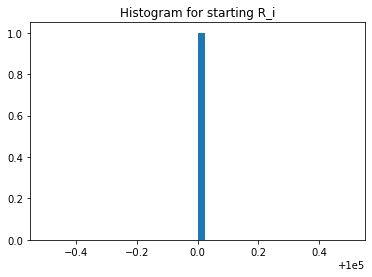

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 235784., 237707., ..., 135935., 196506., 134747.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14790., 14719., 14616., 14704., 14679., 14793., 14672.,
       14896., 14794., 14737., 14950., 14691., 14658., 14808., 14683.,
       14796., 14604., 14923., 14749., 14771., 14924., 14813., 14627.,
       14676., 14761., 14667., 14826., 14710., 14735., 14722., 14653.,
       14833., 14726., 14684., 14728., 14531., 14845., 14891., 14661.,
       14640., 14620., 14778., 14817., 14727., 14656., 14733., 14770.,
       14800., 14593., 14515., 14784., 14766., 14695., 14809., 14689.,
       14591., 14563., 14812., 14664., 14639., 14863., 14643., 14696.,
       14612., 14818., 14732., 14821., 14773., 14878., 14772., 14774.,
       14837., 14781., 14913., 14701., 14864., 14742., 14674., 14592.,
       14752., 14720., 14801., 14768., 14546., 14715., 14744., 14850.,
       14748., 14901., 14841., 14623., 14613., 14637., 14698., 14740.,
       14692., 14922., 14537., 14621., 14618., 14699., 14669., 14693.,
       14724., 14582., 14702., 14948., 14635., 14641., 14791., 14775.,
      

In [25]:
experiments.UNI_Qj.unique()

array([200000., 150444., 151569., ..., 129374., 199064., 195984.])

In [26]:
experiments.UNI_Rj.unique()

array([100000., 133065., 132074., ..., 154815., 100472., 102056.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

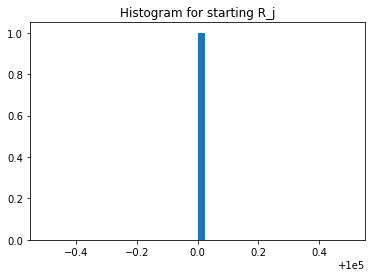

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


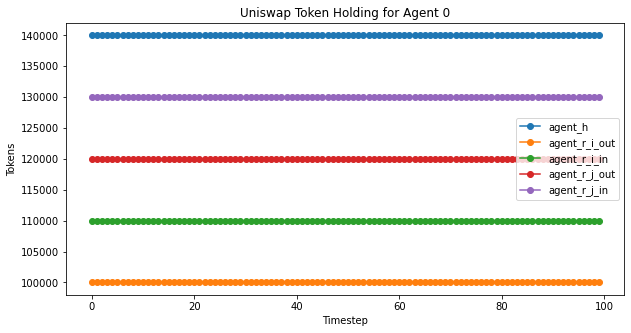

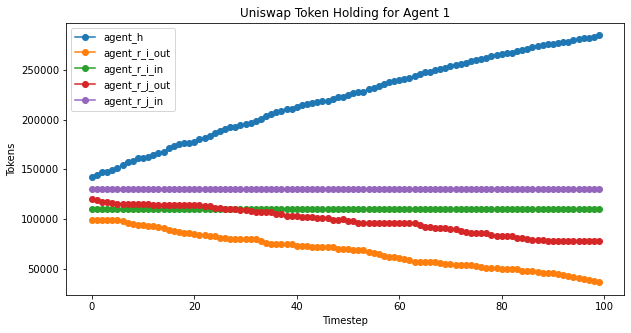

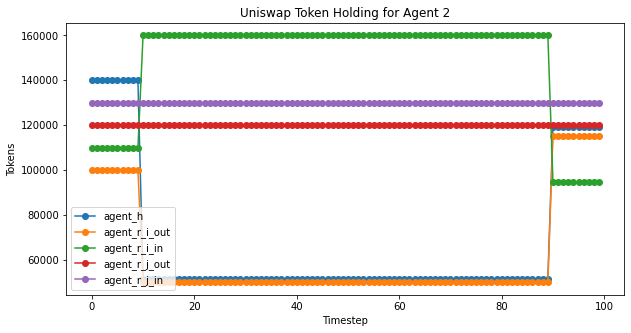

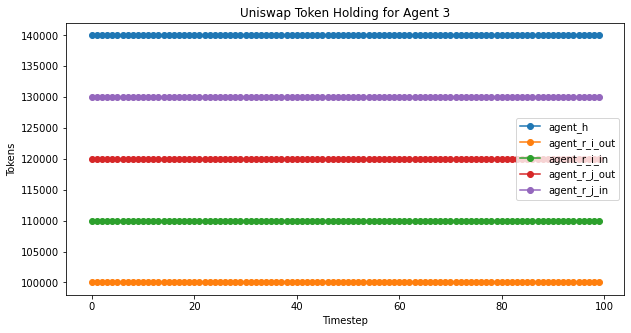

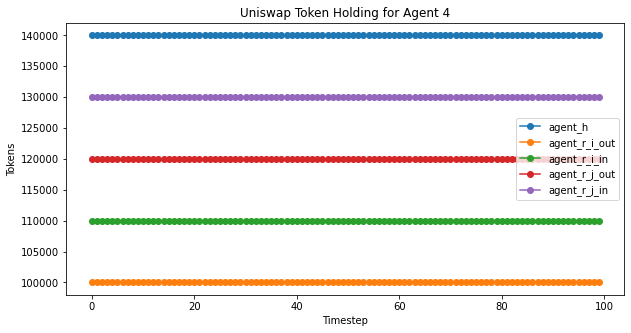

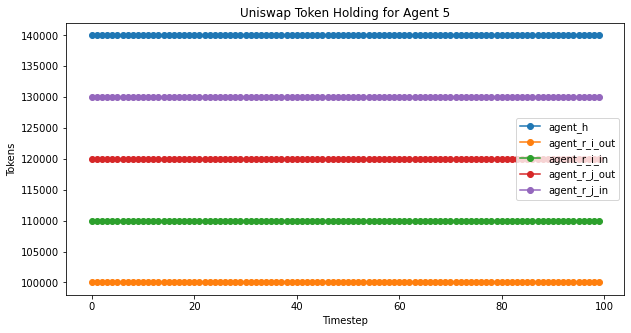

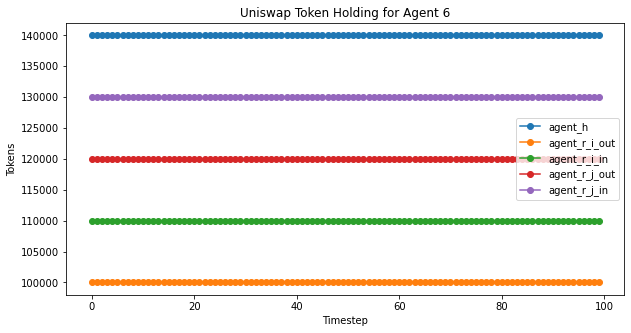

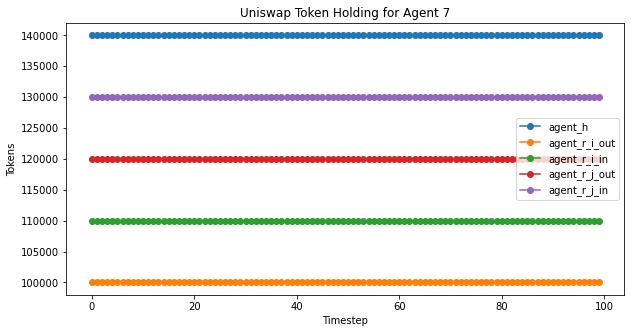

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


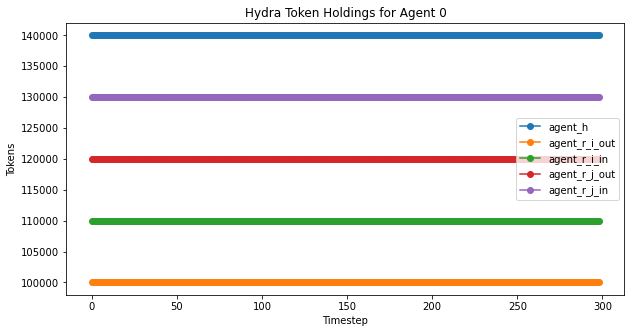

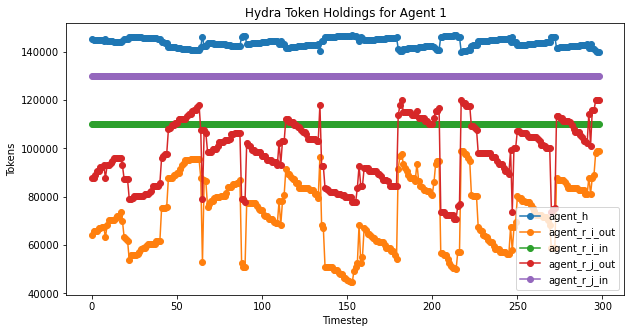

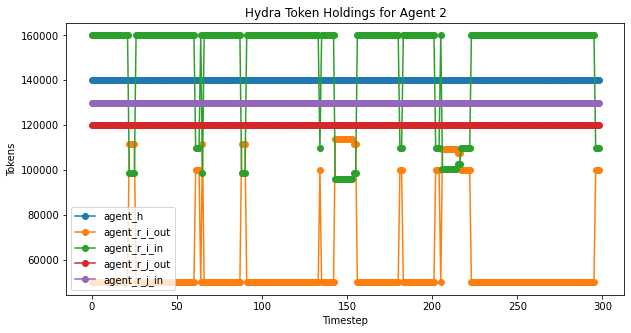

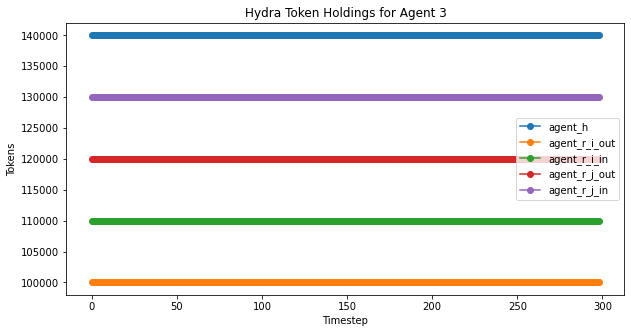

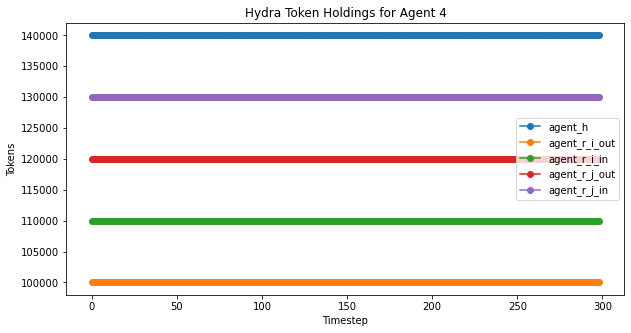

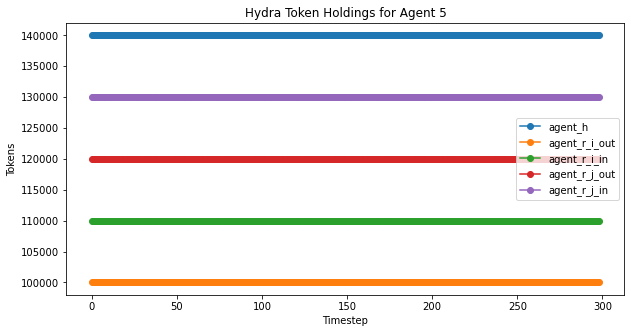

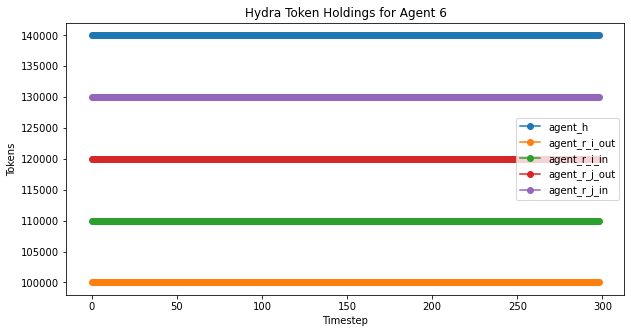

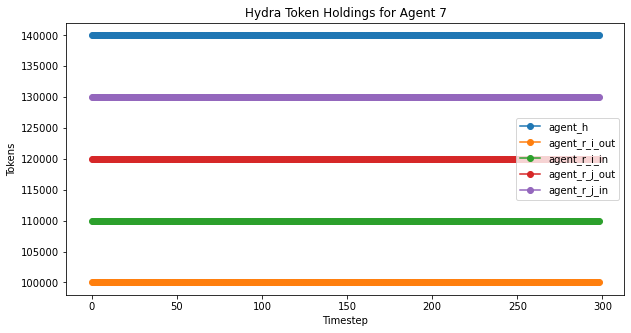

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

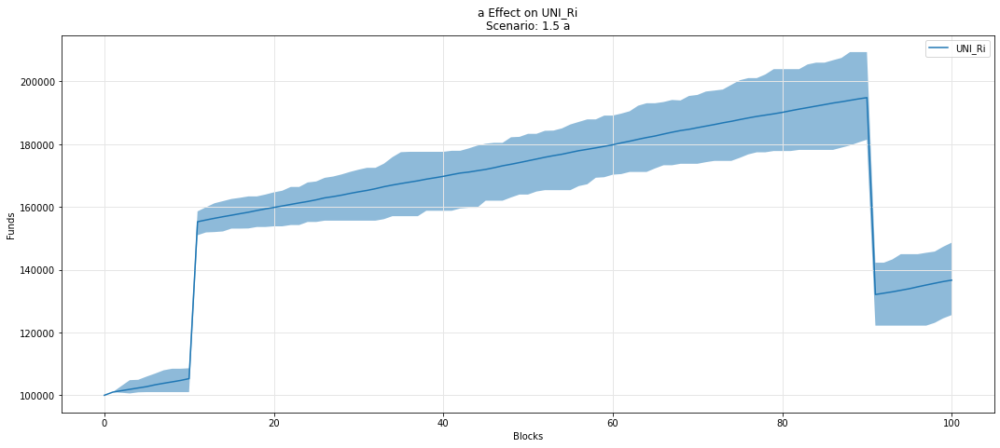

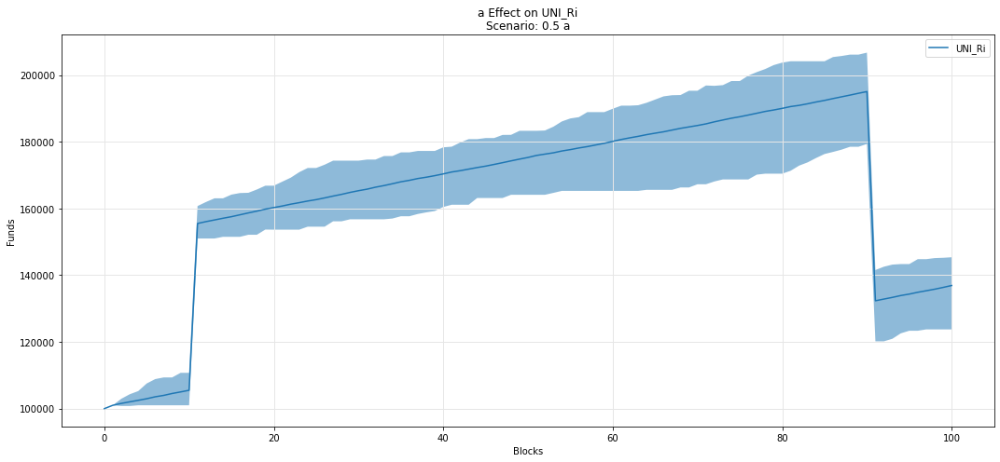

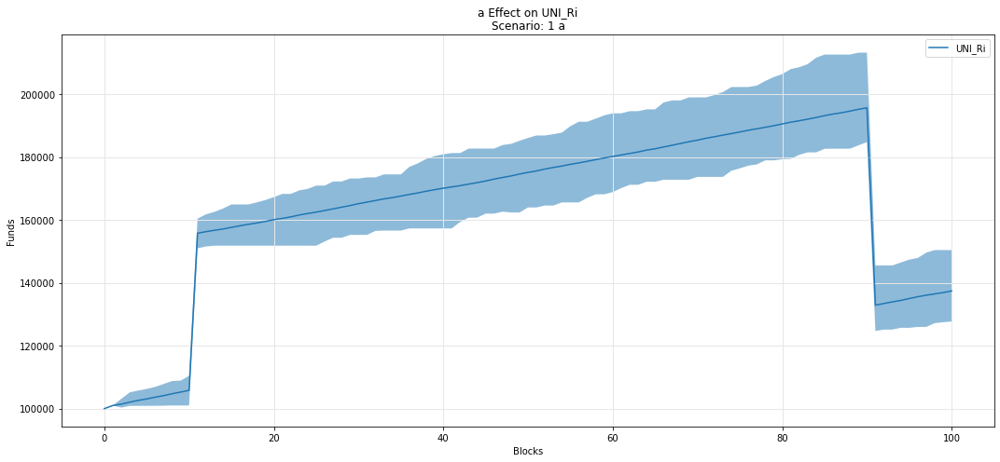

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

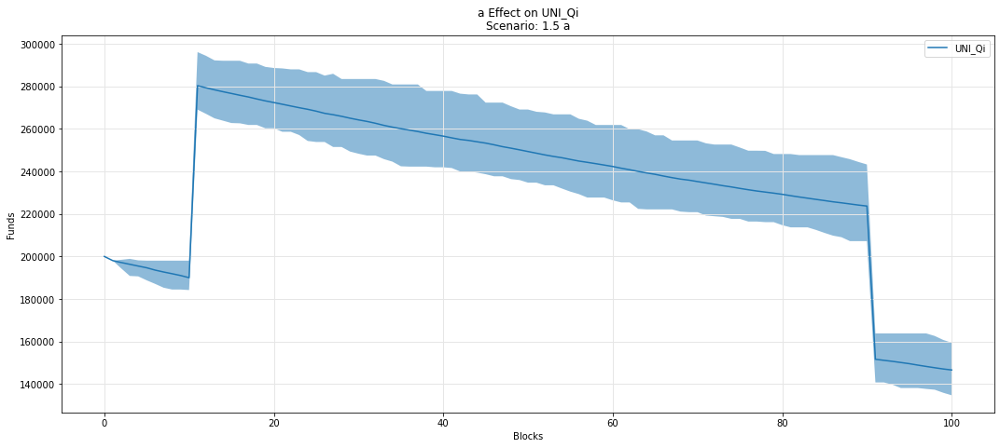

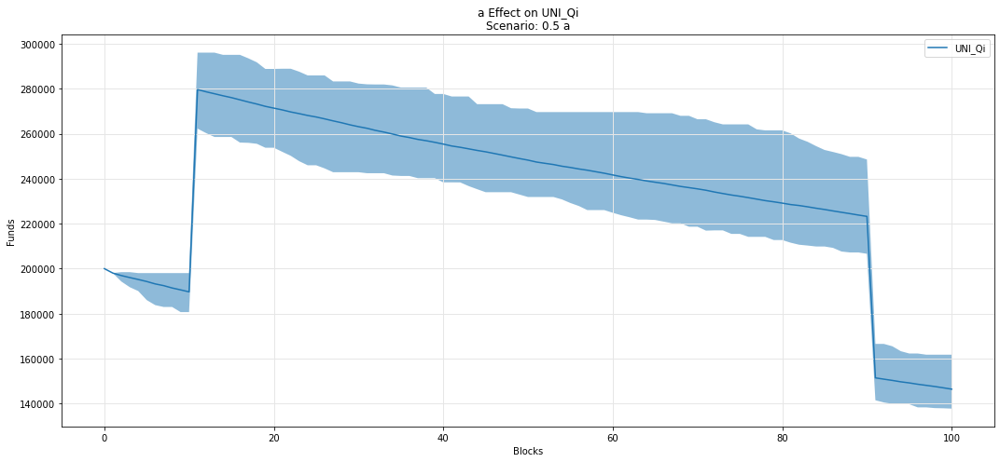

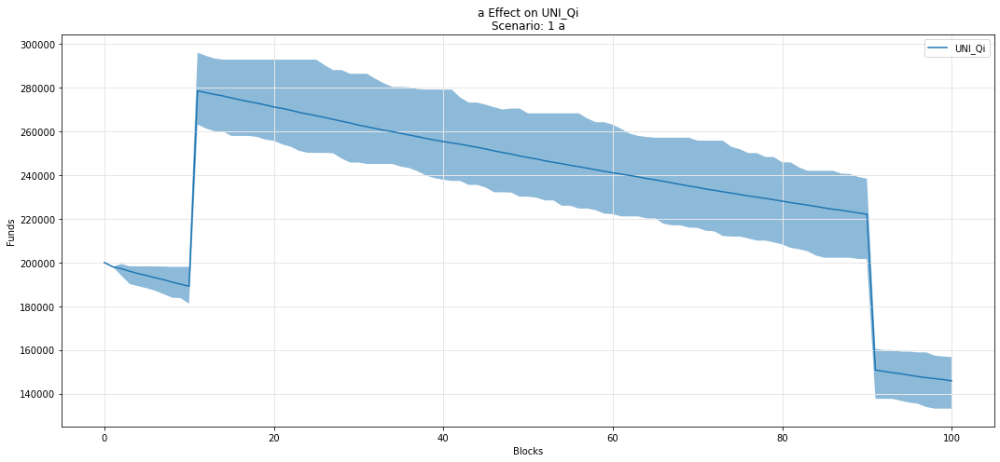

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

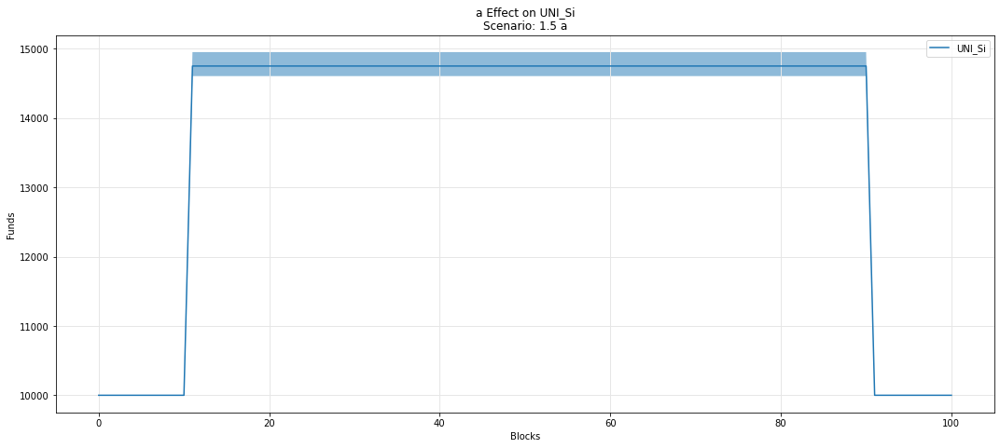

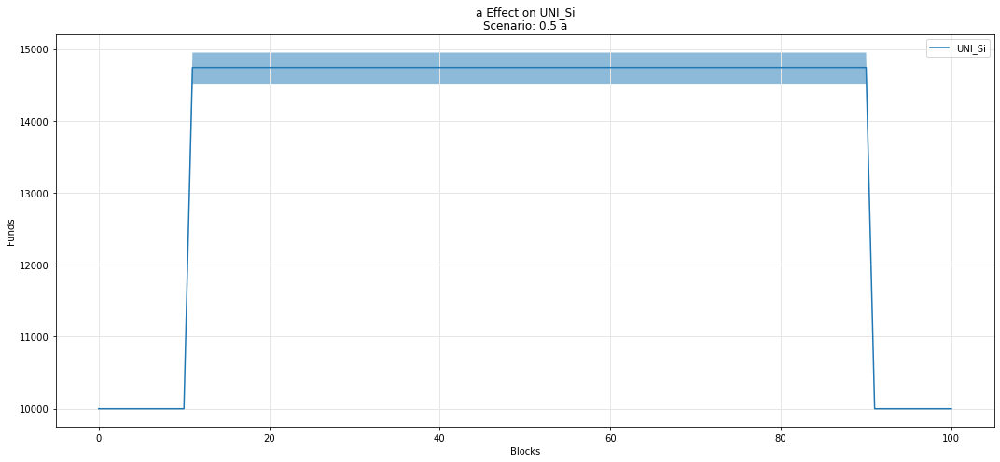

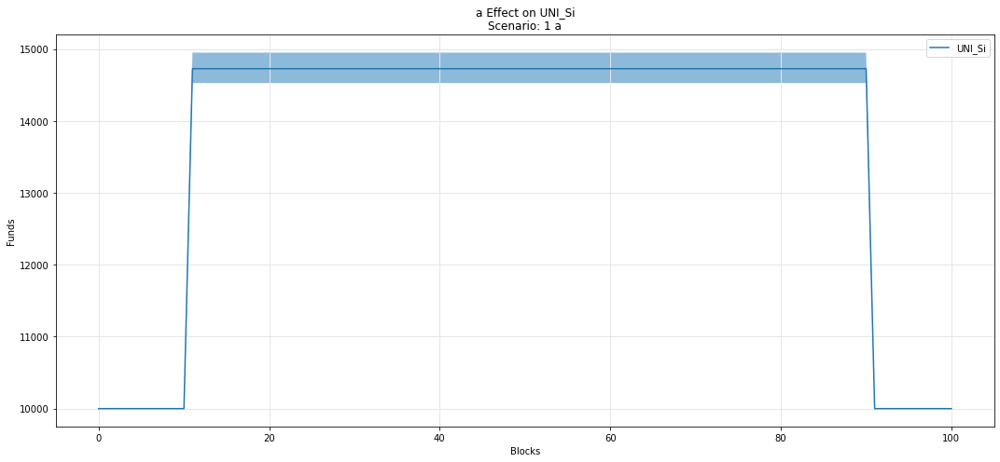

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

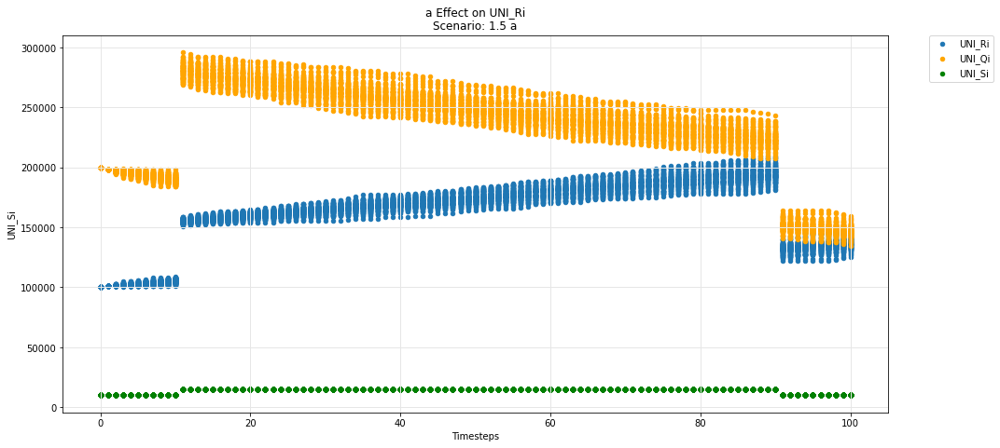

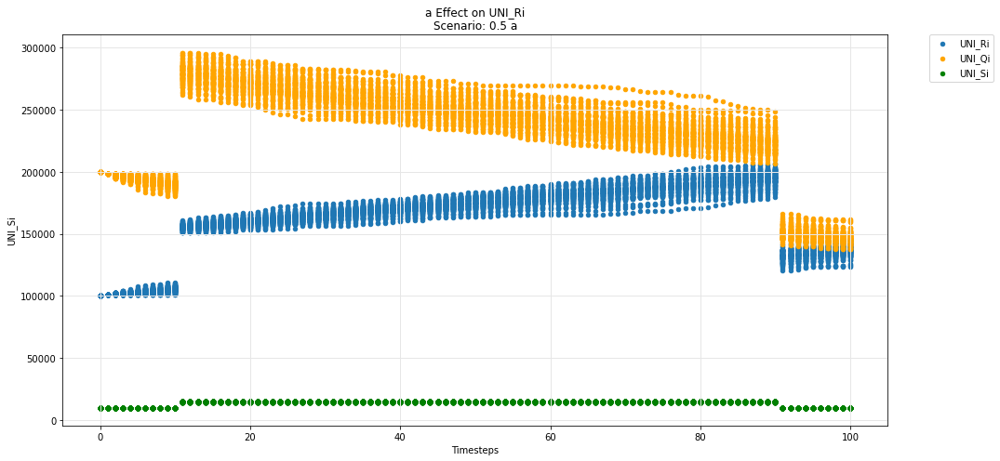

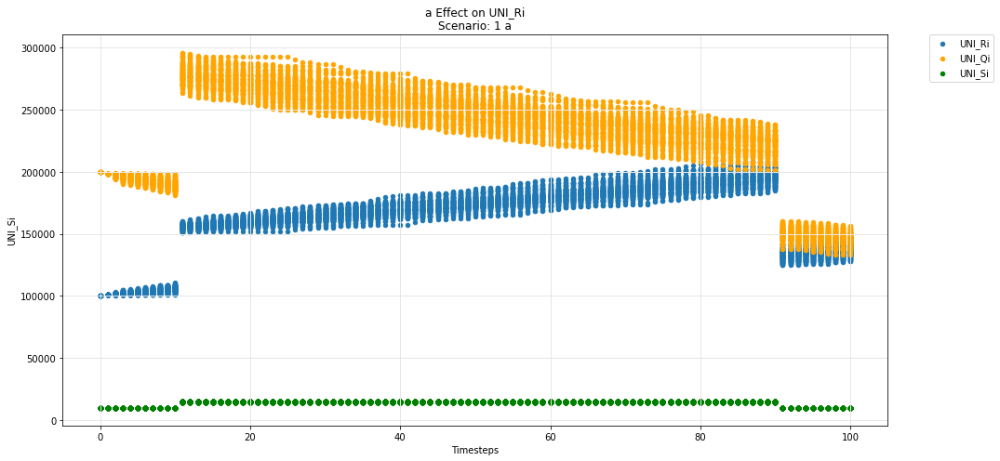

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

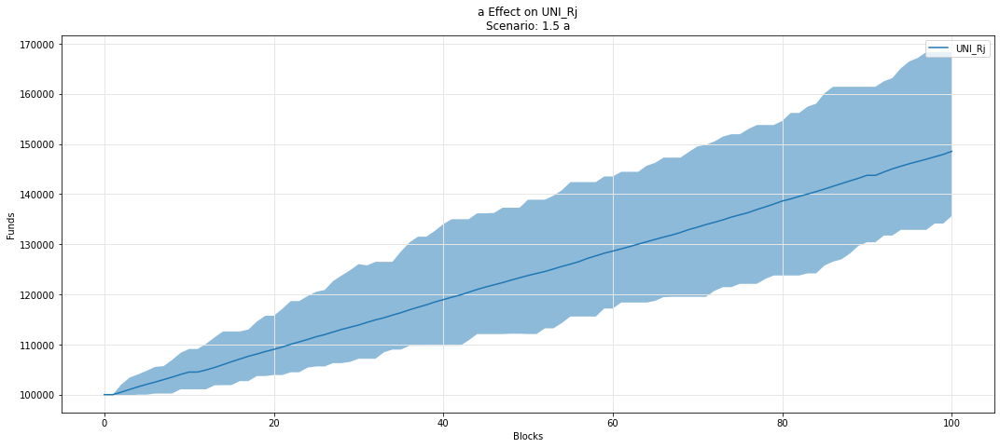

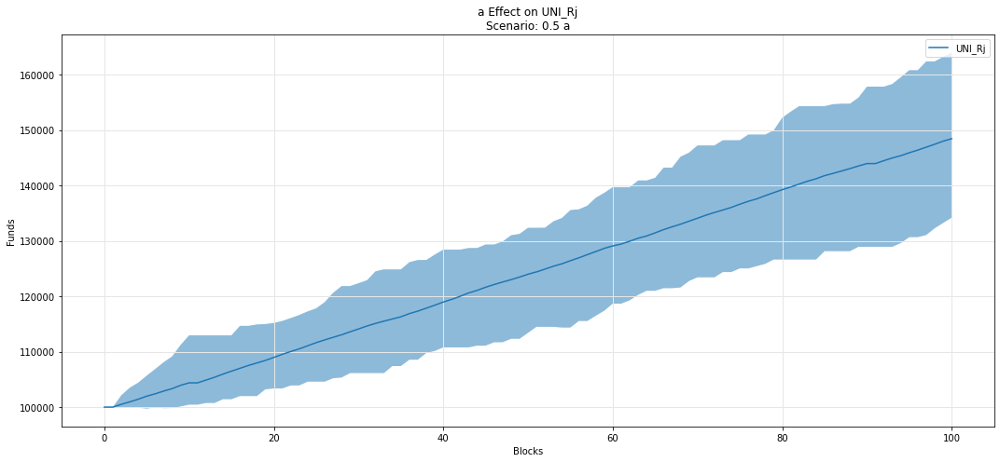

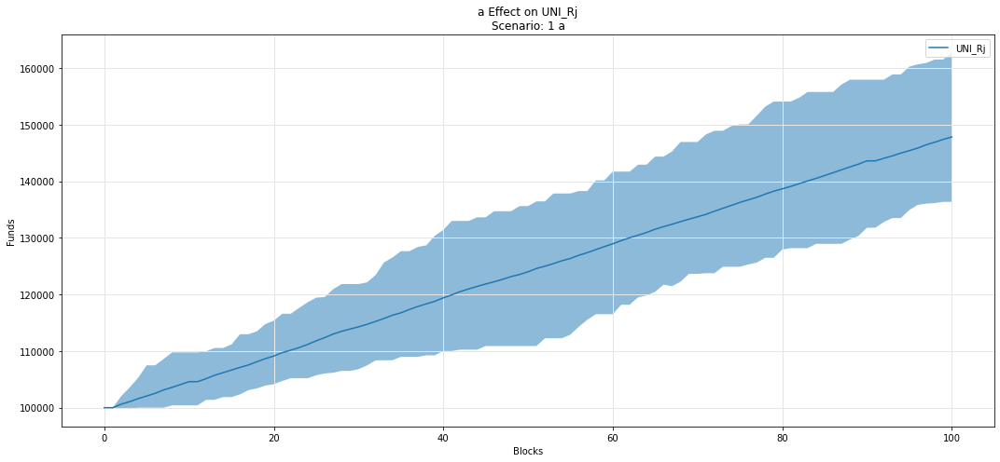

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

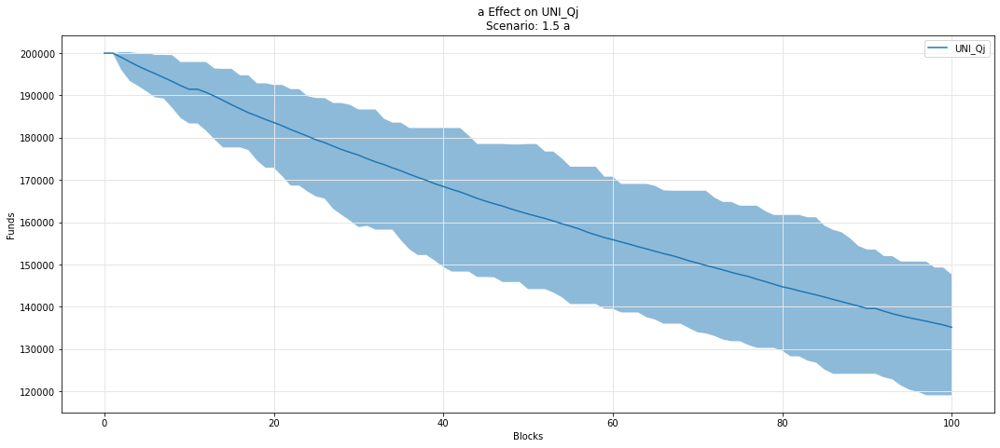

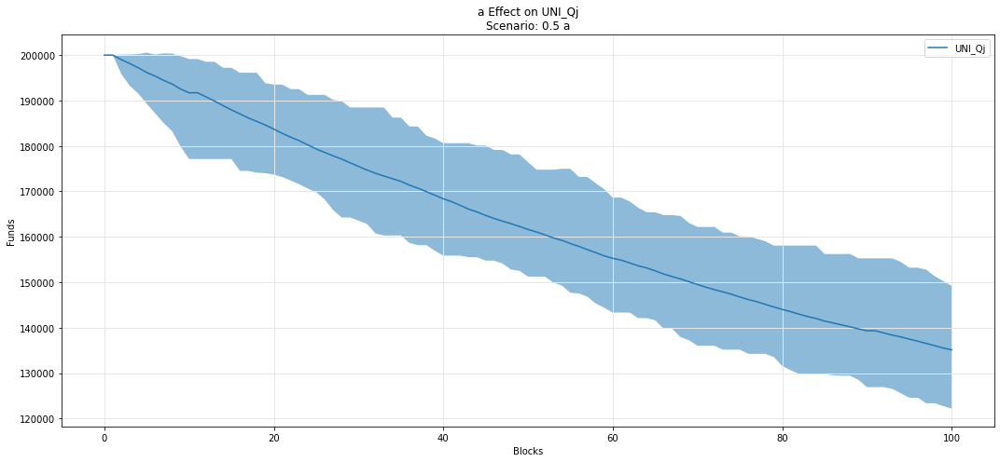

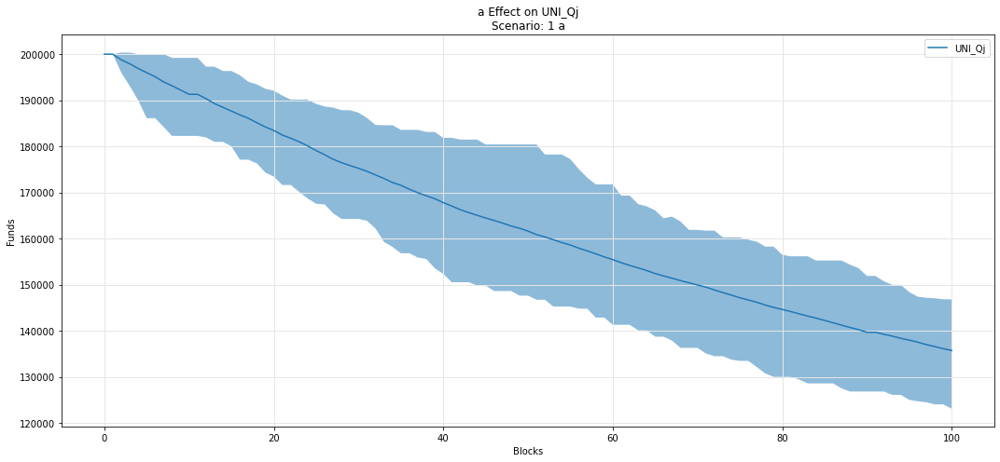

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

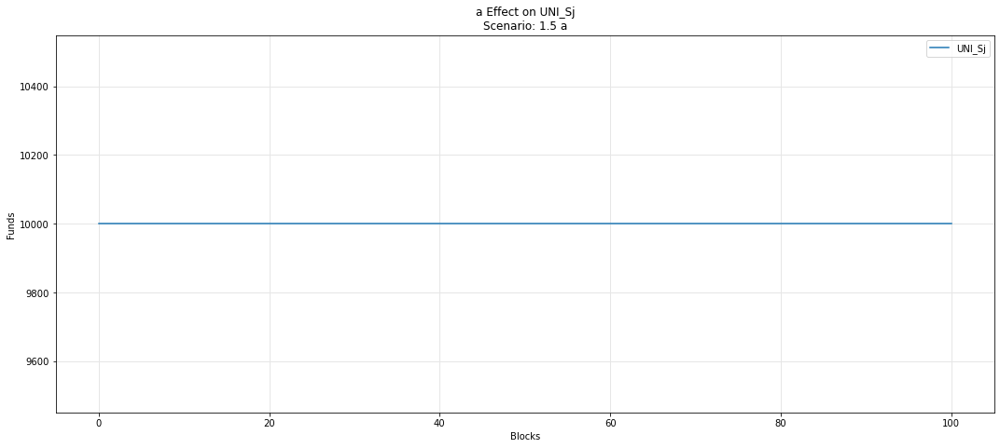

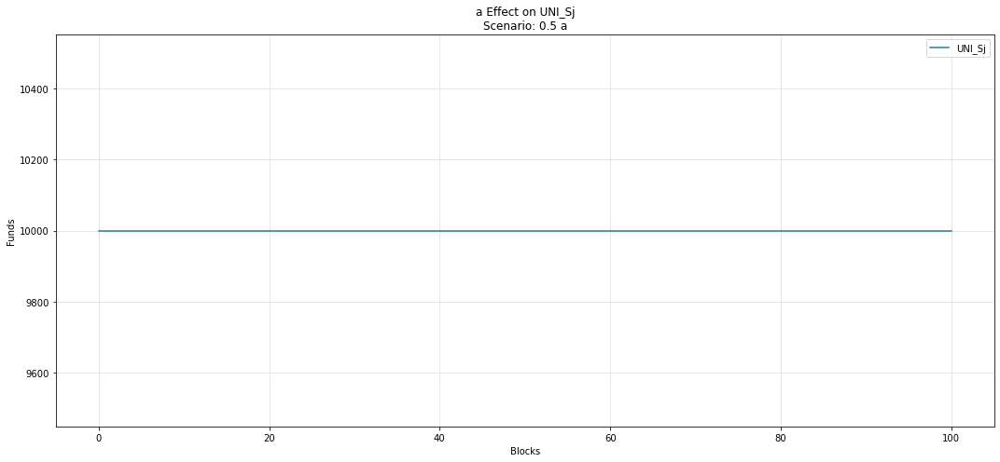

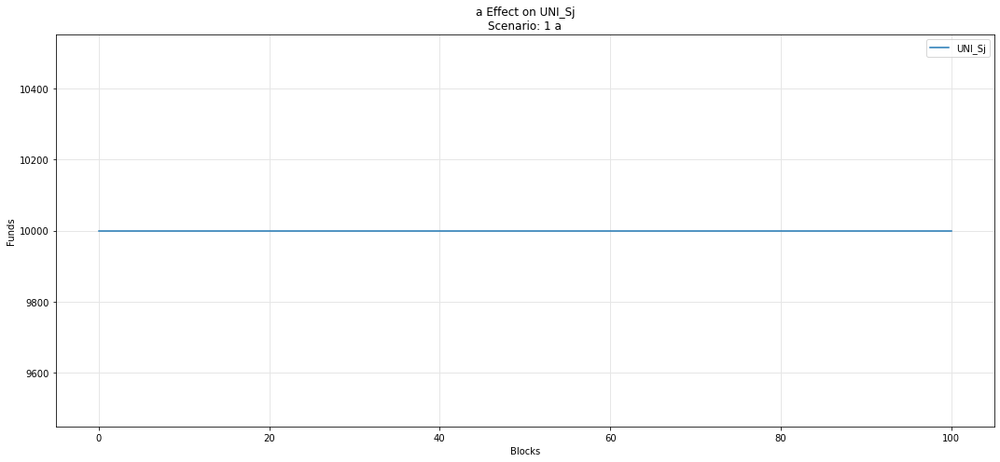

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

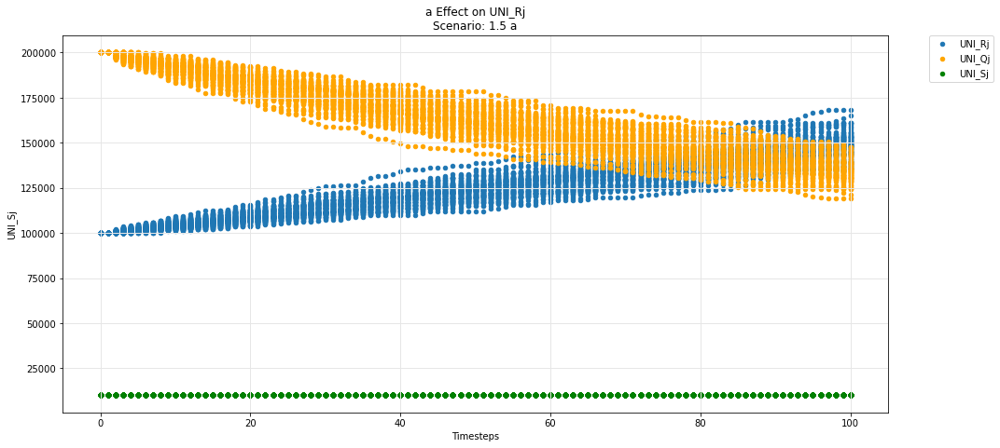

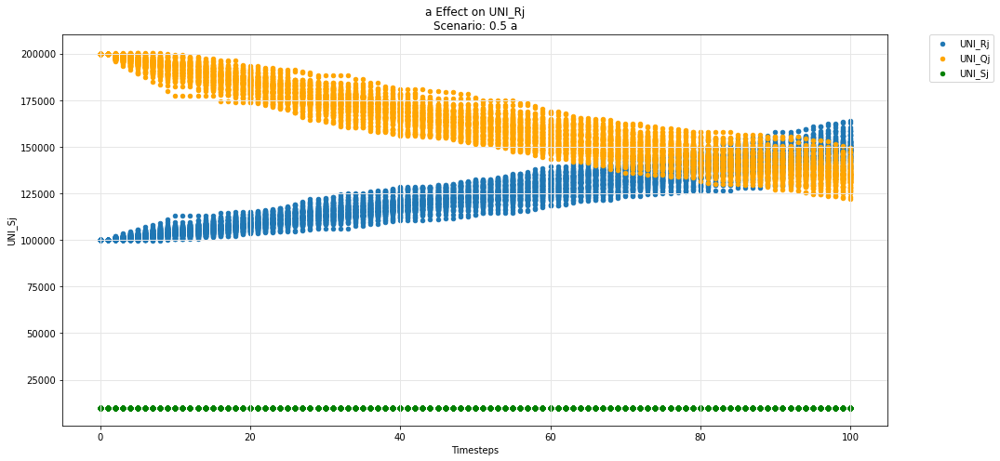

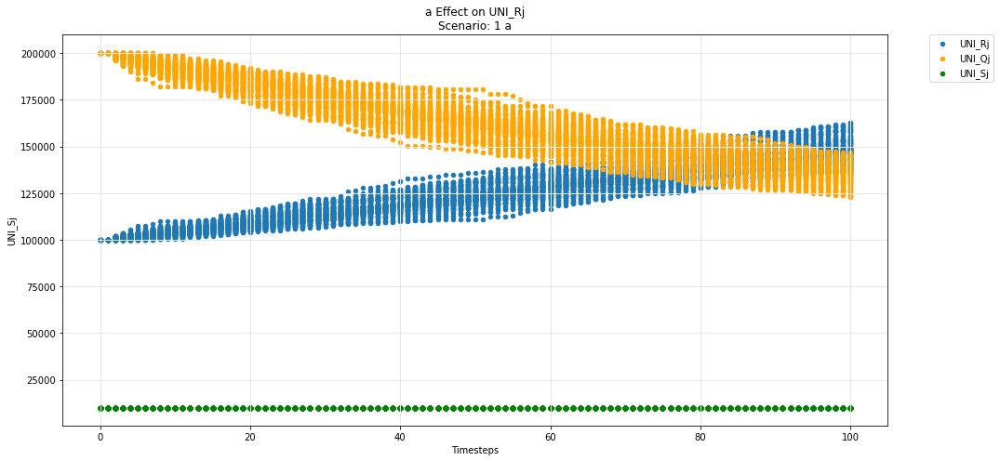

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

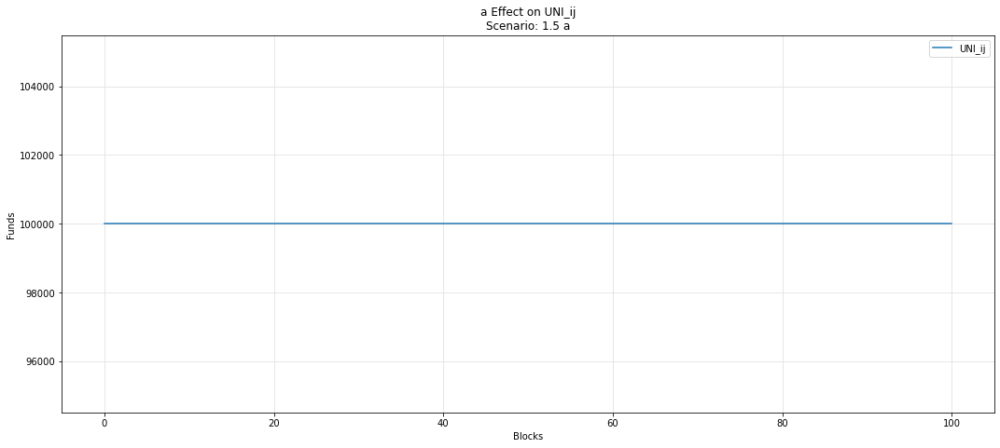

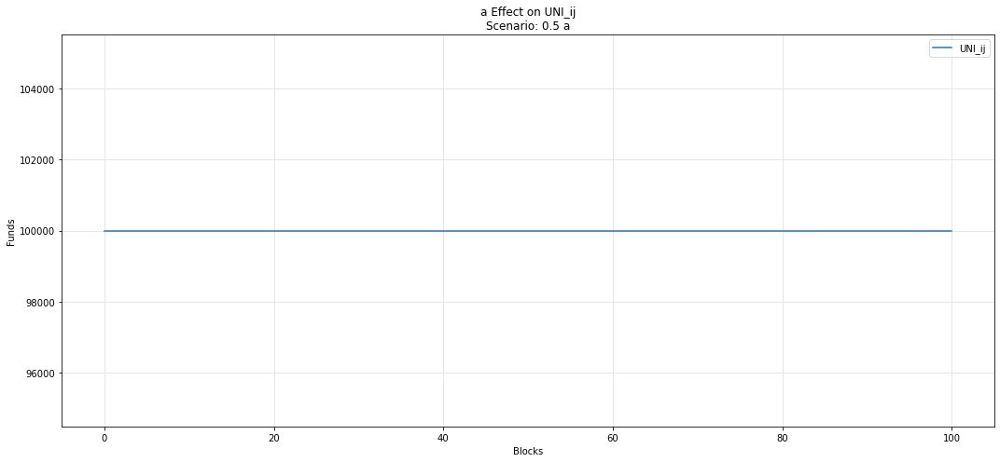

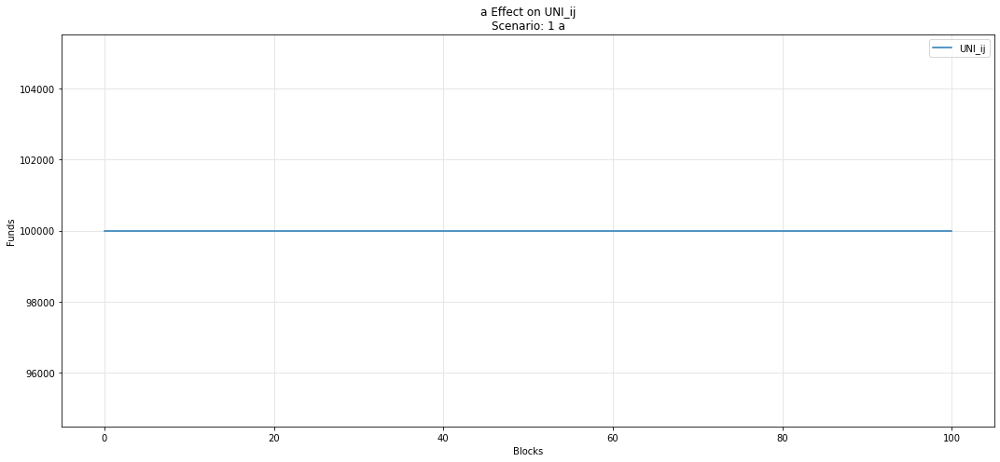

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

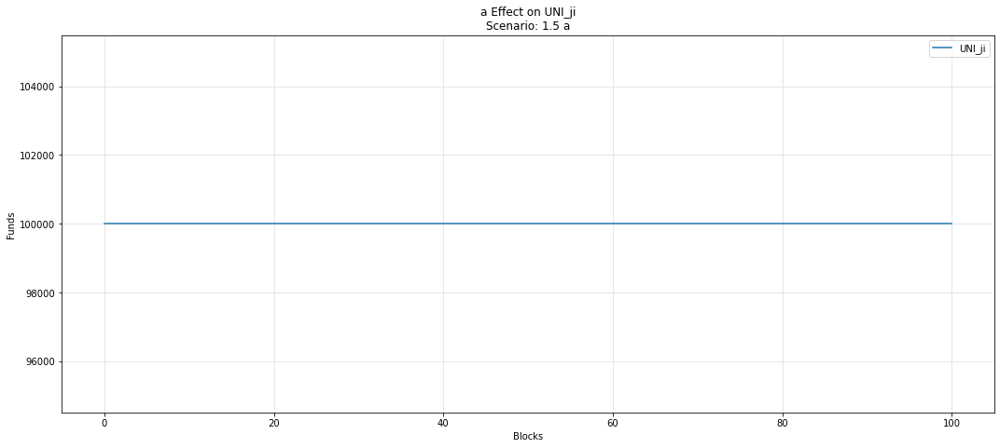

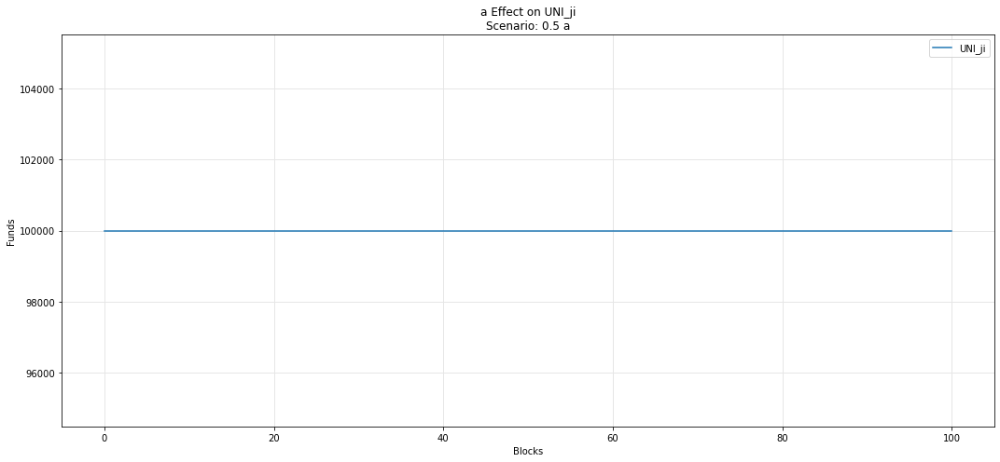

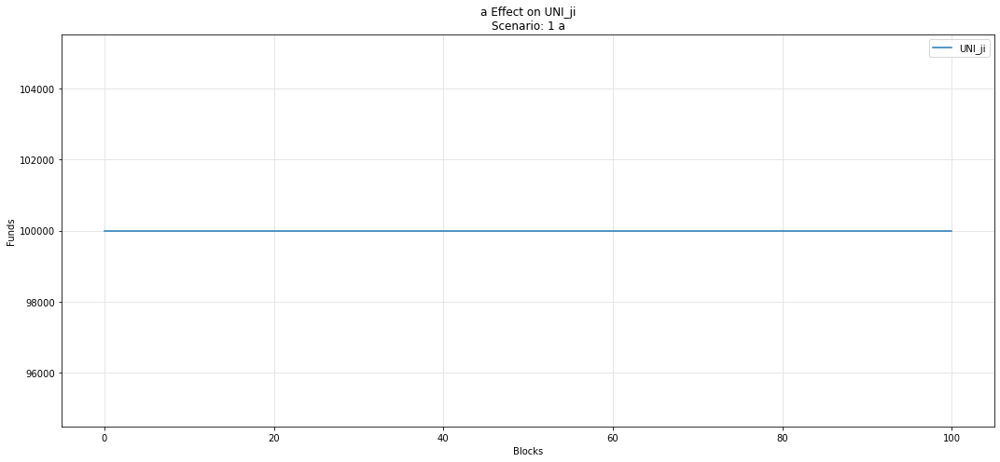

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

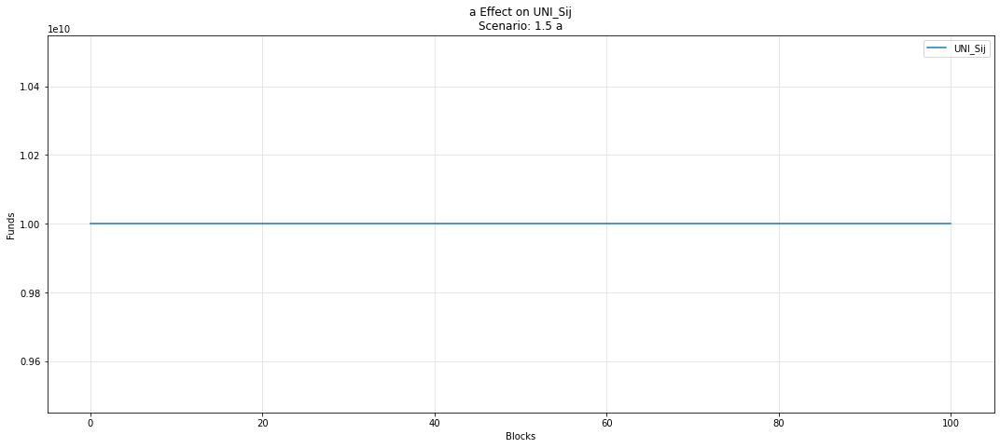

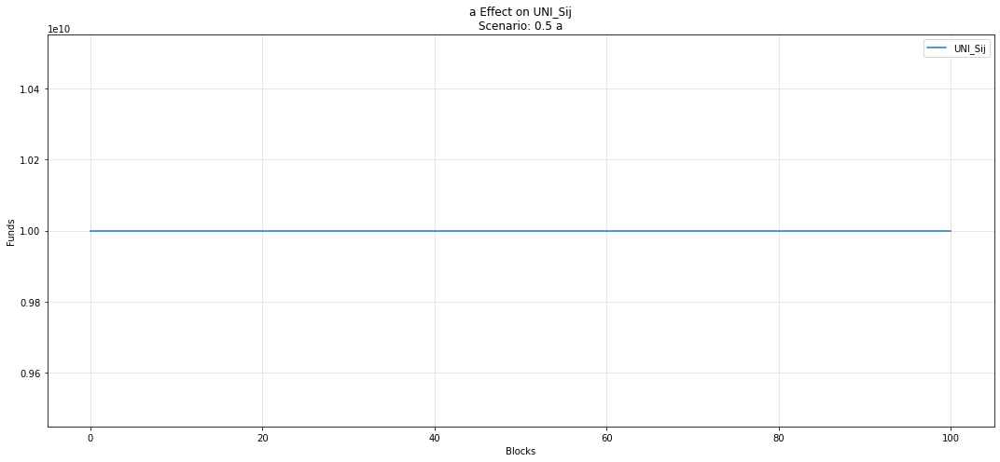

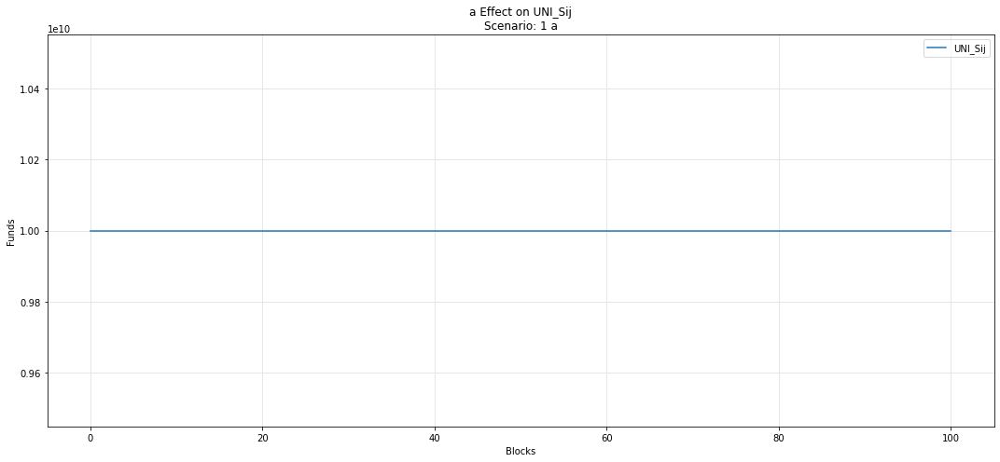

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

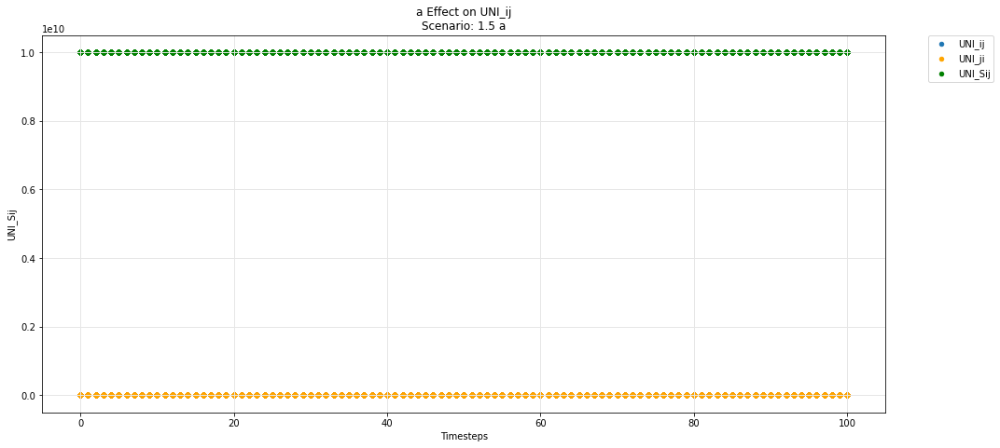

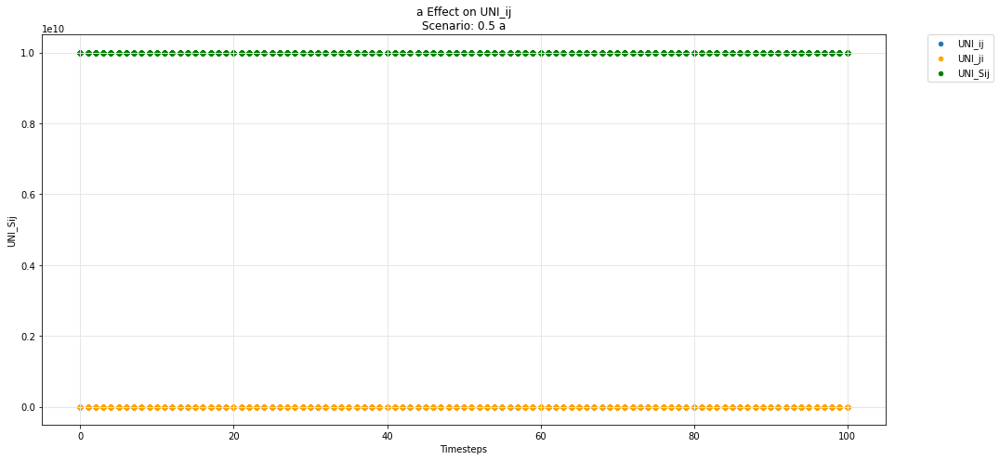

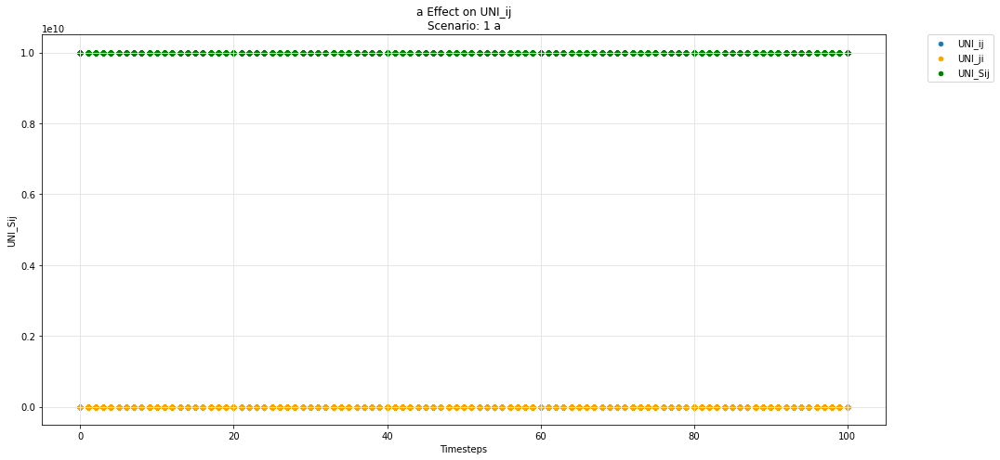

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

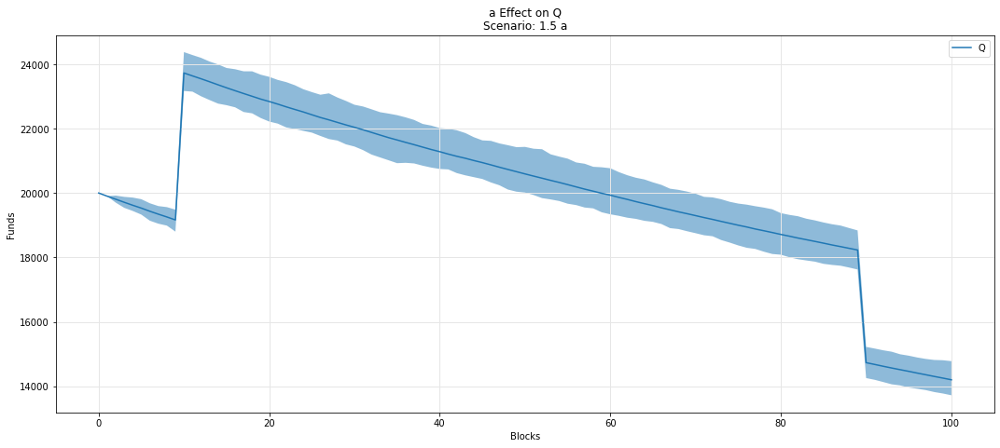

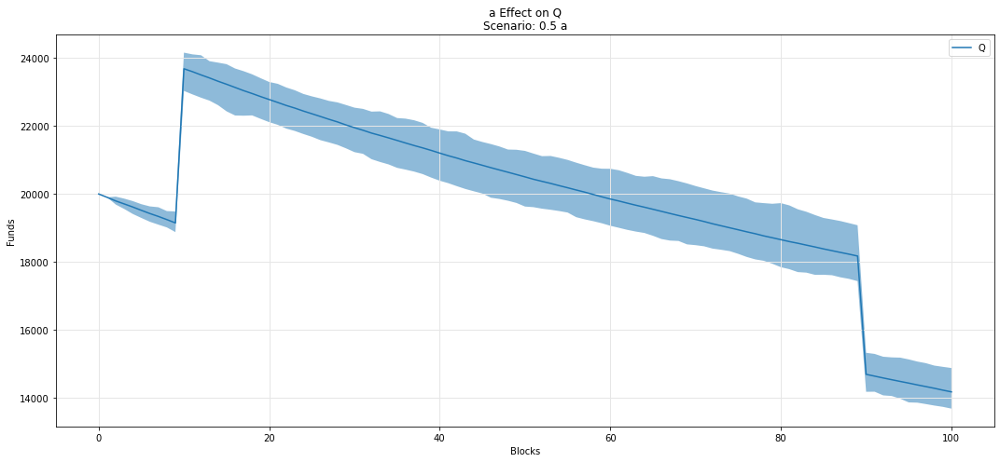

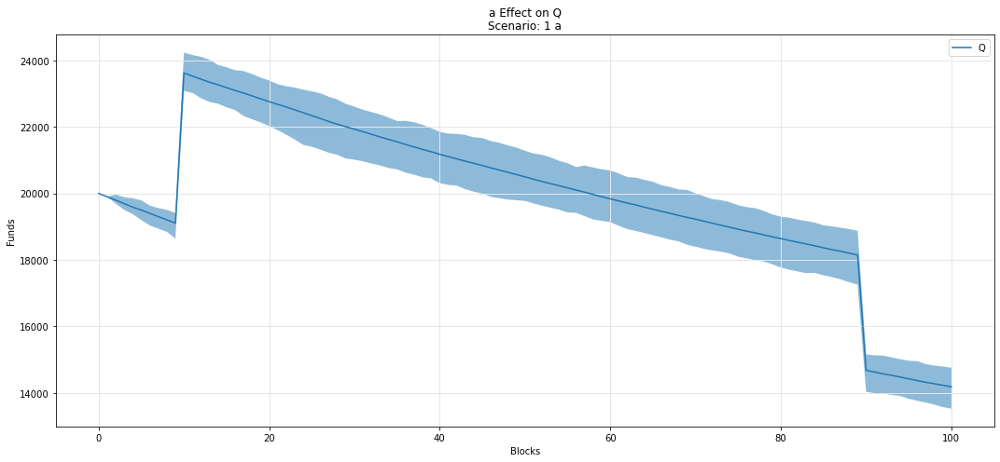

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

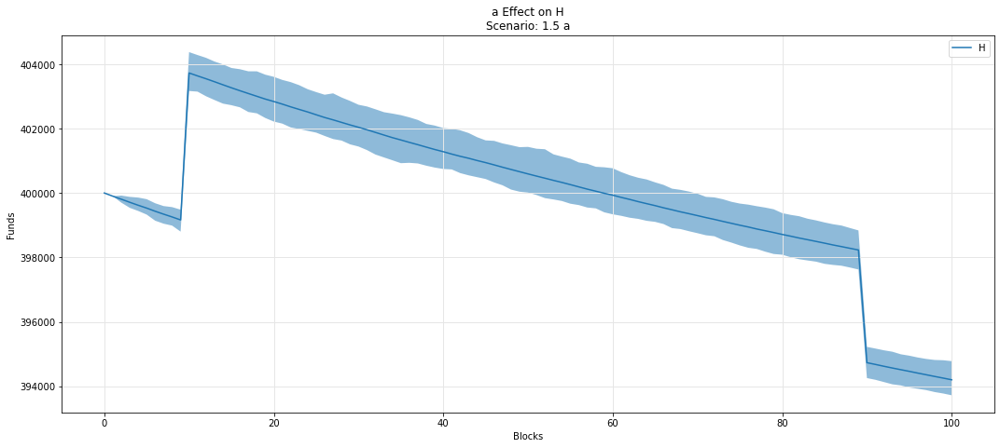

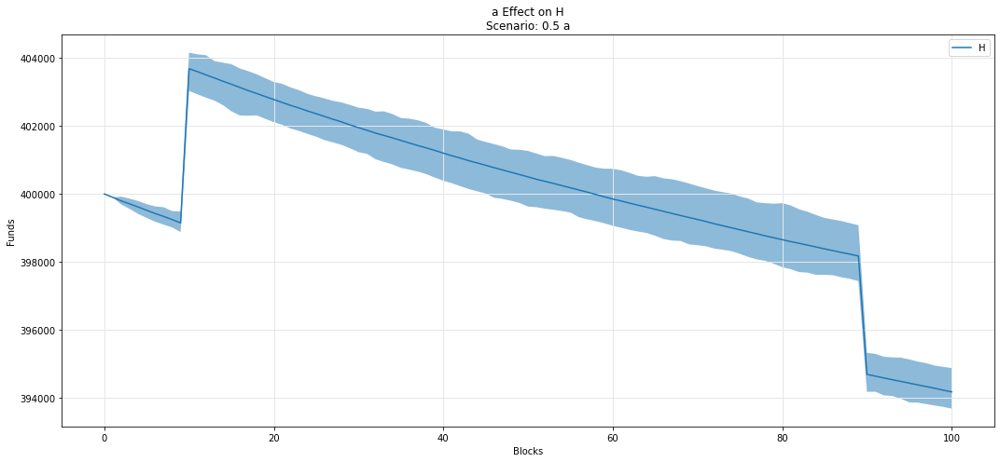

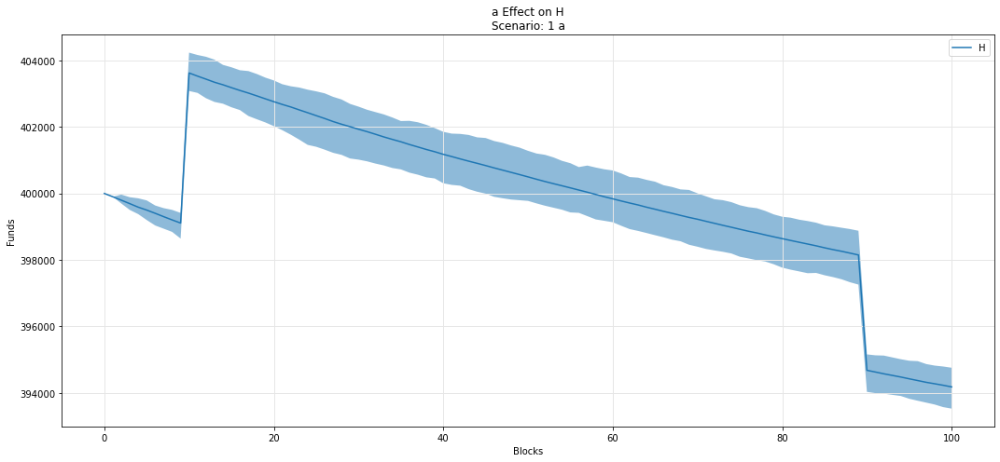

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

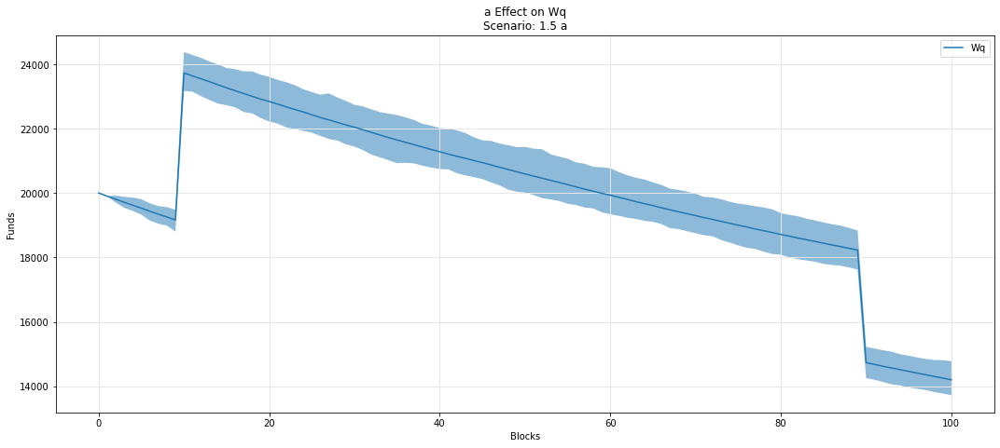

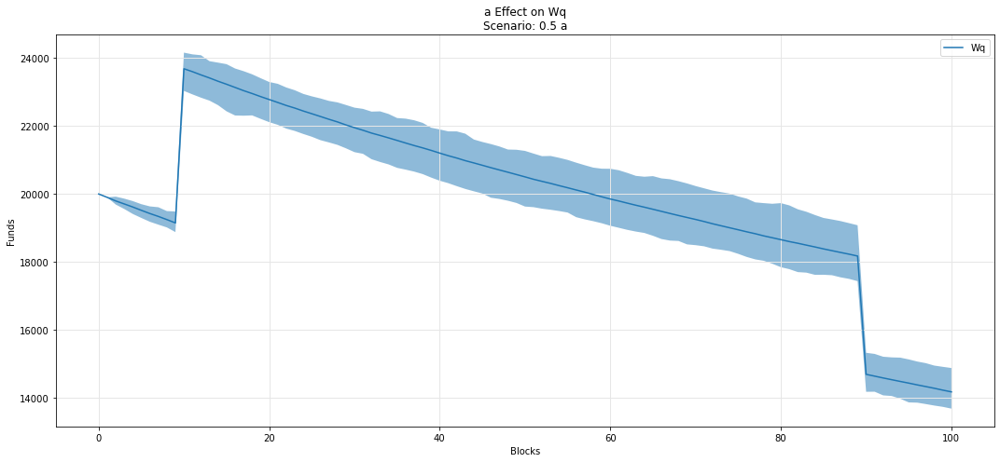

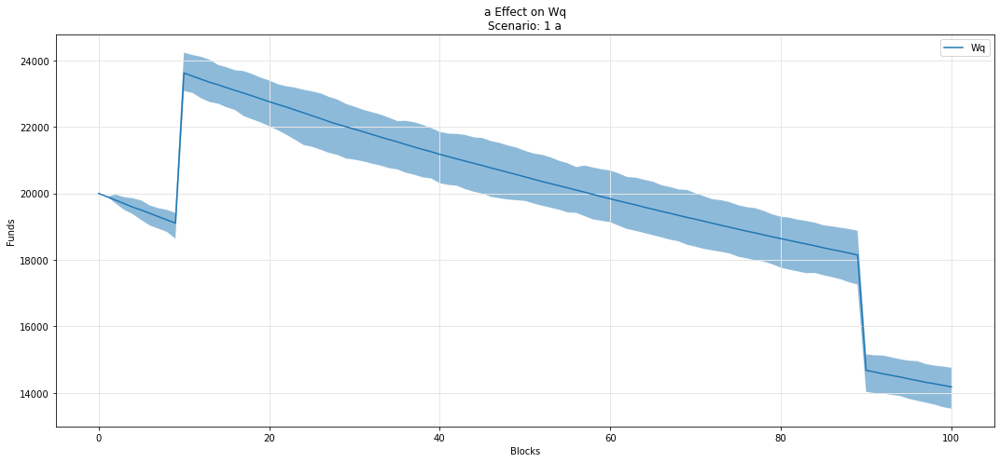

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

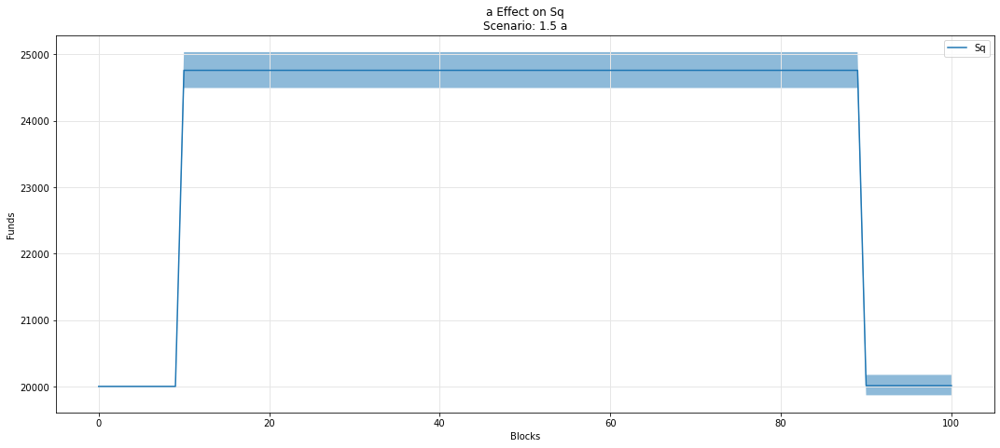

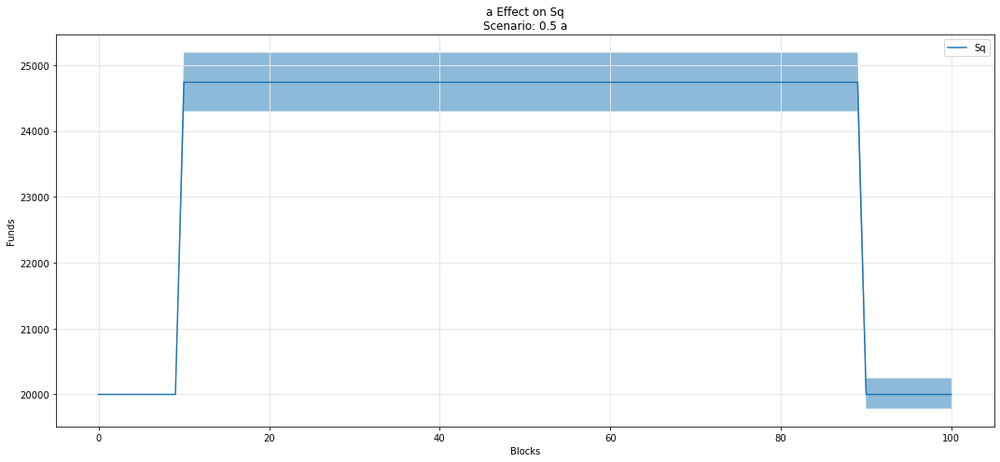

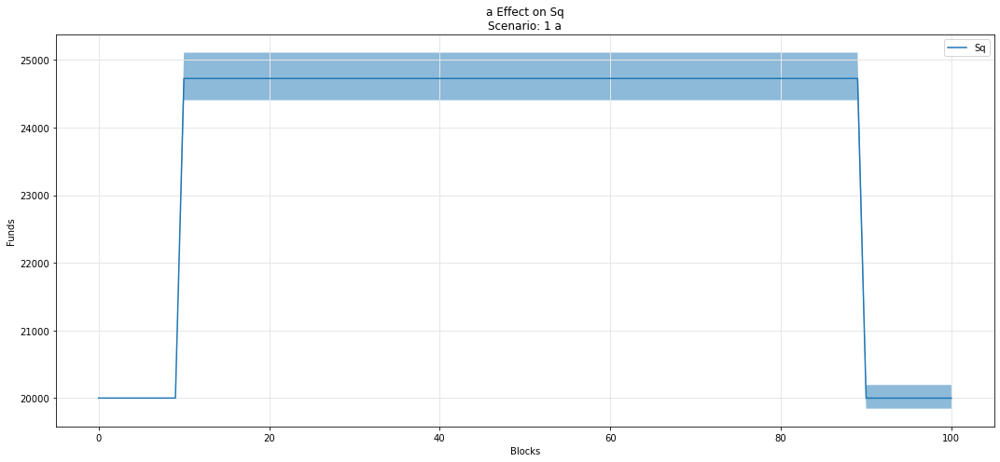

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

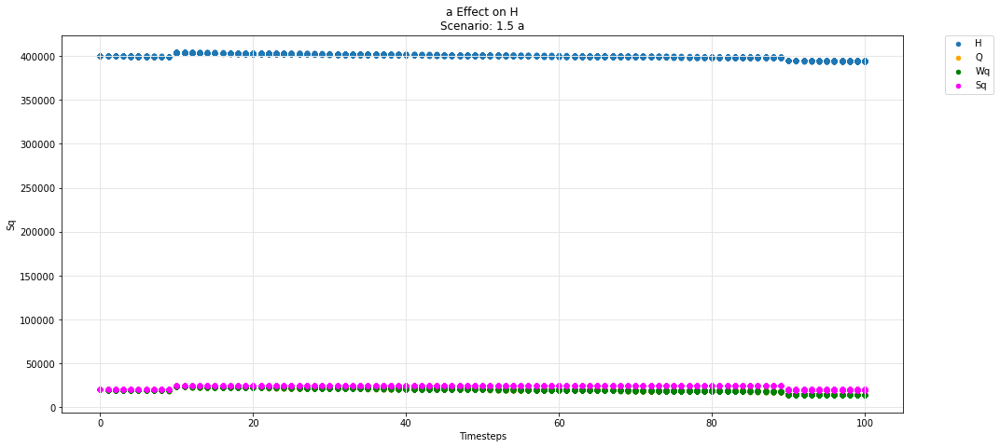

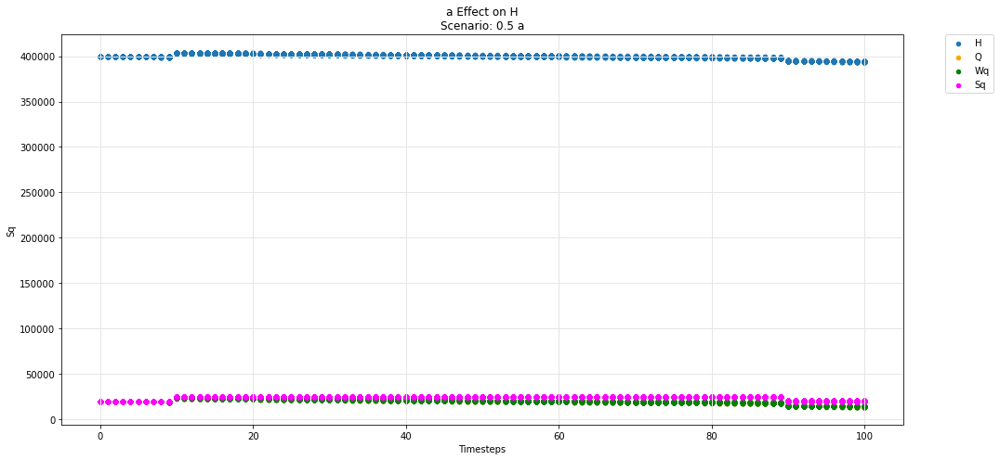

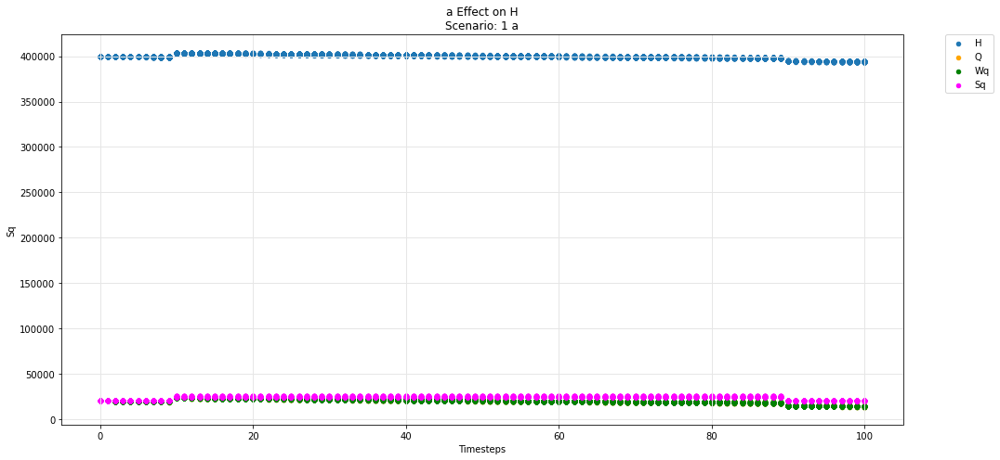

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

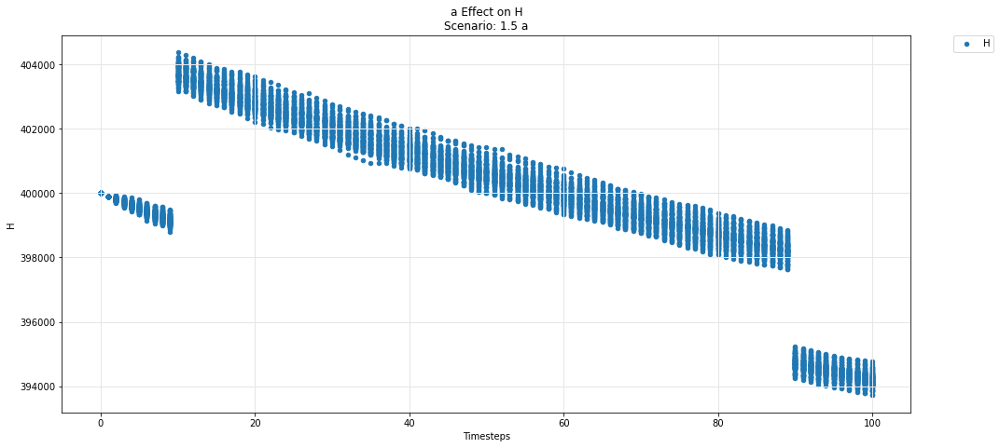

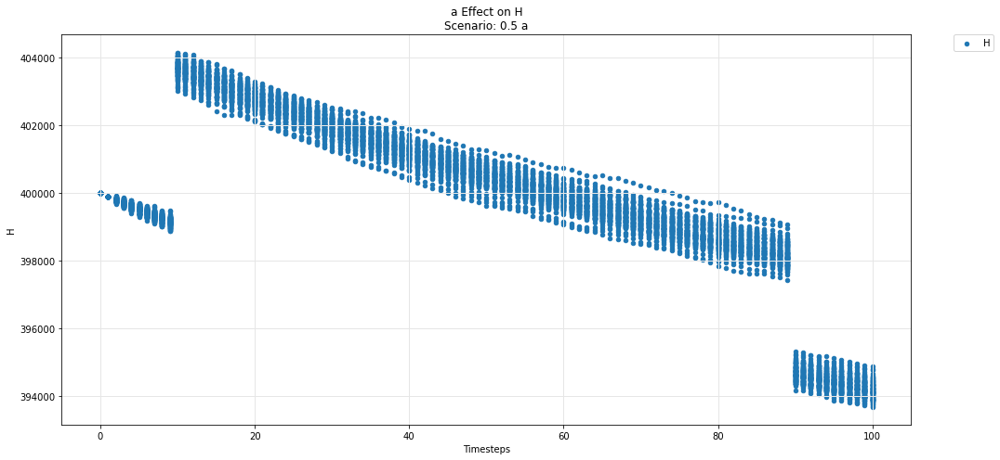

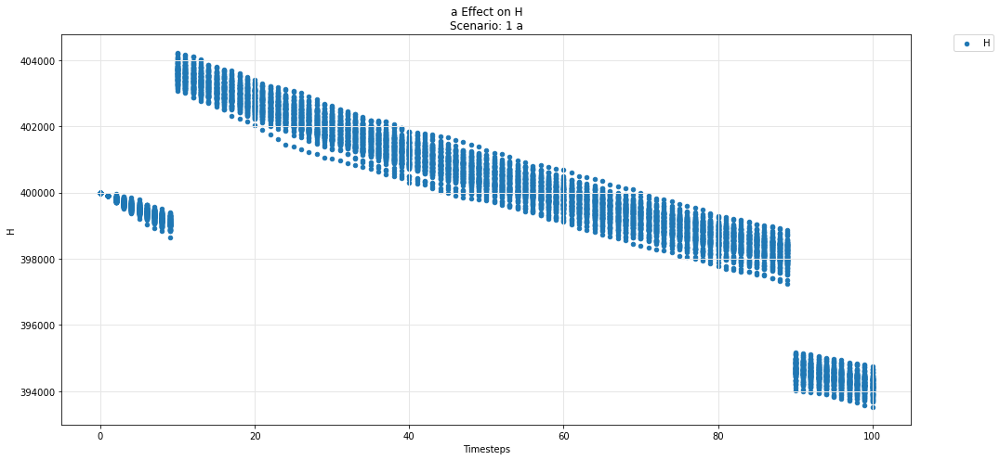

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

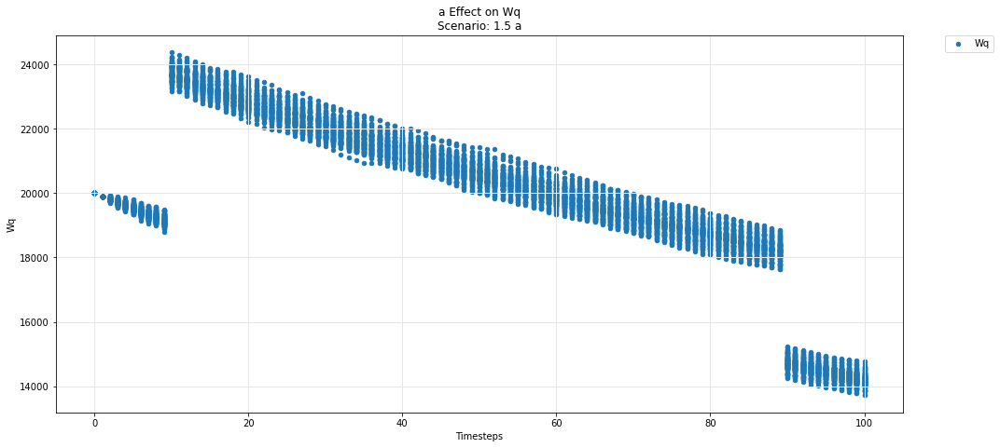

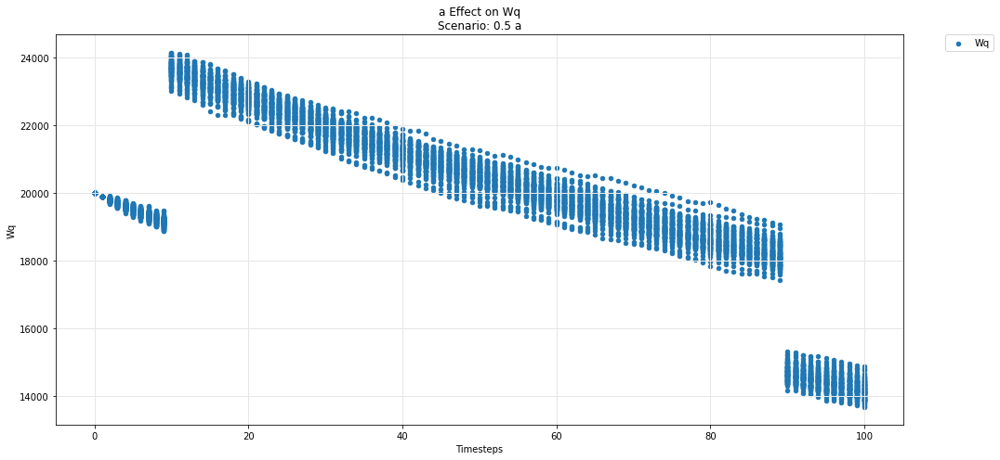

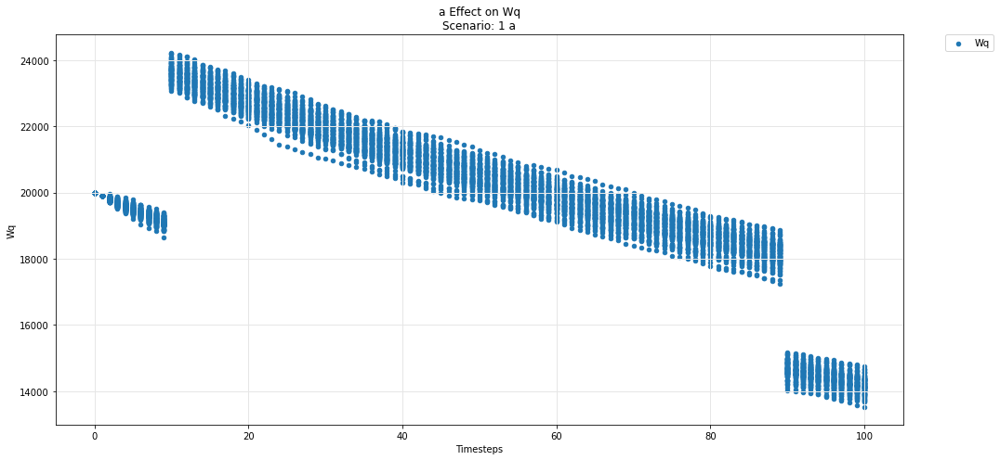

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

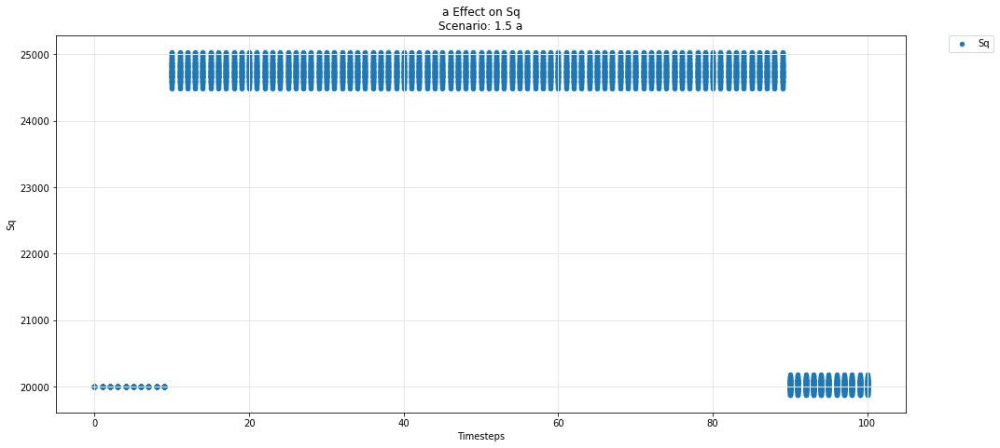

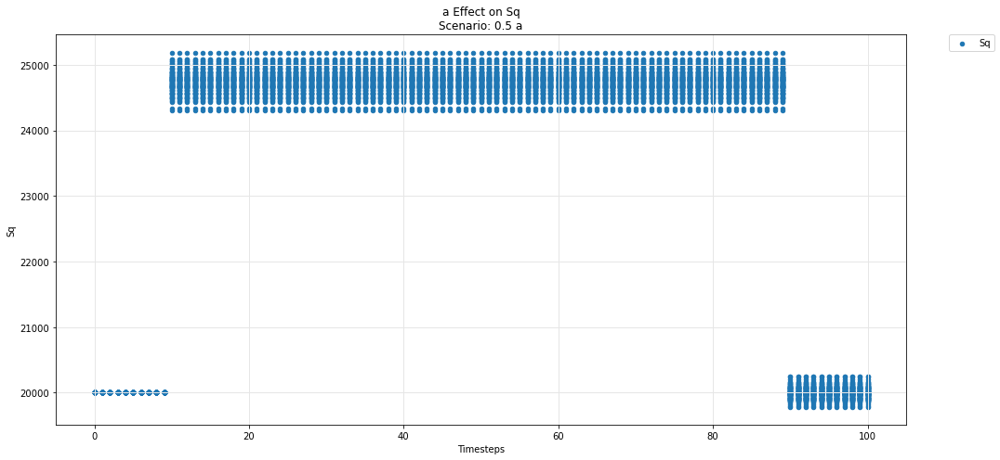

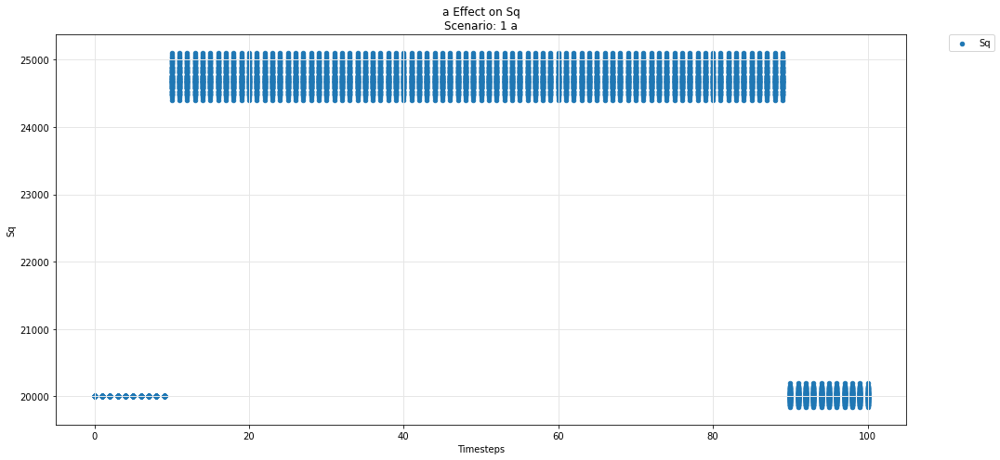

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

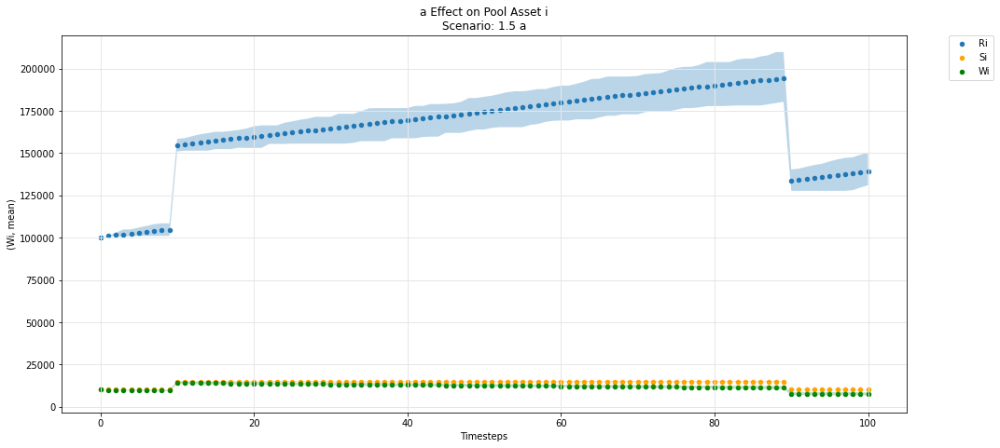

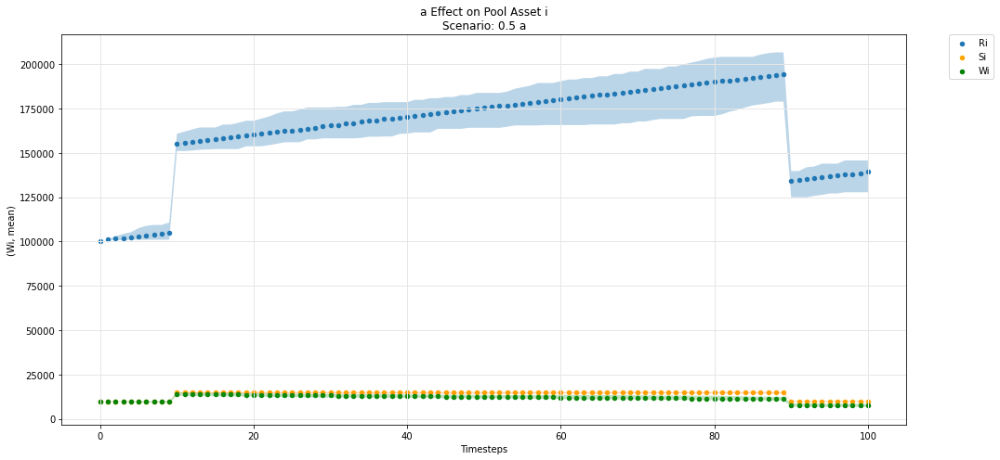

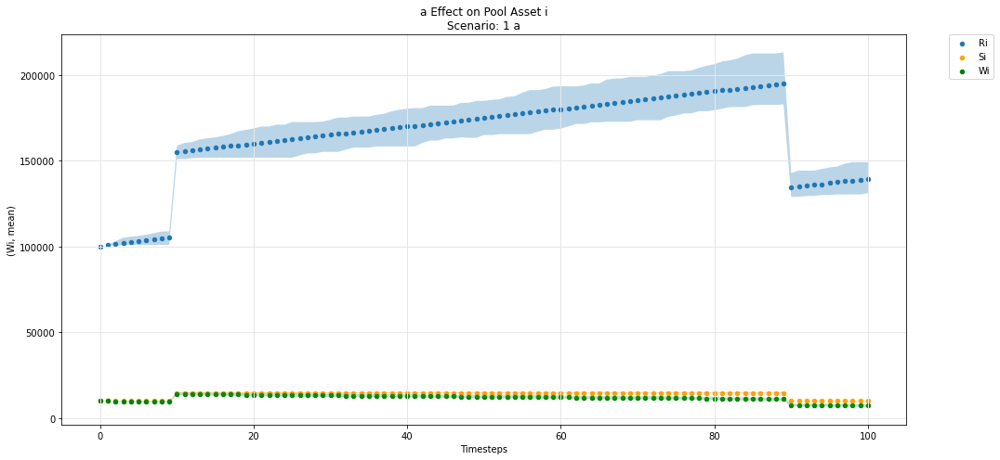

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

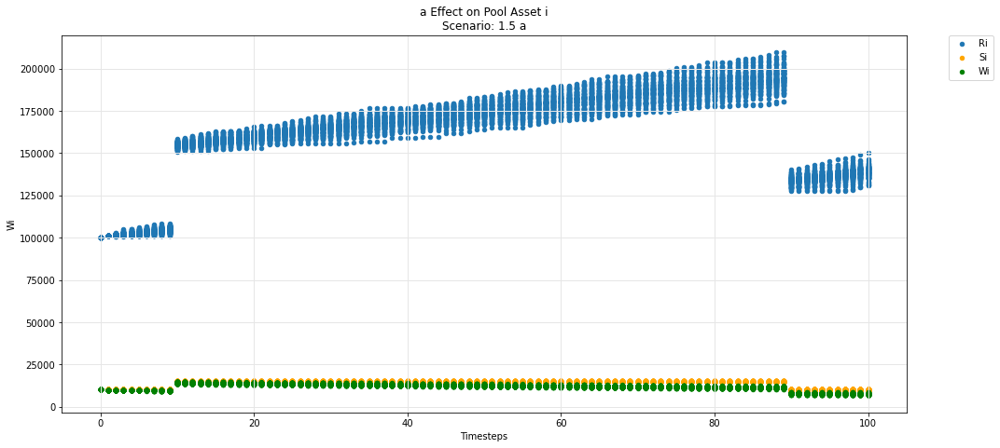

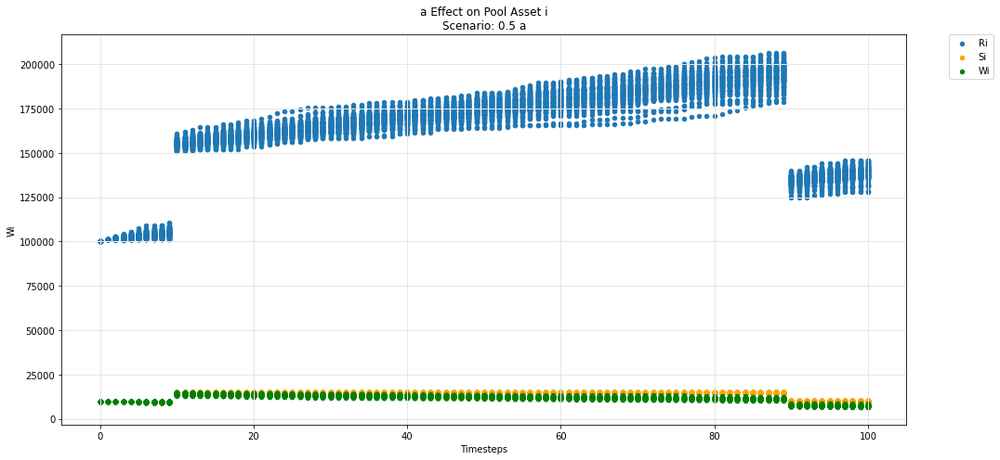

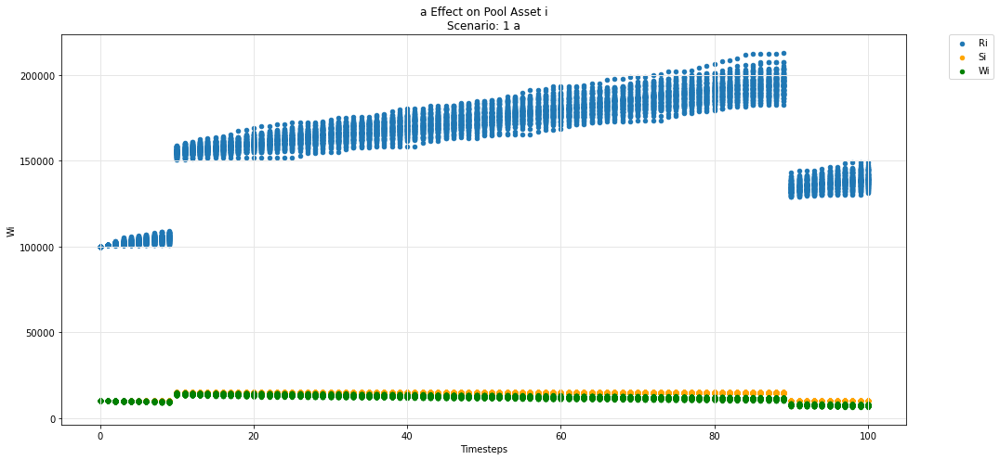

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

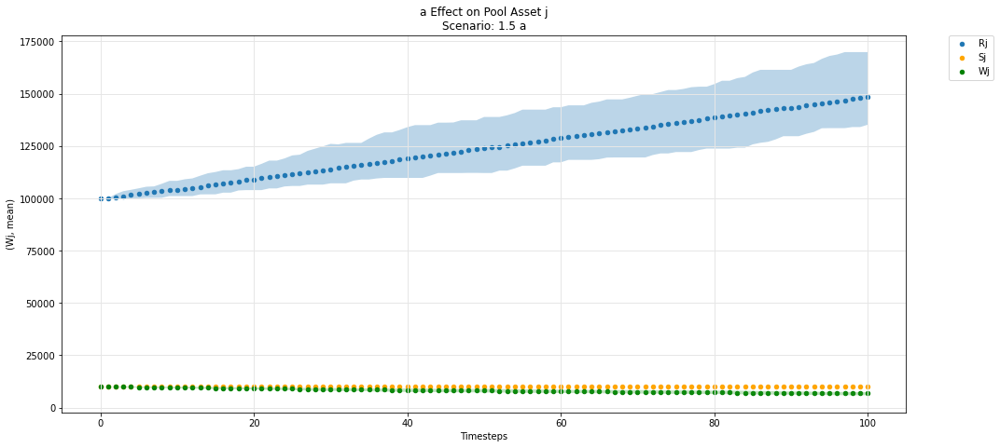

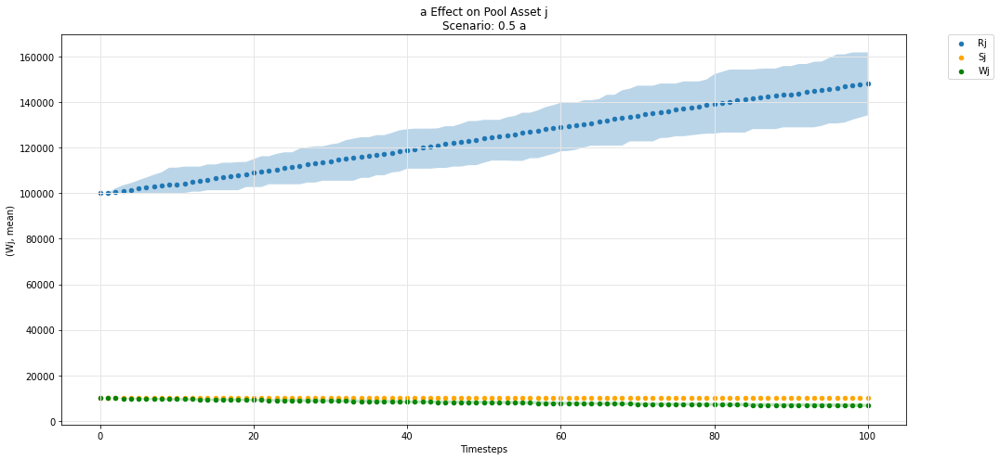

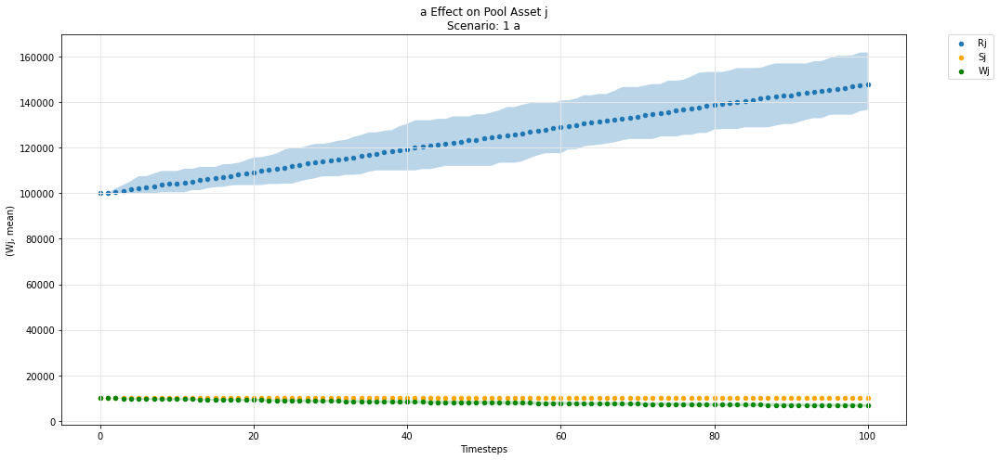

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

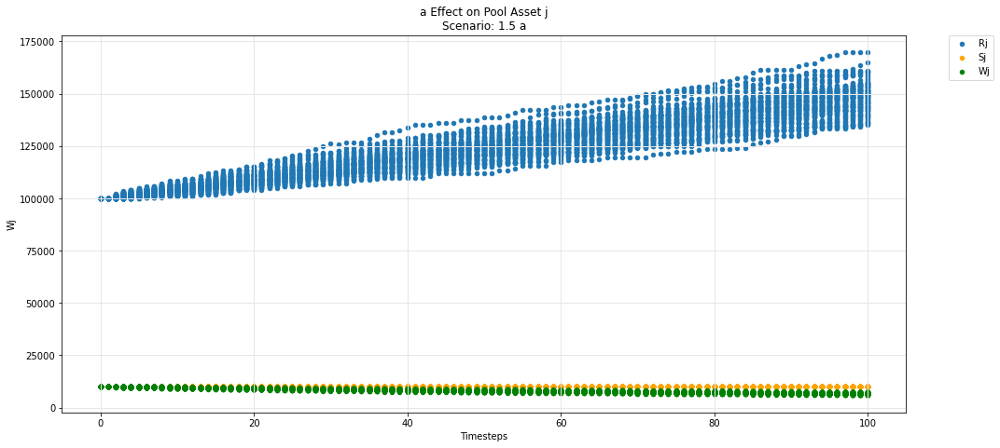

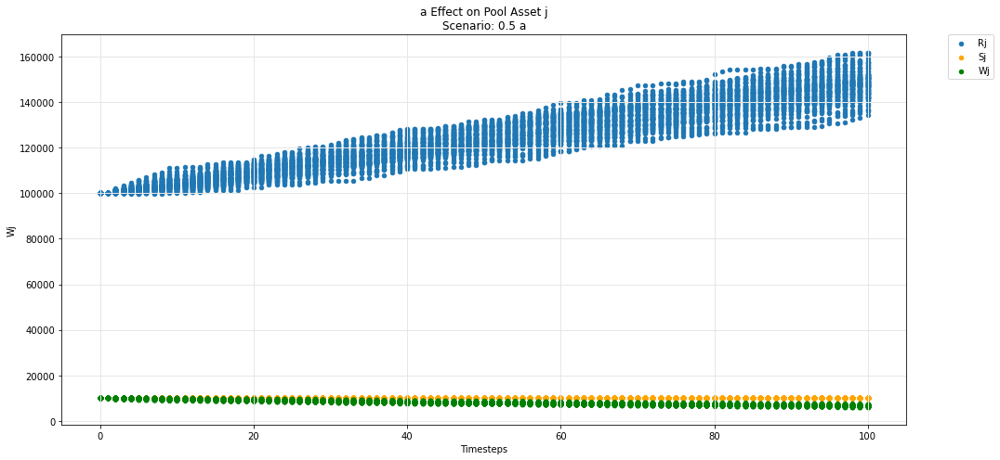

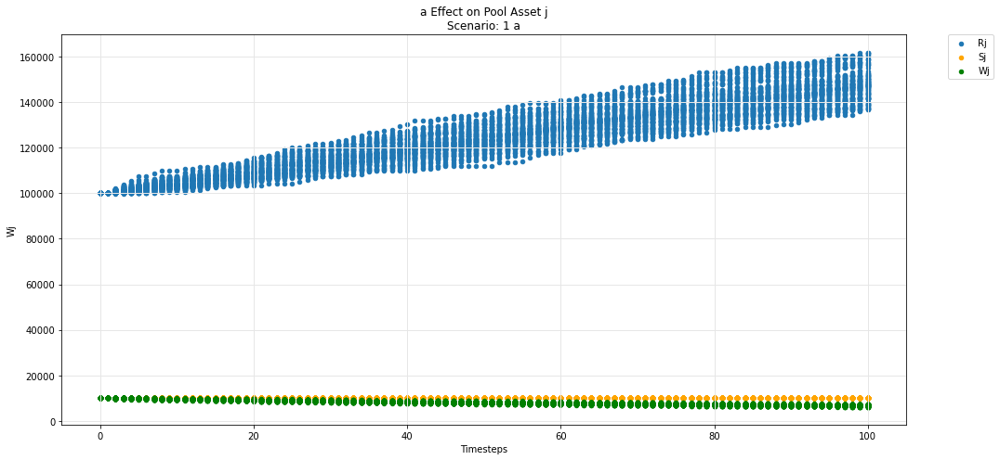

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

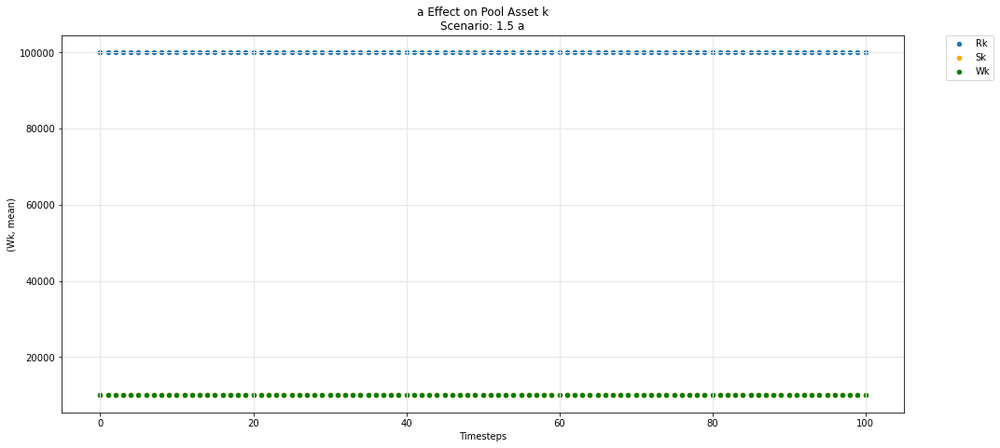

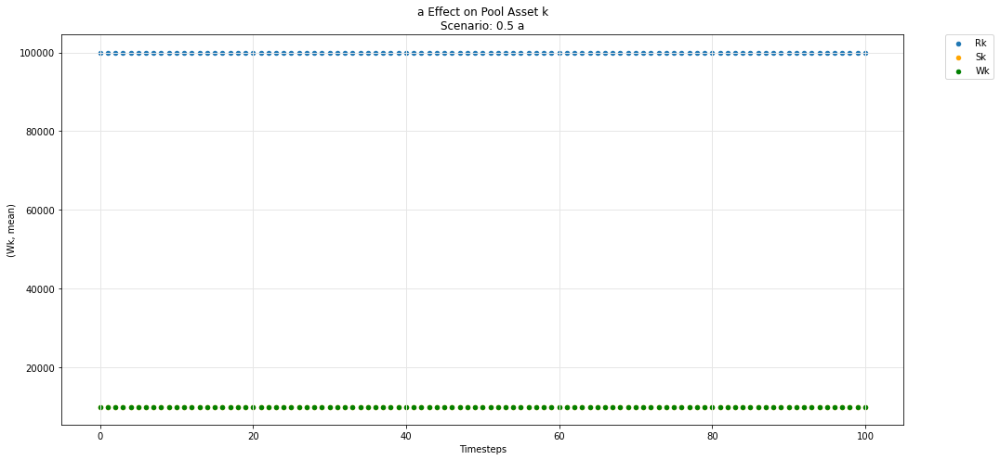

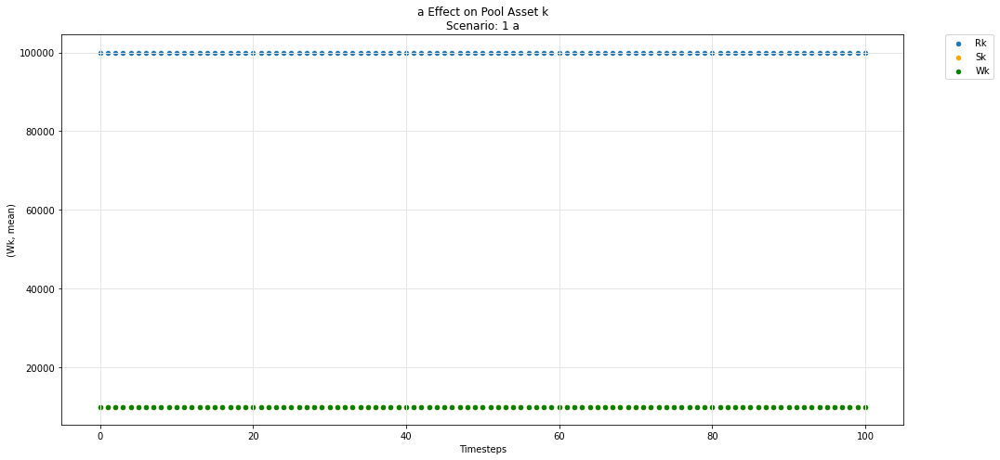

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

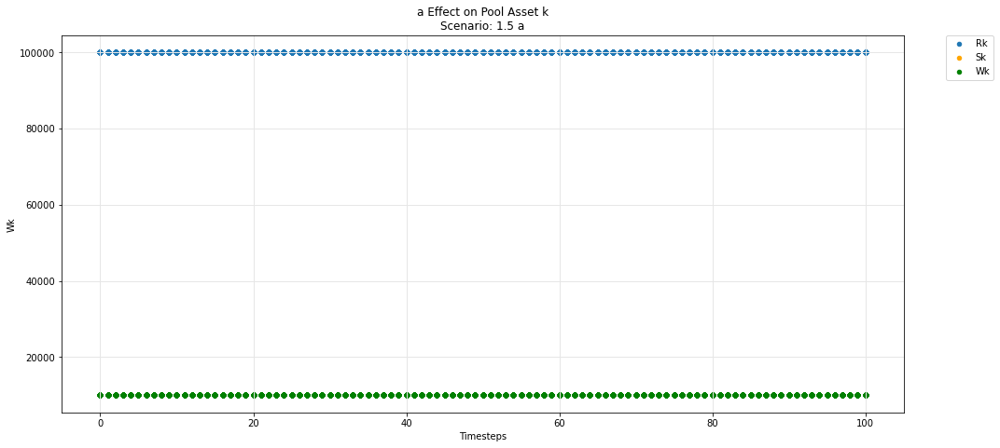

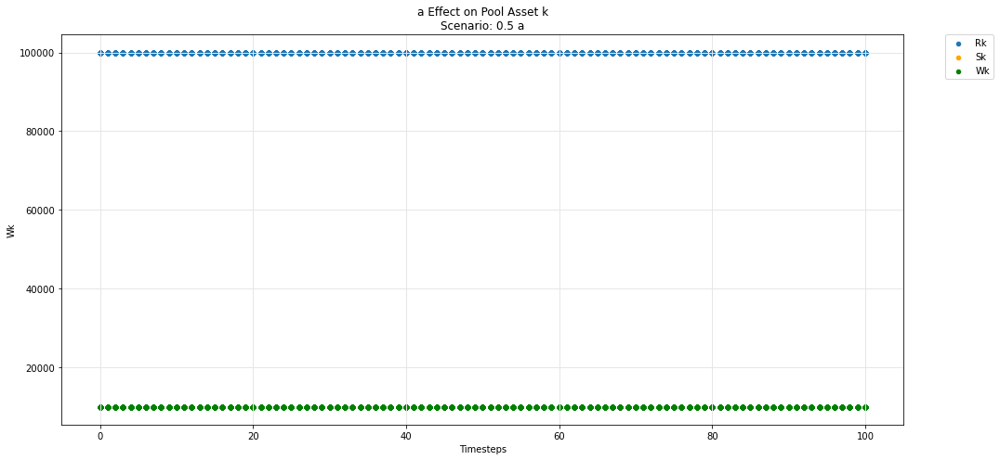

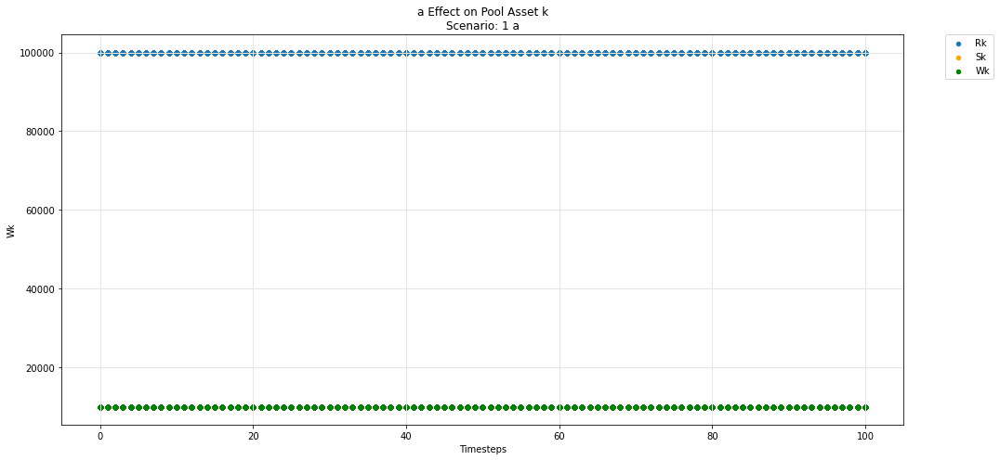

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

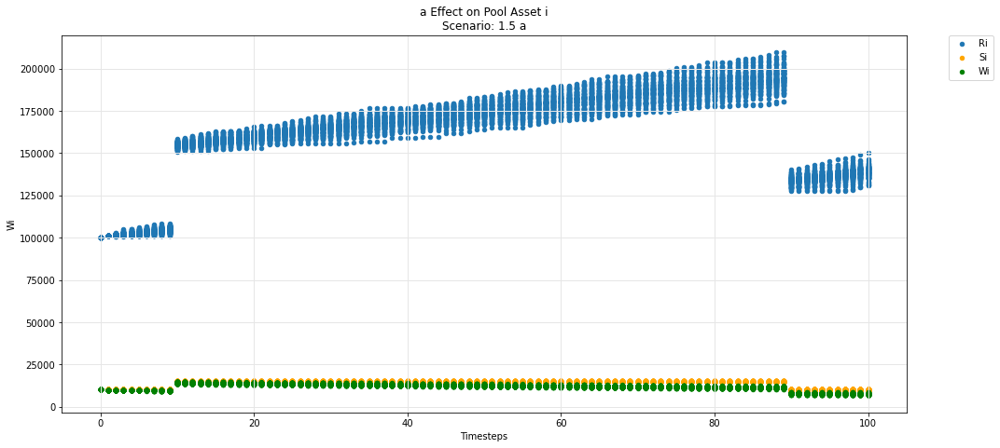

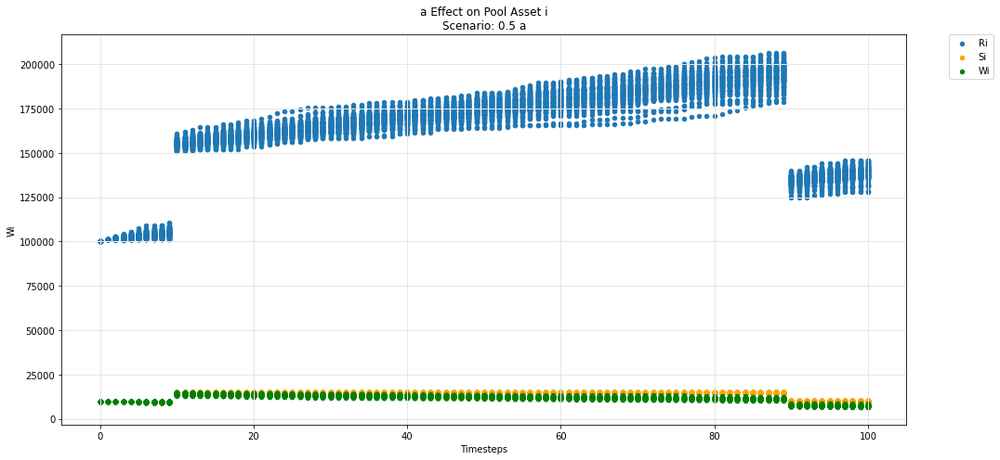

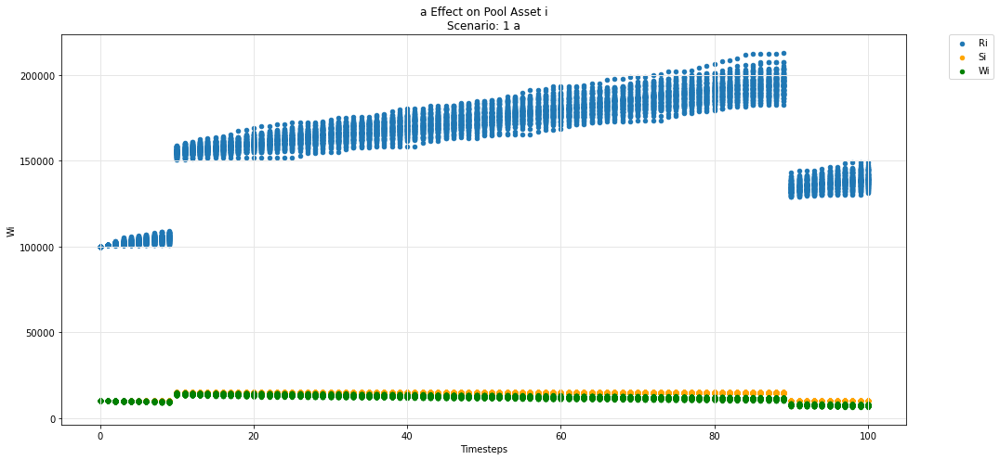

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

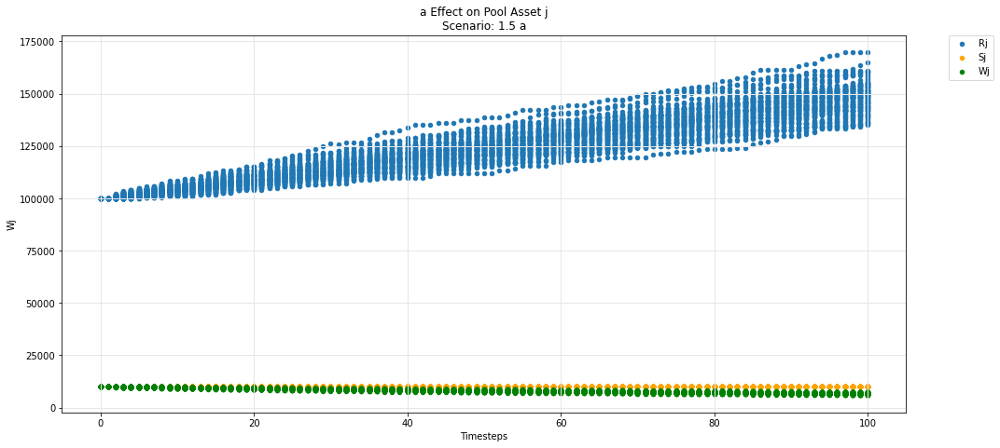

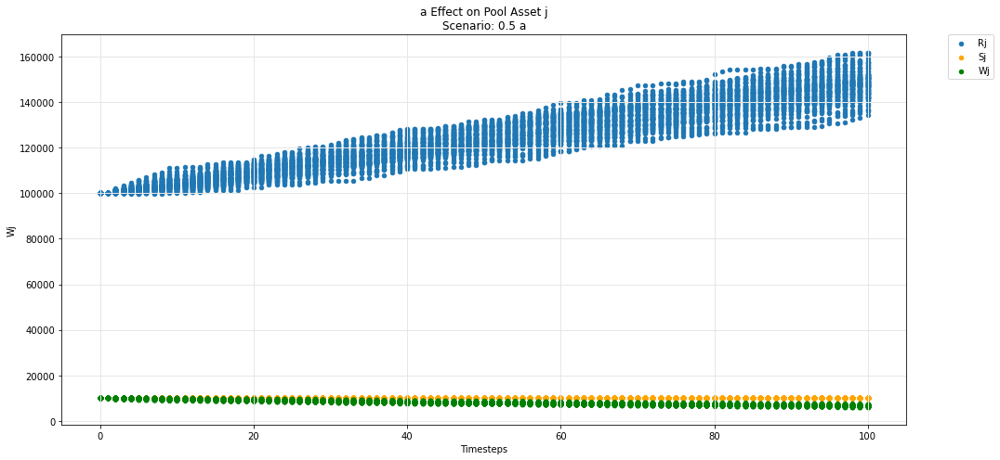

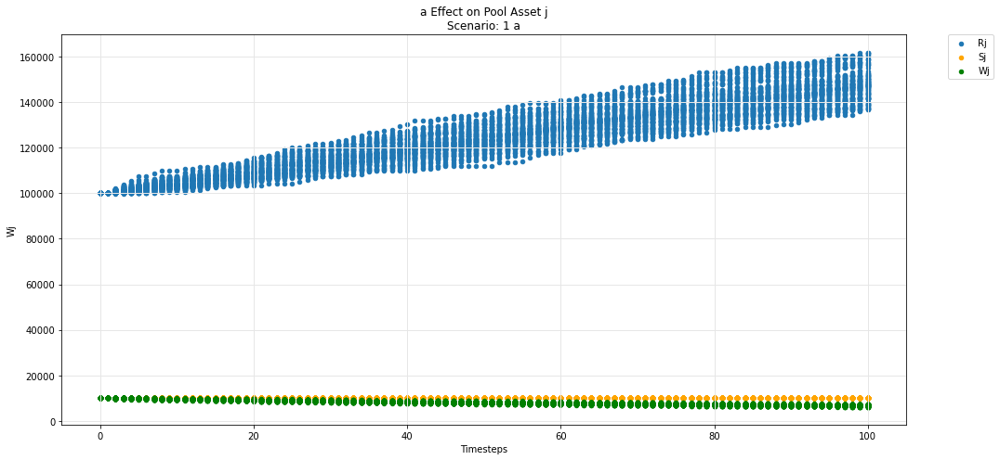

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

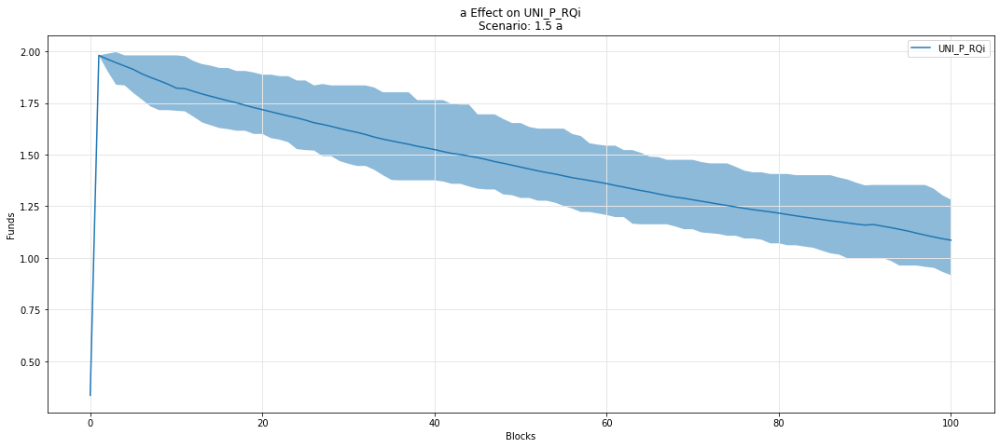

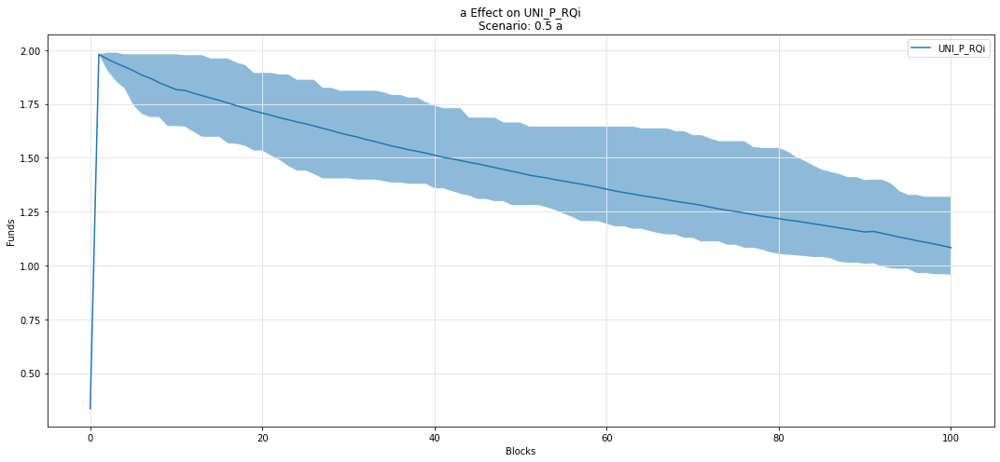

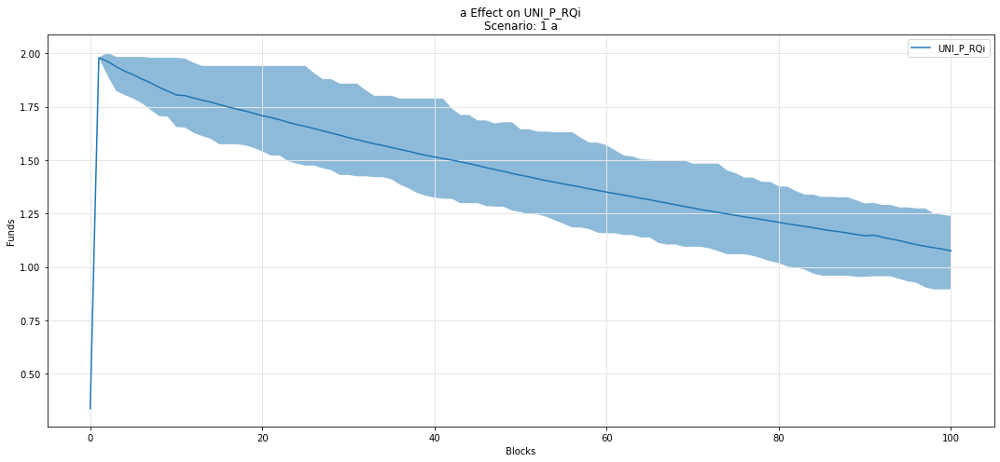

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

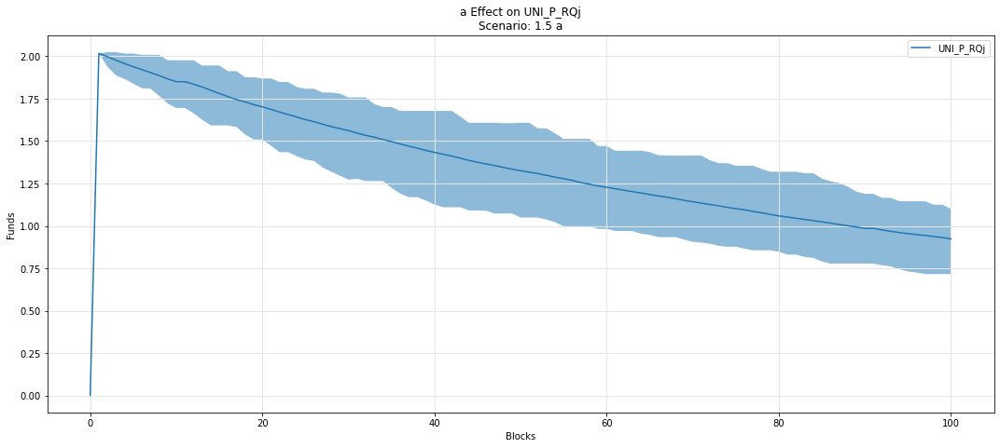

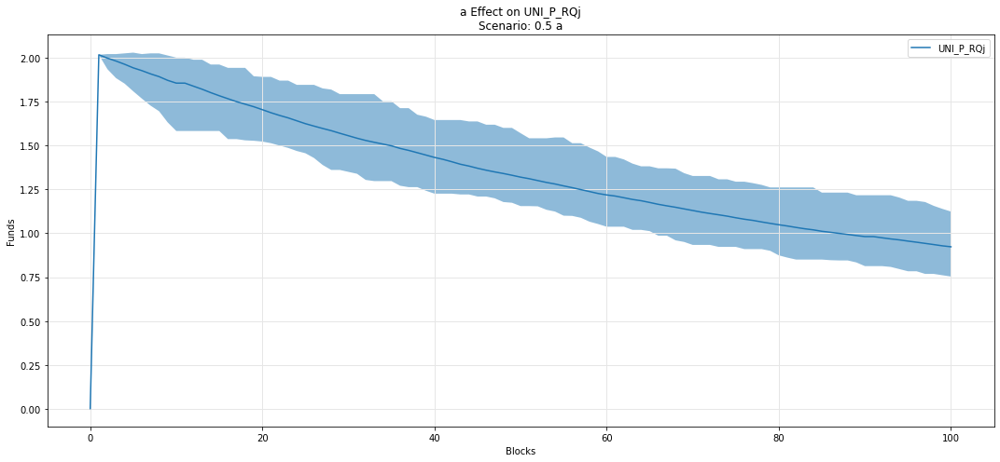

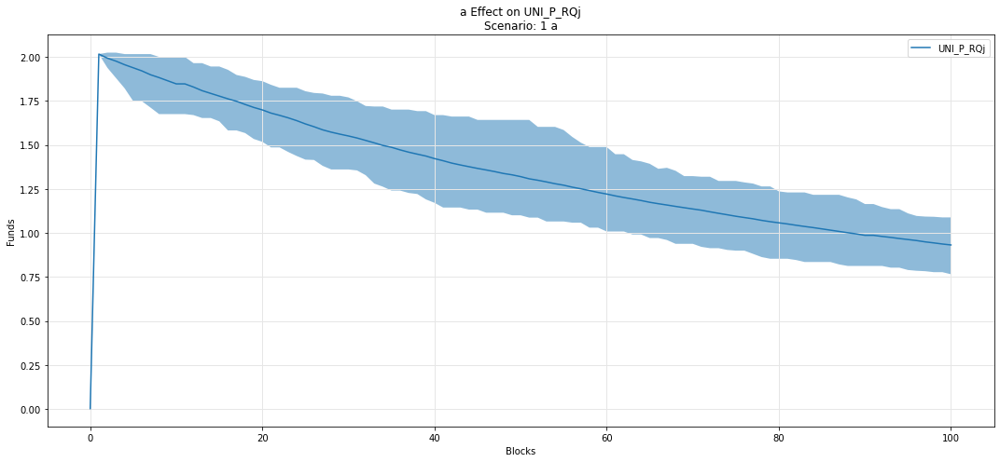

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

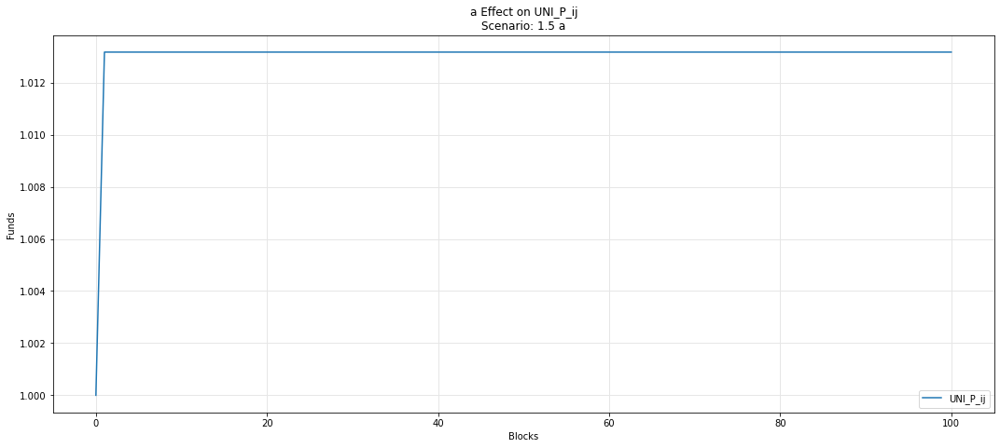

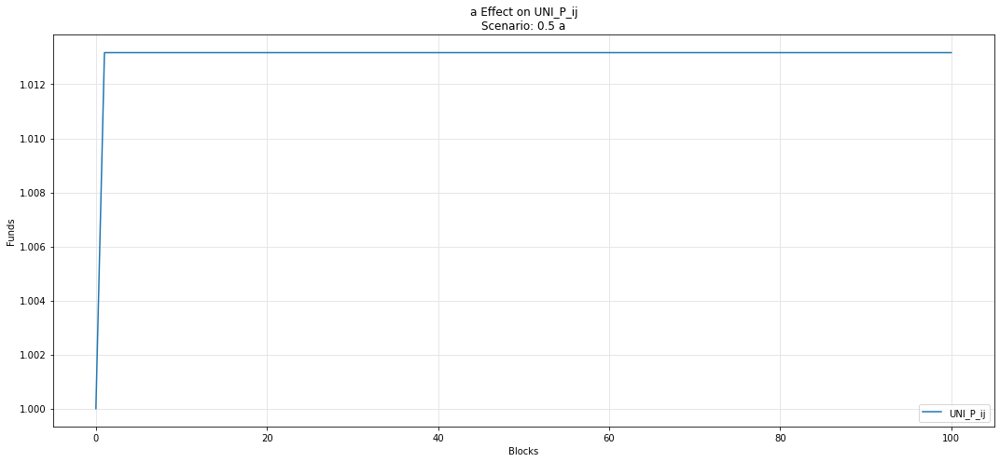

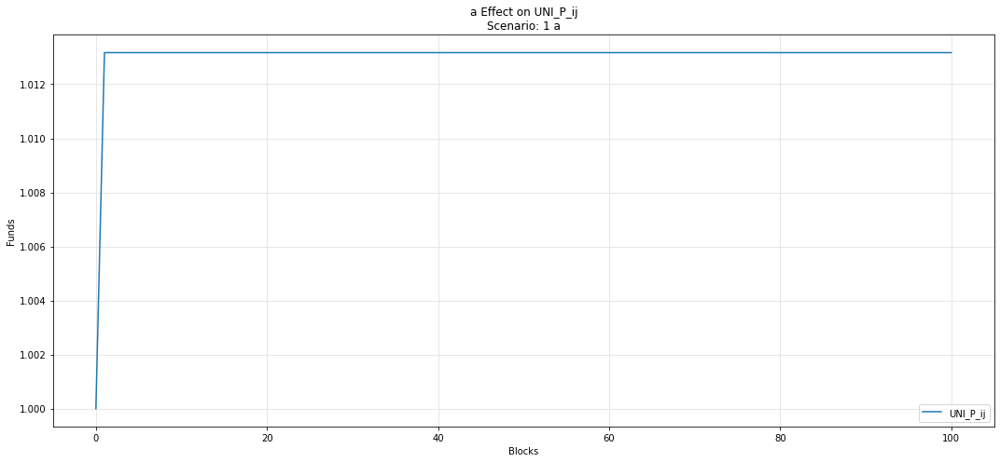

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

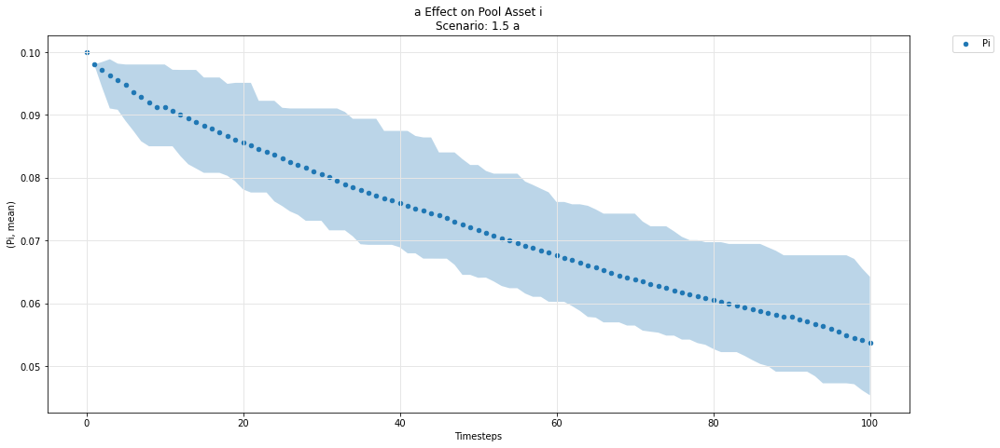

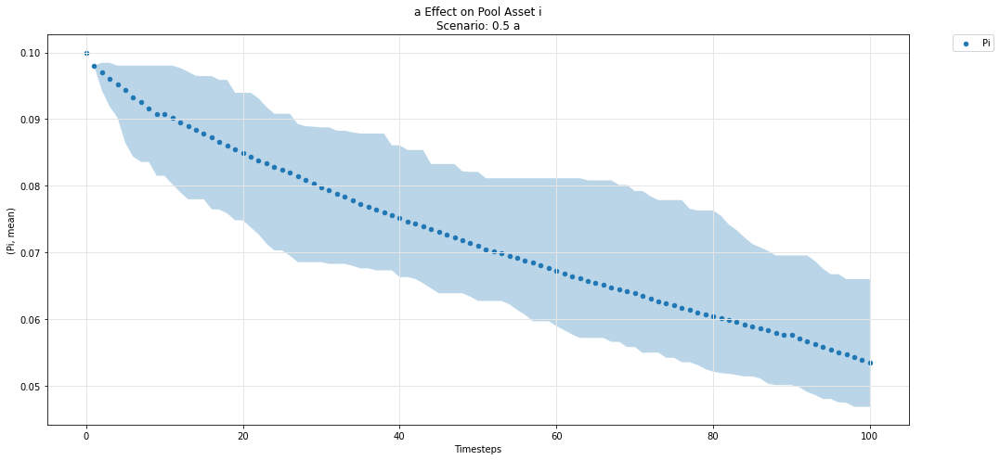

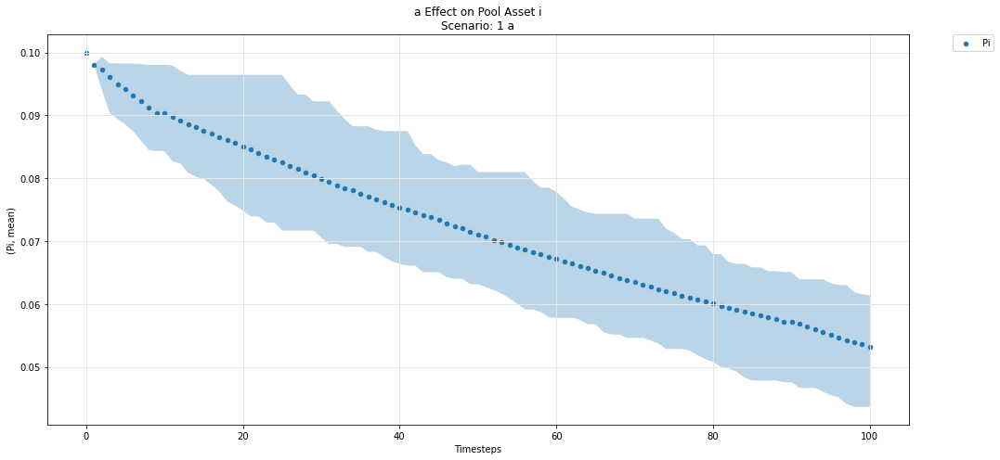

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

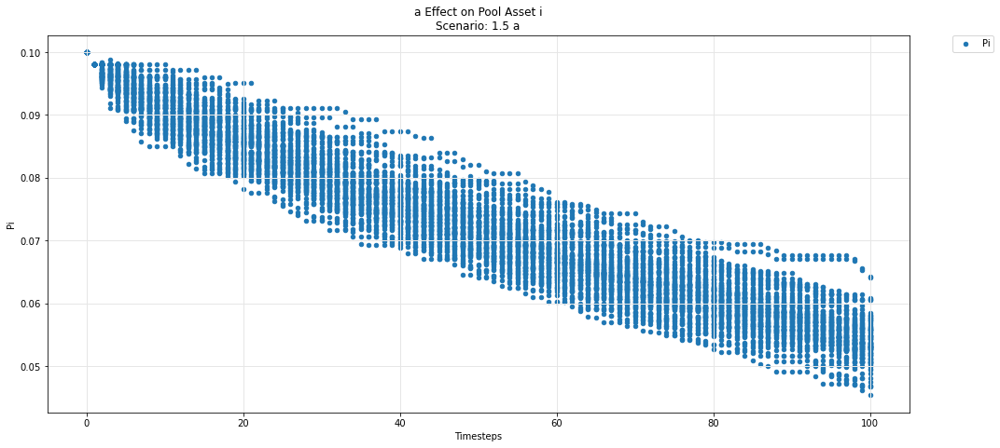

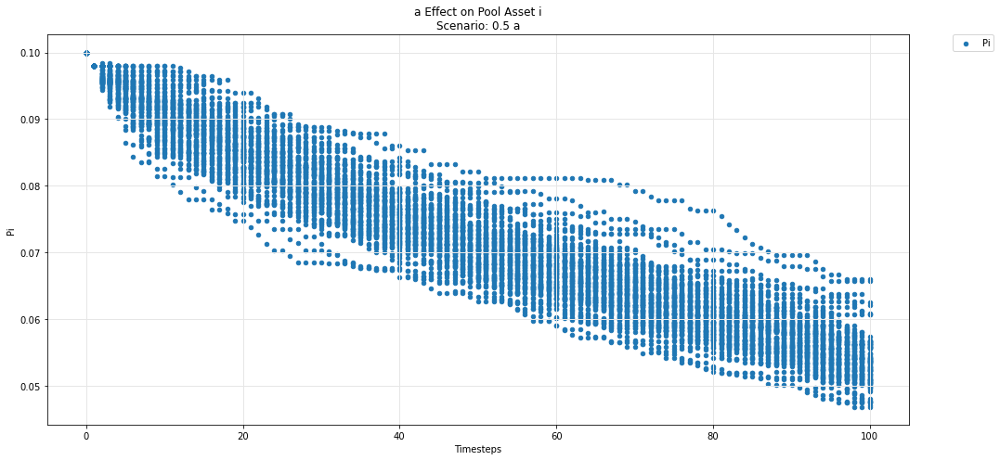

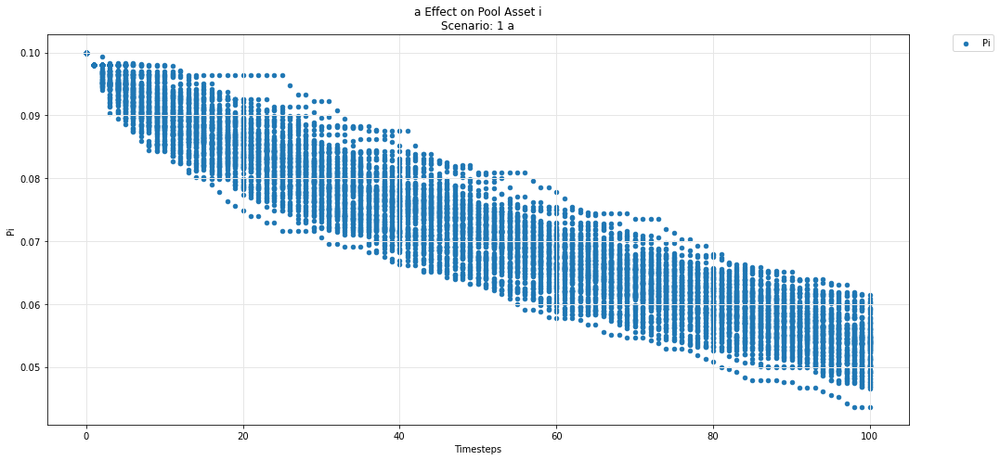

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

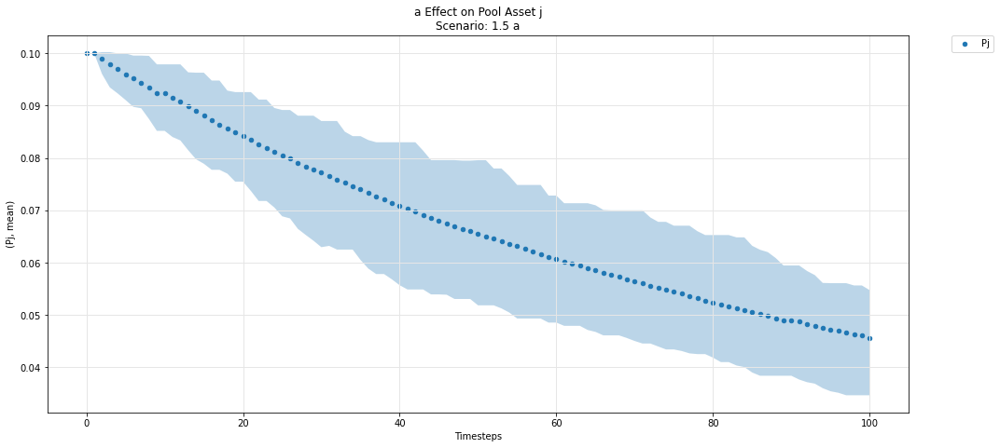

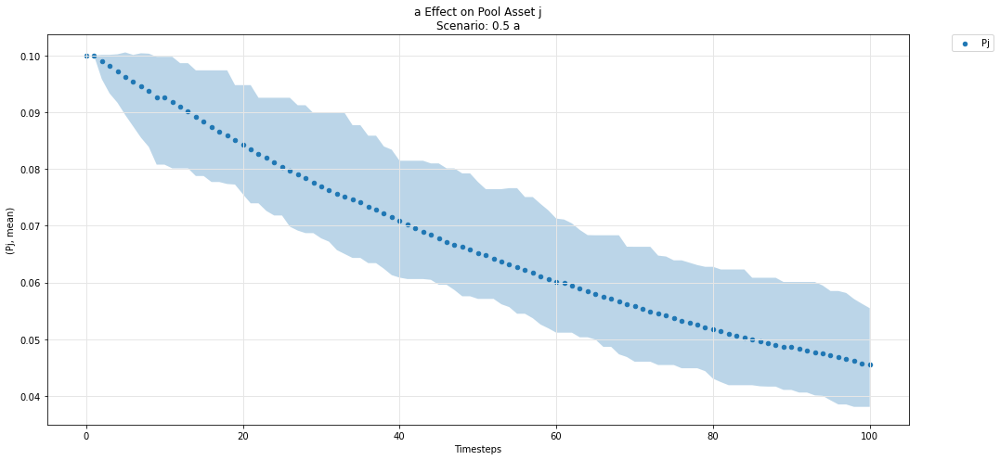

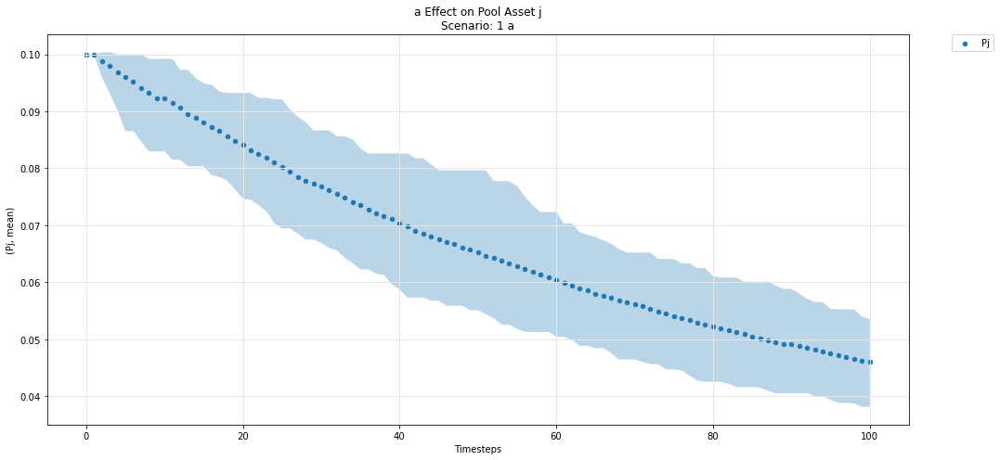

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

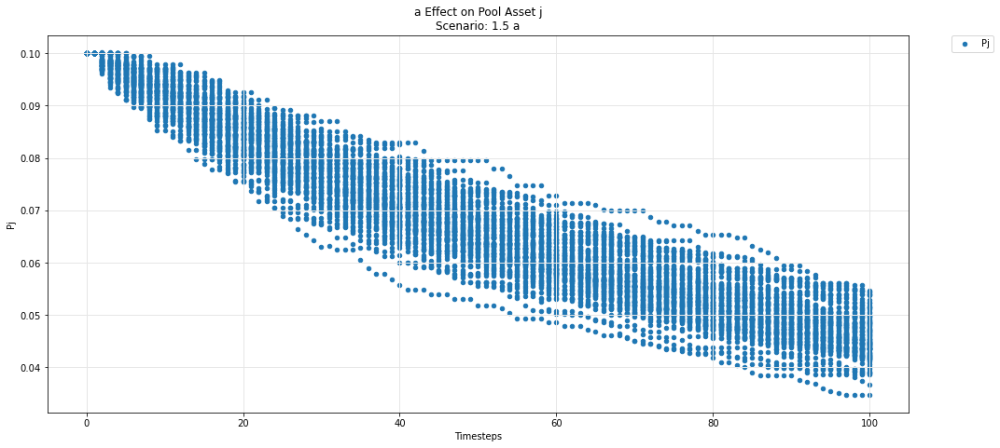

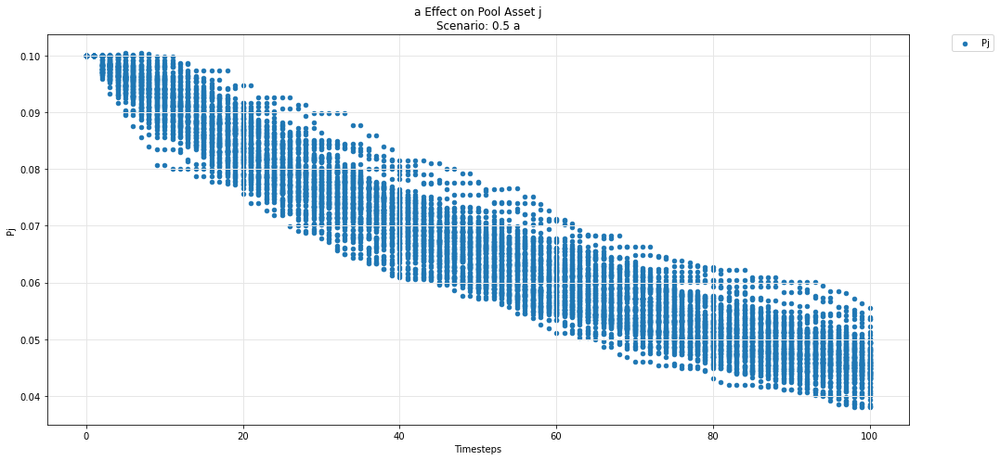

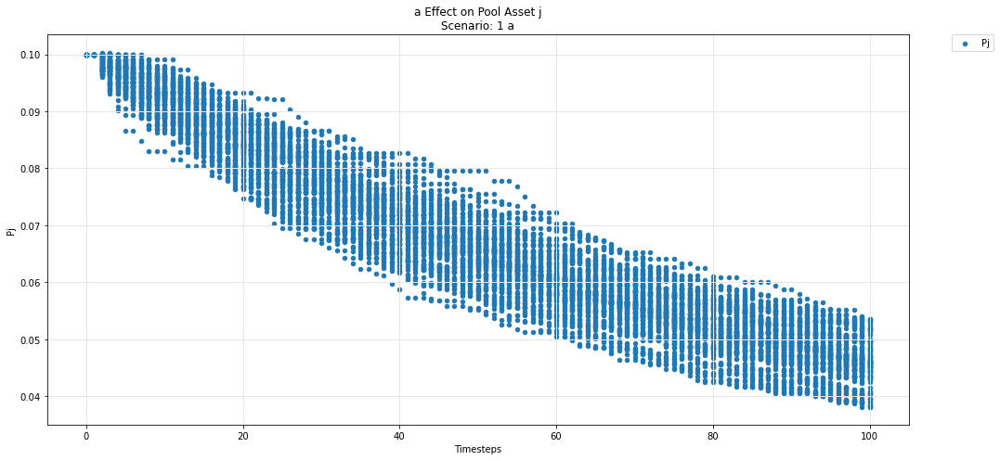

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

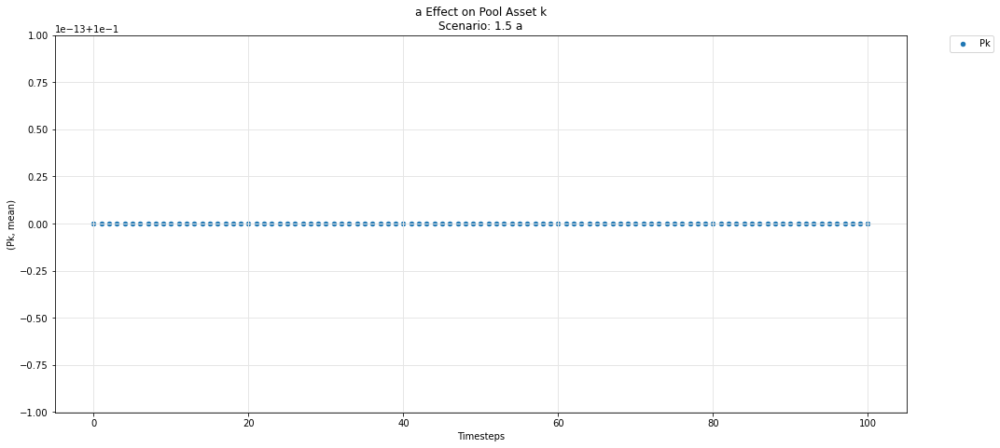

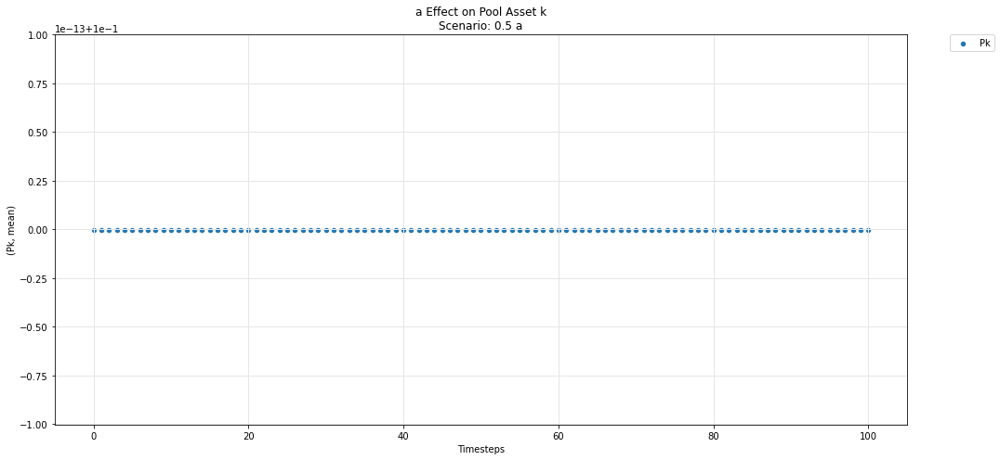

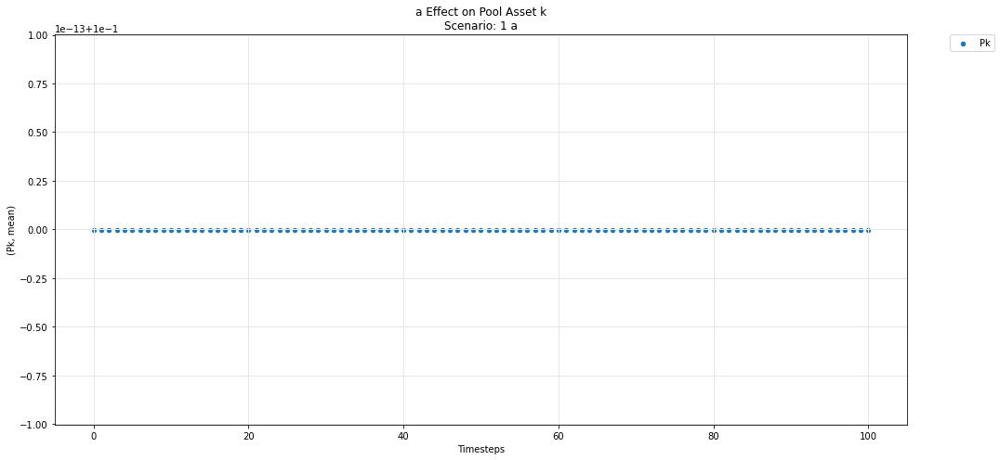

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

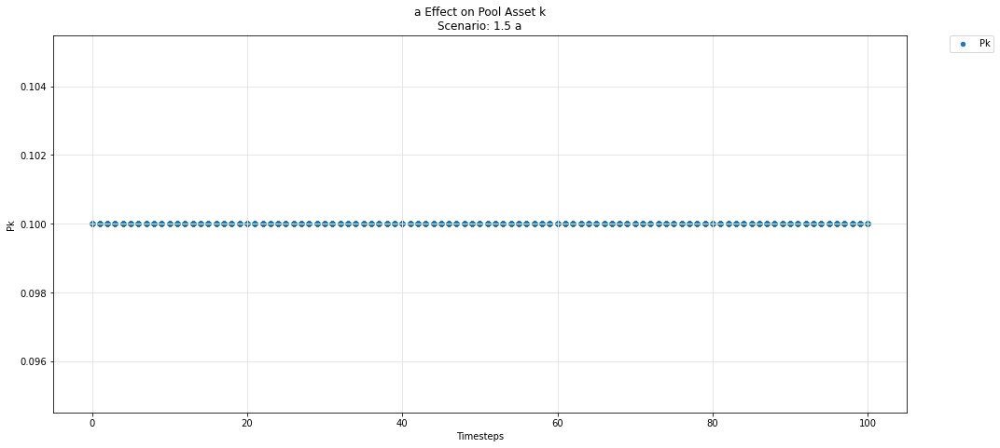

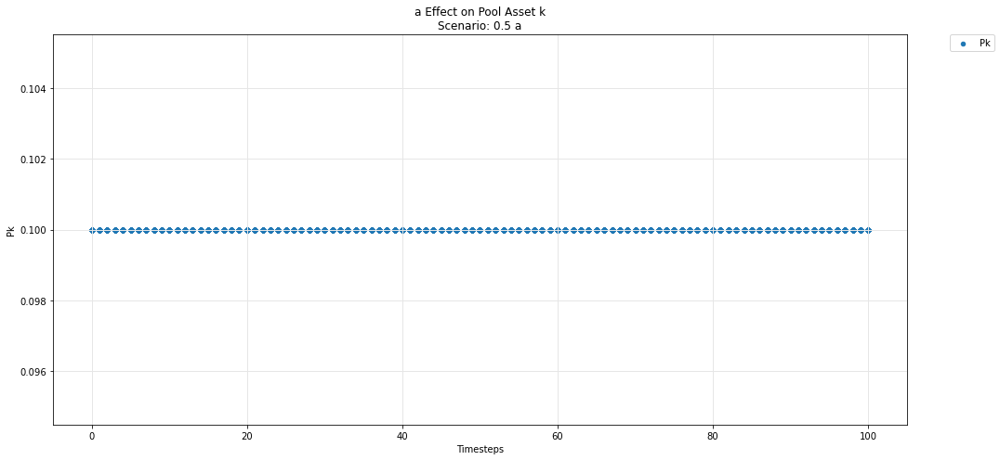

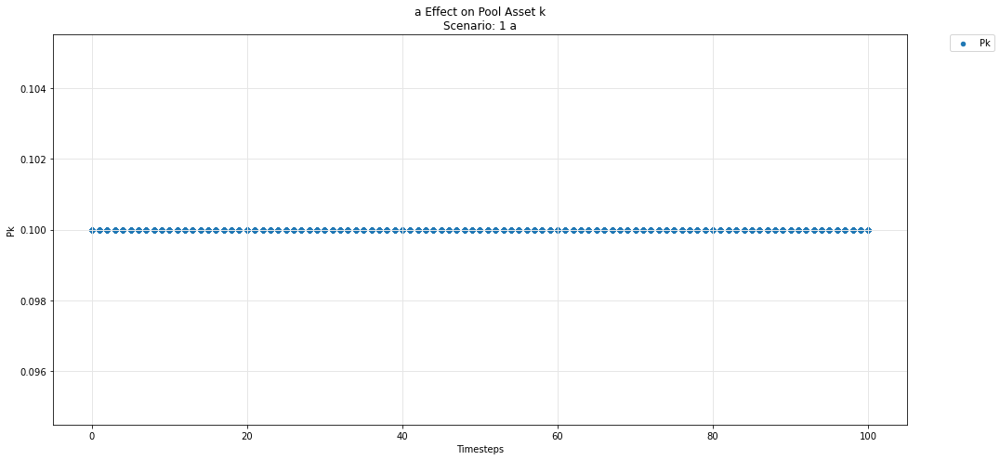

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')